In [1]:
import numpy as np
import pandas as pd
import os
import re
from sklearn.base import clone
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import StratifiedKFold, ShuffleSplit
from scipy.optimize import minimize
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
import polars as pl
import polars.selectors as cs
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter
import seaborn as sns

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim

from colorama import Fore, Style
from IPython.display import clear_output
import warnings
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import VotingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from pytorch_tabnet.tab_model import TabNetRegressor

import optuna
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank
from optuna.visualization import plot_slice
from optuna.visualization import plot_timeline

import gc
gc.enable()
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)

pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_fmt_str_lengths(10000)

polars.config.Config

# Preprocessing & Feature Engineering

In [2]:
#from IPython.display import display as ipydisplay, HTML
#ipydisplay(HTML("<style>.jp-CodeCell.jp-mod-outputsScrolled .jp-Cell-outputArea { max-height: 80em; }</style>"))

In [3]:
SEED = 42
n_splits = 5

In [4]:
path = "I:/Kaggle/child-mind-institute-problematic-internet-use/"

In [5]:
train = pd.read_csv(path + 'train.csv', dtype={'id': str})
test = pd.read_csv(path + 'test.csv', dtype={'id': str})
#sample = pd.read_csv(path + 'sample_submission.csv', dtype={'id': str})

In [6]:
data_dict = pd.read_csv(path + 'data_dictionary.csv')

In [7]:
train_target = train[test.columns]

In [8]:
concat_df = pd.concat([train_target, test], ignore_index=True)

In [9]:
concat_df['total_num_nan'] = concat_df.isna().sum(axis=1)

In [10]:
del train_target
gc.collect()

0

In [11]:
nan_df = concat_df[concat_df['total_num_nan'] == concat_df['total_num_nan'].max()]

In [12]:
for col in concat_df.columns:
    if col == 'id':
        continue
    new_col_name = col + '_isnan'
    concat_df[new_col_name] = concat_df[col].isna().astype(int)

In [13]:
instruments = data_dict['Instrument'].unique().tolist()
instruments.remove('Identifier')

In [14]:
for instrument in instruments:
    if 'Parent-Child Internet Addiction Test' == instrument:
        continue
    instrument_df = data_dict[data_dict['Instrument'] == instrument]
    field_list = instrument_df['Field'].unique().tolist()
    concat_df[instrument + '_num_nan'] = concat_df[field_list].isna().sum(axis=1)

del instrument_df, field_list
gc.collect()

0

In [15]:
train_parquet_id_folders_list = os.listdir(path + 'series_train.parquet/')

In [16]:
train_parquet_id_list = [v.replace('id=', '') for v in train_parquet_id_folders_list]

In [17]:
test_parquet_id_folders_list = os.listdir(path + 'series_test.parquet/')

In [18]:
test_parquet_id_list = [v.replace('id=', '') for v in test_parquet_id_folders_list]

In [19]:
train_temp_df = concat_df.head(train.shape[0]).reset_index(drop=True)

In [20]:
test_temp_df = concat_df.tail(test.shape[0]).reset_index(drop=True)

In [21]:
del concat_df
gc.collect()

0

In [22]:
train_temp_df['has_parquet'] = train_temp_df['id'].isin(train_parquet_id_list).astype(int)

In [23]:
test_temp_df['has_parquet'] = test_temp_df['id'].isin(test_parquet_id_list).astype(int)

In [24]:
# https://www.kaggle.com/code/antoninadolgorukova/cmi-piu-actigraphy-data-eda
entropy = lambda x: -(x / x.sum() * np.log(x / x.sum() + 1e-9)).sum()

In [25]:
def feat_engi(df, target_cols):
    stats_df = df[target_cols].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99]).T
    count = stats_df['count'][0]
    stats_df.drop('count', axis=1, inplace=True)
    
    column_names_list = []
    for idx in stats_df.index:
        for col in stats_df.columns:
            column_names_list.append(str(idx) + '_' + str(col))

    reshaped_df = pd.DataFrame(stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    reshaped_df['count'] = count

    return reshaped_df

In [26]:
def groupby_feat_engi(df, col_to_group, target_col):
    stats_df = pd.DataFrame(
        df.groupby(col_to_group)[target_col].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    )

    stats_df['sum'] = df.groupby(col_to_group)[target_col].sum()
    stats_df['entropy'] = df.groupby(col_to_group)[target_col].apply(entropy)
    
    column_names_list = []
    for idx in stats_df.index:
        for col in stats_df.columns:
            column_names_list.append(target_col + '_' + col_to_group + '_' + str(idx) + '_' + str(col))

    reshaped_df = pd.DataFrame(stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    return reshaped_df

In [27]:
def uncommon_groupby_feat_engi(df, col_to_group, target_col):
    stats_df = pd.DataFrame(
        df.groupby(col_to_group)[target_col].describe()
        #df.groupby(col_to_group)[target_col].describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    )

    stats_df['sum'] = df.groupby(col_to_group)[target_col].sum()
    stats_df['entropy'] = df.groupby(col_to_group)[target_col].apply(entropy)

    
    #stats_stats_df = stats_df.describe(percentiles=[0.01, 0.03] + [(i+1)*0.05 for i in range(19)] + [0.97, 0.99])
    stats_stats_df = stats_df.describe()
    stats_stats_count = stats_stats_df['count'][0]
    stats_stats_df.drop('count', axis=0, inplace=True)
    stats_stats_df = stats_stats_df.T
    
    column_names_list = []
    for idx in stats_stats_df.index:
        for col in stats_stats_df.columns:
            column_names_list.append(target_col + '_' + col_to_group + '_' + str(idx) + '_' + str(col))
    
    reshaped_df = pd.DataFrame(stats_stats_df.values.reshape(-1)).T.reset_index(drop=True)
    reshaped_df.columns = column_names_list

    current_cols = reshaped_df.columns.tolist()
    count_col_name = target_col + '_' + col_to_group + '_count'
    reshaped_df[count_col_name] = stats_stats_count

    reshaped_df = reshaped_df[[count_col_name] + current_cols]

    return reshaped_df

In [28]:
def read_parquet(dataset='train'):
    parquet_id_folders_list = os.listdir(path + 'series_' + dataset + '.parquet/')
    ts_list = []
    ts_features_list = []
    for id_folder in tqdm(parquet_id_folders_list):
        iid = id_folder.replace('id=', '')
    
        parquet_files_path = path + 'series_' + dataset + '.parquet/' + id_folder + '/'
        parquet_files_list = os.listdir(parquet_files_path)
    
        dfs_list = []
        for parquet_filename in parquet_files_list:
            if '.parquet' in parquet_filename:
                parquet_df = pd.read_parquet(parquet_files_path + parquet_filename)
                dfs_list.append(parquet_df)
        parquet_concat_df = pd.concat(dfs_list, ignore_index=True)
        current_cols = parquet_concat_df.columns.tolist()
        
        parquet_concat_df['id'] = iid
        
        parquet_concat_df = parquet_concat_df[['id'] + current_cols]
        
        parquet_concat_df['day_since_wear'] = (parquet_concat_df['relative_date_PCIAT'] - parquet_concat_df['relative_date_PCIAT'].min()).astype(int)
        parquet_concat_df['time_of_day_sec'] = parquet_concat_df['time_of_day'] / 1e9
        parquet_concat_df.drop('time_of_day', axis=1, inplace=True)
        parquet_concat_df['time_of_day_min'] = parquet_concat_df['time_of_day_sec'] / 60
        parquet_concat_df['time_of_day_hour'] = parquet_concat_df['time_of_day_min'] / 60
        parquet_concat_df['time_of_day_day'] = parquet_concat_df['time_of_day_hour'] / 24
        parquet_concat_df['time_of_day_hour_window'] = parquet_concat_df['time_of_day_hour'].astype(int)
        parquet_concat_df['time_of_day_min_window'] = parquet_concat_df['time_of_day_min'].astype(int)
        parquet_concat_df['time_of_day_15_min_window'] = (parquet_concat_df['time_of_day_min'] / 15).astype(int)
        parquet_concat_df['timestamp_day'] = parquet_concat_df['day_since_wear'] + parquet_concat_df['time_of_day_day']
    
        if parquet_concat_df['timestamp_day'].nunique() != parquet_concat_df.shape[0]:
            print('yes')
    
        parquet_concat_df['timestamp_hour'] = parquet_concat_df['timestamp_day'] * 24
        parquet_concat_df['timestamp_min'] = parquet_concat_df['timestamp_day'] * 24 * 60
        parquet_concat_df['timestamp_sec'] = parquet_concat_df['timestamp_day'] * 24 * 60 * 60
        parquet_concat_df['timestamp_15_min'] = parquet_concat_df['timestamp_day'] * 24 * (60/15)
    
        parquet_concat_df['timestamp_hour_window'] = parquet_concat_df['timestamp_hour'].astype(int)
        parquet_concat_df['timestamp_min_window'] = parquet_concat_df['timestamp_min'].astype(int)
        parquet_concat_df['timestamp_15_min_window'] = parquet_concat_df['timestamp_15_min'].astype(int)
    
        battery_voltage_start = parquet_concat_df['battery_voltage'][0]
        parquet_concat_df['battery_use_since_wear'] = -(parquet_concat_df['battery_voltage'] - battery_voltage_start)
        
    
        worn_df = parquet_concat_df[parquet_concat_df['non-wear_flag'] == 0].reset_index(drop=True)
    
        
        feature_cols = ['X', 'Y', 'Z', 'enmo', 'anglez', 'light', 'battery_use_since_wear']
    
        features_df = feat_engi(worn_df, feature_cols)
    
        groupby_cols = ['weekday', 'time_of_day_hour_window']#, 'time_of_day_15_min_window']
    
        groupby_df_list = []
        for groupby_col in groupby_cols:
            for feature_col in feature_cols:
                groupby_features_df = groupby_feat_engi(worn_df, groupby_col, feature_col)
                groupby_df_list.append(groupby_features_df)
    
        groupby_concat_df = pd.concat(groupby_df_list, axis=1)
    
        uncommon_groupby_cols = ['day_since_wear', 'timestamp_hour_window']#, 'timestamp_15_min_window']#, 'timestamp_min_window']
    
        uncommon_groupby_df_list = []
        for uncommon_groupby_col in uncommon_groupby_cols:
            for unc_feature_col in feature_cols:
                uncommon_groupby_df = uncommon_groupby_feat_engi(worn_df, uncommon_groupby_col, unc_feature_col)
                uncommon_groupby_df_list.append(uncommon_groupby_df)
    
        features_concat_df = pd.concat([features_df, groupby_concat_df, uncommon_groupby_df], axis=1)
        features_current_cols = features_concat_df.columns.tolist()
        features_concat_df['id'] = iid
        features_concat_df = features_concat_df[['id'] + features_current_cols]
    
        for q in [1,2,3,4]:
            if q in worn_df['quarter'].tolist():
                features_concat_df['data_collected_in_quarter_' + str(q)] = 1
            else:
                features_concat_df['data_collected_in_quarter_' + str(q)] = 0

        features_concat_df['id'] = features_concat_df['id'].astype(str)

        #features_concat_df.to_csv(path + 'series_' + dataset + '.parquet/id=' + iid + '/features.csv', index=False)
        
        ts_list.append(parquet_concat_df)
        ts_features_list.append(features_concat_df)

        gc.collect()
    gc.collect()
    
    return ts_list, ts_features_list

In [29]:
def read_features_files():
    temp_dfs_list = []
    ts_features_folders_list = os.listdir(path + 'train_ts_features/')
    for temp_id_folder in tqdm(ts_features_folders_list):
        temp_files_list = os.listdir(path + 'train_ts_features/' + temp_id_folder + '/')
        for temp_filename in temp_files_list:
            if '.csv' in temp_filename:
                temp_df = pd.read_csv(path + 'train_ts_features/' + temp_id_folder + '/' + temp_filename, dtype={'id': str})
                temp_dfs_list.append(temp_df)
    gc.collect()
    return temp_dfs_list

In [30]:
train_ts_features_list = read_features_files()

100%|████████████████████████████████████████████████████████████████████████████████| 996/996 [04:50<00:00,  3.43it/s]


In [31]:
test_ts_list, test_ts_features_list = read_parquet(dataset='test')

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.41s/it]


In [32]:
train_ts_features_concat_df = pd.concat(train_ts_features_list, ignore_index=True)
test_ts_features_concat_df = pd.concat(test_ts_features_list, ignore_index=True)

In [33]:
del train_ts_features_list, test_ts_features_list
gc.collect()

0

In [34]:
train_merge_df = train_temp_df.merge(train_ts_features_concat_df, how='left', on='id')
test_merge_df = test_temp_df.merge(test_ts_features_concat_df, how='left', on='id')

In [35]:
del train_ts_features_concat_df, test_ts_features_concat_df
gc.collect()

0

In [36]:
cat_cols = []
for i in range(data_dict.shape[0]):
    col = data_dict['Field'][i]
    if col == 'id':
        continue
    if (data_dict['Type'][i] == 'str') | ('categori' in data_dict['Type'][i]):
        cat_cols.append(col)

In [37]:
ordinal_variables = ['FGC-FGC_CU_Zone', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU_Zone',
                     'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL_Zone', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_Frame_num',
                     'PreInt_EduHx-computerinternet_hoursday']

ordinal_variables += [col for col in cat_cols if (('PCIAT' in col)&('Season' not in col))]

In [38]:
cat_cols = list(set(cat_cols) - set(ordinal_variables))
cat_cols = [col for col in cat_cols if 'PCIAT' not in col]

In [39]:
merge_concat_df = pd.concat([train_merge_df, test_merge_df], ignore_index=True)

In [40]:
del train_merge_df, test_merge_df
gc.collect()

0

In [41]:
def remove_pciat_cols(df):
    cols_to_drop = []
    for col in df.columns:
        if 'PCIAT' in col:
            cols_to_drop.append(col)

    df.drop(cols_to_drop, axis=1, inplace=True)
    
    return df

In [42]:
merge_concat_df = remove_pciat_cols(merge_concat_df)

In [43]:
def one_hot_cat_cols(df):
    for col in tqdm(cat_cols):
        df[col] = df[col].fillna('Missing').apply(str)
        unique_list = sorted(df[col].unique().tolist())

        for v in unique_list:
            new_col_name = col + '_' + v
            df[new_col_name] = (df[col] == v).astype(int)
    
    df = df.drop(cat_cols, axis=1)

    return df

In [44]:
merge_concat_df = one_hot_cat_cols(merge_concat_df)

100%|█████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 296.81it/s]


In [45]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
def feature_engineering(df):
    df['BMI_Age'] = df['Physical-BMI'] * df['Basic_Demos-Age']
    df['Internet_Hours_Age'] = df['PreInt_EduHx-computerinternet_hoursday'] * df['Basic_Demos-Age']
    df['BMI_Internet_Hours'] = df['Physical-BMI'] * df['PreInt_EduHx-computerinternet_hoursday']
    df['BFP_BMI'] = df['BIA-BIA_Fat'] / df['BIA-BIA_BMI']
    df['FFMI_BFP'] = df['BIA-BIA_FFMI'] / df['BIA-BIA_Fat']
    df['FMI_BFP'] = df['BIA-BIA_FMI'] / df['BIA-BIA_Fat']
    df['LST_TBW'] = df['BIA-BIA_LST'] / df['BIA-BIA_TBW']
    df['BFP_BMR'] = df['BIA-BIA_Fat'] * df['BIA-BIA_BMR']
    df['BFP_DEE'] = df['BIA-BIA_Fat'] * df['BIA-BIA_DEE']
    df['BMR_Weight'] = df['BIA-BIA_BMR'] / df['Physical-Weight']
    df['DEE_Weight'] = df['BIA-BIA_DEE'] / df['Physical-Weight']
    df['SMM_Height'] = df['BIA-BIA_SMM'] / df['Physical-Height']
    df['Muscle_to_Fat'] = df['BIA-BIA_SMM'] / df['BIA-BIA_FMI']
    df['Hydration_Status'] = df['BIA-BIA_TBW'] / df['Physical-Weight']
    df['ICW_TBW'] = df['BIA-BIA_ICW'] / df['BIA-BIA_TBW']
    
    return df

In [46]:
merge_concat_df = feature_engineering(merge_concat_df)

In [47]:
no_id_cols = [col for col in merge_concat_df.columns if col != 'id']

In [48]:
if np.any(np.isinf(merge_concat_df[no_id_cols])):
    print('inf in data')
    merge_concat_df[no_id_cols] = merge_concat_df[no_id_cols].replace([np.inf, -np.inf], np.nan)

inf in data


In [49]:
imputer = KNNImputer(n_neighbors=5)
merge_concat_df[no_id_cols] = imputer.fit_transform(merge_concat_df[no_id_cols])

In [50]:
del imputer
gc.collect()

0

In [51]:
train_df = merge_concat_df.head(train.shape[0]).reset_index(drop=True)
test_df = merge_concat_df.tail(test.shape[0]).reset_index(drop=True)

In [52]:
train_df['sii'] = train['sii']

In [53]:
del train, test
gc.collect()

0

In [54]:
train_nonan_df = train_df[~train_df['sii'].isna()].reset_index(drop=True)

In [55]:
del train_df
gc.collect()

0

In [56]:
#selected_features_df = pd.read_csv(path + 'selected_features.csv')

In [57]:
#train_cols = selected_features_df['selected_features'].tolist()

In [58]:
#del selected_features_df
#gc.collect()

In [59]:
#test_cols = train_cols.copy()
#test_cols.remove('sii')

In [60]:
#train_final_df = train_nonan_df[train_cols].copy()
#test_final_df = test_df[test_cols].copy()

In [61]:
train_final_df = train_nonan_df.copy()
test_final_df = test_df.copy()

In [62]:
del train_nonan_df, test_df
gc.collect()

0

In [63]:
corr_df = train_final_df.drop(['id', 'sii'], axis=1).corr()

In [64]:
# Find features with high correlation
high_corr = np.where(corr_df > 0.9)
high_corr_pairs = [
    (corr_df.index[x], corr_df.columns[y])
    for x, y in zip(*high_corr)
    if x != y and x < y
]

In [65]:
len(high_corr_pairs)

26804

In [66]:
second_v_list = []
for v in high_corr_pairs:
    second_v = v[1]
    second_v_list.append(second_v)

In [67]:
len(second_v_list)

26804

In [68]:
len(list(set(second_v_list)))

5541

In [69]:
redundant_features = list(set(second_v_list))

In [70]:
redundant_features[:10]

['anglez_time_of_day_hour_window_18_mean',
 'X_time_of_day_hour_window_23_35%',
 'anglez_time_of_day_hour_window_17_3%',
 'X_time_of_day_hour_window_9_70%',
 'X_time_of_day_hour_window_5_40%',
 'Y_time_of_day_hour_window_2_65%',
 'anglez_time_of_day_hour_window_15_55%',
 'battery_use_since_wear_time_of_day_hour_window_23_15%',
 'light_time_of_day_hour_window_16_30%',
 'light_time_of_day_hour_window_4_25%']

In [71]:
train_final_df = train_final_df.drop(redundant_features, axis=1)
print(train_final_df.shape)
train_final_df.head()

(2736, 1420)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,BIA-Season_isnan,PAQ_A-Season_isnan,PAQ_C-Season_isnan,SDS-Season_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,has_parquet,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_min,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_min,light_1%,light_10%,light_max,battery_use_since_wear_mean,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_1%,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max

In [72]:
test_final_df = test_final_df.drop(redundant_features, axis=1)
print(test_final_df.shape)
test_final_df.head()

(20, 1419)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,FGC-FGC_TL_Zone,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Basic_Demos-Enroll_Season_isnan,Basic_Demos-Age_isnan,Basic_Demos-Sex_isnan,CGAS-Season_isnan,Physical-Season_isnan,Physical-BMI_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,Fitness_Endurance-Season_isnan,Fitness_Endurance-Max_Stage_isnan,FGC-Season_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,BIA-Season_isnan,PAQ_A-Season_isnan,PAQ_C-Season_isnan,SDS-Season_isnan,PreInt_EduHx-Season_isnan,PreInt_EduHx-computerinternet_hoursday_isnan,total_num_nan_isnan,Demographics_num_nan,has_parquet,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_min,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_min,light_1%,light_10%,light_max,battery_use_since_wear_mean,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_1%,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max

# Parameter tuning, training, prediction & submission

In [73]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
def quadratic_weighted_kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic')

def threshold_Rounder(oof_non_rounded, thresholds):
    return np.where(oof_non_rounded < thresholds[0], 0,
                    np.where(oof_non_rounded < thresholds[1], 1,
                             np.where(oof_non_rounded < thresholds[2], 2, 3)))

def evaluate_predictions(thresholds, y_true, oof_non_rounded):
    rounded_p = threshold_Rounder(oof_non_rounded, thresholds)
    return -quadratic_weighted_kappa(y_true, rounded_p)

In [251]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)

def lgb_feature_selection(train_data, test_data, optuna_n_trials):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    base_params = {
        'verbosity': -1,
        'seed': SEED,
        'num_iterations': 5000,
        'feature_fraction': 0.8,
        'device': 'gpu'
    }

    def objective(trial):

        params_to_tune = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
            'early_stopping_round': trial.suggest_int('early_stopping_round', 10, 60),
            'max_depth': trial.suggest_int('max_depth', 12, 20),
            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 50, 100),
            'num_leaves': trial.suggest_int('num_leaves', 100, 500),
            'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 0.3),
            'lambda_l1': trial.suggest_float('lambda_l1', 0, 7),
            'lambda_l2': trial.suggest_float('lambda_l2', 50, 500)
        }

        #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
        for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
            X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
            
            lgb_callbacks = [
                lgb.log_evaluation(period=20)
            ]
    
            model = LGBMRegressor(
                **base_params,
                **params_to_tune
            )
            
            model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)
    
            #plt.figure()
            #lgb.plot_metric(model)
            #plt.show()
            
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
    
            oof_non_rounded[test_idx] = y_val_pred
            y_val_pred_rounded = y_val_pred.round(0).astype(int)
            oof_rounded[test_idx] = y_val_pred_rounded
    
        #print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
        #print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")
    
        KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                                  method='Nelder-Mead')
        assert KappaOPtimizer.success, "Optimization did not converge."
        
        oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
        tKappa = quadratic_weighted_kappa(y, oof_tuned)
    
        print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")
    
        return tKappa

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=optuna_n_trials)  # You can increase n_trials for better results

    best_params = study.best_params

    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
        
        lgb_callbacks = [
            lgb.log_evaluation(period=20)
        ]

        model = LGBMRegressor(
            **base_params,
            **best_params
        )
        
        model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)

        plt.figure()
        lgb.plot_metric(model)
        plt.show()
        
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm, study

[I 2024-12-13 19:14:56,178] A new study created in memory with name: no-name-765b6e9c-efcb-4bb0-a18c-143edca4362f
[I 2024-12-13 19:15:21,475] Trial 0 finished with value: 0.45331919541308274 and parameters: {'learning_rate': 0.011625261022099936, 'early_stopping_round': 13, 'max_depth': 11, 'min_data_in_leaf': 23, 'num_leaves': 28, 'min_gain_to_split': 0.0641919489834111, 'lambda_l1': 3.9413543657176042, 'lambda_l2': 12}. Best is trial 0 with value: 0.45331919541308274.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 19:15:40,332] Trial 1 finished with value: 0.4558728862790661 and parameters: {'learning_rate': 0.02477680265867393, 'early_stopping_round': 28, 'max_depth': 8, 'min_data_in_leaf': 33, 'num_leaves': 38, 'min_gain_to_split': 0.11913773934521128, 'lambda_l1': 0.2731373132634536, 'lambda_l2': 28}. Best is trial 1 with value: 0.4558728862790661.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:16:02,723] Trial 2 finished with value: 0.45518924281152473 and parameters: {'learning_rate': 0.014288489577321845, 'early_stopping_round': 28, 'max_depth': 16, 'min_data_in_leaf': 27, 'num_leaves': 22, 'min_gain_to_split': 0.019194488011189684, 'lambda_l1': 3.9176712138434198, 'lambda_l2': 20}. Best is trial 1 with value: 0.4558728862790661.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 19:16:20,999] Trial 3 finished with value: 0.45572517746034535 and parameters: {'learning_rate': 0.02579598240204413, 'early_stopping_round': 28, 'max_depth': 9, 'min_data_in_leaf': 37, 'num_leaves': 38, 'min_gain_to_split': 0.05308030637983732, 'lambda_l1': 3.0346455194167663, 'lambda_l2': 38}. Best is trial 1 with value: 0.4558728862790661.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:16:32,479] Trial 4 finished with value: 0.4502156812318885 and parameters: {'learning_rate': 0.029554203890723135, 'early_stopping_round': 15, 'max_depth': 7, 'min_data_in_leaf': 35, 'num_leaves': 29, 'min_gain_to_split': 0.09997514467401043, 'lambda_l1': 1.51189009053331, 'lambda_l2': 17}. Best is trial 1 with value: 0.4558728862790661.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 19:16:47,007] Trial 5 finished with value: 0.44819660808840456 and parameters: {'learning_rate': 0.02603140981604939, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 23, 'num_leaves': 25, 'min_gain_to_split': 0.14546108217144885, 'lambda_l1': 3.672222826927091, 'lambda_l2': 40}. Best is trial 1 with value: 0.4558728862790661.


----> || Optimized QWK SCORE ::  0.448


[I 2024-12-13 19:17:02,584] Trial 6 finished with value: 0.45720268219696014 and parameters: {'learning_rate': 0.026180073356040497, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 36, 'num_leaves': 28, 'min_gain_to_split': 0.04236532061731766, 'lambda_l1': 0.9050449391538686, 'lambda_l2': 32}. Best is trial 6 with value: 0.45720268219696014.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 19:17:19,512] Trial 7 finished with value: 0.4625105815298566 and parameters: {'learning_rate': 0.028609446888888064, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 38, 'num_leaves': 30, 'min_gain_to_split': 0.025856392215086867, 'lambda_l1': 2.725718304472271, 'lambda_l2': 34}. Best is trial 7 with value: 0.4625105815298566.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 19:17:33,153] Trial 8 finished with value: 0.4641411765567256 and parameters: {'learning_rate': 0.023320276611952778, 'early_stopping_round': 17, 'max_depth': 7, 'min_data_in_leaf': 40, 'num_leaves': 30, 'min_gain_to_split': 0.025596290626968, 'lambda_l1': 2.157100183028814, 'lambda_l2': 28}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 19:17:56,086] Trial 9 finished with value: 0.45502207263920824 and parameters: {'learning_rate': 0.01706241403459395, 'early_stopping_round': 15, 'max_depth': 8, 'min_data_in_leaf': 21, 'num_leaves': 37, 'min_gain_to_split': 0.10121211870965417, 'lambda_l1': 2.4316042704007614, 'lambda_l2': 22}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 19:18:30,783] Trial 10 finished with value: 0.45718301098017766 and parameters: {'learning_rate': 0.0070155563140237645, 'early_stopping_round': 10, 'max_depth': 6, 'min_data_in_leaf': 29, 'num_leaves': 34, 'min_gain_to_split': 0.18080979990455193, 'lambda_l1': 1.7755186047304, 'lambda_l2': 56}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 19:18:49,262] Trial 11 finished with value: 0.46172167025637467 and parameters: {'learning_rate': 0.021140209824896374, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 33, 'min_gain_to_split': 0.0016528909158381594, 'lambda_l1': 2.6079519715155346, 'lambda_l2': 51}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:19:07,474] Trial 12 finished with value: 0.46295752530991074 and parameters: {'learning_rate': 0.021258922572227546, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 33, 'min_gain_to_split': 0.02839776647267833, 'lambda_l1': 3.0024064862892943, 'lambda_l2': 45}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 19:19:25,779] Trial 13 finished with value: 0.4503248700109248 and parameters: {'learning_rate': 0.020936754917806596, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 40, 'num_leaves': 33, 'min_gain_to_split': 0.07180439423412018, 'lambda_l1': 3.130862907887225, 'lambda_l2': 45}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 19:19:46,132] Trial 14 finished with value: 0.45110119332040666 and parameters: {'learning_rate': 0.021074579334323548, 'early_stopping_round': 24, 'max_depth': 10, 'min_data_in_leaf': 32, 'num_leaves': 25, 'min_gain_to_split': 0.0004933596167249303, 'lambda_l1': 2.1067400678549815, 'lambda_l2': 45}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-13 19:20:07,431] Trial 15 finished with value: 0.45836551830681294 and parameters: {'learning_rate': 0.018249220867684334, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 35, 'min_gain_to_split': 0.07547667521907826, 'lambda_l1': 1.1972269454507156, 'lambda_l2': 26}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:20:22,245] Trial 16 finished with value: 0.4599228954485298 and parameters: {'learning_rate': 0.02265090945836457, 'early_stopping_round': 18, 'max_depth': 6, 'min_data_in_leaf': 34, 'num_leaves': 40, 'min_gain_to_split': 0.03263843741898031, 'lambda_l1': 3.3444910680507953, 'lambda_l2': 58}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:20:43,328] Trial 17 finished with value: 0.45203984597876756 and parameters: {'learning_rate': 0.017695775248193938, 'early_stopping_round': 25, 'max_depth': 10, 'min_data_in_leaf': 30, 'num_leaves': 31, 'min_gain_to_split': 0.19291813481839426, 'lambda_l1': 2.112882971783734, 'lambda_l2': 45}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 19:21:06,835] Trial 18 finished with value: 0.4607682770548338 and parameters: {'learning_rate': 0.014352688480578095, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 38, 'num_leaves': 26, 'min_gain_to_split': 0.08723975860165589, 'lambda_l1': 0.5446092786012042, 'lambda_l2': 51}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:21:22,803] Trial 19 finished with value: 0.44685108298734433 and parameters: {'learning_rate': 0.023234556790690256, 'early_stopping_round': 16, 'max_depth': 16, 'min_data_in_leaf': 28, 'num_leaves': 31, 'min_gain_to_split': 0.13297288894947767, 'lambda_l1': 1.6701972469476916, 'lambda_l2': 28}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.447


[I 2024-12-13 19:21:42,641] Trial 20 finished with value: 0.4565143433136578 and parameters: {'learning_rate': 0.015720217025030393, 'early_stopping_round': 11, 'max_depth': 9, 'min_data_in_leaf': 32, 'num_leaves': 23, 'min_gain_to_split': 0.01726446569638864, 'lambda_l1': 2.404407658176031, 'lambda_l2': 39}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 19:21:57,415] Trial 21 finished with value: 0.4590034273662009 and parameters: {'learning_rate': 0.029965817019327542, 'early_stopping_round': 30, 'max_depth': 12, 'min_data_in_leaf': 38, 'num_leaves': 31, 'min_gain_to_split': 0.032516076424158345, 'lambda_l1': 2.8136408499586016, 'lambda_l2': 34}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:22:13,000] Trial 22 finished with value: 0.45454070071465924 and parameters: {'learning_rate': 0.027910246317932545, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 38, 'num_leaves': 30, 'min_gain_to_split': 0.04785866694280051, 'lambda_l1': 2.7786020251043304, 'lambda_l2': 31}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 19:22:28,647] Trial 23 finished with value: 0.45922690875670746 and parameters: {'learning_rate': 0.02782535771323257, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 40, 'num_leaves': 27, 'min_gain_to_split': 0.018686834760805224, 'lambda_l1': 3.418325028926758, 'lambda_l2': 36}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:22:49,081] Trial 24 finished with value: 0.4536863599941411 and parameters: {'learning_rate': 0.01987529439473202, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 36, 'num_leaves': 36, 'min_gain_to_split': 0.028630666015802737, 'lambda_l1': 2.2424283716873816, 'lambda_l2': 42}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:23:02,826] Trial 25 finished with value: 0.46147758660673754 and parameters: {'learning_rate': 0.02387381750456817, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 38, 'num_leaves': 20, 'min_gain_to_split': 0.05719635314337444, 'lambda_l1': 3.1079135163179323, 'lambda_l2': 50}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:23:21,151] Trial 26 finished with value: 0.4516295116267599 and parameters: {'learning_rate': 0.02256411431010909, 'early_stopping_round': 27, 'max_depth': 10, 'min_data_in_leaf': 36, 'num_leaves': 33, 'min_gain_to_split': 0.009083527632368481, 'lambda_l1': 1.9459278624842722, 'lambda_l2': 24}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 19:23:36,394] Trial 27 finished with value: 0.45247764271434765 and parameters: {'learning_rate': 0.027953286029045003, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 39, 'num_leaves': 32, 'min_gain_to_split': 0.04635831992747205, 'lambda_l1': 2.8075612767892073, 'lambda_l2': 34}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 19:23:55,990] Trial 28 finished with value: 0.4506212756241075 and parameters: {'learning_rate': 0.019421561105021808, 'early_stopping_round': 16, 'max_depth': 15, 'min_data_in_leaf': 26, 'num_leaves': 30, 'min_gain_to_split': 0.033823418387367285, 'lambda_l1': 1.3879569694164686, 'lambda_l2': 30}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-13 19:24:20,541] Trial 29 finished with value: 0.45344491694995015 and parameters: {'learning_rate': 0.0105639789336368, 'early_stopping_round': 12, 'max_depth': 12, 'min_data_in_leaf': 34, 'num_leaves': 28, 'min_gain_to_split': 0.0649307858023263, 'lambda_l1': 3.4636169313730827, 'lambda_l2': 16}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 19:24:35,223] Trial 30 finished with value: 0.46207677711489037 and parameters: {'learning_rate': 0.024421231620457, 'early_stopping_round': 14, 'max_depth': 11, 'min_data_in_leaf': 37, 'num_leaves': 35, 'min_gain_to_split': 0.0856001151799041, 'lambda_l1': 2.5192506791990885, 'lambda_l2': 42}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:24:49,323] Trial 31 finished with value: 0.4556706861671658 and parameters: {'learning_rate': 0.024327743820730347, 'early_stopping_round': 13, 'max_depth': 11, 'min_data_in_leaf': 37, 'num_leaves': 35, 'min_gain_to_split': 0.0772377108576996, 'lambda_l1': 2.50637527338436, 'lambda_l2': 42}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:25:01,271] Trial 32 finished with value: 0.4558695288502266 and parameters: {'learning_rate': 0.025082106094326956, 'early_stopping_round': 13, 'max_depth': 7, 'min_data_in_leaf': 39, 'num_leaves': 35, 'min_gain_to_split': 0.1557897065121891, 'lambda_l1': 2.684366160655208, 'lambda_l2': 10}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:25:16,394] Trial 33 finished with value: 0.4580155832257895 and parameters: {'learning_rate': 0.021912079609351955, 'early_stopping_round': 14, 'max_depth': 9, 'min_data_in_leaf': 39, 'num_leaves': 29, 'min_gain_to_split': 0.11341479327964657, 'lambda_l1': 2.2929211614977136, 'lambda_l2': 48}. Best is trial 8 with value: 0.4641411765567256.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:25:32,482] Trial 34 finished with value: 0.4663015457100639 and parameters: {'learning_rate': 0.02687690292686184, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 37, 'num_leaves': 40, 'min_gain_to_split': 0.019300097077171133, 'lambda_l1': 2.9416829079909252, 'lambda_l2': 37}. Best is trial 34 with value: 0.4663015457100639.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 19:25:48,459] Trial 35 finished with value: 0.4664901011207522 and parameters: {'learning_rate': 0.02663079550085527, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 35, 'num_leaves': 40, 'min_gain_to_split': 0.020441454759732358, 'lambda_l1': 3.992568583738281, 'lambda_l2': 37}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 19:26:03,373] Trial 36 finished with value: 0.46517754857945814 and parameters: {'learning_rate': 0.026509486073084797, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 34, 'num_leaves': 40, 'min_gain_to_split': 0.014174998712400537, 'lambda_l1': 3.89317120266819, 'lambda_l2': 37}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 19:26:20,014] Trial 37 finished with value: 0.46202353822620423 and parameters: {'learning_rate': 0.026816306768789246, 'early_stopping_round': 17, 'max_depth': 15, 'min_data_in_leaf': 32, 'num_leaves': 40, 'min_gain_to_split': 0.013785809489889694, 'lambda_l1': 3.8017186301166963, 'lambda_l2': 37}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:26:35,682] Trial 38 finished with value: 0.46308651740251205 and parameters: {'learning_rate': 0.026932423073545847, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 34, 'num_leaves': 39, 'min_gain_to_split': 0.04137987480579193, 'lambda_l1': 3.8568179601013366, 'lambda_l2': 28}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 19:26:51,455] Trial 39 finished with value: 0.4556408337639489 and parameters: {'learning_rate': 0.025263672431887606, 'early_stopping_round': 16, 'max_depth': 13, 'min_data_in_leaf': 35, 'num_leaves': 38, 'min_gain_to_split': 0.05840522595370398, 'lambda_l1': 3.966523638144601, 'lambda_l2': 19}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:27:07,300] Trial 40 finished with value: 0.4539945362383855 and parameters: {'learning_rate': 0.02884934319907962, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 30, 'num_leaves': 37, 'min_gain_to_split': 0.004864134861016625, 'lambda_l1': 3.619579628539089, 'lambda_l2': 32}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:27:22,623] Trial 41 finished with value: 0.4532911146096832 and parameters: {'learning_rate': 0.026861277303062016, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 34, 'num_leaves': 39, 'min_gain_to_split': 0.041026246847195684, 'lambda_l1': 3.7513831126981043, 'lambda_l2': 28}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 19:27:38,617] Trial 42 finished with value: 0.4532860234233298 and parameters: {'learning_rate': 0.026607089720489446, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 33, 'num_leaves': 39, 'min_gain_to_split': 0.02053489723141441, 'lambda_l1': 3.938853165425482, 'lambda_l2': 24}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 19:27:53,363] Trial 43 finished with value: 0.4586625891876225 and parameters: {'learning_rate': 0.025673777577575916, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 36, 'num_leaves': 39, 'min_gain_to_split': 0.03970834176914802, 'lambda_l1': 3.5602662372513927, 'lambda_l2': 29}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:28:06,877] Trial 44 finished with value: 0.45902241758086815 and parameters: {'learning_rate': 0.029003641715458484, 'early_stopping_round': 15, 'max_depth': 14, 'min_data_in_leaf': 35, 'num_leaves': 37, 'min_gain_to_split': 0.0193088903657056, 'lambda_l1': 3.2837862361658523, 'lambda_l2': 38}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:28:22,957] Trial 45 finished with value: 0.460095259231439 and parameters: {'learning_rate': 0.027640826524525763, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 33, 'num_leaves': 40, 'min_gain_to_split': 0.00768457943879656, 'lambda_l1': 3.6867470219033387, 'lambda_l2': 33}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:28:40,940] Trial 46 finished with value: 0.4617884014625401 and parameters: {'learning_rate': 0.025965214284604885, 'early_stopping_round': 18, 'max_depth': 16, 'min_data_in_leaf': 31, 'num_leaves': 38, 'min_gain_to_split': 0.023377958936170812, 'lambda_l1': 0.020634993755294317, 'lambda_l2': 40}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:28:57,230] Trial 47 finished with value: 0.44917183688777473 and parameters: {'learning_rate': 0.02330030322334002, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 35, 'num_leaves': 39, 'min_gain_to_split': 0.050070284122022364, 'lambda_l1': 3.984747816078599, 'lambda_l2': 26}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.449


[I 2024-12-13 19:29:12,368] Trial 48 finished with value: 0.4472306115097947 and parameters: {'learning_rate': 0.027212243089826157, 'early_stopping_round': 15, 'max_depth': 15, 'min_data_in_leaf': 26, 'num_leaves': 40, 'min_gain_to_split': 0.009677251195944937, 'lambda_l1': 3.190646447312902, 'lambda_l2': 22}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.447


[I 2024-12-13 19:29:25,013] Trial 49 finished with value: 0.4581192980181815 and parameters: {'learning_rate': 0.029285381845434832, 'early_stopping_round': 20, 'max_depth': 7, 'min_data_in_leaf': 37, 'num_leaves': 38, 'min_gain_to_split': 0.00014469488356066984, 'lambda_l1': 2.9379469474488746, 'lambda_l2': 37}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:29:42,955] Trial 50 finished with value: 0.45057181368199684 and parameters: {'learning_rate': 0.025005436056708418, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 20, 'num_leaves': 36, 'min_gain_to_split': 0.036774935942202935, 'lambda_l1': 3.7715350154839644, 'lambda_l2': 35}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-13 19:30:02,273] Trial 51 finished with value: 0.4544552950868185 and parameters: {'learning_rate': 0.020396354388921442, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 39, 'num_leaves': 37, 'min_gain_to_split': 0.027467577543900824, 'lambda_l1': 3.0140950945403358, 'lambda_l2': 54}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:30:19,227] Trial 52 finished with value: 0.4638814172116221 and parameters: {'learning_rate': 0.021629490669348293, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 40, 'min_gain_to_split': 0.025275024982163437, 'lambda_l1': 3.533031388189195, 'lambda_l2': 47}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 19:30:36,073] Trial 53 finished with value: 0.4594183860544553 and parameters: {'learning_rate': 0.023773405648193906, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 37, 'num_leaves': 40, 'min_gain_to_split': 0.015892258893877763, 'lambda_l1': 3.4289088338845093, 'lambda_l2': 47}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:30:55,187] Trial 54 finished with value: 0.45568276387024875 and parameters: {'learning_rate': 0.022127604550386846, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 34, 'num_leaves': 39, 'min_gain_to_split': 0.024620078344873154, 'lambda_l1': 3.569646042395173, 'lambda_l2': 41}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:31:11,086] Trial 55 finished with value: 0.45169494028836676 and parameters: {'learning_rate': 0.02620334073636905, 'early_stopping_round': 18, 'max_depth': 8, 'min_data_in_leaf': 31, 'num_leaves': 40, 'min_gain_to_split': 0.042467574831273454, 'lambda_l1': 3.8353260209194273, 'lambda_l2': 27}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 19:31:25,273] Trial 56 finished with value: 0.46152642664450405 and parameters: {'learning_rate': 0.028606970204388425, 'early_stopping_round': 16, 'max_depth': 14, 'min_data_in_leaf': 33, 'num_leaves': 38, 'min_gain_to_split': 0.06438923999120644, 'lambda_l1': 3.240297799720953, 'lambda_l2': 30}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:31:43,029] Trial 57 finished with value: 0.4610577955248517 and parameters: {'learning_rate': 0.023234864959944833, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 36, 'num_leaves': 39, 'min_gain_to_split': 0.01219146739478746, 'lambda_l1': 3.530198072488991, 'lambda_l2': 44}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:31:58,646] Trial 58 finished with value: 0.4555105719647158 and parameters: {'learning_rate': 0.02447841994963532, 'early_stopping_round': 14, 'max_depth': 11, 'min_data_in_leaf': 40, 'num_leaves': 36, 'min_gain_to_split': 0.03485409377687354, 'lambda_l1': 3.866631515990374, 'lambda_l2': 32}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:32:19,061] Trial 59 finished with value: 0.4597387592669855 and parameters: {'learning_rate': 0.018993543466257576, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 35, 'num_leaves': 37, 'min_gain_to_split': 0.02614383846665944, 'lambda_l1': 3.698168462672119, 'lambda_l2': 54}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:32:38,782] Trial 60 finished with value: 0.44986112390906585 and parameters: {'learning_rate': 0.025640732284857394, 'early_stopping_round': 17, 'max_depth': 10, 'min_data_in_leaf': 23, 'num_leaves': 38, 'min_gain_to_split': 0.005738177830846739, 'lambda_l1': 3.2878775194276075, 'lambda_l2': 38}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 19:32:57,641] Trial 61 finished with value: 0.45613318976105555 and parameters: {'learning_rate': 0.02017785411386681, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 29, 'min_gain_to_split': 0.0535173031058873, 'lambda_l1': 3.009916553199745, 'lambda_l2': 48}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:33:15,389] Trial 62 finished with value: 0.454717081674444 and parameters: {'learning_rate': 0.0213005506365922, 'early_stopping_round': 23, 'max_depth': 14, 'min_data_in_leaf': 39, 'num_leaves': 32, 'min_gain_to_split': 0.031143346480854327, 'lambda_l1': 1.1077612741602636, 'lambda_l2': 43}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 19:33:34,104] Trial 63 finished with value: 0.46116959126163803 and parameters: {'learning_rate': 0.02174237302847307, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 38, 'num_leaves': 40, 'min_gain_to_split': 0.01683053780077308, 'lambda_l1': 1.9494373649451562, 'lambda_l2': 40}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:33:56,973] Trial 64 finished with value: 0.45905610694753896 and parameters: {'learning_rate': 0.016778930737116803, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 39, 'min_gain_to_split': 0.044622402661252454, 'lambda_l1': 2.907323477819305, 'lambda_l2': 47}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:34:13,599] Trial 65 finished with value: 0.4514420603456102 and parameters: {'learning_rate': 0.022698252623173966, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 38, 'num_leaves': 32, 'min_gain_to_split': 0.030664440763554037, 'lambda_l1': 1.7305302739258779, 'lambda_l2': 35}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.451


[I 2024-12-13 19:34:26,350] Trial 66 finished with value: 0.3709452694861731 and parameters: {'learning_rate': 0.028193377567922576, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 39, 'num_leaves': 27, 'min_gain_to_split': 0.02397609097134883, 'lambda_l1': 3.3615476660871932, 'lambda_l2': 25}. Best is trial 35 with value: 0.4664901011207522.


----> || Optimized QWK SCORE ::  0.371


[I 2024-12-13 19:34:41,724] Trial 67 finished with value: 0.47322043716182716 and parameters: {'learning_rate': 0.027296401965990404, 'early_stopping_round': 15, 'max_depth': 12, 'min_data_in_leaf': 37, 'num_leaves': 34, 'min_gain_to_split': 0.012753147015264877, 'lambda_l1': 3.9847898190016187, 'lambda_l2': 51}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 19:34:56,210] Trial 68 finished with value: 0.46478873239436613 and parameters: {'learning_rate': 0.027479511567210242, 'early_stopping_round': 15, 'max_depth': 12, 'min_data_in_leaf': 37, 'num_leaves': 34, 'min_gain_to_split': 0.012786122573528331, 'lambda_l1': 3.891886555204341, 'lambda_l2': 59}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 19:35:08,633] Trial 69 finished with value: 0.4611936236948768 and parameters: {'learning_rate': 0.02980594516263039, 'early_stopping_round': 12, 'max_depth': 11, 'min_data_in_leaf': 37, 'num_leaves': 34, 'min_gain_to_split': 0.011767626292878244, 'lambda_l1': 3.6644624827290997, 'lambda_l2': 55}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:35:22,934] Trial 70 finished with value: 0.4617092982281775 and parameters: {'learning_rate': 0.02754773167032956, 'early_stopping_round': 15, 'max_depth': 12, 'min_data_in_leaf': 36, 'num_leaves': 34, 'min_gain_to_split': 0.002490502309259155, 'lambda_l1': 3.9883001945733128, 'lambda_l2': 57}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:35:38,934] Trial 71 finished with value: 0.4621936019941836 and parameters: {'learning_rate': 0.026509462271333974, 'early_stopping_round': 16, 'max_depth': 12, 'min_data_in_leaf': 37, 'num_leaves': 40, 'min_gain_to_split': 0.019718480778360012, 'lambda_l1': 3.8300893917827348, 'lambda_l2': 52}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:35:52,735] Trial 72 finished with value: 0.4576514243545525 and parameters: {'learning_rate': 0.027121206212125, 'early_stopping_round': 14, 'max_depth': 12, 'min_data_in_leaf': 36, 'num_leaves': 31, 'min_gain_to_split': 0.01282978228808498, 'lambda_l1': 3.908892879709035, 'lambda_l2': 52}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:36:09,668] Trial 73 finished with value: 0.4613219113569035 and parameters: {'learning_rate': 0.02837086004126338, 'early_stopping_round': 15, 'max_depth': 14, 'min_data_in_leaf': 35, 'num_leaves': 38, 'min_gain_to_split': 0.00913696433609865, 'lambda_l1': 3.777803602790229, 'lambda_l2': 60}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:36:23,392] Trial 74 finished with value: 0.46103782277068783 and parameters: {'learning_rate': 0.025356318340750094, 'early_stopping_round': 16, 'max_depth': 6, 'min_data_in_leaf': 38, 'num_leaves': 29, 'min_gain_to_split': 0.03746001112489372, 'lambda_l1': 3.465459921268586, 'lambda_l2': 59}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 19:36:38,066] Trial 75 finished with value: 0.4579282989317587 and parameters: {'learning_rate': 0.026169024507602483, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 34, 'num_leaves': 39, 'min_gain_to_split': 0.10441931804627076, 'lambda_l1': 3.635946134945508, 'lambda_l2': 33}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:37:16,004] Trial 76 finished with value: 0.4581739616393712 and parameters: {'learning_rate': 0.007467534136536197, 'early_stopping_round': 17, 'max_depth': 11, 'min_data_in_leaf': 32, 'num_leaves': 30, 'min_gain_to_split': 0.15876515805450941, 'lambda_l1': 3.8519059749001894, 'lambda_l2': 50}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:37:32,501] Trial 77 finished with value: 0.4486625379878527 and parameters: {'learning_rate': 0.0247121571966326, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 33, 'num_leaves': 36, 'min_gain_to_split': 0.018936586258422355, 'lambda_l1': 3.530311509351308, 'lambda_l2': 22}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.449


[I 2024-12-13 19:37:46,283] Trial 78 finished with value: 0.4600003193374811 and parameters: {'learning_rate': 0.027555499172078026, 'early_stopping_round': 15, 'max_depth': 14, 'min_data_in_leaf': 39, 'num_leaves': 25, 'min_gain_to_split': 2.8128844889167837e-05, 'lambda_l1': 3.9233160455105116, 'lambda_l2': 57}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:37:59,937] Trial 79 finished with value: 0.45991725480652235 and parameters: {'learning_rate': 0.02362625577125033, 'early_stopping_round': 16, 'max_depth': 8, 'min_data_in_leaf': 36, 'num_leaves': 40, 'min_gain_to_split': 0.1321169479027423, 'lambda_l1': 3.7188250112645367, 'lambda_l2': 15}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:38:15,044] Trial 80 finished with value: 0.45936648401035773 and parameters: {'learning_rate': 0.02920303663098056, 'early_stopping_round': 18, 'max_depth': 12, 'min_data_in_leaf': 34, 'num_leaves': 39, 'min_gain_to_split': 0.028063229404336115, 'lambda_l1': 3.120876192750449, 'lambda_l2': 36}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:38:34,329] Trial 81 finished with value: 0.4616154960889105 and parameters: {'learning_rate': 0.020764015041566445, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 33, 'min_gain_to_split': 0.021985577663207755, 'lambda_l1': 2.6252108513662917, 'lambda_l2': 44}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:38:48,682] Trial 82 finished with value: 0.46365906710706517 and parameters: {'learning_rate': 0.02698006713376628, 'early_stopping_round': 14, 'max_depth': 13, 'min_data_in_leaf': 37, 'num_leaves': 33, 'min_gain_to_split': 0.03280227994283515, 'lambda_l1': 2.204569641899586, 'lambda_l2': 39}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 19:39:02,918] Trial 83 finished with value: 0.45880574057901113 and parameters: {'learning_rate': 0.026740619674640986, 'early_stopping_round': 13, 'max_depth': 13, 'min_data_in_leaf': 37, 'num_leaves': 34, 'min_gain_to_split': 0.035164968587350756, 'lambda_l1': 2.290301238648458, 'lambda_l2': 40}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:39:17,716] Trial 84 finished with value: 0.45910003061120375 and parameters: {'learning_rate': 0.025987350140934087, 'early_stopping_round': 14, 'max_depth': 12, 'min_data_in_leaf': 38, 'num_leaves': 32, 'min_gain_to_split': 0.005333938295049644, 'lambda_l1': 2.149287009490905, 'lambda_l2': 38}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:39:31,889] Trial 85 finished with value: 0.4557728897486726 and parameters: {'learning_rate': 0.028142409495677256, 'early_stopping_round': 15, 'max_depth': 14, 'min_data_in_leaf': 36, 'num_leaves': 31, 'min_gain_to_split': 0.01450060551345606, 'lambda_l1': 2.435322752092965, 'lambda_l2': 36}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 19:39:45,560] Trial 86 finished with value: 0.44639405933047693 and parameters: {'learning_rate': 0.02718199507173298, 'early_stopping_round': 11, 'max_depth': 10, 'min_data_in_leaf': 37, 'num_leaves': 37, 'min_gain_to_split': 0.04694424309269813, 'lambda_l1': 1.6287917728072552, 'lambda_l2': 29}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.446


[I 2024-12-13 19:40:00,409] Trial 87 finished with value: 0.4602433856732938 and parameters: {'learning_rate': 0.028653660880479093, 'early_stopping_round': 16, 'max_depth': 13, 'min_data_in_leaf': 35, 'num_leaves': 34, 'min_gain_to_split': 0.03993452224563432, 'lambda_l1': 1.8249462366141531, 'lambda_l2': 33}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:40:14,393] Trial 88 finished with value: 0.4577384490241534 and parameters: {'learning_rate': 0.025374445203492812, 'early_stopping_round': 14, 'max_depth': 12, 'min_data_in_leaf': 39, 'num_leaves': 33, 'min_gain_to_split': 0.03056410966898576, 'lambda_l1': 3.7627886916592415, 'lambda_l2': 39}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:40:31,361] Trial 89 finished with value: 0.45421712045915863 and parameters: {'learning_rate': 0.024015040513153167, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 35, 'num_leaves': 36, 'min_gain_to_split': 0.02147325362429943, 'lambda_l1': 2.0588119541452574, 'lambda_l2': 31}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:40:45,844] Trial 90 finished with value: 0.4579478730287716 and parameters: {'learning_rate': 0.02653543831916204, 'early_stopping_round': 19, 'max_depth': 7, 'min_data_in_leaf': 38, 'num_leaves': 35, 'min_gain_to_split': 0.059138345572546214, 'lambda_l1': 0.6950257923291776, 'lambda_l2': 46}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 19:41:07,007] Trial 91 finished with value: 0.4585680873087793 and parameters: {'learning_rate': 0.01822209986632739, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 33, 'min_gain_to_split': 0.02557120481608973, 'lambda_l1': 3.966593019871112, 'lambda_l2': 49}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 19:41:23,189] Trial 92 finished with value: 0.46185046834432963 and parameters: {'learning_rate': 0.022649162970488478, 'early_stopping_round': 12, 'max_depth': 13, 'min_data_in_leaf': 38, 'num_leaves': 32, 'min_gain_to_split': 0.01621558263084249, 'lambda_l1': 2.1719062986239157, 'lambda_l2': 43}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:41:40,203] Trial 93 finished with value: 0.46237209484208197 and parameters: {'learning_rate': 0.024887923933549792, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 39, 'num_leaves': 40, 'min_gain_to_split': 0.008068832516770284, 'lambda_l1': 3.633242037417107, 'lambda_l2': 41}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:41:58,987] Trial 94 finished with value: 0.45268957772182117 and parameters: {'learning_rate': 0.027329046038287317, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 29, 'num_leaves': 35, 'min_gain_to_split': 0.03294405641891644, 'lambda_l1': 2.7540764623565597, 'lambda_l2': 45}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 19:42:16,969] Trial 95 finished with value: 0.45434686527715185 and parameters: {'learning_rate': 0.027962048165563205, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 24, 'num_leaves': 38, 'min_gain_to_split': 0.025679755599694147, 'lambda_l1': 1.4480614544830255, 'lambda_l2': 36}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:42:31,883] Trial 96 finished with value: 0.46228741177561106 and parameters: {'learning_rate': 0.02146147049489526, 'early_stopping_round': 16, 'max_depth': 12, 'min_data_in_leaf': 37, 'num_leaves': 31, 'min_gain_to_split': 0.05399441749543114, 'lambda_l1': 3.852752224214769, 'lambda_l2': 34}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 19:42:46,639] Trial 97 finished with value: 0.4536746215342591 and parameters: {'learning_rate': 0.029433799545110533, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 40, 'num_leaves': 40, 'min_gain_to_split': 0.042586961591047065, 'lambda_l1': 3.3782892614862132, 'lambda_l2': 39}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 19:43:03,525] Trial 98 finished with value: 0.4601621955240359 and parameters: {'learning_rate': 0.025979668715025515, 'early_stopping_round': 19, 'max_depth': 15, 'min_data_in_leaf': 39, 'num_leaves': 39, 'min_gain_to_split': 0.012676973614888433, 'lambda_l1': 3.4975718410452, 'lambda_l2': 53}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 19:43:18,172] Trial 99 finished with value: 0.4655793672523094 and parameters: {'learning_rate': 0.019448263386245345, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 34, 'num_leaves': 20, 'min_gain_to_split': 0.08858780439424196, 'lambda_l1': 3.994876292979142, 'lambda_l2': 37}. Best is trial 67 with value: 0.47322043716182716.


----> || Optimized QWK SCORE ::  0.466


<Figure size 640x480 with 0 Axes>

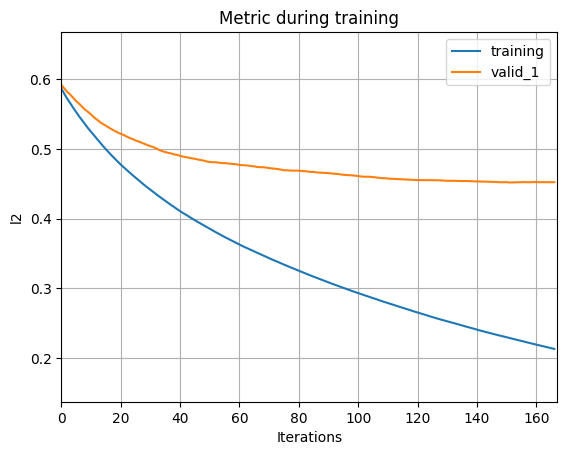

----> || Train Optimized QWK SCORE ::  0.820
----> || Val Optimized QWK SCORE ::  0.490
----> || Train Optimized Val QWK SCORE ::  0.467
----> || Val Optimized Train QWK SCORE ::  0.805
Fold 1 - Rounded Train QWK: 0.7116, Rounded Validation QWK: 0.3356


<Figure size 640x480 with 0 Axes>

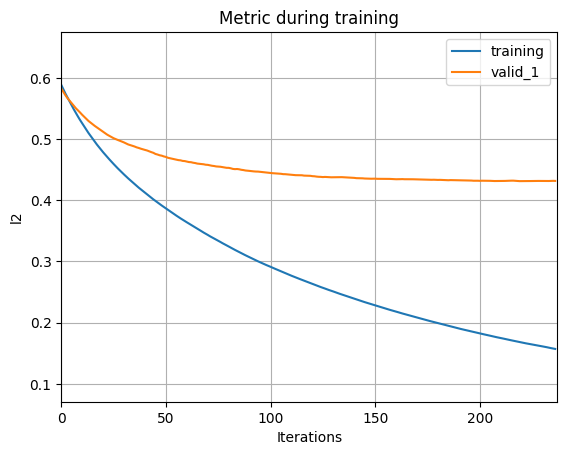

----> || Train Optimized QWK SCORE ::  0.879
----> || Val Optimized QWK SCORE ::  0.509
----> || Train Optimized Val QWK SCORE ::  0.458
----> || Val Optimized Train QWK SCORE ::  0.837
Fold 2 - Rounded Train QWK: 0.7879, Rounded Validation QWK: 0.4248


<Figure size 640x480 with 0 Axes>

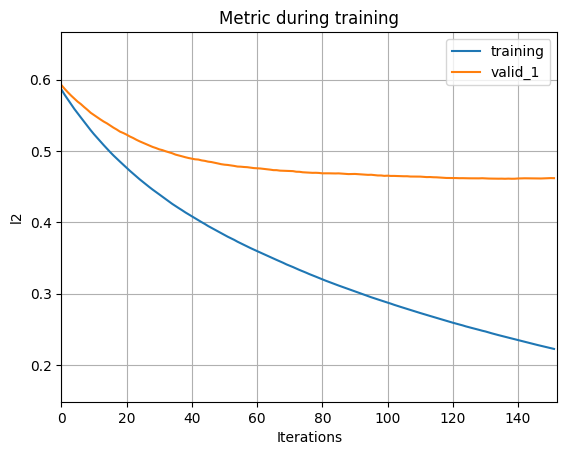

----> || Train Optimized QWK SCORE ::  0.814
----> || Val Optimized QWK SCORE ::  0.394
----> || Train Optimized Val QWK SCORE ::  0.469
----> || Val Optimized Train QWK SCORE ::  0.691
Fold 3 - Rounded Train QWK: 0.6980, Rounded Validation QWK: 0.3425


<Figure size 640x480 with 0 Axes>

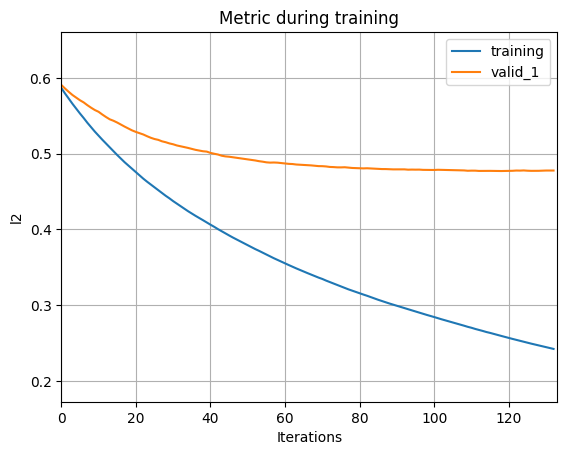

----> || Train Optimized QWK SCORE ::  0.798
----> || Val Optimized QWK SCORE ::  0.348
----> || Train Optimized Val QWK SCORE ::  0.413
----> || Val Optimized Train QWK SCORE ::  0.666
Fold 4 - Rounded Train QWK: 0.6847, Rounded Validation QWK: 0.3422


<Figure size 640x480 with 0 Axes>

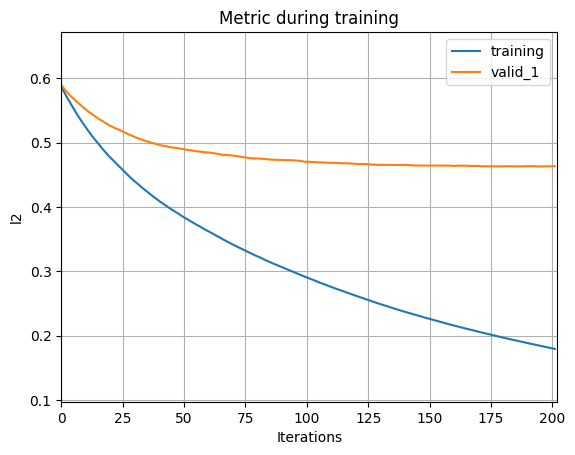

----> || Train Optimized QWK SCORE ::  0.851
----> || Val Optimized QWK SCORE ::  0.432
----> || Train Optimized Val QWK SCORE ::  0.422
----> || Val Optimized Train QWK SCORE ::  0.838
Fold 5 - Rounded Train QWK: 0.7575, Rounded Validation QWK: 0.3511
Mean Train QWK --> 0.8324
Mean Validation QWK ---> 0.4344
----> || Optimized QWK SCORE ::  0.473


In [76]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_final_df, test_final_df, 100)

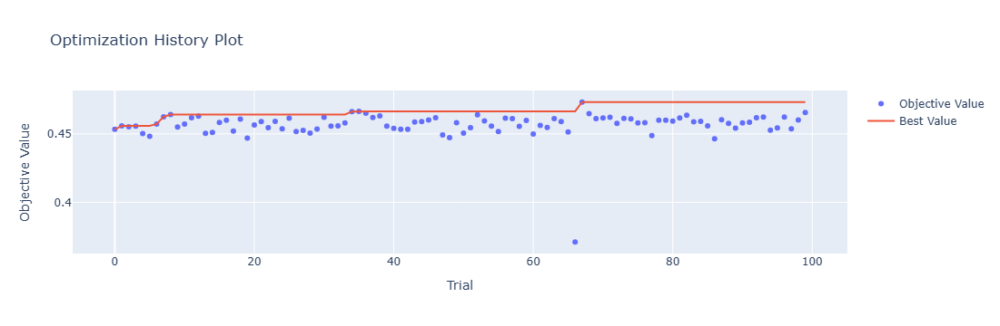

In [81]:
plot_optimization_history(lgb_optuna_study)

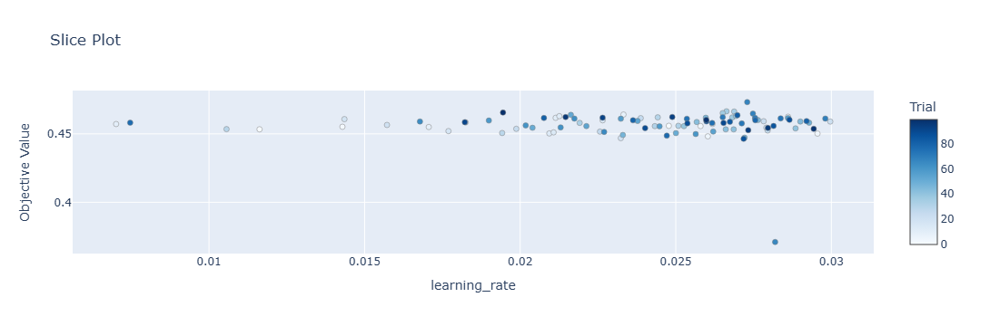

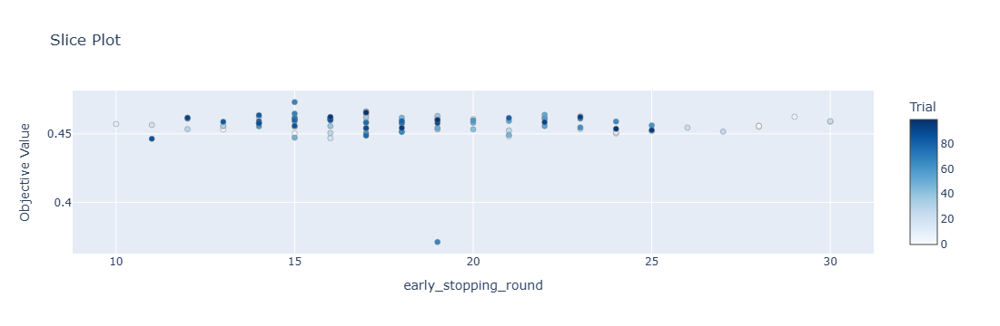

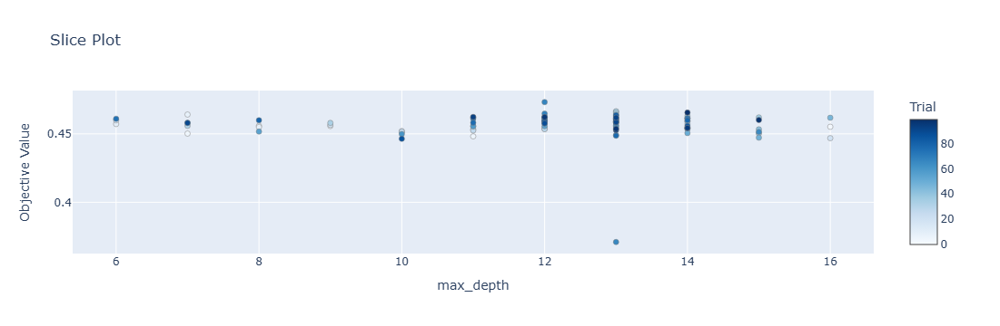

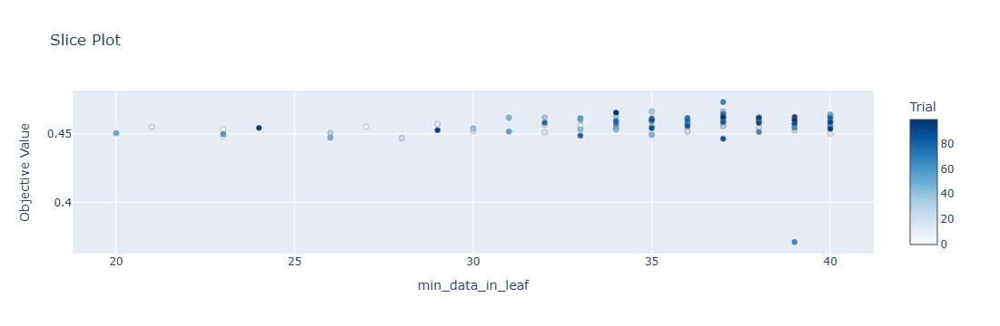

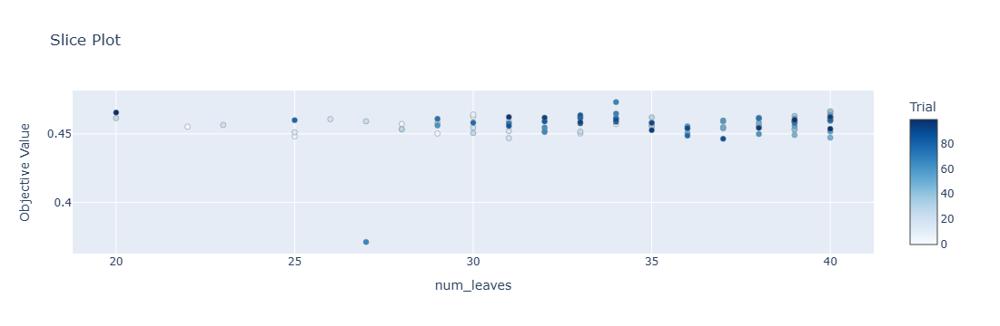

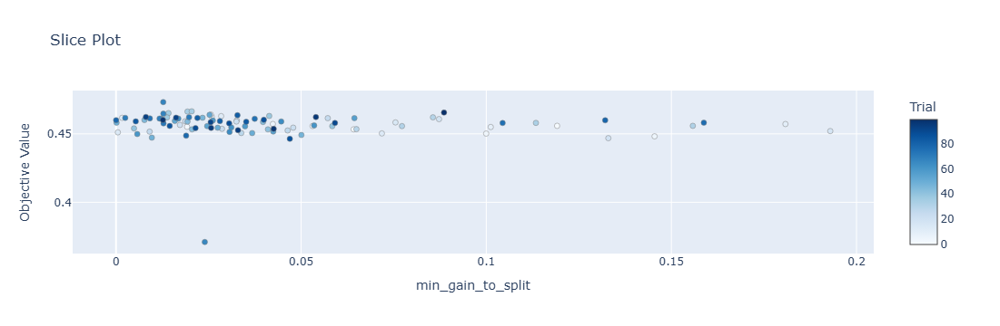

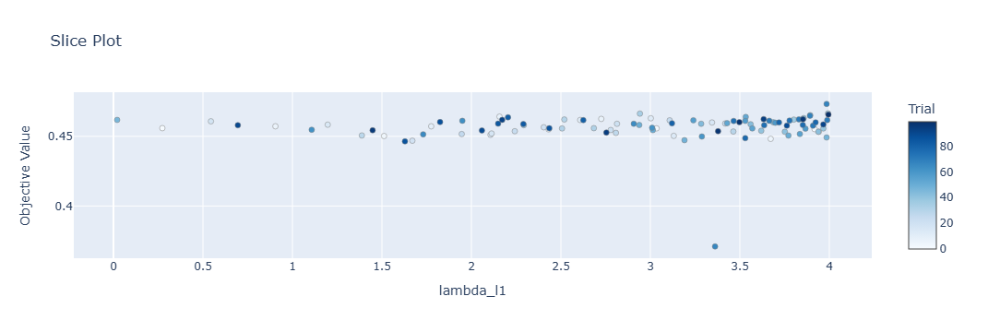

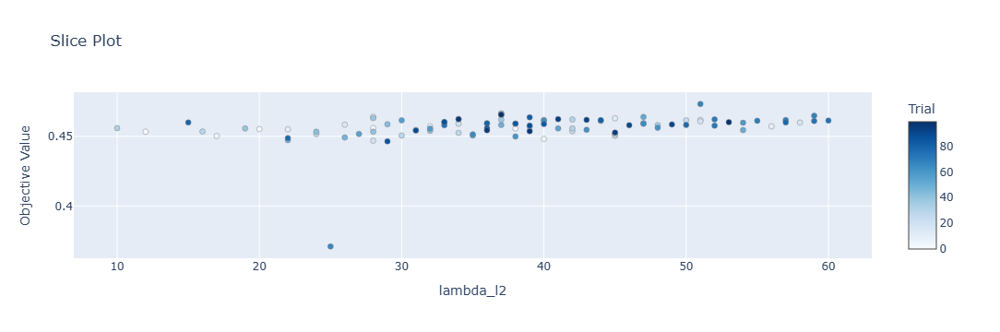

In [148]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

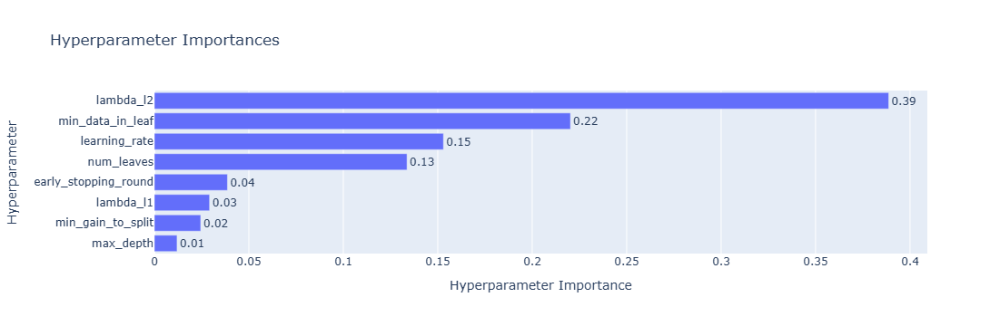

In [80]:
plot_param_importances(lgb_optuna_study)

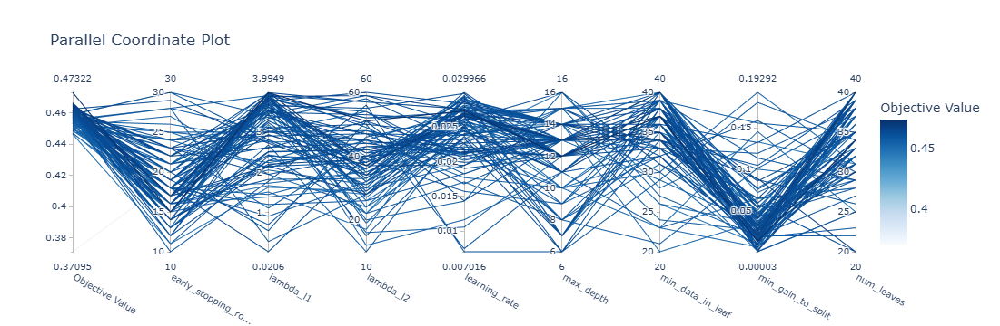

In [112]:
plot_parallel_coordinate(lgb_optuna_study)

In [97]:
cols = train_final_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

In [98]:
len(importance_list)

5

In [100]:
importance_mean = np.mean(importance_list, axis=0)
importance_mean.shape

(1418,)

In [101]:
train_final_df.shape

(2736, 1420)

In [102]:
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)

In [103]:
imp_df

,Feature,Importance
93,SDS-SDS_Total_Raw,146.2
91,PreInt_EduHx-computerinternet_hoursday,98.0
80,Physical-Height,53.2
12,Basic_Demos-Age,39.8
38,FGC-FGC_PU,35.8
...,...,...
1282,light_time_of_day_hour_window_1_std,0.0
1045,enmo_time_of_day_hour_window_17_min,0.0
791,battery_use_since_wear_mean,0.0
81,Physical-Season_Fall,0.0


In [104]:
zero_imp_cols = imp_df[imp_df['Importance'] == 0]['Feature'].tolist()
print(len(zero_imp_cols))

80


In [105]:
zero_imp_cols[:10]

['Basic_Demos-Enroll_Season_Fall',
 'X_weekday_1_1%',
 'Basic_Demos-Enroll_Season_Summer',
 'battery_use_since_wear_timestamp_hour_window_count_max',
 'CGAS-Season_Summer',
 'Basic_Demos-Age_isnan',
 'BIA-Season_Spring',
 'light_weekday_5_min',
 'battery_use_since_wear_weekday_5_entropy',
 'Basic_Demos-Sex_isnan']

In [106]:
train_final_df = train_final_df.drop(zero_imp_cols, axis=1)
print(train_final_df.shape)
train_final_df.head()

(2736, 1340)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,CGAS-Season_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,PAQ_C-Season_isnan,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_1%,light_10%,light_max,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_6_sum,Z_weekday_6_entropy,Z_weekday_7_mean,Z_weekday_7_std,Z_weekday_7_min,Z_weekday_7_max,Z_weekday_7_sum,Z_weekday_7_entropy,enmo_weekday_1_mean,enmo_weekday_1_min,enmo_weekday_1_1%,enmo_weekday_1_15%,enmo_weekday_1_max,enmo_weekday_1_sum,enmo_weekday_1_entropy,enmo_weekday_2_mean,enmo_weekday_2_std,enmo_weekday_2_max,enmo_weekday_2_sum,enmo_weekday_2_entropy,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_1%,enmo_weekday_3_10%,...

In [107]:
test_final_df = test_final_df.drop(zero_imp_cols, axis=1)
print(test_final_df.shape)
test_final_df.head()

(20, 1339)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_CU_Zone,FGC-FGC_GSND,FGC-FGC_GSND_Zone,FGC-FGC_GSD,FGC-FGC_GSD_Zone,FGC-FGC_PU,FGC-FGC_PU_Zone,FGC-FGC_SRL,FGC-FGC_SRL_Zone,FGC-FGC_SRR_Zone,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,CGAS-Season_isnan,Physical-Waist_Circumference_isnan,Physical-Diastolic_BP_isnan,FGC-FGC_CU_isnan,FGC-FGC_GSND_isnan,PAQ_C-Season_isnan,X_mean,X_std,X_min,X_1%,X_99%,X_max,Y_mean,Y_std,Y_min,Y_1%,Y_3%,Y_95%,Y_99%,Y_max,Z_mean,Z_std,Z_min,Z_1%,Z_3%,Z_99%,Z_max,enmo_mean,enmo_std,enmo_1%,enmo_10%,enmo_max,anglez_min,anglez_1%,anglez_max,light_mean,light_1%,light_10%,light_max,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_3%,battery_use_since_wear_10%,battery_use_since_wear_max,count,X_weekday_1_mean,X_weekday_1_std,X_weekday_1_min,X_weekday_1_max,X_weekday_1_sum,X_weekday_1_entropy,X_weekday_2_mean,X_weekday_2_std,X_weekday_2_min,X_weekday_2_1%,X_weekday_2_max,X_weekday_2_sum,X_weekday_2_entropy,X_weekday_3_mean,X_weekday_3_std,X_weekday_3_min,X_weekday_3_1%,X_weekday_3_3%,X_weekday_3_max,X_weekday_3_sum,X_weekday_3_entropy,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_max,X_weekday_4_sum,X_weekday_4_entropy,X_weekday_5_mean,X_weekday_5_std,X_weekday_5_min,X_weekday_5_1%,X_weekday_5_max,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_std,X_weekday_6_min,X_weekday_6_1%,X_weekday_6_max,X_weekday_6_sum,X_weekday_6_entropy,X_weekday_7_mean,X_weekday_7_std,X_weekday_7_min,X_weekday_7_1%,X_weekday_7_max,X_weekday_7_sum,X_weekday_7_entropy,Y_weekday_1_mean,Y_weekday_1_std,Y_weekday_1_min,Y_weekday_1_1%,Y_weekday_1_max,Y_weekday_1_sum,Y_weekday_1_entropy,Y_weekday_2_mean,Y_weekday_2_std,Y_weekday_2_min,Y_weekday_2_1%,Y_weekday_2_max,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_std,Y_weekday_3_min,Y_weekday_3_1%,Y_weekday_3_max,Y_weekday_3_sum,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_std,Y_weekday_4_min,Y_weekday_4_1%,Y_weekday_4_max,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_std,Y_weekday_5_min,Y_weekday_5_1%,Y_weekday_5_70%,Y_weekday_5_max,Y_weekday_5_sum,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_std,Y_weekday_6_min,Y_weekday_6_1%,Y_weekday_6_max,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_mean,Y_weekday_7_std,Y_weekday_7_min,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_sum,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_1_entropy,Z_weekday_2_mean,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_15%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_2_sum,Z_weekday_2_entropy,Z_weekday_3_mean,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_1%,Z_weekday_3_max,Z_weekday_3_sum,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_max,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_mean,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_1%,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_max,Z_weekday_6_sum,Z_weekday_6_entropy,Z_weekday_7_mean,Z_weekday_7_std,Z_weekday_7_min,Z_weekday_7_max,Z_weekday_7_sum,Z_weekday_7_entropy,enmo_weekday_1_mean,enmo_weekday_1_min,enmo_weekday_1_1%,enmo_weekday_1_15%,enmo_weekday_1_max,enmo_weekday_1_sum,enmo_weekday_1_entropy,enmo_weekday_2_mean,enmo_weekday_2_std,enmo_weekday_2_max,enmo_weekday_2_sum,enmo_weekday_2_entropy,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_1%,enmo_weekday_3_10%,...

[I 2024-12-13 21:54:24,070] A new study created in memory with name: no-name-2d1ad9d5-8f69-42e9-b74c-6fee2af8536e
[I 2024-12-13 21:54:38,809] Trial 0 finished with value: 0.4551041661970434 and parameters: {'learning_rate': 0.02298314479903342, 'early_stopping_round': 16, 'max_depth': 12, 'min_data_in_leaf': 53, 'num_leaves': 35, 'min_gain_to_split': 0.03585931872727476, 'lambda_l1': 6.859280485687291, 'lambda_l2': 91.37804139363342}. Best is trial 0 with value: 0.4551041661970434.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 21:54:54,316] Trial 1 finished with value: 0.4624505786851999 and parameters: {'learning_rate': 0.017292909390617985, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 50, 'num_leaves': 26, 'min_gain_to_split': 0.051265151917736965, 'lambda_l1': 12.31088730578379, 'lambda_l2': 61.83876876797727}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 21:55:08,043] Trial 2 finished with value: 0.45780761409109794 and parameters: {'learning_rate': 0.0413179570926521, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 34, 'num_leaves': 57, 'min_gain_to_split': 0.01713629855435893, 'lambda_l1': 0.9263826340952352, 'lambda_l2': 31.76310576550444}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 21:55:22,329] Trial 3 finished with value: 0.4579757498894431 and parameters: {'learning_rate': 0.039011331396843596, 'early_stopping_round': 11, 'max_depth': 7, 'min_data_in_leaf': 22, 'num_leaves': 51, 'min_gain_to_split': 0.006495590270938179, 'lambda_l1': 5.3096804777020274, 'lambda_l2': 94.51267240719541}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 21:55:41,141] Trial 4 finished with value: 0.46092633793706417 and parameters: {'learning_rate': 0.011692731726484839, 'early_stopping_round': 10, 'max_depth': 7, 'min_data_in_leaf': 50, 'num_leaves': 23, 'min_gain_to_split': 0.07648523660750203, 'lambda_l1': 3.5614826792595555, 'lambda_l2': 44.92230234686222}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 21:55:53,965] Trial 5 finished with value: 0.4517899350839334 and parameters: {'learning_rate': 0.02914355668228822, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 21, 'num_leaves': 22, 'min_gain_to_split': 0.011325673454915109, 'lambda_l1': 12.517072050408999, 'lambda_l2': 23.112633356573536}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 21:56:03,356] Trial 6 finished with value: 0.45888926632285865 and parameters: {'learning_rate': 0.04234483357222572, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 32, 'num_leaves': 21, 'min_gain_to_split': 0.09786625956377933, 'lambda_l1': 5.616771531121572, 'lambda_l2': 55.54239894104694}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 21:56:21,130] Trial 7 finished with value: 0.44366350341344896 and parameters: {'learning_rate': 0.037156627100713505, 'early_stopping_round': 20, 'max_depth': 14, 'min_data_in_leaf': 25, 'num_leaves': 52, 'min_gain_to_split': 0.06097238164495773, 'lambda_l1': 0.08430758880512368, 'lambda_l2': 26.43266559153596}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.444


[I 2024-12-13 21:56:50,618] Trial 8 finished with value: 0.4582292887672018 and parameters: {'learning_rate': 0.01028169701314884, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 44, 'num_leaves': 27, 'min_gain_to_split': 0.08712020426661025, 'lambda_l1': 7.512059432737177, 'lambda_l2': 95.85575020287136}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 21:56:59,664] Trial 9 finished with value: 0.45002188043675495 and parameters: {'learning_rate': 0.03418138580943109, 'early_stopping_round': 16, 'max_depth': 10, 'min_data_in_leaf': 39, 'num_leaves': 22, 'min_gain_to_split': 0.01710172262061124, 'lambda_l1': 12.063648298910383, 'lambda_l2': 41.187717004051926}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 21:57:11,720] Trial 10 finished with value: 0.455815408138444 and parameters: {'learning_rate': 0.01944874058150987, 'early_stopping_round': 29, 'max_depth': 9, 'min_data_in_leaf': 58, 'num_leaves': 35, 'min_gain_to_split': 0.04841239208742232, 'lambda_l1': 18.470627094276878, 'lambda_l2': 68.57426149051003}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 21:57:26,296] Trial 11 finished with value: 0.4536353199565234 and parameters: {'learning_rate': 0.013020556898005943, 'early_stopping_round': 12, 'max_depth': 6, 'min_data_in_leaf': 49, 'num_leaves': 31, 'min_gain_to_split': 0.07641858622529432, 'lambda_l1': 15.153485425810583, 'lambda_l2': 65.26414943719506}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 21:57:40,308] Trial 12 finished with value: 0.4592990581891929 and parameters: {'learning_rate': 0.01796324363179162, 'early_stopping_round': 26, 'max_depth': 8, 'min_data_in_leaf': 60, 'num_leaves': 43, 'min_gain_to_split': 0.06755617469875137, 'lambda_l1': 10.012196726673285, 'lambda_l2': 48.32382857267894}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 21:57:51,632] Trial 13 finished with value: 0.4553607511196488 and parameters: {'learning_rate': 0.027095913843473186, 'early_stopping_round': 16, 'max_depth': 12, 'min_data_in_leaf': 49, 'num_leaves': 28, 'min_gain_to_split': 0.05138560954653573, 'lambda_l1': 2.786438366143657, 'lambda_l2': 10.206538819106456}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 21:58:06,687] Trial 14 finished with value: 0.4555925339048078 and parameters: {'learning_rate': 0.015971729917805332, 'early_stopping_round': 19, 'max_depth': 6, 'min_data_in_leaf': 43, 'num_leaves': 43, 'min_gain_to_split': 0.03509514414334564, 'lambda_l1': 15.169180102377801, 'lambda_l2': 72.46999957181227}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 21:58:14,139] Trial 15 finished with value: 0.4498903211665479 and parameters: {'learning_rate': 0.04781093763485198, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 53, 'num_leaves': 26, 'min_gain_to_split': 0.07649360950241099, 'lambda_l1': 9.721725832360688, 'lambda_l2': 57.0581484771568}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 21:58:28,414] Trial 16 finished with value: 0.45882179159319414 and parameters: {'learning_rate': 0.022714921722112105, 'early_stopping_round': 13, 'max_depth': 9, 'min_data_in_leaf': 49, 'num_leaves': 37, 'min_gain_to_split': 0.03370944119349968, 'lambda_l1': 3.7651091166430635, 'lambda_l2': 80.27191794420384}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 21:58:44,954] Trial 17 finished with value: 0.4590051517334395 and parameters: {'learning_rate': 0.010312056867117076, 'early_stopping_round': 10, 'max_depth': 8, 'min_data_in_leaf': 54, 'num_leaves': 31, 'min_gain_to_split': 0.060316434032719614, 'lambda_l1': 17.79964342123916, 'lambda_l2': 39.02295747488832}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 21:59:01,659] Trial 18 finished with value: 0.45768577240198627 and parameters: {'learning_rate': 0.015101192914916562, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 39, 'num_leaves': 20, 'min_gain_to_split': 0.09067465042376882, 'lambda_l1': 9.473735447175773, 'lambda_l2': 48.340321717633}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 21:59:12,955] Trial 19 finished with value: 0.46049582334893513 and parameters: {'learning_rate': 0.02524708300377597, 'early_stopping_round': 14, 'max_depth': 11, 'min_data_in_leaf': 45, 'num_leaves': 26, 'min_gain_to_split': 0.04576396074283853, 'lambda_l1': 12.90824664473634, 'lambda_l2': 79.89325087178639}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 21:59:24,660] Trial 20 finished with value: 0.45352765828257124 and parameters: {'learning_rate': 0.02029216306093708, 'early_stopping_round': 18, 'max_depth': 10, 'min_data_in_leaf': 56, 'num_leaves': 41, 'min_gain_to_split': 0.07031588725563337, 'lambda_l1': 15.554466339230016, 'lambda_l2': 61.31896993823668}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.454


[I 2024-12-13 21:59:37,679] Trial 21 finished with value: 0.4586015700473288 and parameters: {'learning_rate': 0.024543071303895166, 'early_stopping_round': 14, 'max_depth': 12, 'min_data_in_leaf': 46, 'num_leaves': 25, 'min_gain_to_split': 0.04641822792422202, 'lambda_l1': 12.649990125077265, 'lambda_l2': 78.16721854458052}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 21:59:56,876] Trial 22 finished with value: 0.45911792890142333 and parameters: {'learning_rate': 0.014088748685566496, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 47, 'num_leaves': 31, 'min_gain_to_split': 0.025158644508194248, 'lambda_l1': 11.328654087847422, 'lambda_l2': 84.74686931162454}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:00:07,446] Trial 23 finished with value: 0.44544793747198586 and parameters: {'learning_rate': 0.02683250483224464, 'early_stopping_round': 13, 'max_depth': 11, 'min_data_in_leaf': 42, 'num_leaves': 29, 'min_gain_to_split': 0.05496663661095355, 'lambda_l1': 13.794202069102397, 'lambda_l2': 72.74024637246592}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.445


[I 2024-12-13 22:00:18,686] Trial 24 finished with value: 0.4566710732055288 and parameters: {'learning_rate': 0.032723173150093834, 'early_stopping_round': 23, 'max_depth': 7, 'min_data_in_leaf': 35, 'num_leaves': 25, 'min_gain_to_split': 0.042046213124219745, 'lambda_l1': 8.56900467168937, 'lambda_l2': 50.712603417048946}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:00:29,824] Trial 25 finished with value: 0.45712317464753116 and parameters: {'learning_rate': 0.019427266931442356, 'early_stopping_round': 15, 'max_depth': 10, 'min_data_in_leaf': 51, 'num_leaves': 24, 'min_gain_to_split': 0.07800053970576809, 'lambda_l1': 17.248477284243194, 'lambda_l2': 41.050474581863625}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:00:46,866] Trial 26 finished with value: 0.45916825612178824 and parameters: {'learning_rate': 0.016871437727065813, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 46, 'num_leaves': 34, 'min_gain_to_split': 0.06359459047992035, 'lambda_l1': 10.701260615062159, 'lambda_l2': 84.91369388148698}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:00:58,898] Trial 27 finished with value: 0.4550361816419092 and parameters: {'learning_rate': 0.021983682625157652, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 38, 'min_gain_to_split': 0.025952832323046845, 'lambda_l1': 13.962873567099393, 'lambda_l2': 62.835999500414054}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 22:01:20,209] Trial 28 finished with value: 0.4560030931496626 and parameters: {'learning_rate': 0.012418172929161263, 'early_stopping_round': 22, 'max_depth': 8, 'min_data_in_leaf': 37, 'num_leaves': 48, 'min_gain_to_split': 0.041893473097163195, 'lambda_l1': 16.695511325817463, 'lambda_l2': 72.35230340842891}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:01:30,678] Trial 29 finished with value: 0.4557295654767183 and parameters: {'learning_rate': 0.024281230213847545, 'early_stopping_round': 17, 'max_depth': 12, 'min_data_in_leaf': 52, 'num_leaves': 34, 'min_gain_to_split': 0.05616830076149529, 'lambda_l1': 19.567720509633507, 'lambda_l2': 87.93096485426486}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:01:43,830] Trial 30 finished with value: 0.45010887964361945 and parameters: {'learning_rate': 0.03134475782969002, 'early_stopping_round': 25, 'max_depth': 9, 'min_data_in_leaf': 30, 'num_leaves': 23, 'min_gain_to_split': 0.02780348318116705, 'lambda_l1': 7.982063352810158, 'lambda_l2': 78.03203621165827}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 22:01:59,854] Trial 31 finished with value: 0.45777618235663653 and parameters: {'learning_rate': 0.017542271866578515, 'early_stopping_round': 28, 'max_depth': 7, 'min_data_in_leaf': 57, 'num_leaves': 43, 'min_gain_to_split': 0.06920985766289983, 'lambda_l1': 6.301162410760756, 'lambda_l2': 44.444978894494355}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:02:13,908] Trial 32 finished with value: 0.45698572701189 and parameters: {'learning_rate': 0.01750489984086034, 'early_stopping_round': 25, 'max_depth': 8, 'min_data_in_leaf': 60, 'num_leaves': 46, 'min_gain_to_split': 0.06894827355163748, 'lambda_l1': 10.454490746761996, 'lambda_l2': 33.56990729511192}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:02:25,487] Trial 33 finished with value: 0.4558691283010049 and parameters: {'learning_rate': 0.02068612031781085, 'early_stopping_round': 27, 'max_depth': 7, 'min_data_in_leaf': 60, 'num_leaves': 54, 'min_gain_to_split': 0.08469164196848117, 'lambda_l1': 13.61295729203285, 'lambda_l2': 49.7430937312133}. Best is trial 1 with value: 0.4624505786851999.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:02:45,695] Trial 34 finished with value: 0.4654284087934857 and parameters: {'learning_rate': 0.01222721768977671, 'early_stopping_round': 25, 'max_depth': 6, 'min_data_in_leaf': 54, 'num_leaves': 48, 'min_gain_to_split': 0.04120301856155606, 'lambda_l1': 3.9942852502993875, 'lambda_l2': 33.9129059744464}. Best is trial 34 with value: 0.4654284087934857.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:03:04,129] Trial 35 finished with value: 0.452091257466228 and parameters: {'learning_rate': 0.0123103658069977, 'early_stopping_round': 24, 'max_depth': 6, 'min_data_in_leaf': 51, 'num_leaves': 47, 'min_gain_to_split': 0.04142282508344183, 'lambda_l1': 2.2059292932542656, 'lambda_l2': 34.39028231690162}. Best is trial 34 with value: 0.4654284087934857.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 22:03:20,026] Trial 36 finished with value: 0.45951707155720534 and parameters: {'learning_rate': 0.014220812132278451, 'early_stopping_round': 20, 'max_depth': 6, 'min_data_in_leaf': 54, 'num_leaves': 55, 'min_gain_to_split': 0.03102453081774554, 'lambda_l1': 4.3330789945232695, 'lambda_l2': 19.70392373798137}. Best is trial 34 with value: 0.4654284087934857.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:03:48,329] Trial 37 finished with value: 0.4710024930395065 and parameters: {'learning_rate': 0.011035507860347868, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 44, 'num_leaves': 60, 'min_gain_to_split': 0.09668177513526403, 'lambda_l1': 1.9558036802657792, 'lambda_l2': 98.99542014893959}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 22:04:12,935] Trial 38 finished with value: 0.4566001528101068 and parameters: {'learning_rate': 0.01093210494406898, 'early_stopping_round': 21, 'max_depth': 16, 'min_data_in_leaf': 48, 'num_leaves': 60, 'min_gain_to_split': 0.09842486779977996, 'lambda_l1': 0.8218140122259601, 'lambda_l2': 27.56857529263268}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:04:39,989] Trial 39 finished with value: 0.46736404671491005 and parameters: {'learning_rate': 0.012334821776568984, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 42, 'num_leaves': 60, 'min_gain_to_split': 0.09222001121282415, 'lambda_l1': 1.3650643170658618, 'lambda_l2': 97.42969189561168}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:05:01,637] Trial 40 finished with value: 0.4617235878925733 and parameters: {'learning_rate': 0.01514784145056853, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 41, 'num_leaves': 60, 'min_gain_to_split': 0.09273367235548892, 'lambda_l1': 1.5735633632510593, 'lambda_l2': 99.80946101576717}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 22:05:24,542] Trial 41 finished with value: 0.4674658241828421 and parameters: {'learning_rate': 0.014942108794720767, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 42, 'num_leaves': 60, 'min_gain_to_split': 0.09169222266992669, 'lambda_l1': 1.9239149258592523, 'lambda_l2': 99.0071228754326}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:05:53,347] Trial 42 finished with value: 0.46540792200425696 and parameters: {'learning_rate': 0.013021254217363758, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 44, 'num_leaves': 58, 'min_gain_to_split': 0.09401255545962431, 'lambda_l1': 0.09321972221102892, 'lambda_l2': 92.63494590734233}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:06:28,913] Trial 43 finished with value: 0.4590774784484747 and parameters: {'learning_rate': 0.011813535830980076, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 37, 'num_leaves': 57, 'min_gain_to_split': 0.08264818139294168, 'lambda_l1': 0.19367024974733482, 'lambda_l2': 92.80512830832348}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:06:54,160] Trial 44 finished with value: 0.4609314850210865 and parameters: {'learning_rate': 0.013633102893243801, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 40, 'num_leaves': 58, 'min_gain_to_split': 0.09564633996855519, 'lambda_l1': 5.007273547904088, 'lambda_l2': 98.03676345394966}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:07:28,870] Trial 45 finished with value: 0.46484377869689475 and parameters: {'learning_rate': 0.010161815892373978, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 44, 'num_leaves': 52, 'min_gain_to_split': 0.09271412377542237, 'lambda_l1': 2.7345641857541967, 'lambda_l2': 89.85358450422638}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:07:57,117] Trial 46 finished with value: 0.45730635848098644 and parameters: {'learning_rate': 0.01565380219485977, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 30, 'num_leaves': 55, 'min_gain_to_split': 0.0998458645831651, 'lambda_l1': 1.5258474449119834, 'lambda_l2': 93.41966771688605}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:08:27,255] Trial 47 finished with value: 0.4571839340323084 and parameters: {'learning_rate': 0.012556837148094337, 'early_stopping_round': 20, 'max_depth': 14, 'min_data_in_leaf': 37, 'num_leaves': 58, 'min_gain_to_split': 0.08787959256842767, 'lambda_l1': 3.52126961797834, 'lambda_l2': 95.78939887202604}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:08:47,334] Trial 48 finished with value: 0.4610577531186608 and parameters: {'learning_rate': 0.018795628762934433, 'early_stopping_round': 22, 'max_depth': 16, 'min_data_in_leaf': 42, 'num_leaves': 50, 'min_gain_to_split': 0.08217359058686771, 'lambda_l1': 1.0473311463197996, 'lambda_l2': 87.64829794815134}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:09:00,978] Trial 49 finished with value: 0.444373725122191 and parameters: {'learning_rate': 0.043463683846987004, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 33, 'num_leaves': 60, 'min_gain_to_split': 0.08845455430007852, 'lambda_l1': 0.06026032826842043, 'lambda_l2': 99.66765812956514}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.444


[I 2024-12-13 22:09:26,839] Trial 50 finished with value: 0.46112466003195673 and parameters: {'learning_rate': 0.016072436250518463, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 39, 'num_leaves': 57, 'min_gain_to_split': 0.09312390808581318, 'lambda_l1': 2.211700284943811, 'lambda_l2': 94.99044907021586}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:09:56,274] Trial 51 finished with value: 0.46460306335560353 and parameters: {'learning_rate': 0.010057207268378799, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 44, 'num_leaves': 51, 'min_gain_to_split': 0.09371198532779221, 'lambda_l1': 3.165552559267897, 'lambda_l2': 90.03646562401383}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:10:23,379] Trial 52 finished with value: 0.4646125440788921 and parameters: {'learning_rate': 0.011590538385159707, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 44, 'num_leaves': 54, 'min_gain_to_split': 0.09693956348312376, 'lambda_l1': 2.325431876358694, 'lambda_l2': 90.41849003743408}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:10:48,194] Trial 53 finished with value: 0.4653547990686251 and parameters: {'learning_rate': 0.013759658448910687, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 43, 'num_leaves': 53, 'min_gain_to_split': 0.09105117963016085, 'lambda_l1': 4.28517083178297, 'lambda_l2': 82.78504229328877}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:11:13,041] Trial 54 finished with value: 0.45530758398492077 and parameters: {'learning_rate': 0.013809795333537354, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 42, 'num_leaves': 58, 'min_gain_to_split': 0.08499031779027101, 'lambda_l1': 4.23989535726564, 'lambda_l2': 84.02245877009663}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 22:11:25,465] Trial 55 finished with value: 0.4597136606036517 and parameters: {'learning_rate': 0.03685768664617837, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 47, 'num_leaves': 56, 'min_gain_to_split': 0.07909318121607697, 'lambda_l1': 5.176936072431276, 'lambda_l2': 96.69031038173435}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:11:48,865] Trial 56 finished with value: 0.45888805243858477 and parameters: {'learning_rate': 0.013585761529021965, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 40, 'num_leaves': 53, 'min_gain_to_split': 0.0893474313630349, 'lambda_l1': 6.77957126712837, 'lambda_l2': 94.0798787153743}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:12:13,833] Trial 57 finished with value: 0.45886028034776516 and parameters: {'learning_rate': 0.016129384377080475, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 35, 'num_leaves': 59, 'min_gain_to_split': 0.07299200665307375, 'lambda_l1': 1.8232376280890268, 'lambda_l2': 83.69304357427026}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:12:48,776] Trial 58 finished with value: 0.4471442252973753 and parameters: {'learning_rate': 0.014610898065702194, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 23, 'num_leaves': 56, 'min_gain_to_split': 0.08116021420189752, 'lambda_l1': 0.8734533416421586, 'lambda_l2': 15.309621247741468}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.447


[I 2024-12-13 22:13:09,599] Trial 59 finished with value: 0.46627822852248435 and parameters: {'learning_rate': 0.018302465837178566, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 46, 'num_leaves': 49, 'min_gain_to_split': 0.09934495199980543, 'lambda_l1': 4.074896879378715, 'lambda_l2': 97.61398879376068}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:13:27,548] Trial 60 finished with value: 0.4583722130277501 and parameters: {'learning_rate': 0.021611267922562842, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 47, 'num_leaves': 49, 'min_gain_to_split': 0.09622725792689328, 'lambda_l1': 3.1505367313924575, 'lambda_l2': 97.54678014979957}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:13:54,849] Trial 61 finished with value: 0.46198779690041636 and parameters: {'learning_rate': 0.011453918664857368, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 45, 'num_leaves': 45, 'min_gain_to_split': 0.09072491257580113, 'lambda_l1': 4.347289809946532, 'lambda_l2': 92.32668609931702}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 22:14:17,685] Trial 62 finished with value: 0.459757644722288 and parameters: {'learning_rate': 0.01321965525314307, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 43, 'num_leaves': 52, 'min_gain_to_split': 0.09978489215573393, 'lambda_l1': 6.110749489369565, 'lambda_l2': 87.60376651519756}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:14:38,148] Trial 63 finished with value: 0.4602967160206103 and parameters: {'learning_rate': 0.018069682536765174, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 49, 'num_leaves': 56, 'min_gain_to_split': 0.085588887437241, 'lambda_l1': 0.6830627006063208, 'lambda_l2': 99.61345998397336}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:14:59,540] Trial 64 finished with value: 0.46078741585258054 and parameters: {'learning_rate': 0.016857286651831907, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 41, 'num_leaves': 59, 'min_gain_to_split': 0.09519820496859291, 'lambda_l1': 3.665527611833819, 'lambda_l2': 96.01587288806564}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:15:23,455] Trial 65 finished with value: 0.4606243399684946 and parameters: {'learning_rate': 0.014910784154279124, 'early_stopping_round': 20, 'max_depth': 16, 'min_data_in_leaf': 38, 'num_leaves': 50, 'min_gain_to_split': 0.07400646092374495, 'lambda_l1': 2.7282908741036205, 'lambda_l2': 81.33350068377476}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:15:57,155] Trial 66 finished with value: 0.47042996797482384 and parameters: {'learning_rate': 0.011399286806378486, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 46, 'num_leaves': 54, 'min_gain_to_split': 0.03791666701285812, 'lambda_l1': 1.5398659585075036, 'lambda_l2': 75.49181625568674}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 22:16:30,733] Trial 67 finished with value: 0.46311873722309727 and parameters: {'learning_rate': 0.011163587131857384, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 46, 'num_leaves': 59, 'min_gain_to_split': 7.637102292375186e-05, 'lambda_l1': 1.4356091552321475, 'lambda_l2': 66.79875045191778}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:17:03,964] Trial 68 finished with value: 0.46621949028425835 and parameters: {'learning_rate': 0.012935063331552093, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 50, 'num_leaves': 57, 'min_gain_to_split': 0.020073384841272336, 'lambda_l1': 0.4694678776446717, 'lambda_l2': 86.99065539470243}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:17:24,492] Trial 69 finished with value: 0.45458333731233924 and parameters: {'learning_rate': 0.018771464770245366, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 55, 'min_gain_to_split': 0.020706766872251394, 'lambda_l1': 2.003144805402086, 'lambda_l2': 75.69014846908354}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 22:17:52,664] Trial 70 finished with value: 0.46328383482294133 and parameters: {'learning_rate': 0.012092974711925176, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 51, 'num_leaves': 41, 'min_gain_to_split': 0.03780650387823395, 'lambda_l1': 1.2489655063724252, 'lambda_l2': 87.95658287989873}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:18:20,416] Trial 71 finished with value: 0.4605644941585355 and parameters: {'learning_rate': 0.01307891226806807, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 50, 'num_leaves': 58, 'min_gain_to_split': 0.017939726609004773, 'lambda_l1': 0.6165496949564249, 'lambda_l2': 90.88011110467188}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:18:52,102] Trial 72 finished with value: 0.45757647327316486 and parameters: {'learning_rate': 0.010993176489031626, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 48, 'num_leaves': 60, 'min_gain_to_split': 0.012530460388480429, 'lambda_l1': 0.5279847292689208, 'lambda_l2': 57.14793374116824}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:19:16,429] Trial 73 finished with value: 0.4646257651979474 and parameters: {'learning_rate': 0.016465226692757223, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 45, 'num_leaves': 57, 'min_gain_to_split': 0.053713900407586494, 'lambda_l1': 0.09043405982534532, 'lambda_l2': 93.45320622213976}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:19:31,394] Trial 74 finished with value: 0.4528061547286639 and parameters: {'learning_rate': 0.028865953974554437, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 54, 'min_gain_to_split': 0.03709873045241495, 'lambda_l1': 2.6366568428592254, 'lambda_l2': 86.19632061047741}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.453


[I 2024-12-13 22:19:56,472] Trial 75 finished with value: 0.4651813688982659 and parameters: {'learning_rate': 0.014728087003057144, 'early_stopping_round': 26, 'max_depth': 11, 'min_data_in_leaf': 48, 'num_leaves': 57, 'min_gain_to_split': 0.033574314910245436, 'lambda_l1': 1.8370957067704814, 'lambda_l2': 98.24042674317549}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:20:25,408] Trial 76 finished with value: 0.432049962813159 and parameters: {'learning_rate': 0.012758491762932452, 'early_stopping_round': 28, 'max_depth': 15, 'min_data_in_leaf': 46, 'num_leaves': 59, 'min_gain_to_split': 0.047841636094653514, 'lambda_l1': 3.249504879371138, 'lambda_l2': 96.14329462191874}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.432


[I 2024-12-13 22:20:53,207] Trial 77 finished with value: 0.46083551987629223 and parameters: {'learning_rate': 0.015350683215268005, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 41, 'num_leaves': 45, 'min_gain_to_split': 0.059899001386447, 'lambda_l1': 1.2931657716044123, 'lambda_l2': 91.40658406060365}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:21:22,391] Trial 78 finished with value: 0.466331965127718 and parameters: {'learning_rate': 0.01042423265071972, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 50, 'num_leaves': 48, 'min_gain_to_split': 0.04327765616363441, 'lambda_l1': 4.754830984498932, 'lambda_l2': 78.82268235749362}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:21:48,855] Trial 79 finished with value: 0.4661051822227281 and parameters: {'learning_rate': 0.010374261361234219, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 47, 'min_gain_to_split': 0.04432338776918986, 'lambda_l1': 4.788775100799117, 'lambda_l2': 77.99647477485013}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:22:20,117] Trial 80 finished with value: 0.46287913916509815 and parameters: {'learning_rate': 0.010343025093932711, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 50, 'num_leaves': 47, 'min_gain_to_split': 0.05090117710136716, 'lambda_l1': 5.855279543223997, 'lambda_l2': 70.67722892273368}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:22:44,483] Trial 81 finished with value: 0.46699871978396 and parameters: {'learning_rate': 0.011809557517877246, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 49, 'min_gain_to_split': 0.043995570087964016, 'lambda_l1': 4.7542695163224, 'lambda_l2': 77.0302982288374}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:23:11,486] Trial 82 finished with value: 0.46491024893367106 and parameters: {'learning_rate': 0.011018327225253298, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 49, 'min_gain_to_split': 0.04545227221707574, 'lambda_l1': 4.817128907567454, 'lambda_l2': 75.26094535611743}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:23:40,822] Trial 83 finished with value: 0.467401216155786 and parameters: {'learning_rate': 0.010096930712108192, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 51, 'min_gain_to_split': 0.03904860883050884, 'lambda_l1': 5.26951845890057, 'lambda_l2': 78.20485404942686}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:24:04,953] Trial 84 finished with value: 0.46108364296461624 and parameters: {'learning_rate': 0.012406706120662565, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 52, 'min_gain_to_split': 0.029498168570532904, 'lambda_l1': 7.66024475477923, 'lambda_l2': 76.2405382509437}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:24:33,338] Trial 85 finished with value: 0.4564979638249582 and parameters: {'learning_rate': 0.011592858003616865, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 52, 'num_leaves': 51, 'min_gain_to_split': 0.038215907889659825, 'lambda_l1': 6.667132426580305, 'lambda_l2': 80.66856412342014}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:24:54,213] Trial 86 finished with value: 0.4645352775009224 and parameters: {'learning_rate': 0.014082789466376684, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 53, 'min_gain_to_split': 0.03271667447092575, 'lambda_l1': 8.47892803513852, 'lambda_l2': 73.10279828523116}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:25:20,091] Trial 87 finished with value: 0.46042914320198514 and parameters: {'learning_rate': 0.011905772942533348, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 50, 'min_gain_to_split': 0.04876992241268876, 'lambda_l1': 5.312657606451214, 'lambda_l2': 69.90037310938}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:25:48,324] Trial 88 finished with value: 0.4662305998543319 and parameters: {'learning_rate': 0.010101947759601446, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 55, 'min_gain_to_split': 0.024243828515887675, 'lambda_l1': 3.495774532937709, 'lambda_l2': 85.86036629374779}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:26:16,404] Trial 89 finished with value: 0.4642323797253375 and parameters: {'learning_rate': 0.01047329844729524, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 49, 'min_gain_to_split': 0.04352509230270856, 'lambda_l1': 3.5642841800950347, 'lambda_l2': 79.05706891747423}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:26:42,475] Trial 90 finished with value: 0.4647238111445945 and parameters: {'learning_rate': 0.011165628686685115, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 45, 'min_gain_to_split': 0.039889486475929506, 'lambda_l1': 5.453980610235157, 'lambda_l2': 82.49079848378635}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:27:12,387] Trial 91 finished with value: 0.4667999919373851 and parameters: {'learning_rate': 0.010128323941261385, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 55, 'min_gain_to_split': 0.02451672164450896, 'lambda_l1': 3.0512450745231527, 'lambda_l2': 86.31954922895923}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:27:42,583] Trial 92 finished with value: 0.46844906222431637 and parameters: {'learning_rate': 0.010220902849009674, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 55, 'min_gain_to_split': 0.027663788162412512, 'lambda_l1': 3.082167289620549, 'lambda_l2': 64.04609059048398}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 22:28:07,196] Trial 93 finished with value: 0.4641417198941086 and parameters: {'learning_rate': 0.012036922973966906, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 53, 'min_gain_to_split': 0.02710735377605236, 'lambda_l1': 2.571554432638596, 'lambda_l2': 63.79533219655794}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:28:16,322] Trial 94 finished with value: 0.45958451980326176 and parameters: {'learning_rate': 0.04838836860481833, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 51, 'min_gain_to_split': 0.023619197600485257, 'lambda_l1': 3.9485520321194736, 'lambda_l2': 67.37795111798562}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:28:38,800] Trial 95 finished with value: 0.46906732373512483 and parameters: {'learning_rate': 0.0138687892233679, 'early_stopping_round': 23, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 54, 'min_gain_to_split': 0.035602416600059, 'lambda_l1': 4.302696068867585, 'lambda_l2': 58.540244990741975}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 22:28:59,801] Trial 96 finished with value: 0.45909170788040066 and parameters: {'learning_rate': 0.01455310476806649, 'early_stopping_round': 23, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 54, 'min_gain_to_split': 0.034702249173926246, 'lambda_l1': 2.942228808281664, 'lambda_l2': 53.009162060552434}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:29:23,388] Trial 97 finished with value: 0.4602060819122753 and parameters: {'learning_rate': 0.013358550328986292, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 56, 'min_gain_to_split': 0.029482962871476753, 'lambda_l1': 2.3390376415704806, 'lambda_l2': 57.63257469839996}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:29:49,869] Trial 98 finished with value: 0.46193738001412343 and parameters: {'learning_rate': 0.01099922877401976, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 54, 'min_gain_to_split': 0.03985630911387106, 'lambda_l1': 4.478730281556282, 'lambda_l2': 61.190340313556106}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 22:30:15,184] Trial 99 finished with value: 0.46064587521305767 and parameters: {'learning_rate': 0.010121485900157266, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 60, 'min_gain_to_split': 0.030699155627200013, 'lambda_l1': 7.279991541760925, 'lambda_l2': 65.17638528397154}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:30:41,054] Trial 100 finished with value: 0.4584486769983044 and parameters: {'learning_rate': 0.012434283164237125, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 52, 'min_gain_to_split': 0.03593353591417047, 'lambda_l1': 2.0445901232530654, 'lambda_l2': 59.42055503825732}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:31:01,366] Trial 101 finished with value: 0.4598978032056602 and parameters: {'learning_rate': 0.015570169983578862, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 60, 'num_leaves': 48, 'min_gain_to_split': 0.04322537732778284, 'lambda_l1': 3.8514911920271375, 'lambda_l2': 73.21306669098314}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 22:31:27,138] Trial 102 finished with value: 0.46112159643513073 and parameters: {'learning_rate': 0.013629355655753524, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 43, 'num_leaves': 55, 'min_gain_to_split': 0.0398970935654361, 'lambda_l1': 4.824604322631217, 'lambda_l2': 70.48311970735892}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:31:54,277] Trial 103 finished with value: 0.4700502740401926 and parameters: {'learning_rate': 0.011577972735988097, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 50, 'min_gain_to_split': 0.05307207623572574, 'lambda_l1': 3.221061136915683, 'lambda_l2': 89.27482093404613}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 22:32:21,739] Trial 104 finished with value: 0.4657989340635962 and parameters: {'learning_rate': 0.011406998023311698, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 50, 'min_gain_to_split': 0.013755345883335669, 'lambda_l1': 3.1025116756124085, 'lambda_l2': 81.8497035528026}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:32:31,169] Trial 105 finished with value: 0.4578661367553237 and parameters: {'learning_rate': 0.045121649222847504, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 51, 'min_gain_to_split': 0.03221286362842398, 'lambda_l1': 1.6838844928723324, 'lambda_l2': 89.13016169711365}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:32:53,471] Trial 106 finished with value: 0.4660268241663591 and parameters: {'learning_rate': 0.012724638430517809, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 38, 'min_gain_to_split': 0.035777078042623624, 'lambda_l1': 5.723080082216024, 'lambda_l2': 77.22196214692727}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:33:05,789] Trial 107 finished with value: 0.4673205212526832 and parameters: {'learning_rate': 0.03463942204233673, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 56, 'min_gain_to_split': 0.052219592950807234, 'lambda_l1': 2.3976618957055322, 'lambda_l2': 52.32181273991105}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:33:17,059] Trial 108 finished with value: 0.45888965220207945 and parameters: {'learning_rate': 0.035607937690418215, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 56, 'min_gain_to_split': 0.053057745500767826, 'lambda_l1': 1.058258169249409, 'lambda_l2': 47.03946362629586}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:33:27,215] Trial 109 finished with value: 0.4610217442556356 and parameters: {'learning_rate': 0.03857958849489236, 'early_stopping_round': 21, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 59, 'min_gain_to_split': 0.06494514240836224, 'lambda_l1': 2.4911028691258377, 'lambda_l2': 94.72912791419054}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:33:38,962] Trial 110 finished with value: 0.4566912170387172 and parameters: {'learning_rate': 0.03077266827237776, 'early_stopping_round': 20, 'max_depth': 16, 'min_data_in_leaf': 53, 'num_leaves': 56, 'min_gain_to_split': 0.023145496610355205, 'lambda_l1': 3.3610805650507203, 'lambda_l2': 53.80216549964958}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 22:33:50,957] Trial 111 finished with value: 0.4545049890574576 and parameters: {'learning_rate': 0.031897985551496894, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 53, 'min_gain_to_split': 0.05870070666737945, 'lambda_l1': 2.7991558661128186, 'lambda_l2': 51.22552864188525}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 22:34:03,320] Trial 112 finished with value: 0.45204109344637045 and parameters: {'learning_rate': 0.03506752436610849, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 42, 'num_leaves': 55, 'min_gain_to_split': 0.04750211110766472, 'lambda_l1': 2.129396046256235, 'lambda_l2': 59.90823345981137}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 22:34:13,114] Trial 113 finished with value: 0.4501974137655592 and parameters: {'learning_rate': 0.0413936945035943, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 58, 'min_gain_to_split': 0.04945556448342142, 'lambda_l1': 1.5162769891964718, 'lambda_l2': 84.29734320143628}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.450


[I 2024-12-13 22:34:37,056] Trial 114 finished with value: 0.4639225786166431 and parameters: {'learning_rate': 0.011662025002637256, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 52, 'min_gain_to_split': 0.046743495486295486, 'lambda_l1': 3.8522855681302968, 'lambda_l2': 55.09124267274394}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:35:12,489] Trial 115 finished with value: 0.45873204647333277 and parameters: {'learning_rate': 0.010011019917132812, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 45, 'num_leaves': 58, 'min_gain_to_split': 0.058070275516907355, 'lambda_l1': 2.945567309092931, 'lambda_l2': 78.68778266553441}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:35:24,443] Trial 116 finished with value: 0.4643586408424354 and parameters: {'learning_rate': 0.026710019043008734, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 60, 'min_gain_to_split': 0.052468967387347895, 'lambda_l1': 4.567544905651479, 'lambda_l2': 44.61041748478517}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:35:46,318] Trial 117 finished with value: 0.46561555457357495 and parameters: {'learning_rate': 0.014326174647263396, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 54, 'num_leaves': 53, 'min_gain_to_split': 0.055647450002356755, 'lambda_l1': 2.3776964115077632, 'lambda_l2': 74.01960061049385}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:35:58,363] Trial 118 finished with value: 0.4681348502244025 and parameters: {'learning_rate': 0.03369856026314935, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 54, 'min_gain_to_split': 0.027333034684981432, 'lambda_l1': 1.9223645762960007, 'lambda_l2': 99.71845639956497}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 22:36:11,622] Trial 119 finished with value: 0.46968146023573765 and parameters: {'learning_rate': 0.03437813519286307, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 54, 'min_gain_to_split': 0.02900804191186609, 'lambda_l1': 1.8368808403241204, 'lambda_l2': 99.90137103347021}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 22:36:25,929] Trial 120 finished with value: 0.45869021480547034 and parameters: {'learning_rate': 0.03372769278797083, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 57, 'min_gain_to_split': 0.027757442940891094, 'lambda_l1': 1.1135168892916294, 'lambda_l2': 99.07905099562201}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:36:39,083] Trial 121 finished with value: 0.46646957754523566 and parameters: {'learning_rate': 0.03324943068329346, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 54, 'min_gain_to_split': 0.02600107202384777, 'lambda_l1': 1.910366893824281, 'lambda_l2': 96.55937561707155}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:36:50,684] Trial 122 finished with value: 0.4649319191435324 and parameters: {'learning_rate': 0.03695010036569378, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 55, 'min_gain_to_split': 0.02247012904851165, 'lambda_l1': 1.798174041560845, 'lambda_l2': 99.6365522296439}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:37:01,943] Trial 123 finished with value: 0.4663843820171901 and parameters: {'learning_rate': 0.035375427967389836, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 54, 'min_gain_to_split': 0.030463551501690583, 'lambda_l1': 1.3852837040965769, 'lambda_l2': 93.97316116345743}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:37:12,932] Trial 124 finished with value: 0.4679475367635937 and parameters: {'learning_rate': 0.032780084587588534, 'early_stopping_round': 24, 'max_depth': 10, 'min_data_in_leaf': 60, 'num_leaves': 59, 'min_gain_to_split': 0.03212318431747653, 'lambda_l1': 0.8748917841704777, 'lambda_l2': 97.6631660956797}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 22:37:26,534] Trial 125 finished with value: 0.463418175350655 and parameters: {'learning_rate': 0.032572943974671247, 'early_stopping_round': 26, 'max_depth': 10, 'min_data_in_leaf': 60, 'num_leaves': 59, 'min_gain_to_split': 0.0331827520395624, 'lambda_l1': 0.42524240717336753, 'lambda_l2': 96.8173799461679}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:37:39,099] Trial 126 finished with value: 0.46354600740252794 and parameters: {'learning_rate': 0.034667068199392775, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 60, 'min_gain_to_split': 0.03808183801245414, 'lambda_l1': 1.0422613386088209, 'lambda_l2': 94.75157537579382}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:37:57,736] Trial 127 finished with value: 0.45756784296952036 and parameters: {'learning_rate': 0.03785370647964393, 'early_stopping_round': 27, 'max_depth': 10, 'min_data_in_leaf': 26, 'num_leaves': 59, 'min_gain_to_split': 0.028778047334434658, 'lambda_l1': 2.2183593600497007, 'lambda_l2': 91.99076427561884}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.458


[I 2024-12-13 22:38:10,786] Trial 128 finished with value: 0.4629605451202772 and parameters: {'learning_rate': 0.03610146512384159, 'early_stopping_round': 23, 'max_depth': 9, 'min_data_in_leaf': 41, 'num_leaves': 57, 'min_gain_to_split': 0.03172850203370083, 'lambda_l1': 0.7389377313776366, 'lambda_l2': 98.58757353952593}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:38:24,306] Trial 129 finished with value: 0.4605460314662201 and parameters: {'learning_rate': 0.029073050285731816, 'early_stopping_round': 24, 'max_depth': 9, 'min_data_in_leaf': 58, 'num_leaves': 58, 'min_gain_to_split': 0.034640285193347886, 'lambda_l1': 1.5912353660769352, 'lambda_l2': 97.55659687784184}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:38:37,492] Trial 130 finished with value: 0.4612716848652998 and parameters: {'learning_rate': 0.030459693040276733, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 56, 'min_gain_to_split': 0.036260264086220115, 'lambda_l1': 2.5938527342798308, 'lambda_l2': 95.2296482551306}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:38:49,109] Trial 131 finished with value: 0.46407323464834616 and parameters: {'learning_rate': 0.0340721910712837, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 57, 'min_gain_to_split': 0.017975895398033702, 'lambda_l1': 2.9776296038263936, 'lambda_l2': 92.42789646780828}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:39:00,470] Trial 132 finished with value: 0.46793515618522363 and parameters: {'learning_rate': 0.032541919470335995, 'early_stopping_round': 25, 'max_depth': 11, 'min_data_in_leaf': 60, 'num_leaves': 52, 'min_gain_to_split': 0.020830862065395386, 'lambda_l1': 3.373333153744551, 'lambda_l2': 97.8964930454057}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 22:39:17,822] Trial 133 finished with value: 0.45618022428132565 and parameters: {'learning_rate': 0.03227806980856254, 'early_stopping_round': 26, 'max_depth': 11, 'min_data_in_leaf': 40, 'num_leaves': 53, 'min_gain_to_split': 0.02010096344938462, 'lambda_l1': 3.41932533383706, 'lambda_l2': 98.34143324616252}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:39:31,195] Trial 134 finished with value: 0.46640600257135145 and parameters: {'learning_rate': 0.03171350337740025, 'early_stopping_round': 25, 'max_depth': 10, 'min_data_in_leaf': 60, 'num_leaves': 54, 'min_gain_to_split': 0.02660004546976738, 'lambda_l1': 1.9534156032311971, 'lambda_l2': 99.93596387442805}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:39:43,523] Trial 135 finished with value: 0.46607098408422043 and parameters: {'learning_rate': 0.029859492916767708, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 58, 'num_leaves': 51, 'min_gain_to_split': 0.09709855879035564, 'lambda_l1': 1.298839291647948, 'lambda_l2': 96.49496847635388}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:39:56,448] Trial 136 finished with value: 0.4609878825494328 and parameters: {'learning_rate': 0.0332854109598253, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 52, 'min_gain_to_split': 0.0418062020608619, 'lambda_l1': 4.1032337107406995, 'lambda_l2': 94.16060168180533}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 22:40:08,236] Trial 137 finished with value: 0.4631786317638672 and parameters: {'learning_rate': 0.03418984992253225, 'early_stopping_round': 24, 'max_depth': 11, 'min_data_in_leaf': 60, 'num_leaves': 60, 'min_gain_to_split': 0.06289702668267187, 'lambda_l1': 0.8023351129527485, 'lambda_l2': 99.99399281124694}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:40:21,569] Trial 138 finished with value: 0.4615420520480267 and parameters: {'learning_rate': 0.03606504712443659, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 39, 'num_leaves': 50, 'min_gain_to_split': 0.08988127527163449, 'lambda_l1': 3.5666124234554593, 'lambda_l2': 90.97774219226456}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 22:40:37,980] Trial 139 finished with value: 0.4594762617342887 and parameters: {'learning_rate': 0.02805859298250396, 'early_stopping_round': 26, 'max_depth': 10, 'min_data_in_leaf': 43, 'num_leaves': 51, 'min_gain_to_split': 0.014307056928478046, 'lambda_l1': 2.478109992547485, 'lambda_l2': 97.00830395989175}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 22:40:50,205] Trial 140 finished with value: 0.456154919872078 and parameters: {'learning_rate': 0.03293747072467246, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 52, 'min_gain_to_split': 0.009737071774455285, 'lambda_l1': 0.02596572883925896, 'lambda_l2': 58.274774410604955}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 22:41:15,243] Trial 141 finished with value: 0.4632027644964234 and parameters: {'learning_rate': 0.010973531443636868, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 55, 'min_gain_to_split': 0.022035170561932063, 'lambda_l1': 3.1347850372085744, 'lambda_l2': 88.04602959899772}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 22:41:42,204] Trial 142 finished with value: 0.46237222924084065 and parameters: {'learning_rate': 0.012146707210086337, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 56, 'min_gain_to_split': 0.024830309968319947, 'lambda_l1': 1.7390273541625032, 'lambda_l2': 89.47831366812818}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 22:42:06,537] Trial 143 finished with value: 0.46839493486475414 and parameters: {'learning_rate': 0.013189194530468473, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 53, 'min_gain_to_split': 0.02839972779458119, 'lambda_l1': 2.8718548160555777, 'lambda_l2': 93.28428326215396}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 22:42:27,148] Trial 144 finished with value: 0.45196007717370845 and parameters: {'learning_rate': 0.013160339102936626, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 53, 'min_gain_to_split': 0.028268783797840397, 'lambda_l1': 11.37958574081117, 'lambda_l2': 93.58656430463712}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.452


[I 2024-12-13 22:42:39,828] Trial 145 finished with value: 0.46671931457328486 and parameters: {'learning_rate': 0.03137620774522432, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 54, 'min_gain_to_split': 0.03923696718494431, 'lambda_l1': 2.2824809770712906, 'lambda_l2': 95.0970737515384}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 22:42:51,921] Trial 146 finished with value: 0.4638168939554699 and parameters: {'learning_rate': 0.034271331920711315, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 59, 'min_gain_to_split': 0.03393260229513317, 'lambda_l1': 2.6566182220161636, 'lambda_l2': 97.7657650272723}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 22:43:14,935] Trial 147 finished with value: 0.4660127151743495 and parameters: {'learning_rate': 0.01389522923557526, 'early_stopping_round': 22, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 58, 'min_gain_to_split': 0.030006060508793248, 'lambda_l1': 3.868886251921822, 'lambda_l2': 95.81311089148977}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 22:43:39,676] Trial 148 finished with value: 0.4646167686796151 and parameters: {'learning_rate': 0.011894919110479331, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 52, 'min_gain_to_split': 0.0945125789460202, 'lambda_l1': 1.9476966441415096, 'lambda_l2': 51.58809074858622}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 22:44:05,929] Trial 149 finished with value: 0.3754508694836326 and parameters: {'learning_rate': 0.012603783598090555, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 42, 'num_leaves': 57, 'min_gain_to_split': 0.08712943332858841, 'lambda_l1': 5.268569871325148, 'lambda_l2': 63.223158010935315}. Best is trial 37 with value: 0.4710024930395065.


----> || Optimized QWK SCORE ::  0.375


<Figure size 640x480 with 0 Axes>

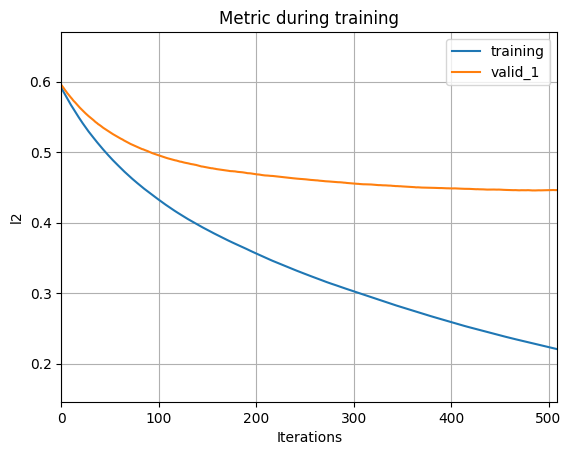

----> || Train Optimized QWK SCORE ::  0.818
----> || Val Optimized QWK SCORE ::  0.501
----> || Train Optimized Val QWK SCORE ::  0.490
----> || Val Optimized Train QWK SCORE ::  0.808
Fold 1 - Rounded Train QWK: 0.7037, Rounded Validation QWK: 0.3488


<Figure size 640x480 with 0 Axes>

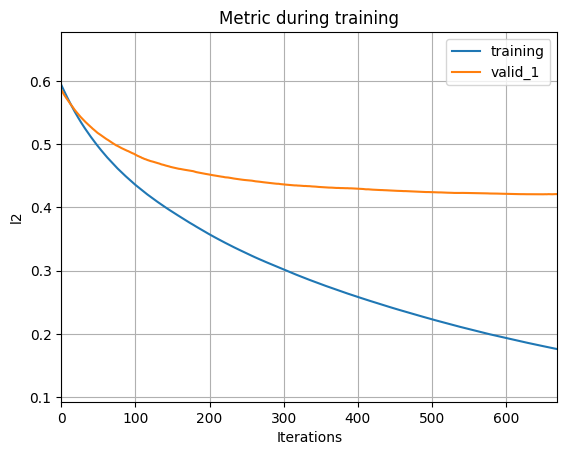

----> || Train Optimized QWK SCORE ::  0.863
----> || Val Optimized QWK SCORE ::  0.484
----> || Train Optimized Val QWK SCORE ::  0.464
----> || Val Optimized Train QWK SCORE ::  0.828
Fold 2 - Rounded Train QWK: 0.7753, Rounded Validation QWK: 0.4307


<Figure size 640x480 with 0 Axes>

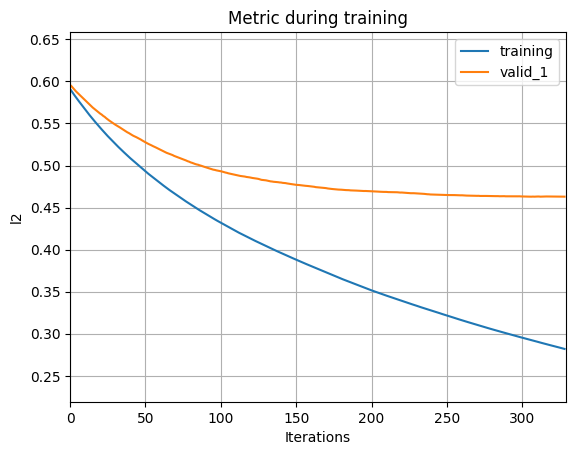

----> || Train Optimized QWK SCORE ::  0.754
----> || Val Optimized QWK SCORE ::  0.366
----> || Train Optimized Val QWK SCORE ::  0.447
----> || Val Optimized Train QWK SCORE ::  0.650
Fold 3 - Rounded Train QWK: 0.6232, Rounded Validation QWK: 0.3466


<Figure size 640x480 with 0 Axes>

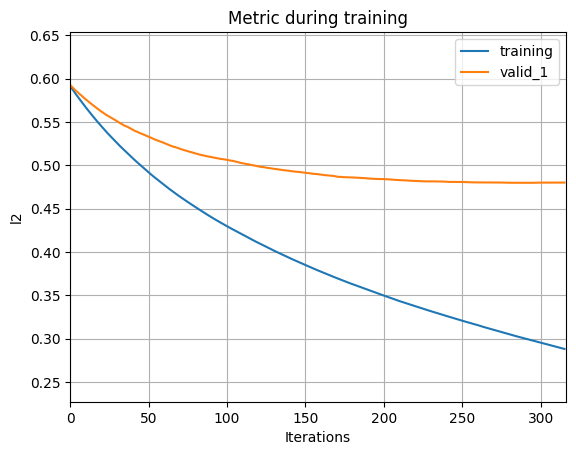

----> || Train Optimized QWK SCORE ::  0.751
----> || Val Optimized QWK SCORE ::  0.352
----> || Train Optimized Val QWK SCORE ::  0.423
----> || Val Optimized Train QWK SCORE ::  0.637
Fold 4 - Rounded Train QWK: 0.6226, Rounded Validation QWK: 0.3375


<Figure size 640x480 with 0 Axes>

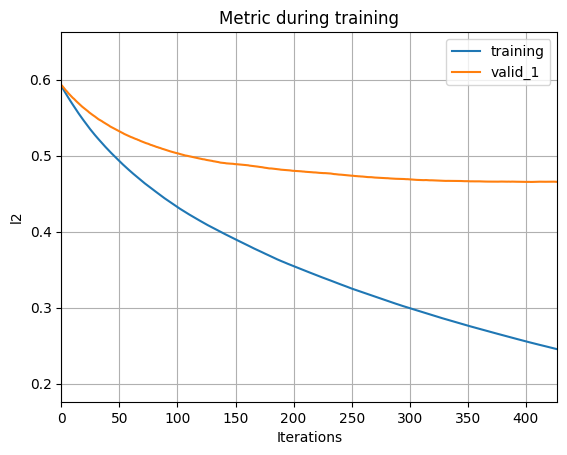

----> || Train Optimized QWK SCORE ::  0.789
----> || Val Optimized QWK SCORE ::  0.440
----> || Train Optimized Val QWK SCORE ::  0.436
----> || Val Optimized Train QWK SCORE ::  0.776
Fold 5 - Rounded Train QWK: 0.6727, Rounded Validation QWK: 0.3288
Mean Train QWK --> 0.7950
Mean Validation QWK ---> 0.4288
----> || Optimized QWK SCORE ::  0.471


In [153]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_final_df, test_final_df, 150)

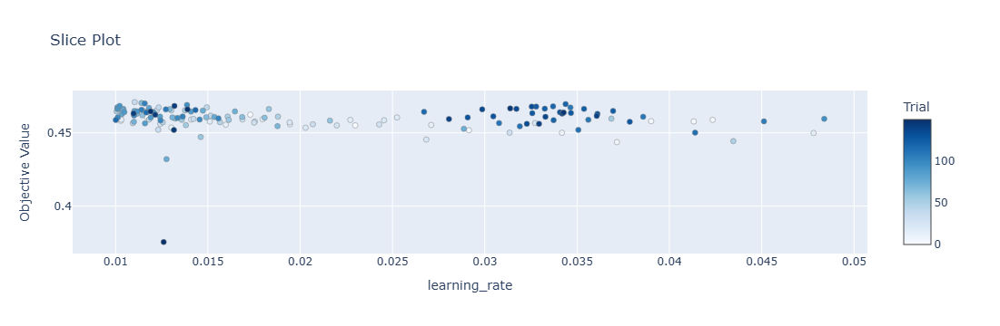

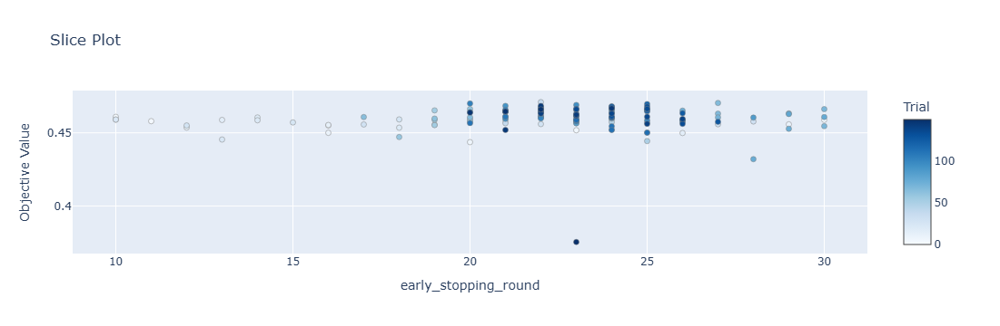

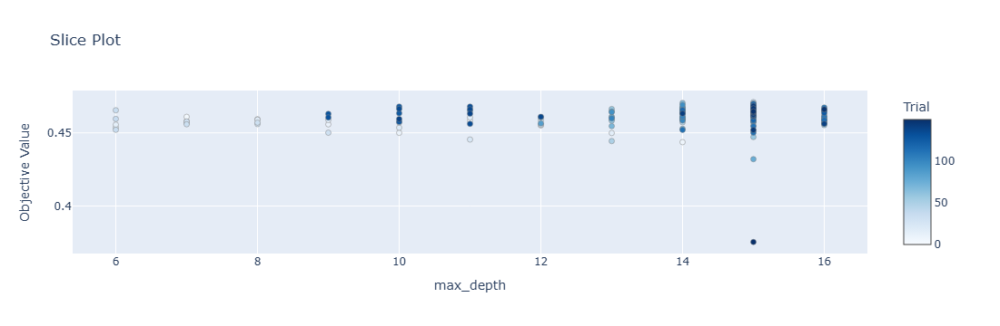

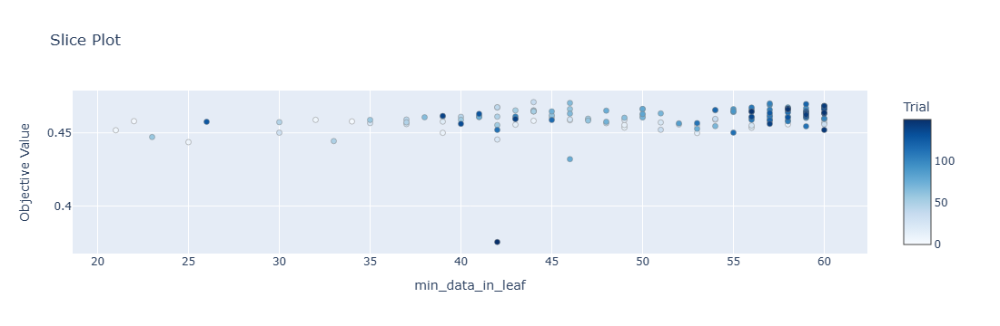

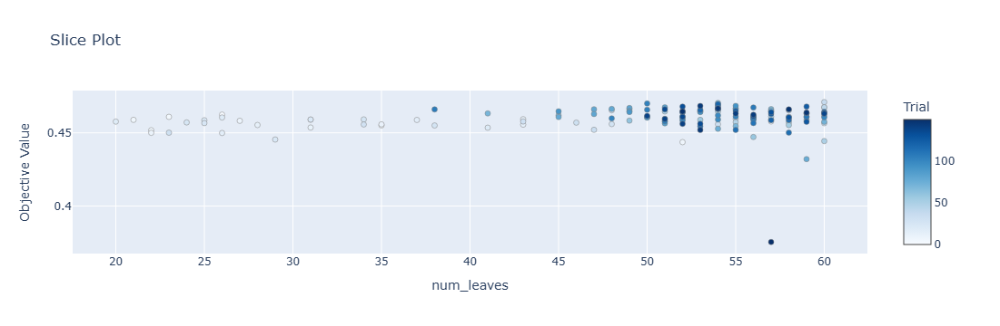

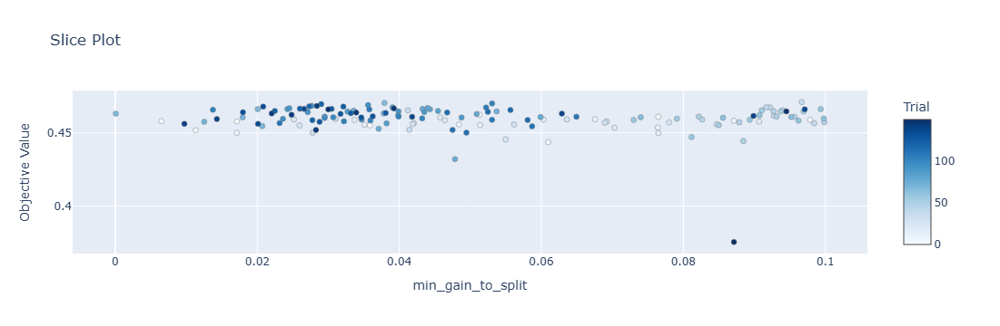

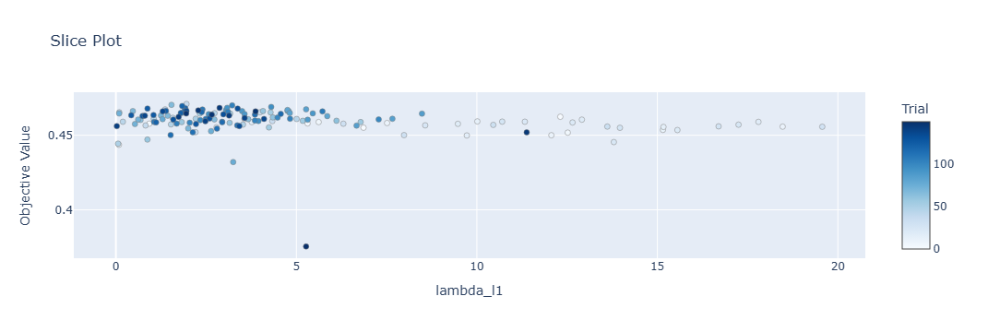

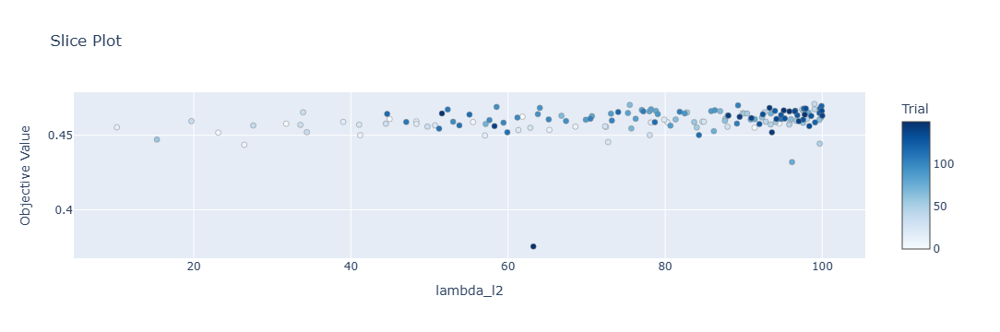

In [155]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

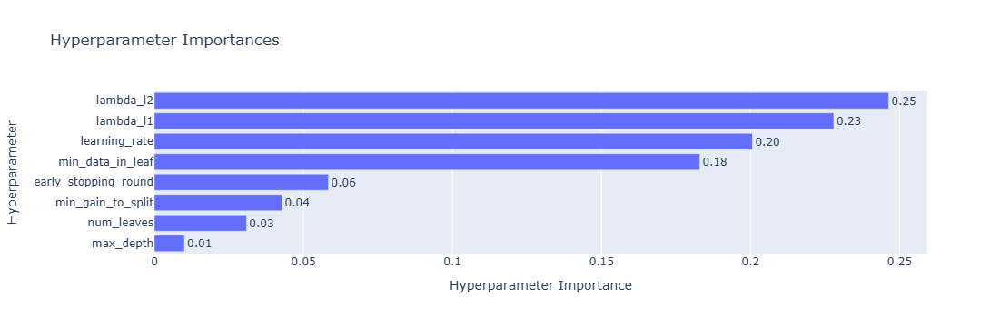

In [156]:
plot_param_importances(lgb_optuna_study)

In [157]:
lgb_optuna_study.best_params

{'learning_rate': 0.011035507860347868,
 'early_stopping_round': 22,
 'max_depth': 15,
 'min_data_in_leaf': 44,
 'num_leaves': 60,
 'min_gain_to_split': 0.09668177513526403,
 'lambda_l1': 1.9558036802657792,
 'lambda_l2': 98.99542014893959}

In [159]:
cols = train_final_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)

In [160]:
imp_df

,Feature,Importance
59,SDS-SDS_Total_Raw,366.2
58,PreInt_EduHx-computerinternet_hoursday,241.8
51,Physical-Height,134.6
9,Basic_Demos-Age,100.2
26,FGC-FGC_PU,84.2
...,...,...
1101,enmo_weekday_5_min,0.0
987,enmo_time_of_day_hour_window_15_min,0.0
998,enmo_time_of_day_hour_window_18_min,0.0
15,CGAS-Season_Fall,0.0


In [161]:
imp_df['Importance'].describe()

count    1338.000000
mean        8.537369
std        14.720958
min         0.000000
25%         3.400000
50%         6.000000
75%         9.800000
max       366.200000
Name: Importance, dtype: float64

<Axes: xlabel='Importance', ylabel='Count'>

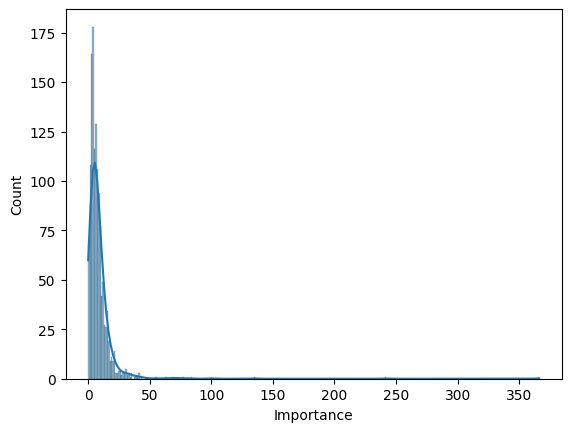

In [162]:
sns.histplot(imp_df['Importance'], kde=True)

In [190]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]

In [191]:
print(unimportant_df.shape)
unimportant_df

(654, 2)


,Feature,Importance
42,PAQ_A-Season_Summer,5.8
383,Y_time_of_day_hour_window_3_min,5.8
620,Z_time_of_day_hour_window_7_max,5.8
325,Y_time_of_day_hour_window_18_entropy,5.8
148,X_time_of_day_hour_window_22_std,5.8
...,...,...
1101,enmo_weekday_5_min,0.0
987,enmo_time_of_day_hour_window_15_min,0.0
998,enmo_time_of_day_hour_window_18_min,0.0
15,CGAS-Season_Fall,0.0


In [192]:
unimportant_df['Importance'].describe()

count    654.000000
mean       3.254128
std        1.539736
min        0.000000
25%        2.200000
50%        3.400000
75%        4.600000
max        5.800000
Name: Importance, dtype: float64

<Axes: xlabel='Importance', ylabel='Count'>

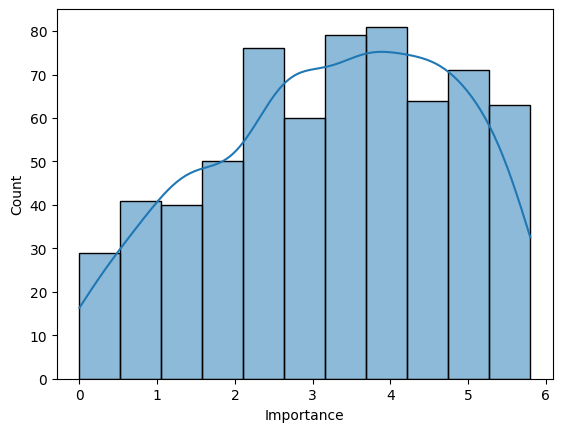

In [193]:
sns.histplot(unimportant_df['Importance'], kde=True)

In [194]:
unimportant_cols = unimportant_df['Feature'].tolist()

In [195]:
train_selected_df = train_final_df.drop(unimportant_cols, axis=1)
print(train_selected_df.shape)
train_selected_df.head()

(2736, 686)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,X_max,Y_3%,Y_95%,Y_99%,Z_std,Z_99%,Z_max,enmo_mean,anglez_min,anglez_max,light_mean,light_1%,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_10%,X_weekday_1_mean,X_weekday_2_max,X_weekday_2_sum,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_max,X_weekday_3_sum,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_sum,X_weekday_5_mean,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_max,X_weekday_7_mean,Y_weekday_1_mean,Y_weekday_1_min,Y_weekday_1_sum,Y_weekday_2_mean,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_min,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_1%,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_70%,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_std,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_sum,Z_weekday_7_mean,Z_weekday_7_min,Z_weekday_7_sum,enmo_weekday_1_mean,enmo_weekday_1_1%,enmo_weekday_1_15%,enmo_weekday_2_mean,enmo_weekday_2_sum,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_sum,enmo_weekday_4_mean,enmo_weekday_4_std,enmo_weekday_6_10%,enmo_weekday_7_20%,anglez_weekday_3_min,anglez_weekday_3_max,anglez_weekday_3_entropy,anglez_weekday_4_min,anglez_weekday_4_entropy,anglez_weekday_5_entropy,light_weekday_2_10%,light_weekday_2_95%,light_weekday_3_mean,light_weekday_3_15%,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_70%,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_max,light_weekday_5_sum,light_weekday_6_sum,light_weekday_7_mean,light_weekday_7_65%,light_weekday_7_max,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_25%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_1_max,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_25%,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_std,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_3_97%,battery_use_since_wear_weekday_4_std,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_1%,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_min,battery_use_since_wear_weekday_5_20%,battery_use_since_wear_weekday_5_25%,battery_use_since_wear_weekday_5_30%,battery_use_since_wear_weekday_5_35%,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_15%,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_25%,battery_use_since_wear_weekday_6_30%,battery_use_since_wear_weekday_6_55%,battery_u

In [196]:
test_selected_df = test_final_df.drop(unimportant_cols, axis=1)
print(test_selected_df.shape)
test_selected_df.head()

(20, 685)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Max_Stage,Fitness_Endurance-Time_Mins,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_SRL,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,X_max,Y_3%,Y_95%,Y_99%,Z_std,Z_99%,Z_max,enmo_mean,anglez_min,anglez_max,light_mean,light_1%,battery_use_since_wear_std,battery_use_since_wear_min,battery_use_since_wear_1%,battery_use_since_wear_10%,X_weekday_1_mean,X_weekday_2_max,X_weekday_2_sum,X_weekday_3_mean,X_weekday_3_min,X_weekday_3_max,X_weekday_3_sum,X_weekday_4_mean,X_weekday_4_std,X_weekday_4_min,X_weekday_4_1%,X_weekday_4_sum,X_weekday_5_mean,X_weekday_5_sum,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_max,X_weekday_7_mean,Y_weekday_1_mean,Y_weekday_1_min,Y_weekday_1_sum,Y_weekday_2_mean,Y_weekday_2_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_min,Y_weekday_3_entropy,Y_weekday_4_mean,Y_weekday_4_1%,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_mean,Y_weekday_5_70%,Y_weekday_5_entropy,Y_weekday_6_mean,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_std,Y_weekday_7_1%,Y_weekday_7_max,Y_weekday_7_entropy,Z_weekday_1_mean,Z_weekday_1_std,Z_weekday_1_min,Z_weekday_1_15%,Z_weekday_1_max,Z_weekday_1_sum,Z_weekday_2_std,Z_weekday_2_min,Z_weekday_2_1%,Z_weekday_2_3%,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_min,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_4_sum,Z_weekday_4_entropy,Z_weekday_5_std,Z_weekday_5_min,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_5_entropy,Z_weekday_6_mean,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_6_sum,Z_weekday_7_mean,Z_weekday_7_min,Z_weekday_7_sum,enmo_weekday_1_mean,enmo_weekday_1_1%,enmo_weekday_1_15%,enmo_weekday_2_mean,enmo_weekday_2_sum,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_3_sum,enmo_weekday_4_mean,enmo_weekday_4_std,enmo_weekday_6_10%,enmo_weekday_7_20%,anglez_weekday_3_min,anglez_weekday_3_max,anglez_weekday_3_entropy,anglez_weekday_4_min,anglez_weekday_4_entropy,anglez_weekday_5_entropy,light_weekday_2_10%,light_weekday_2_95%,light_weekday_3_mean,light_weekday_3_15%,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_70%,light_weekday_4_max,light_weekday_4_entropy,light_weekday_5_max,light_weekday_5_sum,light_weekday_6_sum,light_weekday_7_mean,light_weekday_7_65%,light_weekday_7_max,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_std,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_25%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_1_max,battery_use_since_wear_weekday_2_std,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_25%,battery_use_since_wear_weekday_2_30%,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_std,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_3_97%,battery_use_since_wear_weekday_4_std,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_1%,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_4_max,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_min,battery_use_since_wear_weekday_5_20%,battery_use_since_wear_weekday_5_25%,battery_use_since_wear_weekday_5_30%,battery_use_since_wear_weekday_5_35%,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_15%,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_25%,battery_use_since_wear_weekday_6_30%,battery_use_since_wear_weekday_6_55%,battery_u

[I 2024-12-13 23:04:27,871] A new study created in memory with name: no-name-0423f160-f03b-43f6-8238-f9f4f007a577
[I 2024-12-13 23:04:38,861] Trial 0 finished with value: 0.46915949832371784 and parameters: {'learning_rate': 0.018943569350222268, 'early_stopping_round': 27, 'max_depth': 9, 'min_data_in_leaf': 61, 'num_leaves': 69, 'min_gain_to_split': 0.17411441773032538, 'lambda_l1': 0.5905284470626665, 'lambda_l2': 76.24274609853187}. Best is trial 0 with value: 0.46915949832371784.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:04:53,546] Trial 1 finished with value: 0.4606829908360952 and parameters: {'learning_rate': 0.011858622520867628, 'early_stopping_round': 21, 'max_depth': 9, 'min_data_in_leaf': 61, 'num_leaves': 57, 'min_gain_to_split': 0.020936381337401146, 'lambda_l1': 3.5939461899889973, 'lambda_l2': 40.2357987722176}. Best is trial 0 with value: 0.46915949832371784.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 23:05:06,401] Trial 2 finished with value: 0.4713183327026781 and parameters: {'learning_rate': 0.01159009671869519, 'early_stopping_round': 11, 'max_depth': 14, 'min_data_in_leaf': 54, 'num_leaves': 51, 'min_gain_to_split': 0.10926221965373994, 'lambda_l1': 2.702969237201964, 'lambda_l2': 72.41605777013524}. Best is trial 2 with value: 0.4713183327026781.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:05:20,938] Trial 3 finished with value: 0.4735790765275567 and parameters: {'learning_rate': 0.015137016603867397, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 67, 'num_leaves': 93, 'min_gain_to_split': 0.07052588376903964, 'lambda_l1': 1.2288934406063428, 'lambda_l2': 161.25318318636732}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:05:27,461] Trial 4 finished with value: 0.4623538251391718 and parameters: {'learning_rate': 0.04013358505502883, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 46, 'num_leaves': 51, 'min_gain_to_split': 0.17623974156209277, 'lambda_l1': 4.018435000283837, 'lambda_l2': 180.07838632090588}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.462


[I 2024-12-13 23:05:35,853] Trial 5 finished with value: 0.46043815465549676 and parameters: {'learning_rate': 0.028495336676674282, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 55, 'num_leaves': 90, 'min_gain_to_split': 0.1615245640090519, 'lambda_l1': 2.0426952741644837, 'lambda_l2': 134.44537887877186}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 23:05:46,106] Trial 6 finished with value: 0.46435423280321975 and parameters: {'learning_rate': 0.02679272299453094, 'early_stopping_round': 20, 'max_depth': 8, 'min_data_in_leaf': 53, 'num_leaves': 59, 'min_gain_to_split': 0.08451116327289741, 'lambda_l1': 4.973489010460424, 'lambda_l2': 195.46884479178948}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 23:05:59,907] Trial 7 finished with value: 0.469249983375838 and parameters: {'learning_rate': 0.011896883546298294, 'early_stopping_round': 14, 'max_depth': 6, 'min_data_in_leaf': 66, 'num_leaves': 80, 'min_gain_to_split': 0.06959147361083506, 'lambda_l1': 3.133648578184926, 'lambda_l2': 169.69485229218822}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:06:07,444] Trial 8 finished with value: 0.45514250701867054 and parameters: {'learning_rate': 0.04548148624812392, 'early_stopping_round': 28, 'max_depth': 11, 'min_data_in_leaf': 47, 'num_leaves': 91, 'min_gain_to_split': 0.06931657495589437, 'lambda_l1': 2.033674527866463, 'lambda_l2': 42.92569163428246}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.455


[I 2024-12-13 23:06:13,966] Trial 9 finished with value: 0.4707950755697533 and parameters: {'learning_rate': 0.03652135978419437, 'early_stopping_round': 14, 'max_depth': 9, 'min_data_in_leaf': 66, 'num_leaves': 95, 'min_gain_to_split': 0.02516299354552605, 'lambda_l1': 3.803023338356995, 'lambda_l2': 194.23967002528383}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:06:25,123] Trial 10 finished with value: 0.46839189695047456 and parameters: {'learning_rate': 0.020525431714690446, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 70, 'num_leaves': 100, 'min_gain_to_split': 0.12355629784770718, 'lambda_l1': 0.01565499552039551, 'lambda_l2': 128.76196024959782}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:06:36,130] Trial 11 finished with value: 0.4588216291040087 and parameters: {'learning_rate': 0.019033605787938744, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 40, 'num_leaves': 78, 'min_gain_to_split': 0.1150471954034421, 'lambda_l1': 1.2345208835144161, 'lambda_l2': 89.91607248934244}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.459


[I 2024-12-13 23:06:52,099] Trial 12 finished with value: 0.4685831127558995 and parameters: {'learning_rate': 0.011911809984860359, 'early_stopping_round': 10, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 67, 'min_gain_to_split': 0.13491048754462606, 'lambda_l1': 1.4332651993992624, 'lambda_l2': 152.638084867714}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:07:02,203] Trial 13 finished with value: 0.46924639798154166 and parameters: {'learning_rate': 0.022616127309564794, 'early_stopping_round': 17, 'max_depth': 13, 'min_data_in_leaf': 51, 'num_leaves': 85, 'min_gain_to_split': 0.05149557514851664, 'lambda_l1': 2.726143631640989, 'lambda_l2': 101.29979063940047}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:07:14,837] Trial 14 finished with value: 0.4641852781729149 and parameters: {'learning_rate': 0.01594736912704872, 'early_stopping_round': 30, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 72, 'min_gain_to_split': 0.09826297655270036, 'lambda_l1': 1.3105685721103166, 'lambda_l2': 74.89617638983103}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 23:07:22,589] Trial 15 finished with value: 0.46665059328017633 and parameters: {'learning_rate': 0.035517529926394106, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 50, 'num_leaves': 50, 'min_gain_to_split': 0.14359197645958746, 'lambda_l1': 2.202324564224285, 'lambda_l2': 146.3527175852721}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:07:28,397] Trial 16 finished with value: 0.4652899384261452 and parameters: {'learning_rate': 0.04999510577226059, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 65, 'num_leaves': 62, 'min_gain_to_split': 0.0012686895475701593, 'lambda_l1': 0.7239896455404577, 'lambda_l2': 113.87663956879479}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 23:07:37,535] Trial 17 finished with value: 0.455733310997571 and parameters: {'learning_rate': 0.024896269149633297, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 41, 'num_leaves': 84, 'min_gain_to_split': 0.19838478295891582, 'lambda_l1': 2.7180244648845764, 'lambda_l2': 60.75219590539548}. Best is trial 3 with value: 0.4735790765275567.


----> || Optimized QWK SCORE ::  0.456


[I 2024-12-13 23:07:49,723] Trial 18 finished with value: 0.47467352267530105 and parameters: {'learning_rate': 0.01578862916015957, 'early_stopping_round': 13, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 100, 'min_gain_to_split': 0.05052912281130395, 'lambda_l1': 1.6756859904071928, 'lambda_l2': 162.29460928078618}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:07:56,544] Trial 19 finished with value: 0.4728647502629465 and parameters: {'learning_rate': 0.032729458416011055, 'early_stopping_round': 13, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 100, 'min_gain_to_split': 0.045413131334638715, 'lambda_l1': 1.6703263718765187, 'lambda_l2': 163.2840439989617}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:08:11,325] Trial 20 finished with value: 0.46929841970072406 and parameters: {'learning_rate': 0.015865490415531355, 'early_stopping_round': 17, 'max_depth': 12, 'min_data_in_leaf': 63, 'num_leaves': 94, 'min_gain_to_split': 0.04612276751923346, 'lambda_l1': 0.7189808333294759, 'lambda_l2': 175.27912672297097}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:08:18,161] Trial 21 finished with value: 0.4686214521908889 and parameters: {'learning_rate': 0.03328298337034952, 'early_stopping_round': 13, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 99, 'min_gain_to_split': 0.04131868536813203, 'lambda_l1': 1.6644722408394028, 'lambda_l2': 158.59922491911024}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:08:24,955] Trial 22 finished with value: 0.46662665866506636 and parameters: {'learning_rate': 0.03185386548557709, 'early_stopping_round': 16, 'max_depth': 10, 'min_data_in_leaf': 68, 'num_leaves': 96, 'min_gain_to_split': 0.07038312090108731, 'lambda_l1': 1.6749136184049347, 'lambda_l2': 143.89528803628224}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:08:32,664] Trial 23 finished with value: 0.47292242936641504 and parameters: {'learning_rate': 0.024059475557407718, 'early_stopping_round': 12, 'max_depth': 11, 'min_data_in_leaf': 68, 'num_leaves': 89, 'min_gain_to_split': 0.02546344464801922, 'lambda_l1': 0.9911084527468197, 'lambda_l2': 163.74656808278732}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:08:45,474] Trial 24 finished with value: 0.4685135998386175 and parameters: {'learning_rate': 0.015776691516307118, 'early_stopping_round': 12, 'max_depth': 11, 'min_data_in_leaf': 64, 'num_leaves': 86, 'min_gain_to_split': 0.0018390584397607705, 'lambda_l1': 0.044186463646546104, 'lambda_l2': 185.91255038599002}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:08:54,563] Trial 25 finished with value: 0.470255597422196 and parameters: {'learning_rate': 0.023085316772091576, 'early_stopping_round': 15, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 90, 'min_gain_to_split': 0.023635269825385705, 'lambda_l1': 0.9834230234288135, 'lambda_l2': 136.59558326639828}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:09:09,000] Trial 26 finished with value: 0.46583027114000564 and parameters: {'learning_rate': 0.015214047084195579, 'early_stopping_round': 19, 'max_depth': 10, 'min_data_in_leaf': 62, 'num_leaves': 93, 'min_gain_to_split': 0.08153443570182196, 'lambda_l1': 0.3868428055070523, 'lambda_l2': 120.63372459003327}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:09:19,197] Trial 27 finished with value: 0.47319768238032944 and parameters: {'learning_rate': 0.02092124364553084, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 68, 'num_leaves': 87, 'min_gain_to_split': 0.09407142914773821, 'lambda_l1': 1.04001617947266, 'lambda_l2': 171.74997797274392}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:09:31,779] Trial 28 finished with value: 0.47130447665759534 and parameters: {'learning_rate': 0.020455343974425715, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 80, 'min_gain_to_split': 0.09650117144261801, 'lambda_l1': 2.2235400842843087, 'lambda_l2': 183.10605107154493}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:09:44,813] Trial 29 finished with value: 0.47220081237863265 and parameters: {'learning_rate': 0.017694301202965605, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 61, 'num_leaves': 97, 'min_gain_to_split': 0.06069065752584574, 'lambda_l1': 0.5300169294272437, 'lambda_l2': 147.65328233516152}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:10:06,019] Trial 30 finished with value: 0.47088866550582 and parameters: {'learning_rate': 0.010098942779909807, 'early_stopping_round': 28, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 82, 'min_gain_to_split': 0.08729625077298869, 'lambda_l1': 0.9569892437834117, 'lambda_l2': 171.77408841722297}. Best is trial 18 with value: 0.47467352267530105.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:10:15,819] Trial 31 finished with value: 0.47542949609683804 and parameters: {'learning_rate': 0.02422095763703591, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 90, 'min_gain_to_split': 0.03190493737367961, 'lambda_l1': 1.139634291955229, 'lambda_l2': 163.35366335835033}. Best is trial 31 with value: 0.47542949609683804.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:10:24,978] Trial 32 finished with value: 0.4794598606914443 and parameters: {'learning_rate': 0.02682533771807807, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 87, 'min_gain_to_split': 0.037280669273032314, 'lambda_l1': 1.4807676196240775, 'lambda_l2': 156.52252240131222}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:10:33,240] Trial 33 finished with value: 0.4750705234719448 and parameters: {'learning_rate': 0.027239436413784852, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 75, 'min_gain_to_split': 0.03602784020049982, 'lambda_l1': 1.7951301349111715, 'lambda_l2': 159.0737034589289}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:10:41,647] Trial 34 finished with value: 0.47152304009025314 and parameters: {'learning_rate': 0.028712865934225063, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 70, 'num_leaves': 75, 'min_gain_to_split': 0.03598767256808289, 'lambda_l1': 1.8287530028557013, 'lambda_l2': 140.67150431314525}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:10:50,326] Trial 35 finished with value: 0.47311469035767595 and parameters: {'learning_rate': 0.02632968778757372, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 74, 'min_gain_to_split': 0.01685254352724576, 'lambda_l1': 2.3705387440141745, 'lambda_l2': 154.54300285604188}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:10:59,607] Trial 36 finished with value: 0.4761100155463994 and parameters: {'learning_rate': 0.029141835804339, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 65, 'min_gain_to_split': 0.03437210195466098, 'lambda_l1': 3.133691091625731, 'lambda_l2': 123.5304619612021}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:11:08,049] Trial 37 finished with value: 0.47058919267889987 and parameters: {'learning_rate': 0.03050657938158596, 'early_stopping_round': 21, 'max_depth': 10, 'min_data_in_leaf': 60, 'num_leaves': 66, 'min_gain_to_split': 0.00915582419205908, 'lambda_l1': 3.1533344884357466, 'lambda_l2': 111.51961263952106}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:11:17,423] Trial 38 finished with value: 0.46490864248735364 and parameters: {'learning_rate': 0.026626214845957737, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 56, 'num_leaves': 54, 'min_gain_to_split': 0.033389386930221615, 'lambda_l1': 4.341981743469229, 'lambda_l2': 130.8288683426483}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 23:11:26,072] Trial 39 finished with value: 0.47197413998828486 and parameters: {'learning_rate': 0.028747204609038388, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 70, 'min_gain_to_split': 0.014257488278907497, 'lambda_l1': 3.335380351120893, 'lambda_l2': 125.10870799222411}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:11:31,619] Trial 40 finished with value: 0.4650870982050668 and parameters: {'learning_rate': 0.039292555201584645, 'early_stopping_round': 22, 'max_depth': 6, 'min_data_in_leaf': 65, 'num_leaves': 64, 'min_gain_to_split': 0.05862074633432666, 'lambda_l1': 2.5139344526140697, 'lambda_l2': 93.0637628575645}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 23:11:39,354] Trial 41 finished with value: 0.4771237986732575 and parameters: {'learning_rate': 0.030300203980509772, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 77, 'min_gain_to_split': 0.03317011312969277, 'lambda_l1': 1.9103189135017609, 'lambda_l2': 163.93009415893107}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:11:47,039] Trial 42 finished with value: 0.47328194831271453 and parameters: {'learning_rate': 0.03504642925742838, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 78, 'min_gain_to_split': 0.03387351406151517, 'lambda_l1': 1.9082401137089837, 'lambda_l2': 189.14345107880956}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:11:54,960] Trial 43 finished with value: 0.47627471580704317 and parameters: {'learning_rate': 0.03046415623611748, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 70, 'min_gain_to_split': 0.05679180249082867, 'lambda_l1': 2.898156624447117, 'lambda_l2': 178.90329602357014}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:12:03,290] Trial 44 finished with value: 0.4657748761257752 and parameters: {'learning_rate': 0.03008446619501651, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 66, 'num_leaves': 60, 'min_gain_to_split': 0.02723752486017124, 'lambda_l1': 3.4623315875097203, 'lambda_l2': 178.88852368683715}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:12:10,772] Trial 45 finished with value: 0.4658992035339 and parameters: {'learning_rate': 0.03921379417174071, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 58, 'num_leaves': 69, 'min_gain_to_split': 0.05436823096039837, 'lambda_l1': 2.9780178117075584, 'lambda_l2': 191.86089267034112}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:12:18,682] Trial 46 finished with value: 0.46563984561281146 and parameters: {'learning_rate': 0.031216034895477123, 'early_stopping_round': 20, 'max_depth': 7, 'min_data_in_leaf': 62, 'num_leaves': 71, 'min_gain_to_split': 0.010019682071025066, 'lambda_l1': 3.794950774896545, 'lambda_l2': 198.90287163378488}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:12:29,371] Trial 47 finished with value: 0.46035528032502315 and parameters: {'learning_rate': 0.025554694504212532, 'early_stopping_round': 25, 'max_depth': 10, 'min_data_in_leaf': 53, 'num_leaves': 66, 'min_gain_to_split': 0.06209817853703781, 'lambda_l1': 1.4316820798469874, 'lambda_l2': 150.7032044813474}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 23:12:37,593] Trial 48 finished with value: 0.4698028692443337 and parameters: {'learning_rate': 0.02810702364530913, 'early_stopping_round': 18, 'max_depth': 11, 'min_data_in_leaf': 64, 'num_leaves': 78, 'min_gain_to_split': 0.07544347375512316, 'lambda_l1': 4.251179839002528, 'lambda_l2': 168.6384140940771}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:12:46,091] Trial 49 finished with value: 0.47002781017314077 and parameters: {'learning_rate': 0.03410713896572902, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 55, 'min_gain_to_split': 0.04195627780883026, 'lambda_l1': 2.9079712519724397, 'lambda_l2': 179.17347953312427}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:12:54,180] Trial 50 finished with value: 0.47075208913649025 and parameters: {'learning_rate': 0.0377392594488547, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 88, 'min_gain_to_split': 0.019598174782915645, 'lambda_l1': 2.474701651671131, 'lambda_l2': 137.70807358305294}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:13:03,408] Trial 51 finished with value: 0.4683908727516206 and parameters: {'learning_rate': 0.027677063498346834, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 74, 'min_gain_to_split': 0.0351333726381345, 'lambda_l1': 2.1962778029503918, 'lambda_l2': 157.82931030150024}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:13:12,965] Trial 52 finished with value: 0.4739086333067738 and parameters: {'learning_rate': 0.02288164988418396, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 72, 'min_gain_to_split': 0.02858037626633659, 'lambda_l1': 1.4839606661150646, 'lambda_l2': 167.53979869914667}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:13:21,231] Trial 53 finished with value: 0.46597648847622297 and parameters: {'learning_rate': 0.0292366368838044, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 82, 'min_gain_to_split': 0.04271095961951357, 'lambda_l1': 1.966689466395959, 'lambda_l2': 153.21310178518377}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:13:30,509] Trial 54 finished with value: 0.4713871308016877 and parameters: {'learning_rate': 0.0245809101424118, 'early_stopping_round': 21, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 92, 'min_gain_to_split': 0.05414454571496299, 'lambda_l1': 1.2552395027130268, 'lambda_l2': 177.2582090886907}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:13:38,062] Trial 55 finished with value: 0.46933990587239593 and parameters: {'learning_rate': 0.031973818708609436, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 68, 'min_gain_to_split': 0.10986822216729486, 'lambda_l1': 2.6040859887727823, 'lambda_l2': 107.27867354538203}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:13:48,067] Trial 56 finished with value: 0.46863812230088786 and parameters: {'learning_rate': 0.026910581401054495, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 48, 'num_leaves': 63, 'min_gain_to_split': 0.048735196597539054, 'lambda_l1': 2.780820791142435, 'lambda_l2': 63.26926293311757}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:13:54,227] Trial 57 finished with value: 0.478132582181354 and parameters: {'learning_rate': 0.04237480759582479, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 77, 'min_gain_to_split': 0.0633360058531833, 'lambda_l1': 2.089692632432273, 'lambda_l2': 157.89169371049044}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:14:02,709] Trial 58 finished with value: 0.4595891255735636 and parameters: {'learning_rate': 0.042389236071931256, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 43, 'num_leaves': 84, 'min_gain_to_split': 0.0637229873259954, 'lambda_l1': 3.196221374441473, 'lambda_l2': 166.9027414756497}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 23:14:10,172] Trial 59 finished with value: 0.47282034981320953 and parameters: {'learning_rate': 0.03629783615291424, 'early_stopping_round': 19, 'max_depth': 9, 'min_data_in_leaf': 63, 'num_leaves': 78, 'min_gain_to_split': 0.07815848927159216, 'lambda_l1': 2.0879372781273915, 'lambda_l2': 144.16239964203453}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:14:16,432] Trial 60 finished with value: 0.4638891607043154 and parameters: {'learning_rate': 0.04371662535229424, 'early_stopping_round': 17, 'max_depth': 11, 'min_data_in_leaf': 65, 'num_leaves': 81, 'min_gain_to_split': 0.067646581424824, 'lambda_l1': 3.6904773624558587, 'lambda_l2': 173.87941972718625}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.464


[I 2024-12-13 23:14:24,508] Trial 61 finished with value: 0.47455981897776434 and parameters: {'learning_rate': 0.030471351328858948, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 76, 'min_gain_to_split': 0.03609274768730477, 'lambda_l1': 1.7992257639493383, 'lambda_l2': 162.59857014945064}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:14:30,274] Trial 62 finished with value: 0.46787501594907643 and parameters: {'learning_rate': 0.045536046841070106, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 73, 'min_gain_to_split': 0.029356514187137965, 'lambda_l1': 1.5266391082417128, 'lambda_l2': 158.13274155453394}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:14:37,005] Trial 63 finished with value: 0.4742823110910803 and parameters: {'learning_rate': 0.04916430956827972, 'early_stopping_round': 21, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 76, 'min_gain_to_split': 0.03973361838202379, 'lambda_l1': 2.373213266343438, 'lambda_l2': 184.6910013882706}. Best is trial 32 with value: 0.4794598606914443.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:14:46,988] Trial 64 finished with value: 0.4797821712751279 and parameters: {'learning_rate': 0.02143289726404203, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 60, 'min_gain_to_split': 0.048174922110473126, 'lambda_l1': 1.1380655818147358, 'lambda_l2': 150.8351779783935}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:14:57,812] Trial 65 finished with value: 0.47178738105678275 and parameters: {'learning_rate': 0.01912763093920488, 'early_stopping_round': 18, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 60, 'min_gain_to_split': 0.04884658756841842, 'lambda_l1': 1.3200751334104224, 'lambda_l2': 150.66261625158165}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:15:08,463] Trial 66 finished with value: 0.47150710178821464 and parameters: {'learning_rate': 0.02185856567697702, 'early_stopping_round': 20, 'max_depth': 11, 'min_data_in_leaf': 62, 'num_leaves': 57, 'min_gain_to_split': 0.058026487554364424, 'lambda_l1': 1.119816787336988, 'lambda_l2': 135.04207229423042}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:15:18,417] Trial 67 finished with value: 0.47581522720600566 and parameters: {'learning_rate': 0.023421370993331147, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 64, 'num_leaves': 64, 'min_gain_to_split': 0.1607806813867237, 'lambda_l1': 0.6441396570001898, 'lambda_l2': 126.49195985609883}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:15:33,202] Trial 68 finished with value: 0.470258336745776 and parameters: {'learning_rate': 0.013115363086611587, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 64, 'min_gain_to_split': 0.15530106537132182, 'lambda_l1': 0.45868172533606755, 'lambda_l2': 128.9951756360057}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:15:45,366] Trial 69 finished with value: 0.47093854793745715 and parameters: {'learning_rate': 0.017465003889919305, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 62, 'min_gain_to_split': 0.18591631639895093, 'lambda_l1': 0.7752585893266776, 'lambda_l2': 140.4645799925991}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:15:55,170] Trial 70 finished with value: 0.4668648819652571 and parameters: {'learning_rate': 0.0257593761934864, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 66, 'min_gain_to_split': 0.12155477005887932, 'lambda_l1': 0.1803616526970715, 'lambda_l2': 118.32591174528412}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:16:05,122] Trial 71 finished with value: 0.4731661224105598 and parameters: {'learning_rate': 0.023523522366016243, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 57, 'min_gain_to_split': 0.1454478841332566, 'lambda_l1': 0.7718430528661245, 'lambda_l2': 122.9330219105896}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:16:13,843] Trial 72 finished with value: 0.4677570675412013 and parameters: {'learning_rate': 0.02458063966280553, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 69, 'num_leaves': 68, 'min_gain_to_split': 0.17167765673537053, 'lambda_l1': 0.9116760887481189, 'lambda_l2': 100.54511796792971}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:16:23,906] Trial 73 finished with value: 0.4706078359123357 and parameters: {'learning_rate': 0.01980873047382079, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 62, 'min_gain_to_split': 0.04511195305834687, 'lambda_l1': 0.2931895672434851, 'lambda_l2': 146.91650672033205}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:16:34,436] Trial 74 finished with value: 0.4726270153314549 and parameters: {'learning_rate': 0.02103732699660412, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 68, 'num_leaves': 59, 'min_gain_to_split': 0.02486120029079822, 'lambda_l1': 1.6100248352501332, 'lambda_l2': 165.51420644182676}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:16:43,612] Trial 75 finished with value: 0.4695484497319449 and parameters: {'learning_rate': 0.02222923442035669, 'early_stopping_round': 16, 'max_depth': 13, 'min_data_in_leaf': 66, 'num_leaves': 70, 'min_gain_to_split': 0.08800392370763543, 'lambda_l1': 1.1282310630222738, 'lambda_l2': 156.21308604523077}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:16:51,142] Trial 76 finished with value: 0.4776878686797127 and parameters: {'learning_rate': 0.033330999183996894, 'early_stopping_round': 19, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 90, 'min_gain_to_split': 0.020191666301676306, 'lambda_l1': 0.6240293255609886, 'lambda_l2': 114.25219383890413}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:16:58,821] Trial 77 finished with value: 0.46997300525857955 and parameters: {'learning_rate': 0.033688797411345756, 'early_stopping_round': 19, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 65, 'min_gain_to_split': 0.0074572395519247325, 'lambda_l1': 0.807349142038156, 'lambda_l2': 114.21660164875377}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:17:07,799] Trial 78 finished with value: 0.46889624382216233 and parameters: {'learning_rate': 0.03138585868623187, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 84, 'min_gain_to_split': 0.02029351391146029, 'lambda_l1': 0.58599030965709, 'lambda_l2': 103.66957569385785}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:17:16,586] Trial 79 finished with value: 0.4691423028453634 and parameters: {'learning_rate': 0.029626517733407392, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 94, 'min_gain_to_split': 0.014909642218991017, 'lambda_l1': 2.994500585227779, 'lambda_l2': 92.18904740167864}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:17:24,492] Trial 80 finished with value: 0.46985887601448506 and parameters: {'learning_rate': 0.03263214554211039, 'early_stopping_round': 17, 'max_depth': 11, 'min_data_in_leaf': 64, 'num_leaves': 87, 'min_gain_to_split': 0.07368806401400083, 'lambda_l1': 0.6599658001577642, 'lambda_l2': 132.78051322711212}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:17:33,347] Trial 81 finished with value: 0.469537795222305 and parameters: {'learning_rate': 0.028173356864166627, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 60, 'num_leaves': 90, 'min_gain_to_split': 0.030354391680037486, 'lambda_l1': 1.1170098401459052, 'lambda_l2': 117.56981102260774}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:17:42,088] Trial 82 finished with value: 0.4699773975548437 and parameters: {'learning_rate': 0.0264464226834022, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 91, 'min_gain_to_split': 0.053399899615360825, 'lambda_l1': 1.3846286909787322, 'lambda_l2': 80.64934872213774}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:17:50,950] Trial 83 finished with value: 0.4771125197615078 and parameters: {'learning_rate': 0.025367258605489867, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 96, 'min_gain_to_split': 0.04040088798233814, 'lambda_l1': 2.08608316691724, 'lambda_l2': 124.4680925082425}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:18:02,014] Trial 84 finished with value: 0.4700935048238679 and parameters: {'learning_rate': 0.017796727917764203, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 95, 'min_gain_to_split': 0.039541441700539255, 'lambda_l1': 2.1580330867368724, 'lambda_l2': 108.86957794270053}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:18:10,845] Trial 85 finished with value: 0.4746142406919791 and parameters: {'learning_rate': 0.025417451535705536, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 98, 'min_gain_to_split': 0.0663036904376653, 'lambda_l1': 3.3173975758451952, 'lambda_l2': 124.12517838909352}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:18:19,008] Trial 86 finished with value: 0.468700296338462 and parameters: {'learning_rate': 0.027586701011927547, 'early_stopping_round': 16, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 96, 'min_gain_to_split': 0.020908245441833624, 'lambda_l1': 2.354271211219599, 'lambda_l2': 129.48877143500343}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:18:26,040] Trial 87 finished with value: 0.47064902377748274 and parameters: {'learning_rate': 0.029497814344868208, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 63, 'num_leaves': 61, 'min_gain_to_split': 0.10496278176908062, 'lambda_l1': 1.9402016959405766, 'lambda_l2': 114.33661612198767}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:18:34,119] Trial 88 finished with value: 0.47060657498181313 and parameters: {'learning_rate': 0.03473541439705181, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 64, 'min_gain_to_split': 0.047265745471470916, 'lambda_l1': 1.7508022381553516, 'lambda_l2': 126.74594694000584}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:18:43,993] Trial 89 finished with value: 0.45978036345962625 and parameters: {'learning_rate': 0.03109763806293577, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 54, 'num_leaves': 80, 'min_gain_to_split': 0.005329899809282779, 'lambda_l1': 2.828105665667224, 'lambda_l2': 141.54241844340368}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.460


[I 2024-12-13 23:18:49,961] Trial 90 finished with value: 0.46946151459565977 and parameters: {'learning_rate': 0.04762270862842795, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 68, 'min_gain_to_split': 0.038037435841803975, 'lambda_l1': 2.5527063672177666, 'lambda_l2': 170.7135865863682}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:18:59,702] Trial 91 finished with value: 0.4737642190813769 and parameters: {'learning_rate': 0.02361407126706919, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 86, 'min_gain_to_split': 0.03269499122307165, 'lambda_l1': 0.906716865872693, 'lambda_l2': 148.59709451120762}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:19:10,184] Trial 92 finished with value: 0.4746756261116959 and parameters: {'learning_rate': 0.021777466630881447, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 89, 'min_gain_to_split': 0.058073778165476944, 'lambda_l1': 1.5522463475938109, 'lambda_l2': 160.45734086667244}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:19:18,985] Trial 93 finished with value: 0.4721248531853527 and parameters: {'learning_rate': 0.024247287371740613, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 66, 'num_leaves': 91, 'min_gain_to_split': 0.02470615732703932, 'lambda_l1': 4.987107013510437, 'lambda_l2': 182.24782185155544}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:19:27,742] Trial 94 finished with value: 0.4683647695769031 and parameters: {'learning_rate': 0.02532955925013005, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 68, 'num_leaves': 92, 'min_gain_to_split': 0.04200046724348996, 'lambda_l1': 2.0310778713317115, 'lambda_l2': 120.35603152413806}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:19:35,703] Trial 95 finished with value: 0.46918333624407216 and parameters: {'learning_rate': 0.032709163052331056, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 65, 'num_leaves': 94, 'min_gain_to_split': 0.014683188290380737, 'lambda_l1': 1.2829393855737554, 'lambda_l2': 174.30140622946877}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:19:42,470] Trial 96 finished with value: 0.46917508733534485 and parameters: {'learning_rate': 0.040866035833173484, 'early_stopping_round': 21, 'max_depth': 8, 'min_data_in_leaf': 64, 'num_leaves': 71, 'min_gain_to_split': 0.029277627399657585, 'lambda_l1': 2.6339757478792096, 'lambda_l2': 188.27419101484804}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:19:50,009] Trial 97 finished with value: 0.4757007016948295 and parameters: {'learning_rate': 0.028623243371235167, 'early_stopping_round': 18, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 55, 'min_gain_to_split': 0.19825256586549578, 'lambda_l1': 0.3628434166985861, 'lambda_l2': 155.23541489402618}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:19:58,145] Trial 98 finished with value: 0.47316795187806704 and parameters: {'learning_rate': 0.0288846711574129, 'early_stopping_round': 18, 'max_depth': 11, 'min_data_in_leaf': 67, 'num_leaves': 55, 'min_gain_to_split': 0.194827304076254, 'lambda_l1': 0.28903913442593826, 'lambda_l2': 153.0756295988467}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:20:05,462] Trial 99 finished with value: 0.46794000188897467 and parameters: {'learning_rate': 0.027127855944966885, 'early_stopping_round': 17, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 51, 'min_gain_to_split': 0.17118167777999163, 'lambda_l1': 0.04687782422843756, 'lambda_l2': 137.23939248829203}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.468


[I 2024-12-13 23:20:12,460] Trial 100 finished with value: 0.46338961983618476 and parameters: {'learning_rate': 0.029955382847025327, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 62, 'num_leaves': 54, 'min_gain_to_split': 0.1811303848480997, 'lambda_l1': 0.4631114465980477, 'lambda_l2': 132.47443259281093}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 23:20:20,522] Trial 101 finished with value: 0.4756492335950634 and parameters: {'learning_rate': 0.026353809633788375, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 88, 'min_gain_to_split': 0.162697507827832, 'lambda_l1': 0.635826440333144, 'lambda_l2': 143.94363396566106}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:20:28,986] Trial 102 finished with value: 0.47253917555449076 and parameters: {'learning_rate': 0.028269042864679097, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 70, 'num_leaves': 58, 'min_gain_to_split': 0.13248470366335752, 'lambda_l1': 0.6608544956040598, 'lambda_l2': 145.04940033714504}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:20:37,039] Trial 103 finished with value: 0.471628132971616 and parameters: {'learning_rate': 0.030923233969093904, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 83, 'min_gain_to_split': 0.1640136865328767, 'lambda_l1': 0.3465786510171702, 'lambda_l2': 140.5107985310933}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:20:46,021] Trial 104 finished with value: 0.47300103164135454 and parameters: {'learning_rate': 0.026009997001584056, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 66, 'num_leaves': 88, 'min_gain_to_split': 0.15077906838415409, 'lambda_l1': 0.20117973619946516, 'lambda_l2': 149.2119567371044}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:20:53,309] Trial 105 finished with value: 0.47049887373622734 and parameters: {'learning_rate': 0.0320464975668652, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 77, 'min_gain_to_split': 0.19373537462435927, 'lambda_l1': 0.5350669353119781, 'lambda_l2': 155.7252390582321}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:21:00,492] Trial 106 finished with value: 0.4724858103875964 and parameters: {'learning_rate': 0.02746256265318527, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 52, 'min_gain_to_split': 0.18689239911592803, 'lambda_l1': 0.8473080682052196, 'lambda_l2': 159.70089279903524}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:21:06,226] Trial 107 finished with value: 0.4626385764854706 and parameters: {'learning_rate': 0.03655266437010141, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 64, 'num_leaves': 79, 'min_gain_to_split': 0.0453879060757002, 'lambda_l1': 3.0245944935756044, 'lambda_l2': 42.21292917170308}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 23:21:14,359] Trial 108 finished with value: 0.46749261053970637 and parameters: {'learning_rate': 0.028836350622210887, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 69, 'num_leaves': 73, 'min_gain_to_split': 0.1271945086223997, 'lambda_l1': 1.8754588054327987, 'lambda_l2': 165.35474684632828}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:21:22,069] Trial 109 finished with value: 0.46884100174723364 and parameters: {'learning_rate': 0.02489688880030161, 'early_stopping_round': 20, 'max_depth': 14, 'min_data_in_leaf': 66, 'num_leaves': 67, 'min_gain_to_split': 0.16177596791309196, 'lambda_l1': 2.314690086818096, 'lambda_l2': 125.97391211002328}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:21:31,515] Trial 110 finished with value: 0.47763260786021844 and parameters: {'learning_rate': 0.023267603906585624, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 63, 'num_leaves': 65, 'min_gain_to_split': 0.14067865766047233, 'lambda_l1': 0.6604996762332614, 'lambda_l2': 152.58637682689556}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:21:41,487] Trial 111 finished with value: 0.4728396671423647 and parameters: {'learning_rate': 0.02269584641778803, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 63, 'num_leaves': 63, 'min_gain_to_split': 0.14133980646114408, 'lambda_l1': 0.4534183134559927, 'lambda_l2': 151.75410466204426}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:21:52,051] Trial 112 finished with value: 0.4690392119561434 and parameters: {'learning_rate': 0.021225372560631964, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 65, 'min_gain_to_split': 0.15502183513287116, 'lambda_l1': 0.6109177510870707, 'lambda_l2': 154.58050800704447}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:22:02,199] Trial 113 finished with value: 0.4611817004287182 and parameters: {'learning_rate': 0.023693238087082402, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 85, 'min_gain_to_split': 0.13828131414676154, 'lambda_l1': 0.9807533103634876, 'lambda_l2': 162.34658352902767}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 23:22:13,497] Trial 114 finished with value: 0.471262591843548 and parameters: {'learning_rate': 0.02011547912356812, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 58, 'num_leaves': 60, 'min_gain_to_split': 0.1751863501726743, 'lambda_l1': 0.6867906423909279, 'lambda_l2': 145.44861003176675}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:22:23,067] Trial 115 finished with value: 0.475628432591655 and parameters: {'learning_rate': 0.023117918891041218, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 67, 'num_leaves': 61, 'min_gain_to_split': 0.16741414267144272, 'lambda_l1': 1.7035758122581242, 'lambda_l2': 168.1171292585149}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:22:32,965] Trial 116 finished with value: 0.4709166868587892 and parameters: {'learning_rate': 0.026245438106866803, 'early_stopping_round': 23, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 69, 'min_gain_to_split': 0.051560207594894394, 'lambda_l1': 3.322747821287646, 'lambda_l2': 118.00756187511455}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:22:40,032] Trial 117 finished with value: 0.46508828795539825 and parameters: {'learning_rate': 0.0267179456718574, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 99, 'min_gain_to_split': 0.14924974609855407, 'lambda_l1': 3.4945423411718797, 'lambda_l2': 110.32427413358175}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.465


[I 2024-12-13 23:22:48,597] Trial 118 finished with value: 0.4667386637986817 and parameters: {'learning_rate': 0.02504632604971203, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 61, 'num_leaves': 65, 'min_gain_to_split': 0.1820586440144732, 'lambda_l1': 0.17134721381603524, 'lambda_l2': 143.2066064962719}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:22:56,865] Trial 119 finished with value: 0.47136195977451456 and parameters: {'learning_rate': 0.029920320207652652, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 64, 'num_leaves': 63, 'min_gain_to_split': 0.05667703287875638, 'lambda_l1': 2.4696174804950877, 'lambda_l2': 138.35322089040065}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:23:06,584] Trial 120 finished with value: 0.4663827683554569 and parameters: {'learning_rate': 0.027815496600260073, 'early_stopping_round': 24, 'max_depth': 10, 'min_data_in_leaf': 62, 'num_leaves': 56, 'min_gain_to_split': 0.042968151177251654, 'lambda_l1': 2.2564379533452366, 'lambda_l2': 122.20916044833994}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.466


[I 2024-12-13 23:23:15,660] Trial 121 finished with value: 0.4714603113420581 and parameters: {'learning_rate': 0.02260474761402629, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 66, 'num_leaves': 60, 'min_gain_to_split': 0.16951849516373904, 'lambda_l1': 1.719826017525892, 'lambda_l2': 170.9011512789275}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:23:23,646] Trial 122 finished with value: 0.47555695274788945 and parameters: {'learning_rate': 0.023299110064145378, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 67, 'num_leaves': 61, 'min_gain_to_split': 0.1648286725628869, 'lambda_l1': 2.0621435089542333, 'lambda_l2': 167.53192416458492}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:23:32,705] Trial 123 finished with value: 0.47005708691760384 and parameters: {'learning_rate': 0.021407394359929905, 'early_stopping_round': 22, 'max_depth': 11, 'min_data_in_leaf': 68, 'num_leaves': 66, 'min_gain_to_split': 0.17818068957273367, 'lambda_l1': 1.6239987349755205, 'lambda_l2': 163.4206151629333}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:23:41,116] Trial 124 finished with value: 0.47201126516782244 and parameters: {'learning_rate': 0.02453990635389485, 'early_stopping_round': 18, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 61, 'min_gain_to_split': 0.15352209841712613, 'lambda_l1': 1.2022907903195041, 'lambda_l2': 156.88782023785035}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:23:51,084] Trial 125 finished with value: 0.471878385594794 and parameters: {'learning_rate': 0.019102495217920623, 'early_stopping_round': 23, 'max_depth': 11, 'min_data_in_leaf': 69, 'num_leaves': 67, 'min_gain_to_split': 0.16000240448532727, 'lambda_l1': 1.4077774511850996, 'lambda_l2': 175.9211642283947}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:23:59,243] Trial 126 finished with value: 0.47382814400060536 and parameters: {'learning_rate': 0.025767149164114187, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 58, 'min_gain_to_split': 0.11618835521030442, 'lambda_l1': 1.9702745267461959, 'lambda_l2': 157.3440452745311}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:24:08,499] Trial 127 finished with value: 0.47263811332520766 and parameters: {'learning_rate': 0.03057084908757119, 'early_stopping_round': 22, 'max_depth': 10, 'min_data_in_leaf': 63, 'num_leaves': 76, 'min_gain_to_split': 0.036692333279042144, 'lambda_l1': 0.40388757914760876, 'lambda_l2': 160.39566144343155}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:24:19,182] Trial 128 finished with value: 0.4695945257361184 and parameters: {'learning_rate': 0.022318183539328244, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 60, 'num_leaves': 62, 'min_gain_to_split': 0.06417025453260908, 'lambda_l1': 2.113631688072609, 'lambda_l2': 150.11180718061019}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:24:27,569] Trial 129 finished with value: 0.473818042526834 and parameters: {'learning_rate': 0.023850811596582526, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 64, 'num_leaves': 64, 'min_gain_to_split': 0.18822141185445265, 'lambda_l1': 1.0332499743652779, 'lambda_l2': 134.2191761322639}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:24:33,342] Trial 130 finished with value: 0.461039329909092 and parameters: {'learning_rate': 0.04485034590407694, 'early_stopping_round': 17, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 88, 'min_gain_to_split': 0.050718468961082244, 'lambda_l1': 0.863195507704211, 'lambda_l2': 48.57347425774918}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.461


[I 2024-12-13 23:24:41,811] Trial 131 finished with value: 0.4706635113582951 and parameters: {'learning_rate': 0.022981742367383644, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 68, 'num_leaves': 59, 'min_gain_to_split': 0.16775633392221065, 'lambda_l1': 3.0947855158249817, 'lambda_l2': 166.74881417636502}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:24:51,504] Trial 132 finished with value: 0.4628322360826401 and parameters: {'learning_rate': 0.029140465533008284, 'early_stopping_round': 22, 'max_depth': 11, 'min_data_in_leaf': 51, 'num_leaves': 61, 'min_gain_to_split': 0.1606273290217069, 'lambda_l1': 2.0076261298329836, 'lambda_l2': 169.50985407095246}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.463


[I 2024-12-13 23:25:00,927] Trial 133 finished with value: 0.4723906965961787 and parameters: {'learning_rate': 0.020703216749135955, 'early_stopping_round': 20, 'max_depth': 11, 'min_data_in_leaf': 67, 'num_leaves': 63, 'min_gain_to_split': 0.166506947858962, 'lambda_l1': 1.8139457859855028, 'lambda_l2': 153.67139363367323}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:25:09,698] Trial 134 finished with value: 0.4735842796047781 and parameters: {'learning_rate': 0.023867132295712034, 'early_stopping_round': 21, 'max_depth': 10, 'min_data_in_leaf': 66, 'num_leaves': 86, 'min_gain_to_split': 0.17594031856680448, 'lambda_l1': 0.5536945816468307, 'lambda_l2': 115.51880699373156}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:25:18,147] Trial 135 finished with value: 0.4785402466805224 and parameters: {'learning_rate': 0.026914444397288913, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 97, 'min_gain_to_split': 0.14919014294513375, 'lambda_l1': 2.869931067797698, 'lambda_l2': 178.74938977253296}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:25:26,297] Trial 136 finished with value: 0.470034796870498 and parameters: {'learning_rate': 0.027108367950395743, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 93, 'min_gain_to_split': 0.14700228227718692, 'lambda_l1': 2.8278990244553786, 'lambda_l2': 179.72158393557865}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:25:33,777] Trial 137 finished with value: 0.47081935516972273 and parameters: {'learning_rate': 0.02804141265191882, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 97, 'min_gain_to_split': 0.15652203343001012, 'lambda_l1': 1.5367106228241476, 'lambda_l2': 174.10544097426023}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:25:41,682] Trial 138 finished with value: 0.47306718462765773 and parameters: {'learning_rate': 0.026409415565522492, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 96, 'min_gain_to_split': 0.14219605975250424, 'lambda_l1': 2.740483084777832, 'lambda_l2': 186.9055739572413}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:25:48,478] Trial 139 finished with value: 0.4574993441936046 and parameters: {'learning_rate': 0.03789720906591659, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 66, 'num_leaves': 92, 'min_gain_to_split': 0.032607096937157895, 'lambda_l1': 0.7425717640102922, 'lambda_l2': 103.77717298605532}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.457


[I 2024-12-13 23:25:56,173] Trial 140 finished with value: 0.4730335081814635 and parameters: {'learning_rate': 0.031727694482839, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 81, 'min_gain_to_split': 0.040064905078581535, 'lambda_l1': 2.880899637799337, 'lambda_l2': 181.78055409593154}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:26:04,647] Trial 141 finished with value: 0.47327044173087074 and parameters: {'learning_rate': 0.025290265328314313, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 67, 'num_leaves': 99, 'min_gain_to_split': 0.16385771876945443, 'lambda_l1': 2.084771761196644, 'lambda_l2': 166.01541578078164}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:26:10,907] Trial 142 finished with value: 0.4744464078138102 and parameters: {'learning_rate': 0.04114032473811571, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 97, 'min_gain_to_split': 0.15123090532702718, 'lambda_l1': 1.9165023941386936, 'lambda_l2': 191.83923282482107}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:26:19,878] Trial 143 finished with value: 0.4740505714378218 and parameters: {'learning_rate': 0.02317799740143055, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 95, 'min_gain_to_split': 0.1583191531782529, 'lambda_l1': 3.2133499158626417, 'lambda_l2': 171.94872687703256}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-13 23:26:27,089] Trial 144 finished with value: 0.4674601923233017 and parameters: {'learning_rate': 0.02467679935915567, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 66, 'num_leaves': 100, 'min_gain_to_split': 0.16515246409833856, 'lambda_l1': 2.6740911630480824, 'lambda_l2': 168.2150871062809}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.467


[I 2024-12-13 23:26:37,343] Trial 145 finished with value: 0.47034837528363715 and parameters: {'learning_rate': 0.02172392068475834, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 69, 'num_leaves': 52, 'min_gain_to_split': 0.026694799401193823, 'lambda_l1': 2.2142757128297843, 'lambda_l2': 160.2416395579242}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:26:45,771] Trial 146 finished with value: 0.4776776684995564 and parameters: {'learning_rate': 0.028795714076253483, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 66, 'num_leaves': 89, 'min_gain_to_split': 0.13340701103792751, 'lambda_l1': 1.846768310955976, 'lambda_l2': 163.98789574088252}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:26:54,654] Trial 147 finished with value: 0.4688050054123951 and parameters: {'learning_rate': 0.02847290549624245, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 65, 'num_leaves': 90, 'min_gain_to_split': 0.1356219743738987, 'lambda_l1': 1.730424938828682, 'lambda_l2': 148.43720603211614}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.469


[I 2024-12-13 23:27:02,145] Trial 148 finished with value: 0.4710263765015382 and parameters: {'learning_rate': 0.02988505228963307, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 64, 'num_leaves': 91, 'min_gain_to_split': 0.12739430884171674, 'lambda_l1': 2.9315245385412925, 'lambda_l2': 128.40770938188703}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:27:10,839] Trial 149 finished with value: 0.472106373152439 and parameters: {'learning_rate': 0.027499874059597872, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 87, 'min_gain_to_split': 0.1399785038507339, 'lambda_l1': 1.6164669158950147, 'lambda_l2': 163.1495032604581}. Best is trial 64 with value: 0.4797821712751279.


----> || Optimized QWK SCORE ::  0.472


<Figure size 640x480 with 0 Axes>

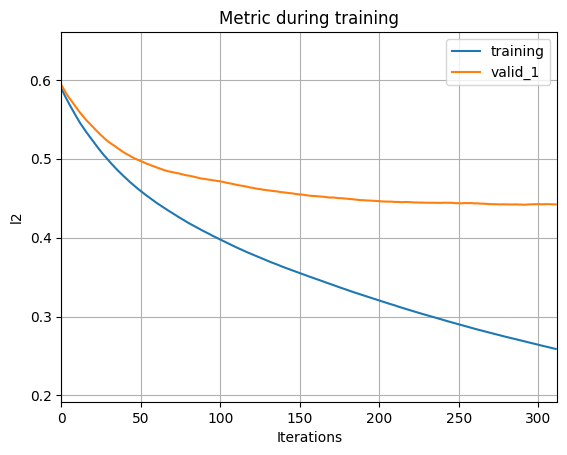

----> || Train Optimized QWK SCORE ::  0.762
----> || Val Optimized QWK SCORE ::  0.463
----> || Train Optimized Val QWK SCORE ::  0.471
----> || Val Optimized Train QWK SCORE ::  0.745
Fold 1 - Rounded Train QWK: 0.6413, Rounded Validation QWK: 0.3579


<Figure size 640x480 with 0 Axes>

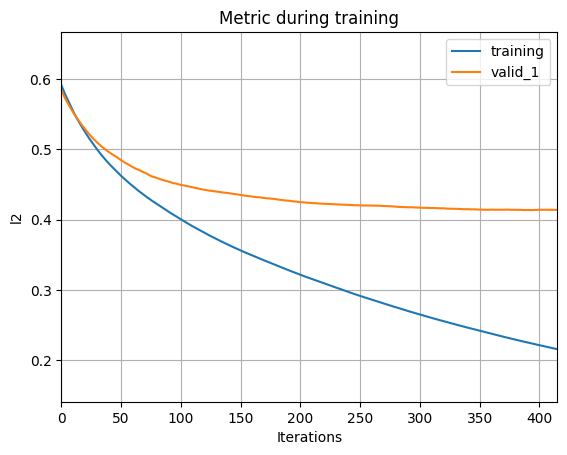

----> || Train Optimized QWK SCORE ::  0.815
----> || Val Optimized QWK SCORE ::  0.459
----> || Train Optimized Val QWK SCORE ::  0.503
----> || Val Optimized Train QWK SCORE ::  0.692
Fold 2 - Rounded Train QWK: 0.7121, Rounded Validation QWK: 0.4524


<Figure size 640x480 with 0 Axes>

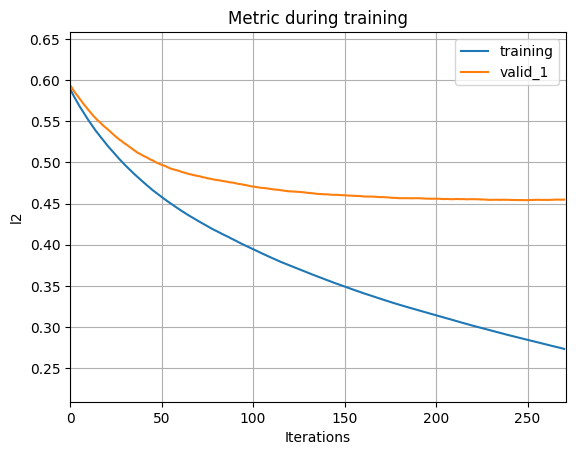

----> || Train Optimized QWK SCORE ::  0.738
----> || Val Optimized QWK SCORE ::  0.498
----> || Train Optimized Val QWK SCORE ::  0.476
----> || Val Optimized Train QWK SCORE ::  0.723
Fold 3 - Rounded Train QWK: 0.6290, Rounded Validation QWK: 0.3607


<Figure size 640x480 with 0 Axes>

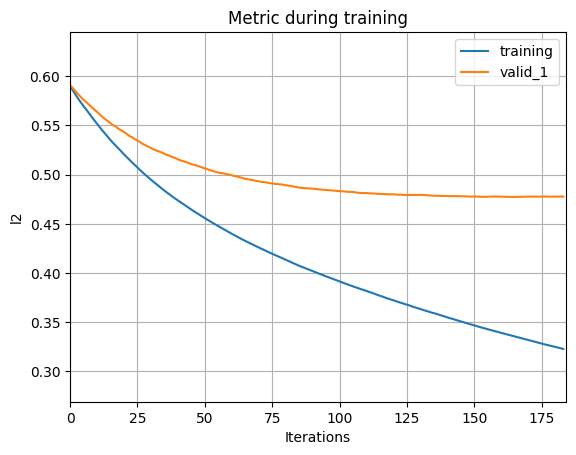

----> || Train Optimized QWK SCORE ::  0.678
----> || Val Optimized QWK SCORE ::  0.358
----> || Train Optimized Val QWK SCORE ::  0.456
----> || Val Optimized Train QWK SCORE ::  0.544
Fold 4 - Rounded Train QWK: 0.5414, Rounded Validation QWK: 0.3333


<Figure size 640x480 with 0 Axes>

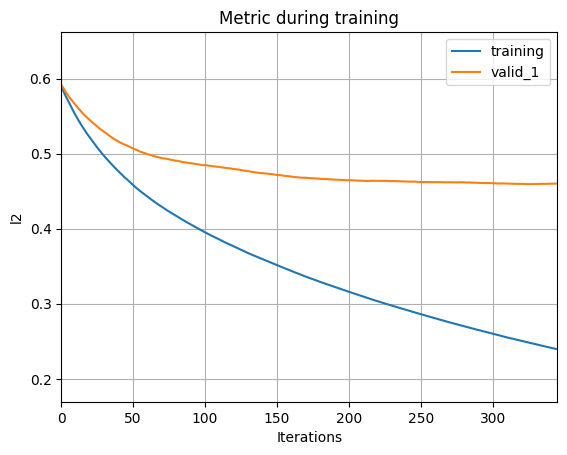

----> || Train Optimized QWK SCORE ::  0.787
----> || Val Optimized QWK SCORE ::  0.445
----> || Train Optimized Val QWK SCORE ::  0.436
----> || Val Optimized Train QWK SCORE ::  0.778
Fold 5 - Rounded Train QWK: 0.6743, Rounded Validation QWK: 0.3554
Mean Train QWK --> 0.7560
Mean Validation QWK ---> 0.4447
----> || Optimized QWK SCORE ::  0.480


In [197]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_selected_df, test_selected_df, 150)

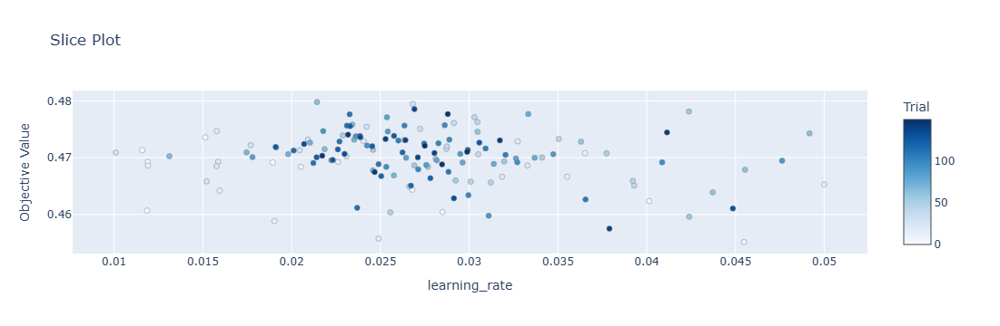

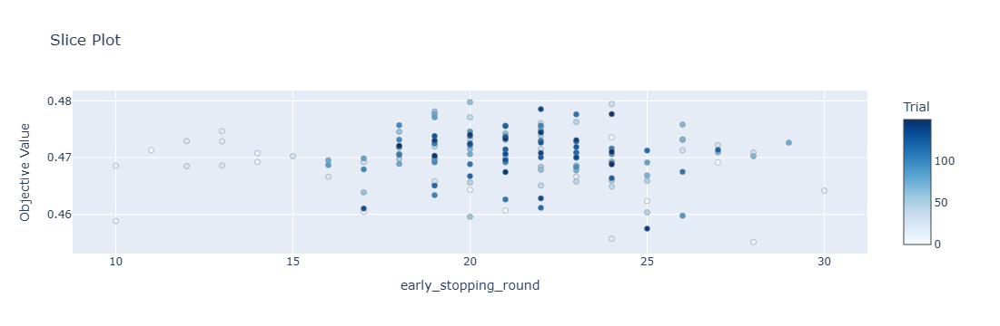

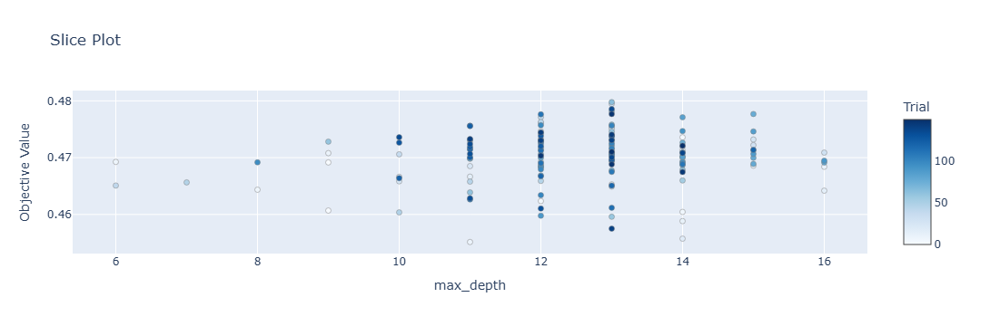

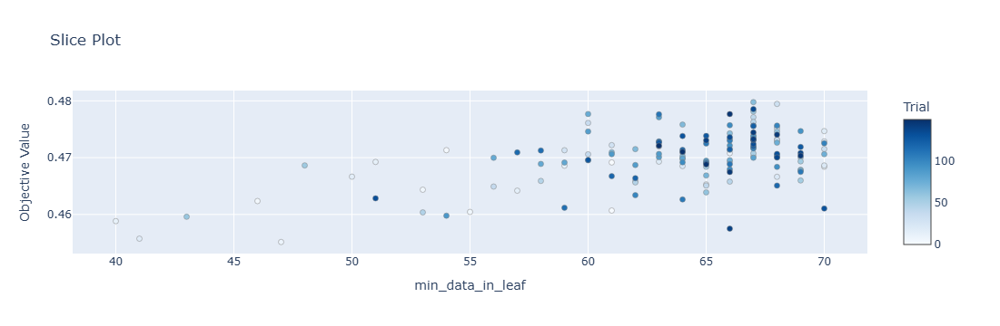

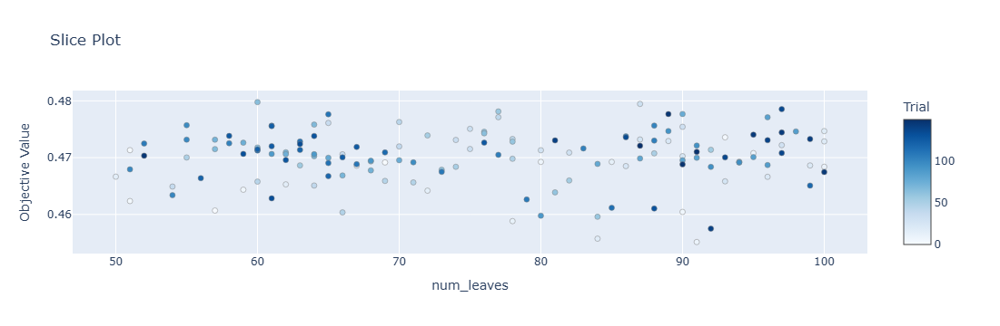

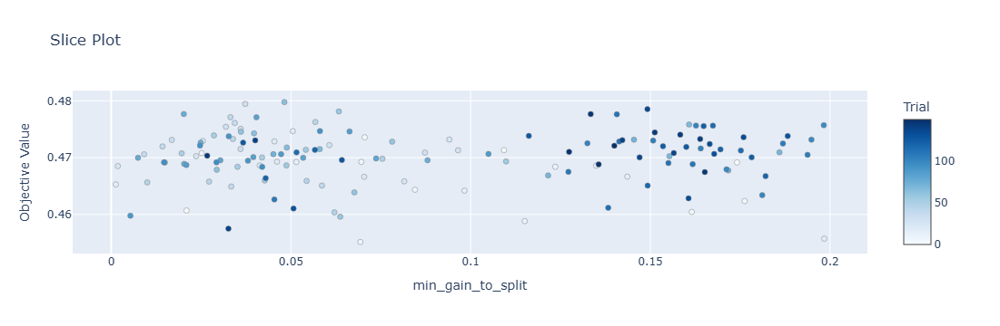

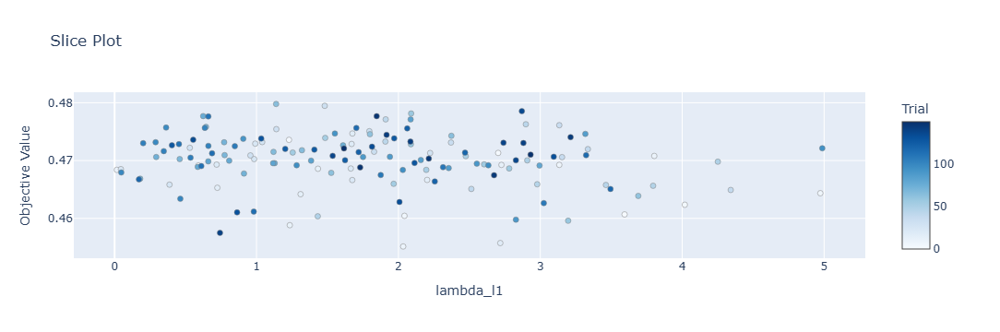

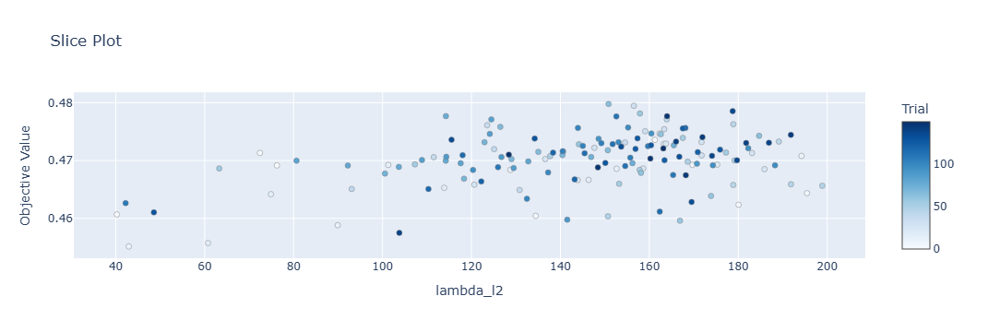

In [198]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

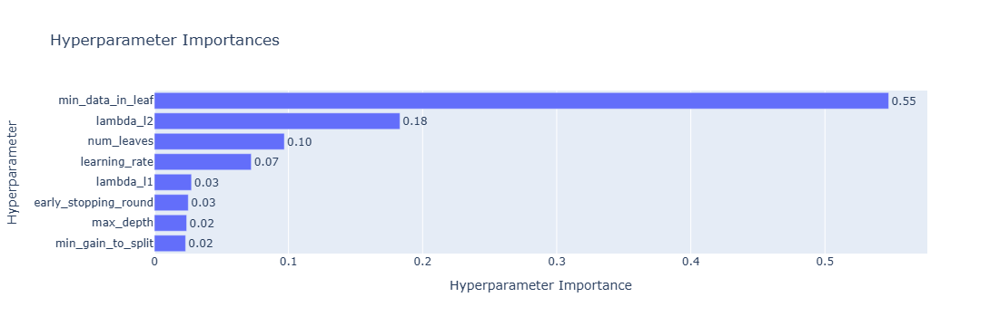

In [202]:
plot_param_importances(lgb_optuna_study)

In [204]:
lgb_optuna_study.best_params

{'learning_rate': 0.02143289726404203,
 'early_stopping_round': 20,
 'max_depth': 13,
 'min_data_in_leaf': 67,
 'num_leaves': 60,
 'min_gain_to_split': 0.048174922110473126,
 'lambda_l1': 1.1380655818147358,
 'lambda_l2': 150.8351779783935}

In [206]:
cols = train_selected_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
print(imp_df.shape)
imp_df

(684, 2)


,Feature,Importance
38,SDS-SDS_Total_Raw,204.8
37,PreInt_EduHx-computerinternet_hoursday,136.6
32,Physical-Height,71.4
7,Basic_Demos-Age,57.8
15,FGC-FGC_PU,50.6
...,...,...
44,X_time_of_day_hour_window_11_1%,1.4
614,light_time_of_day_hour_window_16_sum,1.4
46,X_time_of_day_hour_window_11_std,1.2
127,Y_time_of_day_hour_window_0_max,1.2


In [207]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [208]:
train_selected2_df = train_selected_df.drop(unimportant_cols, axis=1)
print(train_selected2_df.shape)
train_selected2_df.head()

(2736, 344)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,Y_99%,Z_std,Z_max,anglez_max,X_weekday_2_max,X_weekday_3_min,X_weekday_3_max,X_weekday_3_sum,X_weekday_4_mean,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_max,Y_weekday_1_mean,Y_weekday_1_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_min,Y_weekday_4_mean,Y_weekday_4_1%,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_entropy,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_min,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_7_min,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_10%,enmo_weekday_7_20%,anglez_weekday_3_min,anglez_weekday_3_entropy,light_weekday_2_95%,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_3_97%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_55%,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_0_std,X_time_of_day_hour_window_0_sum,X_time_of_day_hour_window_1_mean,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_max,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_4_sum,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_7_entropy,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_14_3%,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_21_std,X_time_of_day_hour_window_21_min,X_time_of_day_hour_window_21_entropy,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_22_entropy,X_time_of_day_hour_window_23_mean,X_time_of_day_hour_window_23_entropy,Y_time_of_day_hour_window_0_95%,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_0_entropy,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_3_sum,Y_time_of_day_hour_window_3_entropy,Y_time_of_day_hour_window_4_mean,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_6_entropy,Y_time_of_day_hour_window_7_min,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_8_1%,Y_time_of_day_hour_window_8_sum,Y_time_of_day_hour_window_9_min,Y_time_of_day_hour_window_9_sum,Y_time_of

In [209]:
test_selected2_df = test_selected_df.drop(unimportant_cols, axis=1)
print(test_selected2_df.shape)
test_selected2_df.head()

(20, 343)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,FGC-FGC_TL,BIA-BIA_Activity_Level_num,BIA-BIA_BMC,BIA-BIA_BMI,BIA-BIA_FFMI,BIA-BIA_FMI,BIA-BIA_Fat,BIA-BIA_Frame_num,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,total_num_nan,Physical-Waist_Circumference_isnan,PAQ_C-Season_isnan,Y_99%,Z_std,Z_max,anglez_max,X_weekday_2_max,X_weekday_3_min,X_weekday_3_max,X_weekday_3_sum,X_weekday_4_mean,X_weekday_5_entropy,X_weekday_6_mean,X_weekday_6_max,Y_weekday_1_mean,Y_weekday_1_sum,Y_weekday_2_entropy,Y_weekday_3_mean,Y_weekday_3_min,Y_weekday_4_mean,Y_weekday_4_1%,Y_weekday_4_sum,Y_weekday_4_entropy,Y_weekday_5_entropy,Y_weekday_6_sum,Y_weekday_6_entropy,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_min,Z_weekday_2_90%,Z_weekday_2_max,Z_weekday_3_std,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_std,Z_weekday_4_min,Z_weekday_4_1%,Z_weekday_4_25%,Z_weekday_5_std,Z_weekday_5_max,Z_weekday_5_sum,Z_weekday_6_std,Z_weekday_6_min,Z_weekday_6_95%,Z_weekday_7_min,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_6_10%,enmo_weekday_7_20%,anglez_weekday_3_min,anglez_weekday_3_entropy,light_weekday_2_95%,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_1_mean,battery_use_since_wear_weekday_1_15%,battery_use_since_wear_weekday_1_95%,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_30%,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_3_97%,battery_use_since_wear_weekday_4_min,battery_use_since_wear_weekday_4_15%,battery_use_since_wear_weekday_5_std,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_20%,battery_use_since_wear_weekday_6_55%,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_0_std,X_time_of_day_hour_window_0_sum,X_time_of_day_hour_window_1_mean,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_1_max,X_time_of_day_hour_window_1_sum,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_4_sum,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_6_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_7_1%,X_time_of_day_hour_window_7_entropy,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_14_3%,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_17_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_21_std,X_time_of_day_hour_window_21_min,X_time_of_day_hour_window_21_entropy,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_22_entropy,X_time_of_day_hour_window_23_mean,X_time_of_day_hour_window_23_entropy,Y_time_of_day_hour_window_0_95%,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_0_entropy,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_3_sum,Y_time_of_day_hour_window_3_entropy,Y_time_of_day_hour_window_4_mean,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_6_entropy,Y_time_of_day_hour_window_7_min,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_8_1%,Y_time_of_day_hour_window_8_sum,Y_time_of_day_hour_window_9_min,Y_time_of_day_hour_window_9_sum,Y_time_of

[I 2024-12-13 23:53:15,804] A new study created in memory with name: no-name-41d674f7-a87d-40a5-bed6-bc03e88fbe45
[I 2024-12-13 23:53:27,455] Trial 0 finished with value: 0.47946307801039223 and parameters: {'learning_rate': 0.013421887041552161, 'early_stopping_round': 29, 'max_depth': 13, 'min_data_in_leaf': 51, 'num_leaves': 127, 'min_gain_to_split': 0.19464377817362943, 'lambda_l1': 0.6713722396366478, 'lambda_l2': 152.48569157049272}. Best is trial 0 with value: 0.47946307801039223.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:53:35,619] Trial 1 finished with value: 0.4764658676124155 and parameters: {'learning_rate': 0.01931778718912951, 'early_stopping_round': 19, 'max_depth': 11, 'min_data_in_leaf': 72, 'num_leaves': 91, 'min_gain_to_split': 0.03947481084305873, 'lambda_l1': 1.5709900682115274, 'lambda_l2': 128.4165768730189}. Best is trial 0 with value: 0.47946307801039223.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:53:44,719] Trial 2 finished with value: 0.4798904146017834 and parameters: {'learning_rate': 0.015011141167284818, 'early_stopping_round': 17, 'max_depth': 11, 'min_data_in_leaf': 83, 'num_leaves': 140, 'min_gain_to_split': 0.1596364139485209, 'lambda_l1': 1.8431364446100396, 'lambda_l2': 152.60091768719286}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:53:48,299] Trial 3 finished with value: 0.473363445201902 and parameters: {'learning_rate': 0.04495102527988221, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 87, 'num_leaves': 63, 'min_gain_to_split': 0.11892054760068123, 'lambda_l1': 2.0870607136015473, 'lambda_l2': 131.74912207250995}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:54:03,350] Trial 4 finished with value: 0.47281030775749777 and parameters: {'learning_rate': 0.01133026690169331, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 51, 'num_leaves': 98, 'min_gain_to_split': 0.10694104786186048, 'lambda_l1': 3.0101091507227187, 'lambda_l2': 141.2770558276856}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:54:11,887] Trial 5 finished with value: 0.47662043571701385 and parameters: {'learning_rate': 0.025249831103492604, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 64, 'num_leaves': 98, 'min_gain_to_split': 0.06907825864122115, 'lambda_l1': 4.32363882657861, 'lambda_l2': 140.18538994511158}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:54:18,381] Trial 6 finished with value: 0.4733754357512109 and parameters: {'learning_rate': 0.02183506814972028, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 73, 'num_leaves': 57, 'min_gain_to_split': 0.187119982324881, 'lambda_l1': 3.8987853412381708, 'lambda_l2': 106.42501517835713}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-13 23:54:25,386] Trial 7 finished with value: 0.4715830793001211 and parameters: {'learning_rate': 0.02177014362901308, 'early_stopping_round': 22, 'max_depth': 16, 'min_data_in_leaf': 96, 'num_leaves': 116, 'min_gain_to_split': 0.10120785804907642, 'lambda_l1': 0.7059777460867955, 'lambda_l2': 246.0242464351431}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:54:33,455] Trial 8 finished with value: 0.47501527798257326 and parameters: {'learning_rate': 0.02423568384721298, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 61, 'num_leaves': 136, 'min_gain_to_split': 0.1881766691516413, 'lambda_l1': 2.8694834618932337, 'lambda_l2': 131.88070406187703}. Best is trial 2 with value: 0.4798904146017834.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:54:41,879] Trial 9 finished with value: 0.4803025320618217 and parameters: {'learning_rate': 0.020493437916568418, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 52, 'num_leaves': 96, 'min_gain_to_split': 0.15102268188541024, 'lambda_l1': 0.7202724624354684, 'lambda_l2': 141.70197051213694}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:54:47,987] Trial 10 finished with value: 0.4795031354898196 and parameters: {'learning_rate': 0.03524802584914028, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 181, 'min_gain_to_split': 0.0037271433440046325, 'lambda_l1': 0.0017507566282110032, 'lambda_l2': 193.41735361639476}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:54:53,503] Trial 11 finished with value: 0.4723280529376379 and parameters: {'learning_rate': 0.033261935864963434, 'early_stopping_round': 17, 'max_depth': 10, 'min_data_in_leaf': 84, 'num_leaves': 162, 'min_gain_to_split': 0.14635287692586452, 'lambda_l1': 1.4164745142296997, 'lambda_l2': 188.03261929345294}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:55:01,384] Trial 12 finished with value: 0.4784288259794436 and parameters: {'learning_rate': 0.01591130283644905, 'early_stopping_round': 15, 'max_depth': 14, 'min_data_in_leaf': 81, 'num_leaves': 164, 'min_gain_to_split': 0.14797374318016066, 'lambda_l1': 1.079082989325105, 'lambda_l2': 84.20741318927924}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:55:06,251] Trial 13 finished with value: 0.46957537824497286 and parameters: {'learning_rate': 0.028362267549318247, 'early_stopping_round': 12, 'max_depth': 10, 'min_data_in_leaf': 100, 'num_leaves': 145, 'min_gain_to_split': 0.15215177299414961, 'lambda_l1': 2.2809262293904617, 'lambda_l2': 182.58209429640613}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:55:14,268] Trial 14 finished with value: 0.4752161899540206 and parameters: {'learning_rate': 0.016184297906797724, 'early_stopping_round': 19, 'max_depth': 12, 'min_data_in_leaf': 92, 'num_leaves': 195, 'min_gain_to_split': 0.16140281720855143, 'lambda_l1': 0.03703539043484749, 'lambda_l2': 171.29359653382426}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-13 23:55:27,023] Trial 15 finished with value: 0.4771773371166609 and parameters: {'learning_rate': 0.010356544575403685, 'early_stopping_round': 16, 'max_depth': 11, 'min_data_in_leaf': 77, 'num_leaves': 84, 'min_gain_to_split': 0.12670588261543553, 'lambda_l1': 3.3400128499458983, 'lambda_l2': 216.37085732443842}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:55:31,682] Trial 16 finished with value: 0.47891146829049547 and parameters: {'learning_rate': 0.04340392307584526, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 65, 'num_leaves': 116, 'min_gain_to_split': 0.07958124813274124, 'lambda_l1': 1.8595333491645456, 'lambda_l2': 110.88396222632792}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:55:36,173] Trial 17 finished with value: 0.4765120395166297 and parameters: {'learning_rate': 0.038966968392975324, 'early_stopping_round': 21, 'max_depth': 11, 'min_data_in_leaf': 69, 'num_leaves': 72, 'min_gain_to_split': 0.17032290919057633, 'lambda_l1': 4.992729004729257, 'lambda_l2': 157.50906522050047}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:55:42,223] Trial 18 finished with value: 0.4787068985901608 and parameters: {'learning_rate': 0.028772620526955825, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 147, 'min_gain_to_split': 0.1318759605488933, 'lambda_l1': 0.7544191951467236, 'lambda_l2': 108.73199627576814}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:55:50,665] Trial 19 finished with value: 0.4716862246427642 and parameters: {'learning_rate': 0.017696634791512834, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 89, 'num_leaves': 110, 'min_gain_to_split': 0.17480909204205552, 'lambda_l1': 2.5180318964971606, 'lambda_l2': 207.08625813105274}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:55:58,769] Trial 20 finished with value: 0.47883290794653544 and parameters: {'learning_rate': 0.014437833866501002, 'early_stopping_round': 10, 'max_depth': 12, 'min_data_in_leaf': 79, 'num_leaves': 76, 'min_gain_to_split': 0.13585872099967344, 'lambda_l1': 1.109530485643149, 'lambda_l2': 165.8642053347658}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:56:04,402] Trial 21 finished with value: 0.4699609736923379 and parameters: {'learning_rate': 0.03532388505585744, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 178, 'min_gain_to_split': 9.84643450218886e-05, 'lambda_l1': 0.05360049398142808, 'lambda_l2': 203.62263829333241}. Best is trial 9 with value: 0.4803025320618217.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:56:09,741] Trial 22 finished with value: 0.4805194069584673 and parameters: {'learning_rate': 0.04931037844848667, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 54, 'num_leaves': 179, 'min_gain_to_split': 0.004034578618683546, 'lambda_l1': 0.41557313878709357, 'lambda_l2': 228.02639979725978}. Best is trial 22 with value: 0.4805194069584673.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-13 23:56:15,523] Trial 23 finished with value: 0.48052473605150015 and parameters: {'learning_rate': 0.04676173923653319, 'early_stopping_round': 16, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 164, 'min_gain_to_split': 0.033541015903471055, 'lambda_l1': 0.5391631141675721, 'lambda_l2': 246.6676704986998}. Best is trial 23 with value: 0.48052473605150015.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-13 23:56:20,251] Trial 24 finished with value: 0.4707130718546807 and parameters: {'learning_rate': 0.04910830982386664, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 195, 'min_gain_to_split': 0.027458278573454606, 'lambda_l1': 0.3965735302483862, 'lambda_l2': 239.6922044011202}. Best is trial 23 with value: 0.48052473605150015.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:56:25,593] Trial 25 finished with value: 0.4771125325391693 and parameters: {'learning_rate': 0.049272732684762226, 'early_stopping_round': 15, 'max_depth': 15, 'min_data_in_leaf': 50, 'num_leaves': 162, 'min_gain_to_split': 0.03337224243637187, 'lambda_l1': 1.0913361442891256, 'lambda_l2': 226.8121534583574}. Best is trial 23 with value: 0.48052473605150015.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:56:32,068] Trial 26 finished with value: 0.47832116113525003 and parameters: {'learning_rate': 0.04452102057834306, 'early_stopping_round': 20, 'max_depth': 17, 'min_data_in_leaf': 55, 'num_leaves': 182, 'min_gain_to_split': 0.05591354921603167, 'lambda_l1': 0.39573672269807836, 'lambda_l2': 227.03448396709553}. Best is trial 23 with value: 0.48052473605150015.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:56:38,398] Trial 27 finished with value: 0.48162992773009805 and parameters: {'learning_rate': 0.04049585365792534, 'early_stopping_round': 13, 'max_depth': 15, 'min_data_in_leaf': 54, 'num_leaves': 155, 'min_gain_to_split': 0.016819407463143657, 'lambda_l1': 1.3704936923730786, 'lambda_l2': 233.56347016793472}. Best is trial 27 with value: 0.48162992773009805.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:56:43,877] Trial 28 finished with value: 0.4879971523989991 and parameters: {'learning_rate': 0.04041370663646715, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 65, 'num_leaves': 153, 'min_gain_to_split': 0.016035651982497616, 'lambda_l1': 1.3579604109934778, 'lambda_l2': 234.5052245180317}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-13 23:56:49,817] Trial 29 finished with value: 0.48406758930196336 and parameters: {'learning_rate': 0.0399392888818773, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 152, 'min_gain_to_split': 0.019979265493896392, 'lambda_l1': 1.4228008187432855, 'lambda_l2': 247.70785254077535}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-13 23:56:55,481] Trial 30 finished with value: 0.4776344485174703 and parameters: {'learning_rate': 0.04056857915183723, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 128, 'min_gain_to_split': 0.01662427340500855, 'lambda_l1': 1.5122930435757376, 'lambda_l2': 235.46376761353636}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:57:01,077] Trial 31 finished with value: 0.4823231158002166 and parameters: {'learning_rate': 0.039779499697671306, 'early_stopping_round': 14, 'max_depth': 15, 'min_data_in_leaf': 61, 'num_leaves': 151, 'min_gain_to_split': 0.0516847932393687, 'lambda_l1': 1.2877028793578262, 'lambda_l2': 245.35902365218735}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:57:07,134] Trial 32 finished with value: 0.487809149248994 and parameters: {'learning_rate': 0.03986543924551883, 'early_stopping_round': 14, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 154, 'min_gain_to_split': 0.05272672623805413, 'lambda_l1': 1.2889099542383278, 'lambda_l2': 249.76969141563904}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-13 23:57:12,191] Trial 33 finished with value: 0.4781779254448514 and parameters: {'learning_rate': 0.03735633615704337, 'early_stopping_round': 14, 'max_depth': 17, 'min_data_in_leaf': 69, 'num_leaves': 134, 'min_gain_to_split': 0.050277565342827964, 'lambda_l1': 1.863311505914799, 'lambda_l2': 249.92656362167415}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:57:17,185] Trial 34 finished with value: 0.48030962966306334 and parameters: {'learning_rate': 0.04203798393376359, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 152, 'min_gain_to_split': 0.08214215431822272, 'lambda_l1': 1.194239245003616, 'lambda_l2': 216.63645918502476}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:57:23,773] Trial 35 finished with value: 0.47636855005970713 and parameters: {'learning_rate': 0.03139999713841003, 'early_stopping_round': 15, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 171, 'min_gain_to_split': 0.046320120209965954, 'lambda_l1': 1.6806057628770983, 'lambda_l2': 216.1189681797747}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:57:28,842] Trial 36 finished with value: 0.4822653541809885 and parameters: {'learning_rate': 0.03830250419220966, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 72, 'num_leaves': 141, 'min_gain_to_split': 0.06708136647417463, 'lambda_l1': 2.3339598859248722, 'lambda_l2': 239.51801208394988}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:57:37,260] Trial 37 finished with value: 0.47824938939864026 and parameters: {'learning_rate': 0.03589941439215917, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 153, 'min_gain_to_split': 0.02273371325768951, 'lambda_l1': 0.9334512024932862, 'lambda_l2': 221.94452860130963}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:57:42,735] Trial 38 finished with value: 0.4836789065214874 and parameters: {'learning_rate': 0.045614890658139555, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 123, 'min_gain_to_split': 0.06162929030481263, 'lambda_l1': 2.0008577097759, 'lambda_l2': 204.77468114245005}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-13 23:57:47,236] Trial 39 finished with value: 0.48483449272948853 and parameters: {'learning_rate': 0.04620587309739062, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 125, 'min_gain_to_split': 0.06343057664156011, 'lambda_l1': 1.9980287021830936, 'lambda_l2': 199.42181582655888}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-13 23:57:51,073] Trial 40 finished with value: 0.47658977219563103 and parameters: {'learning_rate': 0.04676709994982858, 'early_stopping_round': 11, 'max_depth': 17, 'min_data_in_leaf': 72, 'num_leaves': 129, 'min_gain_to_split': 0.09122086890256922, 'lambda_l1': 2.635888020183064, 'lambda_l2': 200.38413348189334}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:57:55,296] Trial 41 finished with value: 0.4820029565211371 and parameters: {'learning_rate': 0.04664140299314711, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 122, 'min_gain_to_split': 0.06347184254197717, 'lambda_l1': 2.093050934169086, 'lambda_l2': 176.6223409801199}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:57:59,829] Trial 42 finished with value: 0.4815726848892288 and parameters: {'learning_rate': 0.04246588166211113, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 75, 'num_leaves': 112, 'min_gain_to_split': 0.03730931107019045, 'lambda_l1': 2.0541645530717894, 'lambda_l2': 210.86666963385034}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:58:04,557] Trial 43 finished with value: 0.4862981289454089 and parameters: {'learning_rate': 0.04564335553211589, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 104, 'min_gain_to_split': 0.08117142277752859, 'lambda_l1': 1.6038079127895961, 'lambda_l2': 197.9810174176322}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-13 23:58:09,036] Trial 44 finished with value: 0.4721393815727516 and parameters: {'learning_rate': 0.04404753696511974, 'early_stopping_round': 16, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 104, 'min_gain_to_split': 0.07662167273324438, 'lambda_l1': 1.7235550963289634, 'lambda_l2': 198.01534353373816}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-13 23:58:13,407] Trial 45 finished with value: 0.4757007198000335 and parameters: {'learning_rate': 0.04185421711230555, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 70, 'num_leaves': 134, 'min_gain_to_split': 0.10243844926956067, 'lambda_l1': 1.507476234575793, 'lambda_l2': 190.6866121010944}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:58:17,883] Trial 46 finished with value: 0.4865613193291859 and parameters: {'learning_rate': 0.04803178618692403, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 101, 'min_gain_to_split': 0.11348847260560312, 'lambda_l1': 0.8742006101902178, 'lambda_l2': 235.90946056258437}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-13 23:58:22,547] Trial 47 finished with value: 0.4846798219353765 and parameters: {'learning_rate': 0.04768468874196335, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 89, 'min_gain_to_split': 0.11430681889801451, 'lambda_l1': 0.8546787264669122, 'lambda_l2': 232.96233334590923}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-13 23:58:27,676] Trial 48 finished with value: 0.4790014440051107 and parameters: {'learning_rate': 0.04502579149714566, 'early_stopping_round': 15, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 105, 'min_gain_to_split': 0.09183411803245135, 'lambda_l1': 3.151907805061835, 'lambda_l2': 180.14670986208654}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:58:32,675] Trial 49 finished with value: 0.4784580584354383 and parameters: {'learning_rate': 0.047641027821918515, 'early_stopping_round': 18, 'max_depth': 15, 'min_data_in_leaf': 63, 'num_leaves': 99, 'min_gain_to_split': 0.11169338657478674, 'lambda_l1': 2.2512488449696426, 'lambda_l2': 221.38826231694193}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:58:36,519] Trial 50 finished with value: 0.47595601228362117 and parameters: {'learning_rate': 0.0427597056671455, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 74, 'num_leaves': 82, 'min_gain_to_split': 0.0920661009529734, 'lambda_l1': 1.697811535455037, 'lambda_l2': 154.89983411476817}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-13 23:58:41,215] Trial 51 finished with value: 0.4825706685003167 and parameters: {'learning_rate': 0.04979634388801211, 'early_stopping_round': 16, 'max_depth': 14, 'min_data_in_leaf': 65, 'num_leaves': 86, 'min_gain_to_split': 0.10736105612759955, 'lambda_l1': 0.8556382211538387, 'lambda_l2': 233.49308811738692}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-13 23:58:45,534] Trial 52 finished with value: 0.4769397878798337 and parameters: {'learning_rate': 0.04769470086442725, 'early_stopping_round': 13, 'max_depth': 14, 'min_data_in_leaf': 71, 'num_leaves': 89, 'min_gain_to_split': 0.11957617555593014, 'lambda_l1': 0.9625900549356983, 'lambda_l2': 241.03402093197454}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-13 23:58:51,186] Trial 53 finished with value: 0.4781303589657575 and parameters: {'learning_rate': 0.04562981547414065, 'early_stopping_round': 17, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 93, 'min_gain_to_split': 0.07313845302515039, 'lambda_l1': 0.5720675760853862, 'lambda_l2': 235.6473027350635}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-13 23:58:55,863] Trial 54 finished with value: 0.47115966103511364 and parameters: {'learning_rate': 0.04779384271868034, 'early_stopping_round': 17, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 67, 'min_gain_to_split': 0.11498501300582713, 'lambda_l1': 1.2577305203376665, 'lambda_l2': 229.05807603071943}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-13 23:59:00,913] Trial 55 finished with value: 0.48103659620230665 and parameters: {'learning_rate': 0.03710393728139903, 'early_stopping_round': 19, 'max_depth': 16, 'min_data_in_leaf': 77, 'num_leaves': 103, 'min_gain_to_split': 0.12314978054329699, 'lambda_l1': 0.24284649522280266, 'lambda_l2': 211.84025095279492}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-13 23:59:05,993] Trial 56 finished with value: 0.4801542587802129 and parameters: {'learning_rate': 0.04375720855038364, 'early_stopping_round': 15, 'max_depth': 13, 'min_data_in_leaf': 62, 'num_leaves': 95, 'min_gain_to_split': 0.0841656318797514, 'lambda_l1': 0.7203977800769578, 'lambda_l2': 221.48845569473}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:59:11,770] Trial 57 finished with value: 0.48223413457139597 and parameters: {'learning_rate': 0.03187633827452684, 'early_stopping_round': 14, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 59, 'min_gain_to_split': 0.1362836436134685, 'lambda_l1': 0.9973738635002021, 'lambda_l2': 193.5005682646753}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:59:16,085] Trial 58 finished with value: 0.47880971243720605 and parameters: {'learning_rate': 0.04583349290805608, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 112, 'min_gain_to_split': 0.09516756975215807, 'lambda_l1': 3.6766378136210065, 'lambda_l2': 162.56476221704463}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-13 23:59:22,629] Trial 59 finished with value: 0.4797641869783935 and parameters: {'learning_rate': 0.03399307213446698, 'early_stopping_round': 18, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 115, 'min_gain_to_split': 0.04285581182304617, 'lambda_l1': 2.7453458816392886, 'lambda_l2': 242.06799277904514}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:59:29,328] Trial 60 finished with value: 0.47045581054515473 and parameters: {'learning_rate': 0.02457977164872987, 'early_stopping_round': 24, 'max_depth': 17, 'min_data_in_leaf': 52, 'num_leaves': 79, 'min_gain_to_split': 0.0996677708004109, 'lambda_l1': 1.5930936111989467, 'lambda_l2': 81.47060920287869}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.470


[I 2024-12-13 23:59:35,177] Trial 61 finished with value: 0.4802655719961457 and parameters: {'learning_rate': 0.04109087218938878, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 143, 'min_gain_to_split': 0.008828628144690478, 'lambda_l1': 1.3220763881757653, 'lambda_l2': 249.13813662921072}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-13 23:59:40,549] Trial 62 finished with value: 0.48143499177283755 and parameters: {'learning_rate': 0.03877321837430344, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 69, 'num_leaves': 171, 'min_gain_to_split': 0.0110304060563354, 'lambda_l1': 1.8535604760232496, 'lambda_l2': 232.67507186277624}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-13 23:59:44,812] Trial 63 finished with value: 0.48207390326199184 and parameters: {'learning_rate': 0.04363179906518819, 'early_stopping_round': 13, 'max_depth': 15, 'min_data_in_leaf': 67, 'num_leaves': 159, 'min_gain_to_split': 0.027837453326170485, 'lambda_l1': 1.459819915112527, 'lambda_l2': 145.24464307997246}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-13 23:59:50,125] Trial 64 finished with value: 0.4860901868314085 and parameters: {'learning_rate': 0.04837373545446764, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 148, 'min_gain_to_split': 0.05587837836860946, 'lambda_l1': 0.816903323596731, 'lambda_l2': 243.66114505208196}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-13 23:59:55,355] Trial 65 finished with value: 0.47286266647572683 and parameters: {'learning_rate': 0.048297368594400966, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 147, 'min_gain_to_split': 0.06025199469932701, 'lambda_l1': 0.7920821159540716, 'lambda_l2': 241.83092745323103}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-14 00:00:00,410] Trial 66 finished with value: 0.4772261135404977 and parameters: {'learning_rate': 0.049855690208632744, 'early_stopping_round': 17, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 169, 'min_gain_to_split': 0.08527246450886422, 'lambda_l1': 1.1101074484884372, 'lambda_l2': 224.99224790195893}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:00:05,603] Trial 67 finished with value: 0.4835634893903671 and parameters: {'learning_rate': 0.04858313390630722, 'early_stopping_round': 27, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 138, 'min_gain_to_split': 0.07094664987182081, 'lambda_l1': 0.1874479296575704, 'lambda_l2': 184.5817585097598}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:00:10,051] Trial 68 finished with value: 0.4806183351630635 and parameters: {'learning_rate': 0.046728782723885906, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 121, 'min_gain_to_split': 0.13112982672541948, 'lambda_l1': 0.6019418786132087, 'lambda_l2': 236.18791489072402}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:00:15,200] Trial 69 finished with value: 0.47814578885144077 and parameters: {'learning_rate': 0.04477136859766055, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 72, 'min_gain_to_split': 0.05166806561335958, 'lambda_l1': 1.1656564665064018, 'lambda_l2': 211.90161338537627}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:00:20,153] Trial 70 finished with value: 0.48001909054067404 and parameters: {'learning_rate': 0.04646422119788298, 'early_stopping_round': 19, 'max_depth': 17, 'min_data_in_leaf': 70, 'num_leaves': 52, 'min_gain_to_split': 0.07651965088543759, 'lambda_l1': 2.388103378717336, 'lambda_l2': 243.90375902069098}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:00:25,239] Trial 71 finished with value: 0.48730751708428244 and parameters: {'learning_rate': 0.03979655474758463, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 156, 'min_gain_to_split': 0.057635212451578266, 'lambda_l1': 1.6206174760912335, 'lambda_l2': 230.72878582398099}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:00:30,194] Trial 72 finished with value: 0.4824418048845921 and parameters: {'learning_rate': 0.04117615242805855, 'early_stopping_round': 16, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 160, 'min_gain_to_split': 0.05865733822383203, 'lambda_l1': 1.6514333014524514, 'lambda_l2': 230.87389610793613}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:00:36,786] Trial 73 finished with value: 0.47569513794797325 and parameters: {'learning_rate': 0.027870618201304664, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 166, 'min_gain_to_split': 0.0681413631370125, 'lambda_l1': 0.8551733780061151, 'lambda_l2': 237.0100956950098}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:00:41,960] Trial 74 finished with value: 0.4795273205466214 and parameters: {'learning_rate': 0.04328566432507897, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 158, 'min_gain_to_split': 0.03872016572740615, 'lambda_l1': 1.3488779101806614, 'lambda_l2': 217.9458897575805}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:00:47,623] Trial 75 finished with value: 0.4752433203675709 and parameters: {'learning_rate': 0.03754439916512841, 'early_stopping_round': 11, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 188, 'min_gain_to_split': 0.04616344483368085, 'lambda_l1': 2.159922277981174, 'lambda_l2': 224.2855261845405}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:00:52,347] Trial 76 finished with value: 0.48057668138619203 and parameters: {'learning_rate': 0.048150238035421046, 'early_stopping_round': 12, 'max_depth': 13, 'min_data_in_leaf': 64, 'num_leaves': 146, 'min_gain_to_split': 0.05380041289696253, 'lambda_l1': 1.9241970440500147, 'lambda_l2': 245.71698506149437}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:00:57,002] Trial 77 finished with value: 0.4789955473182199 and parameters: {'learning_rate': 0.04469147935846168, 'early_stopping_round': 14, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 100, 'min_gain_to_split': 0.06483409669785967, 'lambda_l1': 1.0019661460034588, 'lambda_l2': 93.41057756856199}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:01:00,717] Trial 78 finished with value: 0.4782362787564739 and parameters: {'learning_rate': 0.047273569776056006, 'early_stopping_round': 14, 'max_depth': 17, 'min_data_in_leaf': 85, 'num_leaves': 107, 'min_gain_to_split': 0.1062130478710604, 'lambda_l1': 1.7634125924348356, 'lambda_l2': 172.5592968014301}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:01:05,497] Trial 79 finished with value: 0.4796105641133822 and parameters: {'learning_rate': 0.03955884592289556, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 132, 'min_gain_to_split': 0.08556369672143355, 'lambda_l1': 1.5150768126331993, 'lambda_l2': 238.45631753236844}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:01:10,698] Trial 80 finished with value: 0.4792688139599205 and parameters: {'learning_rate': 0.036270254788881906, 'early_stopping_round': 17, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 176, 'min_gain_to_split': 0.05742175399199991, 'lambda_l1': 0.5096414359683266, 'lambda_l2': 128.3832889730723}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:01:16,024] Trial 81 finished with value: 0.4854422008641214 and parameters: {'learning_rate': 0.03974565817396588, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 151, 'min_gain_to_split': 0.023986999753865753, 'lambda_l1': 1.2322281804147441, 'lambda_l2': 249.532465479562}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:01:20,461] Trial 82 finished with value: 0.4804952769977022 and parameters: {'learning_rate': 0.04176490683172265, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 69, 'num_leaves': 141, 'min_gain_to_split': 0.031128362834194234, 'lambda_l1': 1.241099343336286, 'lambda_l2': 230.08586068044528}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:01:25,133] Trial 83 finished with value: 0.48156822725409676 and parameters: {'learning_rate': 0.04561451827344469, 'early_stopping_round': 12, 'max_depth': 17, 'min_data_in_leaf': 71, 'num_leaves': 156, 'min_gain_to_split': 0.022985315731850656, 'lambda_l1': 1.3930951183496716, 'lambda_l2': 245.18975354524144}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:01:29,660] Trial 84 finished with value: 0.4795153169028673 and parameters: {'learning_rate': 0.04304479231068903, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 151, 'min_gain_to_split': 0.04518628889797645, 'lambda_l1': 1.0643629506345411, 'lambda_l2': 238.01312974584195}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:01:34,805] Trial 85 finished with value: 0.47169486083499956 and parameters: {'learning_rate': 0.04874515434705642, 'early_stopping_round': 13, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 150, 'min_gain_to_split': 0.014629042256147182, 'lambda_l1': 0.669448519301145, 'lambda_l2': 249.34718534845993}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-14 00:01:40,339] Trial 86 finished with value: 0.4721890140313345 and parameters: {'learning_rate': 0.034080837461389735, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 88, 'min_gain_to_split': 0.037309825109603276, 'lambda_l1': 4.621707815311206, 'lambda_l2': 227.8266006261099}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-14 00:01:45,441] Trial 87 finished with value: 0.4737680480505039 and parameters: {'learning_rate': 0.04009657110747521, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 137, 'min_gain_to_split': 0.19674390227294072, 'lambda_l1': 0.9219316803878153, 'lambda_l2': 242.5872975463296}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-14 00:01:50,106] Trial 88 finished with value: 0.4730363756566741 and parameters: {'learning_rate': 0.0382767052423775, 'early_stopping_round': 10, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 91, 'min_gain_to_split': 0.004089280886485153, 'lambda_l1': 1.5842812013679035, 'lambda_l2': 208.2945738918626}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-14 00:01:54,374] Trial 89 finished with value: 0.4727357576192698 and parameters: {'learning_rate': 0.04603239266515756, 'early_stopping_round': 13, 'max_depth': 15, 'min_data_in_leaf': 62, 'num_leaves': 126, 'min_gain_to_split': 0.11581097119413591, 'lambda_l1': 1.9638832863897908, 'lambda_l2': 218.28263334583812}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-14 00:01:59,136] Trial 90 finished with value: 0.4796915701277209 and parameters: {'learning_rate': 0.0441596662995313, 'early_stopping_round': 14, 'max_depth': 12, 'min_data_in_leaf': 73, 'num_leaves': 164, 'min_gain_to_split': 0.14107635761721768, 'lambda_l1': 1.2043399787289628, 'lambda_l2': 232.7379566674377}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:02:04,921] Trial 91 finished with value: 0.4767043765132314 and parameters: {'learning_rate': 0.039063755482570475, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 148, 'min_gain_to_split': 0.025247317262879296, 'lambda_l1': 1.4092035236141167, 'lambda_l2': 248.86646946568106}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:02:10,606] Trial 92 finished with value: 0.4768418829325294 and parameters: {'learning_rate': 0.041286748566379344, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 119, 'min_gain_to_split': 0.019731040226711793, 'lambda_l1': 1.8066062432128374, 'lambda_l2': 245.1755433100447}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:02:16,484] Trial 93 finished with value: 0.4828201861105854 and parameters: {'learning_rate': 0.03642665487859811, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 70, 'num_leaves': 144, 'min_gain_to_split': 0.03272321317217712, 'lambda_l1': 0.8472673475421257, 'lambda_l2': 239.45499424796228}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:02:22,677] Trial 94 finished with value: 0.47587931102543524 and parameters: {'learning_rate': 0.04236862802177314, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 156, 'min_gain_to_split': 0.010668740157334329, 'lambda_l1': 1.6147285250234695, 'lambda_l2': 233.312363050856}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:02:28,128] Trial 95 finished with value: 0.4783914987959176 and parameters: {'learning_rate': 0.0405965684802088, 'early_stopping_round': 15, 'max_depth': 17, 'min_data_in_leaf': 68, 'num_leaves': 161, 'min_gain_to_split': 0.07406589809585223, 'lambda_l1': 1.1423164278738458, 'lambda_l2': 242.19364719718598}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:02:41,190] Trial 96 finished with value: 0.48504949044305434 and parameters: {'learning_rate': 0.012622932304288091, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 152, 'min_gain_to_split': 0.04196878352506339, 'lambda_l1': 1.3036713891529443, 'lambda_l2': 247.1927015779509}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:02:54,756] Trial 97 finished with value: 0.48106781870751414 and parameters: {'learning_rate': 0.011817566129616406, 'early_stopping_round': 11, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 167, 'min_gain_to_split': 0.04225830463762969, 'lambda_l1': 1.0602169019911873, 'lambda_l2': 225.38796486575905}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:03:03,136] Trial 98 finished with value: 0.4745025351083132 and parameters: {'learning_rate': 0.019981085516432774, 'early_stopping_round': 12, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 154, 'min_gain_to_split': 0.048200193419335395, 'lambda_l1': 0.4337810535600447, 'lambda_l2': 196.3986916024545}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:03:08,298] Trial 99 finished with value: 0.477422414247326 and parameters: {'learning_rate': 0.026525420070404152, 'early_stopping_round': 11, 'max_depth': 15, 'min_data_in_leaf': 93, 'num_leaves': 95, 'min_gain_to_split': 0.054319517828150546, 'lambda_l1': 0.6806150050758284, 'lambda_l2': 236.5157689011718}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:03:13,808] Trial 100 finished with value: 0.4804842082462031 and parameters: {'learning_rate': 0.049140003162298385, 'early_stopping_round': 20, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 174, 'min_gain_to_split': 0.06641116159013413, 'lambda_l1': 1.3302692243891812, 'lambda_l2': 203.02597565396607}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:03:24,768] Trial 101 finished with value: 0.47860343095477287 and parameters: {'learning_rate': 0.01773985919216665, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 149, 'min_gain_to_split': 0.02924804960492768, 'lambda_l1': 1.452196167485442, 'lambda_l2': 245.67675939993734}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:03:30,131] Trial 102 finished with value: 0.48181528822474995 and parameters: {'learning_rate': 0.03767130112622305, 'early_stopping_round': 12, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 143, 'min_gain_to_split': 0.04187283290019547, 'lambda_l1': 1.2391678021516999, 'lambda_l2': 249.8829336662289}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:03:34,668] Trial 103 finished with value: 0.47837609790075153 and parameters: {'learning_rate': 0.047113280520433926, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 71, 'num_leaves': 131, 'min_gain_to_split': 0.018708466157696606, 'lambda_l1': 1.532668896393762, 'lambda_l2': 239.81240163008462}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:03:40,434] Trial 104 finished with value: 0.4747803925059383 and parameters: {'learning_rate': 0.03508976753074865, 'early_stopping_round': 16, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 158, 'min_gain_to_split': 0.09767427662839981, 'lambda_l1': 1.7383987741136961, 'lambda_l2': 229.31380572509318}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:03:47,023] Trial 105 finished with value: 0.48176065890685793 and parameters: {'learning_rate': 0.022160478498129355, 'early_stopping_round': 17, 'max_depth': 17, 'min_data_in_leaf': 76, 'num_leaves': 153, 'min_gain_to_split': 0.12233617370968483, 'lambda_l1': 0.77485046435947, 'lambda_l2': 246.67946743229888}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:03:51,612] Trial 106 finished with value: 0.4710781318201659 and parameters: {'learning_rate': 0.04508154283037618, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 101, 'min_gain_to_split': 0.06302711169748672, 'lambda_l1': 0.9475737005890209, 'lambda_l2': 235.39545151571795}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.471


[I 2024-12-14 00:03:57,099] Trial 107 finished with value: 0.4795397666907295 and parameters: {'learning_rate': 0.03938555430918183, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 63, 'num_leaves': 140, 'min_gain_to_split': 0.05008702224005809, 'lambda_l1': 1.3090870309852476, 'lambda_l2': 222.21596931689663}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:04:01,736] Trial 108 finished with value: 0.48718878215162553 and parameters: {'learning_rate': 0.04950182997796258, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 69, 'num_leaves': 107, 'min_gain_to_split': 0.03422448282920848, 'lambda_l1': 2.1112075994606605, 'lambda_l2': 240.28074671915147}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:04:08,138] Trial 109 finished with value: 0.4745513186910195 and parameters: {'learning_rate': 0.030039939206307854, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 69, 'num_leaves': 108, 'min_gain_to_split': 0.03753313293367107, 'lambda_l1': 2.097379563578054, 'lambda_l2': 242.34833990788658}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:04:12,796] Trial 110 finished with value: 0.4736335047582033 and parameters: {'learning_rate': 0.049729598354825606, 'early_stopping_round': 18, 'max_depth': 17, 'min_data_in_leaf': 68, 'num_leaves': 114, 'min_gain_to_split': 0.11018676872514016, 'lambda_l1': 1.8775884084318128, 'lambda_l2': 215.29809861482474}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-14 00:04:17,199] Trial 111 finished with value: 0.47576003791725907 and parameters: {'learning_rate': 0.04798446868340238, 'early_stopping_round': 14, 'max_depth': 17, 'min_data_in_leaf': 65, 'num_leaves': 97, 'min_gain_to_split': 0.035316529479439605, 'lambda_l1': 2.1548231972666207, 'lambda_l2': 247.31068048989323}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:04:21,729] Trial 112 finished with value: 0.47410801513053924 and parameters: {'learning_rate': 0.04638691005708159, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 70, 'num_leaves': 110, 'min_gain_to_split': 0.0212358653478385, 'lambda_l1': 1.6596003543327622, 'lambda_l2': 232.1944012506942}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-14 00:04:25,565] Trial 113 finished with value: 0.48472458432272025 and parameters: {'learning_rate': 0.04999999483505368, 'early_stopping_round': 15, 'max_depth': 17, 'min_data_in_leaf': 100, 'num_leaves': 119, 'min_gain_to_split': 0.014027113462657987, 'lambda_l1': 1.4171084990640108, 'lambda_l2': 240.31305296119186}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:04:29,605] Trial 114 finished with value: 0.4823489003044106 and parameters: {'learning_rate': 0.04878085345001592, 'early_stopping_round': 15, 'max_depth': 17, 'min_data_in_leaf': 98, 'num_leaves': 118, 'min_gain_to_split': 0.005908745867821736, 'lambda_l1': 2.3977133541904294, 'lambda_l2': 239.28668017620618}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:04:34,193] Trial 115 finished with value: 0.47650048443847637 and parameters: {'learning_rate': 0.04756276693654462, 'early_stopping_round': 18, 'max_depth': 17, 'min_data_in_leaf': 80, 'num_leaves': 103, 'min_gain_to_split': 0.02633656775307263, 'lambda_l1': 2.2482477966471954, 'lambda_l2': 187.67062971926745}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:04:38,981] Trial 116 finished with value: 0.48187169631123816 and parameters: {'learning_rate': 0.04970556967106159, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 87, 'num_leaves': 126, 'min_gain_to_split': 0.01566314583002902, 'lambda_l1': 1.092918723040043, 'lambda_l2': 235.91416484404658}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:04:43,635] Trial 117 finished with value: 0.4730003302682787 and parameters: {'learning_rate': 0.049959147268464746, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 107, 'min_gain_to_split': 0.05661810745460164, 'lambda_l1': 1.9737670169223325, 'lambda_l2': 242.490653989714}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.473


[I 2024-12-14 00:04:47,900] Trial 118 finished with value: 0.47841973134296556 and parameters: {'learning_rate': 0.048664577982994485, 'early_stopping_round': 14, 'max_depth': 17, 'min_data_in_leaf': 73, 'num_leaves': 162, 'min_gain_to_split': 0.128308512663516, 'lambda_l1': 1.5638580829640045, 'lambda_l2': 227.92121855812906}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:04:51,490] Trial 119 finished with value: 0.4770590432305706 and parameters: {'learning_rate': 0.04735368227775664, 'early_stopping_round': 17, 'max_depth': 10, 'min_data_in_leaf': 100, 'num_leaves': 111, 'min_gain_to_split': 0.10310648595837635, 'lambda_l1': 2.5478044174713808, 'lambda_l2': 166.71331569446733}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:04:56,654] Trial 120 finished with value: 0.4787583960584234 and parameters: {'learning_rate': 0.045516367847401755, 'early_stopping_round': 15, 'max_depth': 13, 'min_data_in_leaf': 63, 'num_leaves': 116, 'min_gain_to_split': 0.08008333172261119, 'lambda_l1': 1.4641386134009735, 'lambda_l2': 230.6485219586834}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:05:02,034] Trial 121 finished with value: 0.47551012126262615 and parameters: {'learning_rate': 0.0385473238457594, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 83, 'min_gain_to_split': 0.01132074170586523, 'lambda_l1': 1.3687438170297268, 'lambda_l2': 249.91001355415503}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:05:07,253] Trial 122 finished with value: 0.475280346168626 and parameters: {'learning_rate': 0.04803022815667091, 'early_stopping_round': 16, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 135, 'min_gain_to_split': 0.02411411259109652, 'lambda_l1': 1.2276677868741204, 'lambda_l2': 245.81678894576535}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:05:12,049] Trial 123 finished with value: 0.48100625516637263 and parameters: {'learning_rate': 0.04037627241820467, 'early_stopping_round': 13, 'max_depth': 16, 'min_data_in_leaf': 91, 'num_leaves': 123, 'min_gain_to_split': 0.03006756342008031, 'lambda_l1': 1.8112317902099613, 'lambda_l2': 239.74189408768805}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:05:16,744] Trial 124 finished with value: 0.477682194448953 and parameters: {'learning_rate': 0.046748397643284964, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 155, 'min_gain_to_split': 0.014191885850619423, 'lambda_l1': 1.026511571209554, 'lambda_l2': 243.05991106853395}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:05:21,047] Trial 125 finished with value: 0.47940759640970754 and parameters: {'learning_rate': 0.049019584321496494, 'early_stopping_round': 12, 'max_depth': 17, 'min_data_in_leaf': 65, 'num_leaves': 152, 'min_gain_to_split': 0.0403186267161453, 'lambda_l1': 0.8704095364676698, 'lambda_l2': 234.45579065972987}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:05:26,077] Trial 126 finished with value: 0.4821187664422 and parameters: {'learning_rate': 0.042772717009585556, 'early_stopping_round': 15, 'max_depth': 11, 'min_data_in_leaf': 66, 'num_leaves': 147, 'min_gain_to_split': 0.04730862341361235, 'lambda_l1': 1.6997174711066525, 'lambda_l2': 238.60648130052883}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:05:39,287] Trial 127 finished with value: 0.4795524102531147 and parameters: {'learning_rate': 0.013281741134821546, 'early_stopping_round': 16, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 139, 'min_gain_to_split': 0.060996758806663706, 'lambda_l1': 1.4545013535731068, 'lambda_l2': 225.67809203076524}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:05:44,090] Trial 128 finished with value: 0.48319416381389735 and parameters: {'learning_rate': 0.0441429859723571, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 82, 'num_leaves': 158, 'min_gain_to_split': 0.06937811206407614, 'lambda_l1': 1.1226871774715153, 'lambda_l2': 244.11118788294533}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:05:50,231] Trial 129 finished with value: 0.47623815924047785 and parameters: {'learning_rate': 0.022679969600130582, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 69, 'num_leaves': 149, 'min_gain_to_split': 0.034579203057021765, 'lambda_l1': 1.2724942895305735, 'lambda_l2': 247.0245667770654}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:05:55,380] Trial 130 finished with value: 0.47711548284241645 and parameters: {'learning_rate': 0.042059399882883756, 'early_stopping_round': 13, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 129, 'min_gain_to_split': 0.11601923356474944, 'lambda_l1': 1.5740903049996764, 'lambda_l2': 220.7014782028245}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:05:59,695] Trial 131 finished with value: 0.47159010480092445 and parameters: {'learning_rate': 0.04607120359665969, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 101, 'min_gain_to_split': 0.06089692173918846, 'lambda_l1': 1.9423516831379826, 'lambda_l2': 206.2077768192474}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.472


[I 2024-12-14 00:06:04,253] Trial 132 finished with value: 0.47640715542206546 and parameters: {'learning_rate': 0.04517122633188282, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 123, 'min_gain_to_split': 0.05206173954896691, 'lambda_l1': 1.3958824009485749, 'lambda_l2': 201.54155112443718}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:06:08,175] Trial 133 finished with value: 0.4825387607506407 and parameters: {'learning_rate': 0.0482889890631095, 'early_stopping_round': 11, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 119, 'min_gain_to_split': 0.08781524806224125, 'lambda_l1': 2.066457378351792, 'lambda_l2': 194.7217582481363}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:06:13,401] Trial 134 finished with value: 0.4744115717097943 and parameters: {'learning_rate': 0.04348036317090947, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 62, 'num_leaves': 164, 'min_gain_to_split': 0.05693945606257164, 'lambda_l1': 1.728045459267503, 'lambda_l2': 198.4460738449291}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-14 00:06:18,095] Trial 135 finished with value: 0.4799436854986635 and parameters: {'learning_rate': 0.04695757245848856, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 143, 'min_gain_to_split': 0.04503387105039881, 'lambda_l1': 0.9742513511077917, 'lambda_l2': 181.59340250143185}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:06:23,197] Trial 136 finished with value: 0.48178773456404345 and parameters: {'learning_rate': 0.04117487592464654, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 65, 'num_leaves': 131, 'min_gain_to_split': 0.07255270373835074, 'lambda_l1': 1.1709692901853712, 'lambda_l2': 237.26976102255526}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:06:28,348] Trial 137 finished with value: 0.4797648782136753 and parameters: {'learning_rate': 0.039649691262268916, 'early_stopping_round': 17, 'max_depth': 16, 'min_data_in_leaf': 67, 'num_leaves': 90, 'min_gain_to_split': 0.1900445710040869, 'lambda_l1': 0.7764778166408368, 'lambda_l2': 241.2447915332637}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:06:33,619] Trial 138 finished with value: 0.48119402046855264 and parameters: {'learning_rate': 0.036891663635558396, 'early_stopping_round': 12, 'max_depth': 15, 'min_data_in_leaf': 71, 'num_leaves': 94, 'min_gain_to_split': 0.00648754291968226, 'lambda_l1': 2.011344097226214, 'lambda_l2': 232.9792550991274}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:06:39,354] Trial 139 finished with value: 0.47867505241090147 and parameters: {'learning_rate': 0.03187482244233706, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 114, 'min_gain_to_split': 0.06472433642025366, 'lambda_l1': 1.6182854413298045, 'lambda_l2': 124.1153980735323}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:06:43,542] Trial 140 finished with value: 0.4744871334551871 and parameters: {'learning_rate': 0.04914187104875503, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 146, 'min_gain_to_split': 0.05339225735710113, 'lambda_l1': 0.6230573263343296, 'lambda_l2': 190.42397842205938}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.474


[I 2024-12-14 00:06:48,760] Trial 141 finished with value: 0.4840414317670928 and parameters: {'learning_rate': 0.04802885928558712, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 151, 'min_gain_to_split': 0.07229194594348465, 'lambda_l1': 0.21980593095239492, 'lambda_l2': 184.2683497556621}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:06:53,889] Trial 142 finished with value: 0.47543641858969077 and parameters: {'learning_rate': 0.04772515519500279, 'early_stopping_round': 23, 'max_depth': 17, 'min_data_in_leaf': 67, 'num_leaves': 153, 'min_gain_to_split': 0.06724297566691177, 'lambda_l1': 0.2796938135829209, 'lambda_l2': 185.16408322785406}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:06:59,392] Trial 143 finished with value: 0.48497833165959725 and parameters: {'learning_rate': 0.046423608520835054, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 151, 'min_gain_to_split': 0.06020744444483003, 'lambda_l1': 0.5060462343370103, 'lambda_l2': 206.99093687939816}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:07:05,356] Trial 144 finished with value: 0.48501893937585516 and parameters: {'learning_rate': 0.04636517839947175, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 149, 'min_gain_to_split': 0.07844013490649092, 'lambda_l1': 0.11683895289421974, 'lambda_l2': 209.00976073645882}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:07:10,765] Trial 145 finished with value: 0.48692940552016983 and parameters: {'learning_rate': 0.04624337818297011, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 65, 'num_leaves': 157, 'min_gain_to_split': 0.0790203363900096, 'lambda_l1': 0.47524597562964216, 'lambda_l2': 211.16859309270274}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:07:16,758] Trial 146 finished with value: 0.48580062677212354 and parameters: {'learning_rate': 0.0462862681324773, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 65, 'num_leaves': 156, 'min_gain_to_split': 0.07969020602394032, 'lambda_l1': 0.3401896845085286, 'lambda_l2': 211.47595621688626}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:07:22,444] Trial 147 finished with value: 0.48285421462054134 and parameters: {'learning_rate': 0.04623680826284267, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 157, 'min_gain_to_split': 0.07700198469032254, 'lambda_l1': 0.10622945019405937, 'lambda_l2': 212.2692394435038}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:07:27,443] Trial 148 finished with value: 0.4874917140205629 and parameters: {'learning_rate': 0.044542599552862425, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 68, 'num_leaves': 160, 'min_gain_to_split': 0.08975621829305021, 'lambda_l1': 0.020712681934532018, 'lambda_l2': 204.12882218408308}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:07:33,186] Trial 149 finished with value: 0.4869079614400438 and parameters: {'learning_rate': 0.044563196909590326, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 68, 'num_leaves': 160, 'min_gain_to_split': 0.08867119458117628, 'lambda_l1': 0.023288142383424984, 'lambda_l2': 207.75484329784965}. Best is trial 28 with value: 0.4879971523989991.


----> || Optimized QWK SCORE ::  0.487


<Figure size 640x480 with 0 Axes>

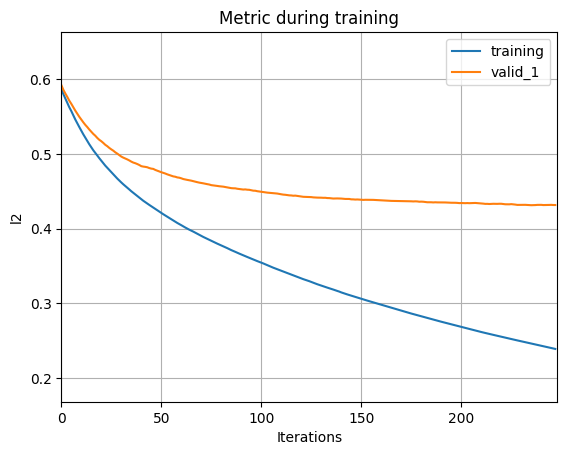

----> || Train Optimized QWK SCORE ::  0.781
----> || Val Optimized QWK SCORE ::  0.525
----> || Train Optimized Val QWK SCORE ::  0.507
----> || Val Optimized Train QWK SCORE ::  0.750
Fold 1 - Rounded Train QWK: 0.6697, Rounded Validation QWK: 0.3726


<Figure size 640x480 with 0 Axes>

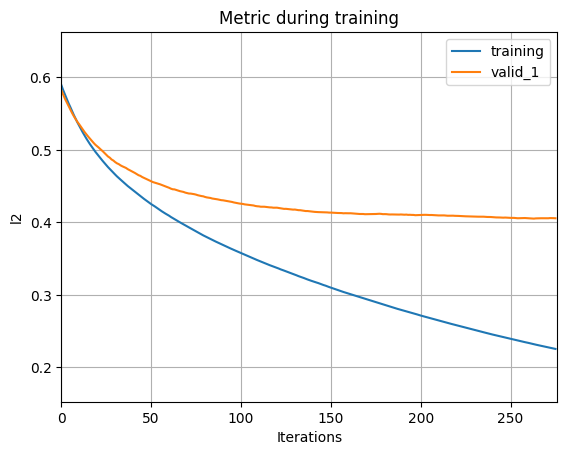

----> || Train Optimized QWK SCORE ::  0.799
----> || Val Optimized QWK SCORE ::  0.481
----> || Train Optimized Val QWK SCORE ::  0.507
----> || Val Optimized Train QWK SCORE ::  0.725
Fold 2 - Rounded Train QWK: 0.7014, Rounded Validation QWK: 0.4721


<Figure size 640x480 with 0 Axes>

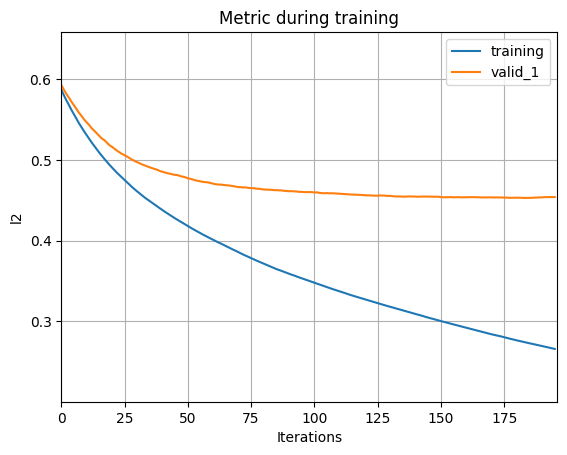

----> || Train Optimized QWK SCORE ::  0.749
----> || Val Optimized QWK SCORE ::  0.497
----> || Train Optimized Val QWK SCORE ::  0.475
----> || Val Optimized Train QWK SCORE ::  0.741
Fold 3 - Rounded Train QWK: 0.6506, Rounded Validation QWK: 0.3491


<Figure size 640x480 with 0 Axes>

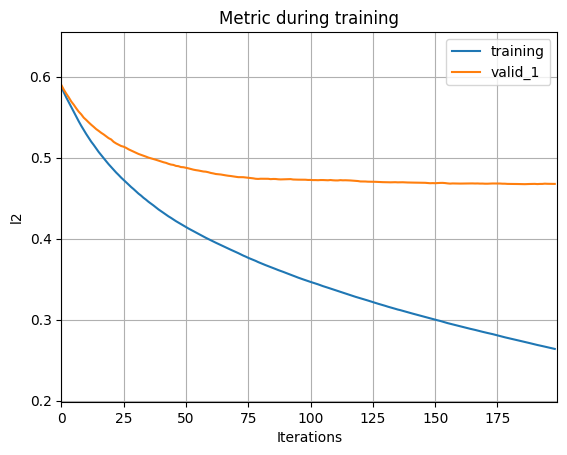

----> || Train Optimized QWK SCORE ::  0.755
----> || Val Optimized QWK SCORE ::  0.347
----> || Train Optimized Val QWK SCORE ::  0.455
----> || Val Optimized Train QWK SCORE ::  0.643
Fold 4 - Rounded Train QWK: 0.6561, Rounded Validation QWK: 0.3428


<Figure size 640x480 with 0 Axes>

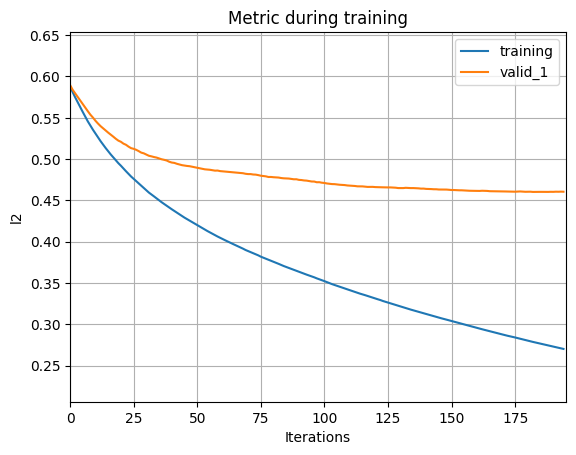

----> || Train Optimized QWK SCORE ::  0.740
----> || Val Optimized QWK SCORE ::  0.463
----> || Train Optimized Val QWK SCORE ::  0.439
----> || Val Optimized Train QWK SCORE ::  0.730
Fold 5 - Rounded Train QWK: 0.6293, Rounded Validation QWK: 0.3548
Mean Train QWK --> 0.7648
Mean Validation QWK ---> 0.4624
----> || Optimized QWK SCORE ::  0.488


In [210]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_selected2_df, test_selected2_df, 150)

In [211]:
lgb_optuna_study.best_params

{'learning_rate': 0.04041370663646715,
 'early_stopping_round': 12,
 'max_depth': 15,
 'min_data_in_leaf': 65,
 'num_leaves': 153,
 'min_gain_to_split': 0.016035651982497616,
 'lambda_l1': 1.3579604109934778,
 'lambda_l2': 234.5052245180317}

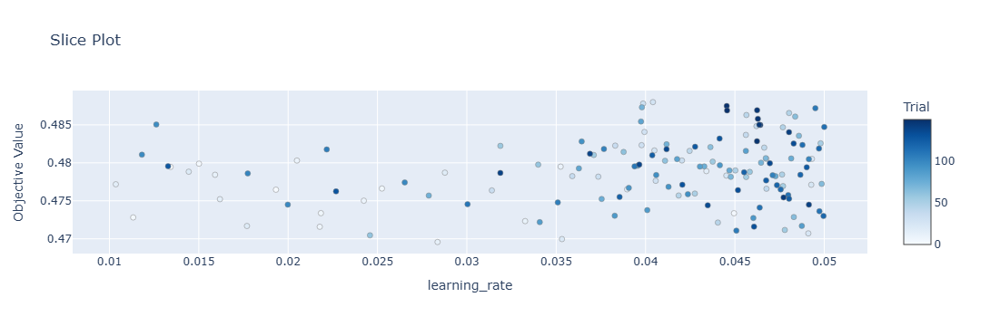

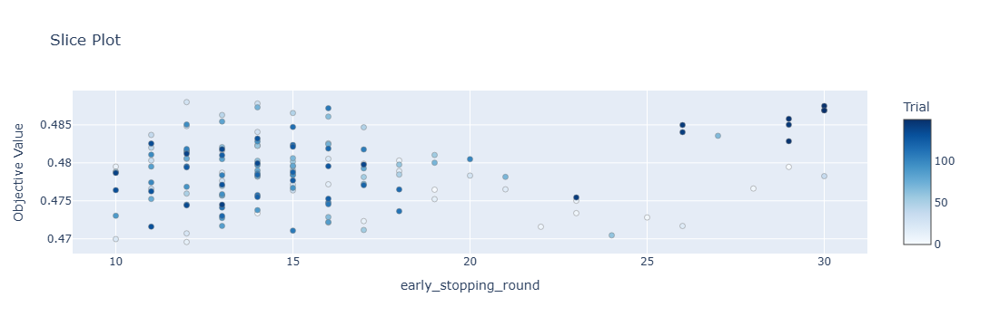

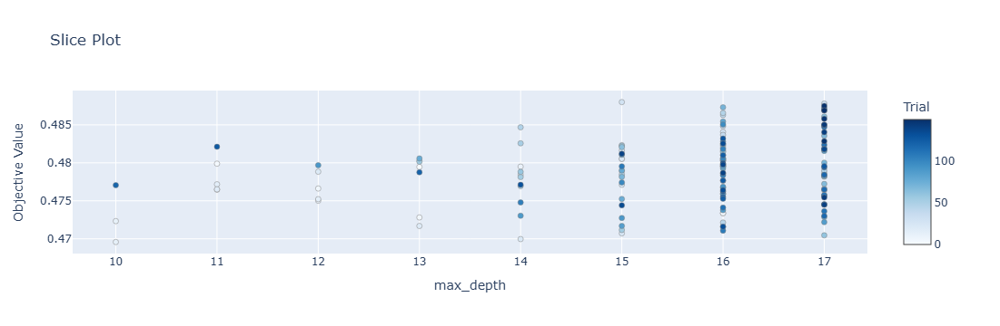

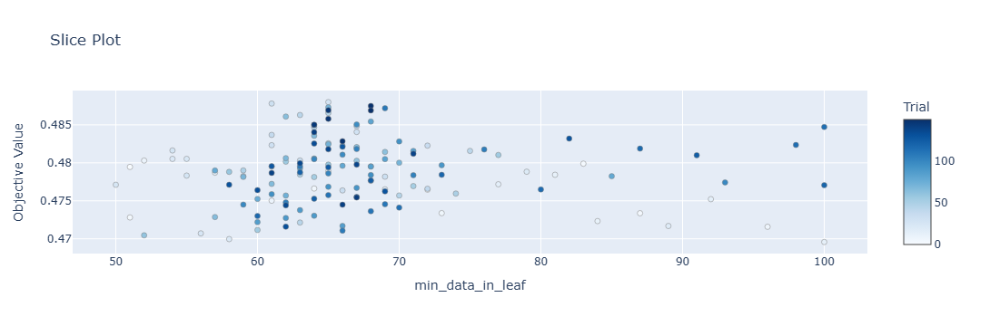

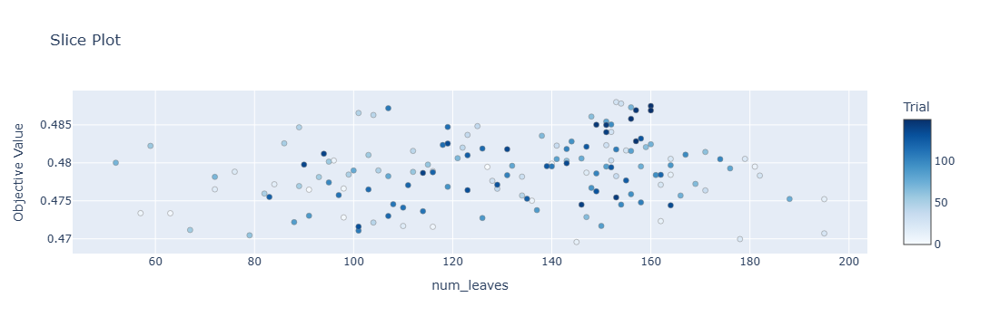

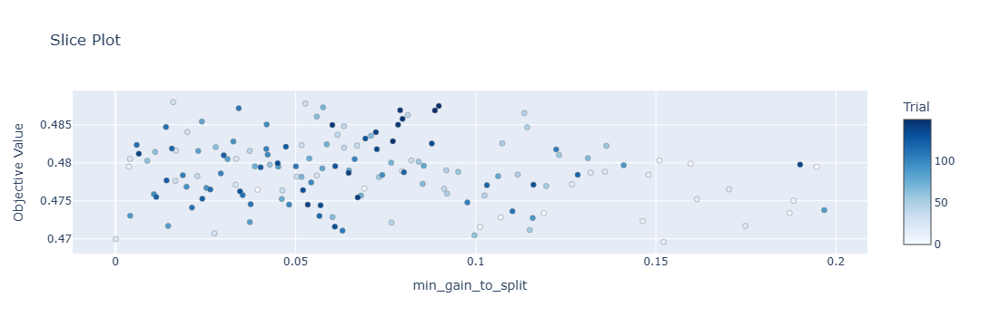

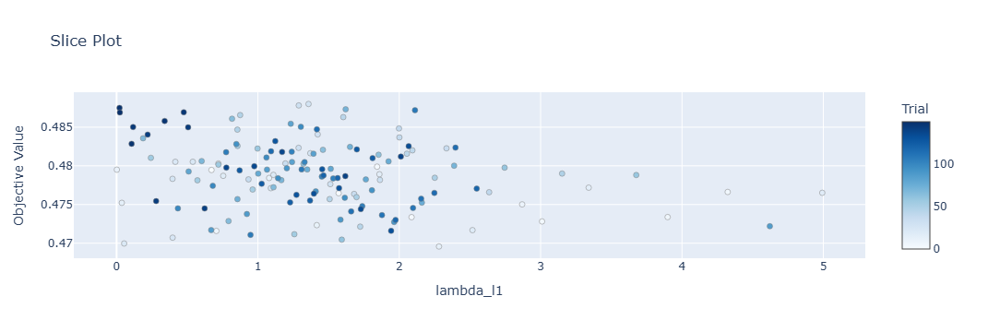

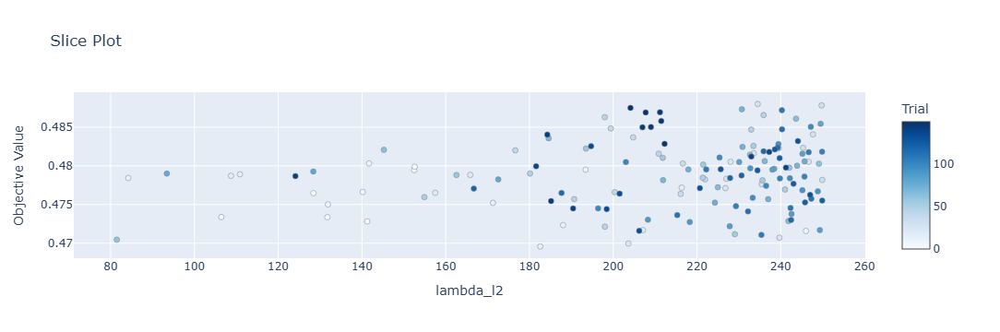

In [212]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

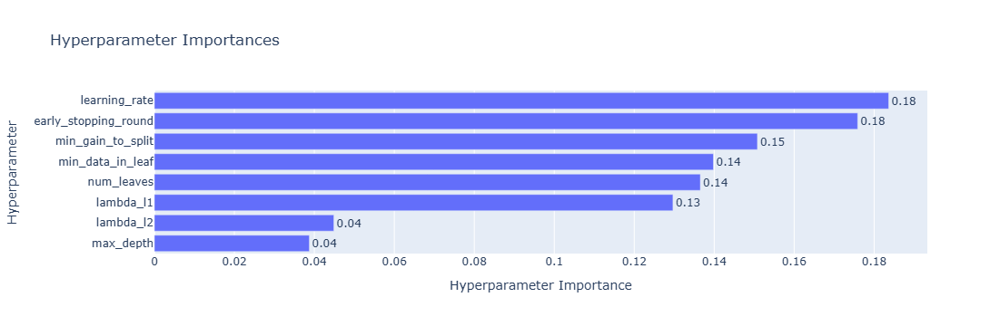

In [217]:
plot_param_importances(lgb_optuna_study)

In [218]:
cols = train_selected2_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
print(imp_df.shape)
imp_df

(342, 2)


,Feature,Importance
34,SDS-SDS_Total_Raw,136.0
33,PreInt_EduHx-computerinternet_hoursday,93.8
28,Physical-Height,48.4
7,Basic_Demos-Age,39.0
17,FMI_BFP,37.8
15,FGC-FGC_PU,37.6
8,Basic_Demos-Sex_0,31.0
12,FGC-FGC_CU,30.8
29,Physical-Systolic_BP,29.4
9,Basic_Demos-Sex_1,26.8


In [220]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [221]:
train_selected3_df = train_selected2_df.drop(unimportant_cols, axis=1)
print(train_selected3_df.shape)
train_selected3_df.head()

(2736, 179)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,Z_std,anglez_max,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_5_entropy,Y_weekday_4_entropy,Y_weekday_6_sum,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_90%,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_min,Z_weekday_5_std,Z_weekday_5_sum,Z_weekday_6_min,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_7_20%,anglez_weekday_3_entropy,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_22_entropy,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_3_sum,Y_time_of_day_hour_window_4_mean,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_6_entropy,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_entropy,Y_time_of_day_hour_window_14_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_16_sum,Y_time_of_day_hour_window_17_entropy,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_max,Y_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_10%,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_min,Z_time_of_day_hour_window_3_mean,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_min,Z_time_of_day_hour_window_11_std,Z_time_of_day_hour_window_11_entropy,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_3%,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_20_entropy,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_21_1%,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_1_max,enmo_time_of_day_hour_window_4_max,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_10_sum,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_1

In [222]:
test_selected3_df = test_selected2_df.drop(unimportant_cols, axis=1)
print(test_selected3_df.shape)
test_selected3_df.head()

(20, 178)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,Z_std,anglez_max,X_weekday_3_min,X_weekday_3_max,X_weekday_4_mean,X_weekday_5_entropy,Y_weekday_4_entropy,Y_weekday_6_sum,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_2_90%,Z_weekday_3_max,Z_weekday_3_entropy,Z_weekday_4_mean,Z_weekday_4_min,Z_weekday_5_std,Z_weekday_5_sum,Z_weekday_6_min,enmo_weekday_3_mean,enmo_weekday_3_std,enmo_weekday_7_20%,anglez_weekday_3_entropy,light_weekday_3_80%,light_weekday_3_max,light_weekday_4_std,light_weekday_4_max,light_weekday_4_entropy,battery_use_since_wear_weekday_2_min,battery_use_since_wear_weekday_2_35%,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_3_35%,battery_use_since_wear_weekday_5_max,battery_use_since_wear_weekday_6_max,battery_use_since_wear_weekday_7_35%,battery_use_since_wear_weekday_7_95%,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_2_mean,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_3_entropy,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_sum,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_7_min,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_18_entropy,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_22_sum,X_time_of_day_hour_window_22_entropy,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_mean,Y_time_of_day_hour_window_2_std,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_3_sum,Y_time_of_day_hour_window_4_mean,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_6_entropy,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_7_entropy,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_12_entropy,Y_time_of_day_hour_window_14_max,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_16_sum,Y_time_of_day_hour_window_17_entropy,Y_time_of_day_hour_window_19_sum,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_21_sum,Y_time_of_day_hour_window_21_entropy,Y_time_of_day_hour_window_22_max,Y_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_10%,Z_time_of_day_hour_window_1_sum,Z_time_of_day_hour_window_2_min,Z_time_of_day_hour_window_3_mean,Z_time_of_day_hour_window_5_mean,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_10_min,Z_time_of_day_hour_window_11_std,Z_time_of_day_hour_window_11_entropy,Z_time_of_day_hour_window_12_entropy,Z_time_of_day_hour_window_13_min,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_3%,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_20_max,Z_time_of_day_hour_window_20_entropy,Z_time_of_day_hour_window_21_mean,Z_time_of_day_hour_window_21_1%,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_22_max,Z_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_23_mean,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_1_max,enmo_time_of_day_hour_window_4_max,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_10_sum,enmo_time_of_day_hour_window_15_10%,enmo_time_of_day_hour_window_1

[I 2024-12-14 00:16:41,194] A new study created in memory with name: no-name-e590857a-4fe9-4712-ab4a-08b728a9e4f8
[I 2024-12-14 00:16:44,280] Trial 0 finished with value: 0.49031386464807514 and parameters: {'learning_rate': 0.058613556048777174, 'early_stopping_round': 22, 'max_depth': 18, 'min_data_in_leaf': 56, 'num_leaves': 86, 'min_gain_to_split': 0.15936866559226184, 'lambda_l1': 0.5676783718810879, 'lambda_l2': 201.4707094019185}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:16:47,337] Trial 1 finished with value: 0.4831402565163426 and parameters: {'learning_rate': 0.05202784394246325, 'early_stopping_round': 16, 'max_depth': 19, 'min_data_in_leaf': 98, 'num_leaves': 137, 'min_gain_to_split': 0.019803761972014923, 'lambda_l1': 2.996349470508299, 'lambda_l2': 287.7762445789618}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:16:51,416] Trial 2 finished with value: 0.4850801025565675 and parameters: {'learning_rate': 0.03690924483251963, 'early_stopping_round': 14, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 82, 'min_gain_to_split': 0.16238523641671876, 'lambda_l1': 1.5962850752982938, 'lambda_l2': 221.52537294699374}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:16:57,699] Trial 3 finished with value: 0.48164975110568964 and parameters: {'learning_rate': 0.01903002254216745, 'early_stopping_round': 18, 'max_depth': 18, 'min_data_in_leaf': 79, 'num_leaves': 117, 'min_gain_to_split': 0.09001186745164139, 'lambda_l1': 1.8059366313766008, 'lambda_l2': 196.34163387963014}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:17:02,715] Trial 4 finished with value: 0.4828811100178444 and parameters: {'learning_rate': 0.03061655778792629, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 66, 'min_gain_to_split': 0.06665682185079068, 'lambda_l1': 2.330301465566222, 'lambda_l2': 181.7510360587812}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:17:07,310] Trial 5 finished with value: 0.4876635029193642 and parameters: {'learning_rate': 0.03939405435611236, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 53, 'num_leaves': 86, 'min_gain_to_split': 0.17108383076750383, 'lambda_l1': 3.7162712808533294, 'lambda_l2': 190.42972976351686}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:17:14,327] Trial 6 finished with value: 0.4893399041980996 and parameters: {'learning_rate': 0.014523816080236888, 'early_stopping_round': 24, 'max_depth': 19, 'min_data_in_leaf': 99, 'num_leaves': 123, 'min_gain_to_split': 0.07391279943564566, 'lambda_l1': 0.28858611548751467, 'lambda_l2': 164.1877091239624}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:17:18,788] Trial 7 finished with value: 0.48371034038464533 and parameters: {'learning_rate': 0.0389400350968225, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 67, 'num_leaves': 115, 'min_gain_to_split': 0.056583917105118654, 'lambda_l1': 1.2415797475687902, 'lambda_l2': 214.46129117485572}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:17:23,712] Trial 8 finished with value: 0.48919651486923754 and parameters: {'learning_rate': 0.03664922113280529, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 172, 'min_gain_to_split': 0.07418734580682565, 'lambda_l1': 0.35876135826328037, 'lambda_l2': 190.27778882949502}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:17:30,057] Trial 9 finished with value: 0.4874212866218812 and parameters: {'learning_rate': 0.023315620157825605, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 70, 'num_leaves': 173, 'min_gain_to_split': 0.18496824830333114, 'lambda_l1': 1.1955428752145987, 'lambda_l2': 174.43661059172913}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:17:33,367] Trial 10 finished with value: 0.48929100180950824 and parameters: {'learning_rate': 0.06783253418040966, 'early_stopping_round': 40, 'max_depth': 20, 'min_data_in_leaf': 81, 'num_leaves': 67, 'min_gain_to_split': 0.12274649417427962, 'lambda_l1': 4.834086877314507, 'lambda_l2': 252.00359407999957}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:17:40,927] Trial 11 finished with value: 0.4848021134228565 and parameters: {'learning_rate': 0.010126275567362272, 'early_stopping_round': 10, 'max_depth': 20, 'min_data_in_leaf': 100, 'num_leaves': 142, 'min_gain_to_split': 0.1287595224185727, 'lambda_l1': 0.01824225052298223, 'lambda_l2': 156.30362342469007}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:17:44,094] Trial 12 finished with value: 0.4853252719525838 and parameters: {'learning_rate': 0.05546553676304593, 'early_stopping_round': 35, 'max_depth': 18, 'min_data_in_leaf': 88, 'num_leaves': 100, 'min_gain_to_split': 0.12778067625932243, 'lambda_l1': 0.6267611077157057, 'lambda_l2': 152.38438847066578}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:17:47,644] Trial 13 finished with value: 0.4795659823059505 and parameters: {'learning_rate': 0.052488799251748514, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 88, 'num_leaves': 196, 'min_gain_to_split': 0.027082943900034483, 'lambda_l1': 0.6320650368494335, 'lambda_l2': 246.9696106511771}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:17:50,776] Trial 14 finished with value: 0.4747040492431186 and parameters: {'learning_rate': 0.06668751209622484, 'early_stopping_round': 21, 'max_depth': 19, 'min_data_in_leaf': 51, 'num_leaves': 102, 'min_gain_to_split': 0.14758611338302718, 'lambda_l1': 2.350806141678636, 'lambda_l2': 165.89026312452296}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:17:53,868] Trial 15 finished with value: 0.4848615464132414 and parameters: {'learning_rate': 0.056869338156291055, 'early_stopping_round': 28, 'max_depth': 17, 'min_data_in_leaf': 91, 'num_leaves': 147, 'min_gain_to_split': 0.1989240800257383, 'lambda_l1': 0.904087870460714, 'lambda_l2': 202.98356567375131}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:17:57,605] Trial 16 finished with value: 0.4875567381436845 and parameters: {'learning_rate': 0.046288063520752584, 'early_stopping_round': 34, 'max_depth': 19, 'min_data_in_leaf': 74, 'num_leaves': 57, 'min_gain_to_split': 0.0966008873040071, 'lambda_l1': 0.07322117409720369, 'lambda_l2': 249.10000660173182}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:18:11,797] Trial 17 finished with value: 0.4872107097810717 and parameters: {'learning_rate': 0.010251685394123494, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 91, 'min_gain_to_split': 0.03747726272220063, 'lambda_l1': 3.329311747144632, 'lambda_l2': 292.8981946845904}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:18:14,881] Trial 18 finished with value: 0.48544756836399217 and parameters: {'learning_rate': 0.06276625572883979, 'early_stopping_round': 13, 'max_depth': 17, 'min_data_in_leaf': 80, 'num_leaves': 158, 'min_gain_to_split': 0.11265098225606562, 'lambda_l1': 1.7982664477812649, 'lambda_l2': 235.1013167688033}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:18:18,049] Trial 19 finished with value: 0.4825489628377432 and parameters: {'learning_rate': 0.04576736924251366, 'early_stopping_round': 20, 'max_depth': 15, 'min_data_in_leaf': 94, 'num_leaves': 126, 'min_gain_to_split': 0.1460251260535395, 'lambda_l1': 4.208778295262188, 'lambda_l2': 209.6248793628943}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:18:24,912] Trial 20 finished with value: 0.4830298020571331 and parameters: {'learning_rate': 0.02574469616654148, 'early_stopping_round': 32, 'max_depth': 20, 'min_data_in_leaf': 72, 'num_leaves': 109, 'min_gain_to_split': 0.08430826211567258, 'lambda_l1': 1.1972872606895426, 'lambda_l2': 275.15106922961405}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:18:28,078] Trial 21 finished with value: 0.4872475637955831 and parameters: {'learning_rate': 0.06965125421630236, 'early_stopping_round': 39, 'max_depth': 20, 'min_data_in_leaf': 82, 'num_leaves': 71, 'min_gain_to_split': 0.11476915816130226, 'lambda_l1': 4.618154432686582, 'lambda_l2': 259.1327419848192}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:18:31,317] Trial 22 finished with value: 0.48504066940095525 and parameters: {'learning_rate': 0.06201977841190605, 'early_stopping_round': 40, 'max_depth': 19, 'min_data_in_leaf': 85, 'num_leaves': 53, 'min_gain_to_split': 0.14243551501196247, 'lambda_l1': 4.882539064029974, 'lambda_l2': 231.0729617633874}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:18:34,292] Trial 23 finished with value: 0.48434760717651637 and parameters: {'learning_rate': 0.061450752375435784, 'early_stopping_round': 27, 'max_depth': 20, 'min_data_in_leaf': 77, 'num_leaves': 73, 'min_gain_to_split': 0.11319891542160124, 'lambda_l1': 2.9226570109363506, 'lambda_l2': 174.0627484269942}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:18:38,424] Trial 24 finished with value: 0.48578119337242476 and parameters: {'learning_rate': 0.04694811646436313, 'early_stopping_round': 37, 'max_depth': 18, 'min_data_in_leaf': 94, 'num_leaves': 94, 'min_gain_to_split': 0.0570072290778792, 'lambda_l1': 3.8700590249856575, 'lambda_l2': 274.2323869690262}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:18:41,382] Trial 25 finished with value: 0.4827583384489462 and parameters: {'learning_rate': 0.06994447420446523, 'early_stopping_round': 23, 'max_depth': 19, 'min_data_in_leaf': 68, 'num_leaves': 130, 'min_gain_to_split': 0.16162140635436423, 'lambda_l1': 0.4088211558211978, 'lambda_l2': 239.9277512205124}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:18:45,837] Trial 26 finished with value: 0.48141809752454023 and parameters: {'learning_rate': 0.03271166541533936, 'early_stopping_round': 30, 'max_depth': 20, 'min_data_in_leaf': 85, 'num_leaves': 79, 'min_gain_to_split': 0.13255455691801124, 'lambda_l1': 2.5924192282566634, 'lambda_l2': 221.6346405143256}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:18:53,875] Trial 27 finished with value: 0.4875858209337429 and parameters: {'learning_rate': 0.0164547490207466, 'early_stopping_round': 18, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 61, 'min_gain_to_split': 0.10610736659621495, 'lambda_l1': 2.011674685802961, 'lambda_l2': 256.13991217266306}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:18:56,816] Trial 28 finished with value: 0.47516443159302757 and parameters: {'learning_rate': 0.060017151412565764, 'early_stopping_round': 22, 'max_depth': 17, 'min_data_in_leaf': 96, 'num_leaves': 51, 'min_gain_to_split': 0.045382444136581296, 'lambda_l1': 4.274179235834881, 'lambda_l2': 163.14047407319333}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.475


[I 2024-12-14 00:18:59,616] Trial 29 finished with value: 0.48141762227995544 and parameters: {'learning_rate': 0.051247450686706525, 'early_stopping_round': 17, 'max_depth': 19, 'min_data_in_leaf': 98, 'num_leaves': 111, 'min_gain_to_split': 0.17649590726081493, 'lambda_l1': 3.472881471106895, 'lambda_l2': 273.63191843091806}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:19:02,810] Trial 30 finished with value: 0.48348953615688206 and parameters: {'learning_rate': 0.06557623198722287, 'early_stopping_round': 33, 'max_depth': 19, 'min_data_in_leaf': 91, 'num_leaves': 79, 'min_gain_to_split': 0.007874998864833116, 'lambda_l1': 0.9273469417612641, 'lambda_l2': 205.6335710851821}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:19:07,659] Trial 31 finished with value: 0.48559688986960314 and parameters: {'learning_rate': 0.03318577934235359, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 63, 'num_leaves': 185, 'min_gain_to_split': 0.07784305890493322, 'lambda_l1': 0.30738474421094075, 'lambda_l2': 188.12770660359658}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:19:11,619] Trial 32 finished with value: 0.4843375366308499 and parameters: {'learning_rate': 0.042397050944957944, 'early_stopping_round': 26, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 160, 'min_gain_to_split': 0.07190207779779763, 'lambda_l1': 0.4137672815639626, 'lambda_l2': 179.13810544466295}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:19:17,310] Trial 33 finished with value: 0.48636400903351795 and parameters: {'learning_rate': 0.027074931575375348, 'early_stopping_round': 37, 'max_depth': 18, 'min_data_in_leaf': 63, 'num_leaves': 136, 'min_gain_to_split': 0.15693033298358022, 'lambda_l1': 0.7698133504814324, 'lambda_l2': 197.0868310846452}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:19:24,049] Trial 34 finished with value: 0.48708346840452055 and parameters: {'learning_rate': 0.018708591591828954, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 170, 'min_gain_to_split': 0.09186025255974203, 'lambda_l1': 1.4037501343389596, 'lambda_l2': 190.1776911409887}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:19:28,049] Trial 35 finished with value: 0.48691417974205 and parameters: {'learning_rate': 0.05749548302137273, 'early_stopping_round': 36, 'max_depth': 17, 'min_data_in_leaf': 56, 'num_leaves': 122, 'min_gain_to_split': 0.0682698982003789, 'lambda_l1': 0.2737070111881472, 'lambda_l2': 216.04128778203594}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:19:37,436] Trial 36 finished with value: 0.4888683387520161 and parameters: {'learning_rate': 0.014812518661734308, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 152, 'min_gain_to_split': 0.05453405338185649, 'lambda_l1': 1.6518274721464443, 'lambda_l2': 168.29097393957534}. Best is trial 0 with value: 0.49031386464807514.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:19:41,342] Trial 37 finished with value: 0.4953796008946064 and parameters: {'learning_rate': 0.0523369361886938, 'early_stopping_round': 24, 'max_depth': 18, 'min_data_in_leaf': 50, 'num_leaves': 200, 'min_gain_to_split': 0.10217994669843941, 'lambda_l1': 2.8846803586024055, 'lambda_l2': 199.50574915902206}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:19:45,173] Trial 38 finished with value: 0.4802139392302722 and parameters: {'learning_rate': 0.05109780221969029, 'early_stopping_round': 23, 'max_depth': 19, 'min_data_in_leaf': 55, 'num_leaves': 63, 'min_gain_to_split': 0.09940222250140276, 'lambda_l1': 2.777258137374452, 'lambda_l2': 224.96758663513927}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:19:48,413] Trial 39 finished with value: 0.480071347159715 and parameters: {'learning_rate': 0.06601291255659572, 'early_stopping_round': 19, 'max_depth': 20, 'min_data_in_leaf': 50, 'num_leaves': 84, 'min_gain_to_split': 0.12584392417045062, 'lambda_l1': 2.1810014007382077, 'lambda_l2': 183.8794946476266}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:19:52,423] Trial 40 finished with value: 0.482457849257255 and parameters: {'learning_rate': 0.05422639620535811, 'early_stopping_round': 25, 'max_depth': 18, 'min_data_in_leaf': 52, 'num_leaves': 103, 'min_gain_to_split': 0.08173932608819326, 'lambda_l1': 3.255037620817264, 'lambda_l2': 198.34784916566326}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:19:57,530] Trial 41 finished with value: 0.48722474632261903 and parameters: {'learning_rate': 0.03561927154445256, 'early_stopping_round': 24, 'max_depth': 18, 'min_data_in_leaf': 54, 'num_leaves': 191, 'min_gain_to_split': 0.08654332558068117, 'lambda_l1': 0.605670652344783, 'lambda_l2': 213.93006833515014}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:20:01,627] Trial 42 finished with value: 0.48789871240817473 and parameters: {'learning_rate': 0.04328193675314924, 'early_stopping_round': 21, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 176, 'min_gain_to_split': 0.0625830428103239, 'lambda_l1': 1.027624966688931, 'lambda_l2': 158.2472460571741}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:20:04,986] Trial 43 finished with value: 0.4863000079349892 and parameters: {'learning_rate': 0.05928263061770678, 'early_stopping_round': 26, 'max_depth': 19, 'min_data_in_leaf': 66, 'num_leaves': 182, 'min_gain_to_split': 0.12171668198945476, 'lambda_l1': 0.04623453642204156, 'lambda_l2': 195.06957231208403}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:20:11,002] Trial 44 finished with value: 0.48379186201653235 and parameters: {'learning_rate': 0.02166163178897006, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 71, 'num_leaves': 164, 'min_gain_to_split': 0.1922792057224324, 'lambda_l1': 1.386461464252148, 'lambda_l2': 178.8476552394172}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:20:14,158] Trial 45 finished with value: 0.48850603194381514 and parameters: {'learning_rate': 0.0638789628010845, 'early_stopping_round': 22, 'max_depth': 18, 'min_data_in_leaf': 50, 'num_leaves': 194, 'min_gain_to_split': 0.10524234461654995, 'lambda_l1': 3.779609466051515, 'lambda_l2': 152.09033847853482}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:20:18,992] Trial 46 finished with value: 0.49045591858099113 and parameters: {'learning_rate': 0.029790373310511778, 'early_stopping_round': 24, 'max_depth': 20, 'min_data_in_leaf': 61, 'num_leaves': 139, 'min_gain_to_split': 0.13678218429312028, 'lambda_l1': 0.5693917817011376, 'lambda_l2': 172.1293376251585}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:20:24,460] Trial 47 finished with value: 0.4793080469588965 and parameters: {'learning_rate': 0.02922902837651767, 'early_stopping_round': 24, 'max_depth': 20, 'min_data_in_leaf': 52, 'num_leaves': 136, 'min_gain_to_split': 0.13449105121479146, 'lambda_l1': 0.688625001405588, 'lambda_l2': 171.87176907818852}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:20:28,146] Trial 48 finished with value: 0.48469265834976594 and parameters: {'learning_rate': 0.03935999390468202, 'early_stopping_round': 20, 'max_depth': 20, 'min_data_in_leaf': 57, 'num_leaves': 92, 'min_gain_to_split': 0.17232665310586504, 'lambda_l1': 4.943290185274732, 'lambda_l2': 161.15827256047302}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:20:31,180] Trial 49 finished with value: 0.4881304042330471 and parameters: {'learning_rate': 0.048205660315258136, 'early_stopping_round': 13, 'max_depth': 19, 'min_data_in_leaf': 76, 'num_leaves': 71, 'min_gain_to_split': 0.1502396795172952, 'lambda_l1': 4.191670422242326, 'lambda_l2': 184.6875212436232}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:20:37,353] Trial 50 finished with value: 0.4902125508330297 and parameters: {'learning_rate': 0.022754687394740215, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 200, 'min_gain_to_split': 0.13901020957290547, 'lambda_l1': 2.0379023213280414, 'lambda_l2': 203.7182494712321}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:20:47,300] Trial 51 finished with value: 0.49008652173585643 and parameters: {'learning_rate': 0.013012303673474638, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 198, 'min_gain_to_split': 0.13556595892383227, 'lambda_l1': 1.9705742761784544, 'lambda_l2': 203.07168501623508}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:20:56,553] Trial 52 finished with value: 0.484633218542456 and parameters: {'learning_rate': 0.01431944325353321, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 188, 'min_gain_to_split': 0.14040163194110372, 'lambda_l1': 2.557849606997269, 'lambda_l2': 204.86966783583316}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:21:03,662] Trial 53 finished with value: 0.4845030907326672 and parameters: {'learning_rate': 0.02207090316948424, 'early_stopping_round': 28, 'max_depth': 13, 'min_data_in_leaf': 62, 'num_leaves': 196, 'min_gain_to_split': 0.16407292305387522, 'lambda_l1': 1.9524823864132401, 'lambda_l2': 213.96780411149712}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:21:10,498] Trial 54 finished with value: 0.4823767544092429 and parameters: {'learning_rate': 0.0191488949634331, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 198, 'min_gain_to_split': 0.152596842833235, 'lambda_l1': 2.290994984396735, 'lambda_l2': 202.68764699944057}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:21:20,436] Trial 55 finished with value: 0.4831863378461885 and parameters: {'learning_rate': 0.012100692160852295, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 180, 'min_gain_to_split': 0.13845412261591203, 'lambda_l1': 3.0539931551499606, 'lambda_l2': 194.54724464451664}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:21:27,434] Trial 56 finished with value: 0.4900892927638525 and parameters: {'learning_rate': 0.024523402388005516, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 57, 'num_leaves': 145, 'min_gain_to_split': 0.11983459417365017, 'lambda_l1': 1.6813474255985157, 'lambda_l2': 208.82842894019953}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:21:34,029] Trial 57 finished with value: 0.4862001069847376 and parameters: {'learning_rate': 0.02477208655361548, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 149, 'min_gain_to_split': 0.11998748509424813, 'lambda_l1': 1.6508242120931689, 'lambda_l2': 219.1262023028998}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:21:39,444] Trial 58 finished with value: 0.4832796735242677 and parameters: {'learning_rate': 0.028633515254047105, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 142, 'min_gain_to_split': 0.18146800962155, 'lambda_l1': 1.9682708376450238, 'lambda_l2': 209.68640508357782}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:21:47,189] Trial 59 finished with value: 0.4872897121987697 and parameters: {'learning_rate': 0.018534949095891824, 'early_stopping_round': 31, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 190, 'min_gain_to_split': 0.1605654753860357, 'lambda_l1': 1.387120622013737, 'lambda_l2': 228.38212593372222}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:21:52,619] Trial 60 finished with value: 0.48757372499657403 and parameters: {'learning_rate': 0.030749249544049603, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 61, 'num_leaves': 168, 'min_gain_to_split': 0.10582486506192336, 'lambda_l1': 2.448516539303661, 'lambda_l2': 210.46001043096356}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:22:03,216] Trial 61 finished with value: 0.48977791155969863 and parameters: {'learning_rate': 0.012853567492204183, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 200, 'min_gain_to_split': 0.13165747913740863, 'lambda_l1': 2.1224204052356086, 'lambda_l2': 202.40258293465877}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:22:13,847] Trial 62 finished with value: 0.48262131410746933 and parameters: {'learning_rate': 0.011519803063004513, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 200, 'min_gain_to_split': 0.13129625329946157, 'lambda_l1': 2.1536768480858766, 'lambda_l2': 200.55554251033305}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:22:22,226] Trial 63 finished with value: 0.4833997855198394 and parameters: {'learning_rate': 0.016682913619540107, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 58, 'num_leaves': 178, 'min_gain_to_split': 0.11786707217244924, 'lambda_l1': 1.78112588263488, 'lambda_l2': 192.82567814417766}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:22:28,514] Trial 64 finished with value: 0.48982001112526363 and parameters: {'learning_rate': 0.023599401081858862, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 185, 'min_gain_to_split': 0.1464397076059547, 'lambda_l1': 2.730615806923126, 'lambda_l2': 186.98935905982856}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:22:34,418] Trial 65 finished with value: 0.48921008657232146 and parameters: {'learning_rate': 0.023539315837272493, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 185, 'min_gain_to_split': 0.1445443245307334, 'lambda_l1': 2.5653877663755806, 'lambda_l2': 187.13272048524914}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:22:40,258] Trial 66 finished with value: 0.4894221762862956 and parameters: {'learning_rate': 0.02618810005507686, 'early_stopping_round': 21, 'max_depth': 12, 'min_data_in_leaf': 64, 'num_leaves': 131, 'min_gain_to_split': 0.1658766999579733, 'lambda_l1': 2.772121961114518, 'lambda_l2': 178.6115682769099}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:22:47,173] Trial 67 finished with value: 0.48926028479179196 and parameters: {'learning_rate': 0.021689035653424893, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 193, 'min_gain_to_split': 0.15554136623478595, 'lambda_l1': 3.1077706462435866, 'lambda_l2': 206.94600003614917}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:22:53,960] Trial 68 finished with value: 0.4791684567893335 and parameters: {'learning_rate': 0.03192319249941148, 'early_stopping_round': 28, 'max_depth': 15, 'min_data_in_leaf': 52, 'num_leaves': 117, 'min_gain_to_split': 0.11032443139562069, 'lambda_l1': 2.3627337672357474, 'lambda_l2': 191.73401766088458}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:23:01,173] Trial 69 finished with value: 0.48699984331088675 and parameters: {'learning_rate': 0.0199388922030864, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 154, 'min_gain_to_split': 0.13734553885789336, 'lambda_l1': 2.7816534296524735, 'lambda_l2': 170.4328560969564}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:23:05,576] Trial 70 finished with value: 0.4863465186264748 and parameters: {'learning_rate': 0.03661551077110773, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 69, 'num_leaves': 188, 'min_gain_to_split': 0.14737083424821745, 'lambda_l1': 1.0836936369652932, 'lambda_l2': 219.81779392174278}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:23:15,060] Trial 71 finished with value: 0.48284375111810796 and parameters: {'learning_rate': 0.01619594004981916, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 53, 'num_leaves': 199, 'min_gain_to_split': 0.12564256963858597, 'lambda_l1': 2.241173533566581, 'lambda_l2': 204.26700449599932}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:23:20,694] Trial 72 finished with value: 0.4896553481186 and parameters: {'learning_rate': 0.02765967897840732, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 200, 'min_gain_to_split': 0.12978731762104997, 'lambda_l1': 1.8217194015984808, 'lambda_l2': 209.61385016440155}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:23:28,072] Trial 73 finished with value: 0.4878859666513484 and parameters: {'learning_rate': 0.024136104828774624, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 55, 'num_leaves': 143, 'min_gain_to_split': 0.09506873288866532, 'lambda_l1': 2.1111643904035553, 'lambda_l2': 200.0314067338217}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:23:38,593] Trial 74 finished with value: 0.48568683321184813 and parameters: {'learning_rate': 0.013418577204327728, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 50, 'num_leaves': 194, 'min_gain_to_split': 0.14541033525402794, 'lambda_l1': 1.5177908752105727, 'lambda_l2': 181.8576386373745}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:23:46,839] Trial 75 finished with value: 0.4945880097455766 and parameters: {'learning_rate': 0.01996421106478419, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 54, 'num_leaves': 184, 'min_gain_to_split': 0.1356992068943306, 'lambda_l1': 2.7004168320444584, 'lambda_l2': 198.1333755144913}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:23:51,133] Trial 76 finished with value: 0.48398671345731614 and parameters: {'learning_rate': 0.034938422641734954, 'early_stopping_round': 21, 'max_depth': 12, 'min_data_in_leaf': 61, 'num_leaves': 173, 'min_gain_to_split': 0.1408584921061838, 'lambda_l1': 2.687871338336051, 'lambda_l2': 196.94026500417027}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:23:57,777] Trial 77 finished with value: 0.4852678575604481 and parameters: {'learning_rate': 0.020920441366108888, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 185, 'min_gain_to_split': 0.1150163826948084, 'lambda_l1': 2.9281448156552203, 'lambda_l2': 188.76398410813385}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:24:05,902] Trial 78 finished with value: 0.4863035971445826 and parameters: {'learning_rate': 0.017975425062046822, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 176, 'min_gain_to_split': 0.15312894899664548, 'lambda_l1': 3.246865115993766, 'lambda_l2': 177.4431205567671}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:24:09,124] Trial 79 finished with value: 0.4799051054929321 and parameters: {'learning_rate': 0.0554221048632849, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 124, 'min_gain_to_split': 0.1698812166303875, 'lambda_l1': 3.552578434287285, 'lambda_l2': 185.54927934567988}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:24:15,090] Trial 80 finished with value: 0.4904657763030351 and parameters: {'learning_rate': 0.029817517501756662, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 51, 'num_leaves': 182, 'min_gain_to_split': 0.12425399788329239, 'lambda_l1': 0.4959922868405331, 'lambda_l2': 215.6617243402102}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:24:21,888] Trial 81 finished with value: 0.47970665430648884 and parameters: {'learning_rate': 0.02599356094475356, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 51, 'num_leaves': 166, 'min_gain_to_split': 0.12141805526742867, 'lambda_l1': 0.27604738453963035, 'lambda_l2': 216.96262308568987}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:24:28,906] Trial 82 finished with value: 0.48262413939549276 and parameters: {'learning_rate': 0.022801437685404782, 'early_stopping_round': 30, 'max_depth': 12, 'min_data_in_leaf': 52, 'num_leaves': 181, 'min_gain_to_split': 0.13650622183711764, 'lambda_l1': 0.8174350537087915, 'lambda_l2': 225.33928739887634}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:24:34,365] Trial 83 finished with value: 0.48915988421219037 and parameters: {'learning_rate': 0.030524285179771384, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 55, 'num_leaves': 160, 'min_gain_to_split': 0.12666035994465458, 'lambda_l1': 0.5038771806519888, 'lambda_l2': 211.7540286583123}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:24:41,407] Trial 84 finished with value: 0.48789951299997336 and parameters: {'learning_rate': 0.020381656352079912, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 73, 'num_leaves': 184, 'min_gain_to_split': 0.15763792625957487, 'lambda_l1': 2.450576939022158, 'lambda_l2': 235.27429300717645}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:24:47,950] Trial 85 finished with value: 0.483583263802036 and parameters: {'learning_rate': 0.024887268402272903, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 53, 'num_leaves': 190, 'min_gain_to_split': 0.1500389274797879, 'lambda_l1': 0.47767966012960594, 'lambda_l2': 206.98761643279659}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:24:52,959] Trial 86 finished with value: 0.4861406144759338 and parameters: {'learning_rate': 0.04129300477946718, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 51, 'num_leaves': 196, 'min_gain_to_split': 0.10099952871831262, 'lambda_l1': 0.19547717153466349, 'lambda_l2': 197.02194938883318}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:24:58,297] Trial 87 finished with value: 0.48146980410339646 and parameters: {'learning_rate': 0.03404649169282429, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 187, 'min_gain_to_split': 0.1348639857477461, 'lambda_l1': 1.2301613604636263, 'lambda_l2': 190.92233978888876}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:25:05,027] Trial 88 finished with value: 0.4836430710503544 and parameters: {'learning_rate': 0.027722707394493472, 'early_stopping_round': 32, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 174, 'min_gain_to_split': 0.11689730410740551, 'lambda_l1': 0.9837860845257587, 'lambda_l2': 224.19060796148108}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:25:09,562] Trial 89 finished with value: 0.48190112676330366 and parameters: {'learning_rate': 0.03795946040363561, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 65, 'num_leaves': 193, 'min_gain_to_split': 0.10830050645135737, 'lambda_l1': 2.865139374937718, 'lambda_l2': 199.39211572270813}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:25:15,074] Trial 90 finished with value: 0.4891883532582979 and parameters: {'learning_rate': 0.029996757748125887, 'early_stopping_round': 22, 'max_depth': 12, 'min_data_in_leaf': 62, 'num_leaves': 131, 'min_gain_to_split': 0.1250025587419973, 'lambda_l1': 2.6576014697735575, 'lambda_l2': 214.67835232070482}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:25:28,193] Trial 91 finished with value: 0.486554329157709 and parameters: {'learning_rate': 0.010161101502472413, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 191, 'min_gain_to_split': 0.1314919085117447, 'lambda_l1': 1.881368884369858, 'lambda_l2': 202.57982866772286}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:25:37,515] Trial 92 finished with value: 0.4917263920823215 and parameters: {'learning_rate': 0.015277612695121245, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 60, 'num_leaves': 196, 'min_gain_to_split': 0.13924901089421218, 'lambda_l1': 2.061844078415624, 'lambda_l2': 206.28038747685676}. Best is trial 37 with value: 0.4953796008946064.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:25:47,300] Trial 93 finished with value: 0.4958030777124689 and parameters: {'learning_rate': 0.015345423603654977, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 197, 'min_gain_to_split': 0.14173049614725142, 'lambda_l1': 2.3704576627919534, 'lambda_l2': 207.54505171313832}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:25:56,182] Trial 94 finished with value: 0.4891476937753664 and parameters: {'learning_rate': 0.015312067935816824, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 198, 'min_gain_to_split': 0.14386074519624675, 'lambda_l1': 2.4173616811155827, 'lambda_l2': 208.34193414897968}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:26:05,370] Trial 95 finished with value: 0.48966920559848215 and parameters: {'learning_rate': 0.016634518238250344, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 196, 'min_gain_to_split': 0.14025167711814018, 'lambda_l1': 1.5399425112392022, 'lambda_l2': 212.7158682674601}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:26:14,725] Trial 96 finished with value: 0.4914821681753735 and parameters: {'learning_rate': 0.01731347870322407, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 192, 'min_gain_to_split': 0.12315237212688063, 'lambda_l1': 1.720395746818251, 'lambda_l2': 218.0158746190837}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:26:19,284] Trial 97 finished with value: 0.4856419900714498 and parameters: {'learning_rate': 0.04905913076041182, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 179, 'min_gain_to_split': 0.1108811696573339, 'lambda_l1': 0.8135752632584095, 'lambda_l2': 216.3538213033193}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:26:28,314] Trial 98 finished with value: 0.48876361247218425 and parameters: {'learning_rate': 0.01766407472681227, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 109, 'min_gain_to_split': 0.11922265424357395, 'lambda_l1': 0.17982165897253327, 'lambda_l2': 221.8982749041312}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:26:32,336] Trial 99 finished with value: 0.485345440341182 and parameters: {'learning_rate': 0.05874739887803199, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 190, 'min_gain_to_split': 0.1274189134285367, 'lambda_l1': 1.7267518280700087, 'lambda_l2': 206.19440513916084}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:26:39,680] Trial 100 finished with value: 0.4862965854460286 and parameters: {'learning_rate': 0.01975267150340386, 'early_stopping_round': 20, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 100, 'min_gain_to_split': 0.09084937939682425, 'lambda_l1': 0.5951451656824903, 'lambda_l2': 217.50353427796193}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:26:49,791] Trial 101 finished with value: 0.489013804941144 and parameters: {'learning_rate': 0.014000261599367046, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 195, 'min_gain_to_split': 0.13442944616003175, 'lambda_l1': 1.9914866370310838, 'lambda_l2': 229.90231448283623}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:27:00,563] Trial 102 finished with value: 0.4830187342848036 and parameters: {'learning_rate': 0.011588988745013145, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 139, 'min_gain_to_split': 0.12216488281065498, 'lambda_l1': 2.1034379610245746, 'lambda_l2': 211.61567969681153}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:27:10,327] Trial 103 finished with value: 0.4826387691435846 and parameters: {'learning_rate': 0.015384110978837056, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 191, 'min_gain_to_split': 0.13871691822782944, 'lambda_l1': 2.293986236977942, 'lambda_l2': 193.82281179049605}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:27:18,306] Trial 104 finished with value: 0.4876924716044909 and parameters: {'learning_rate': 0.018288742586226293, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 63, 'num_leaves': 182, 'min_gain_to_split': 0.10212648569603816, 'lambda_l1': 1.883765834599323, 'lambda_l2': 202.12564533332525}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:27:23,101] Trial 105 finished with value: 0.4841013491055677 and parameters: {'learning_rate': 0.04508467168289171, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 187, 'min_gain_to_split': 0.1288192692670978, 'lambda_l1': 1.682225704506805, 'lambda_l2': 233.4621251023432}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:27:31,756] Trial 106 finished with value: 0.4884460387867833 and parameters: {'learning_rate': 0.017084598661325653, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 55, 'num_leaves': 196, 'min_gain_to_split': 0.15110250438957315, 'lambda_l1': 2.0359947583930773, 'lambda_l2': 204.71051893452193}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:27:36,054] Trial 107 finished with value: 0.48571701842759674 and parameters: {'learning_rate': 0.0531409049608474, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 147, 'min_gain_to_split': 0.11396223773907478, 'lambda_l1': 1.4877307297711668, 'lambda_l2': 220.4651274075558}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:27:43,525] Trial 108 finished with value: 0.4882899097873088 and parameters: {'learning_rate': 0.022406623086552793, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 51, 'num_leaves': 121, 'min_gain_to_split': 0.15977913785593478, 'lambda_l1': 1.1143958724210958, 'lambda_l2': 199.2445294206608}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:27:53,710] Trial 109 finished with value: 0.4872572952131228 and parameters: {'learning_rate': 0.012348649323047751, 'early_stopping_round': 28, 'max_depth': 18, 'min_data_in_leaf': 78, 'num_leaves': 200, 'min_gain_to_split': 0.14168966120882875, 'lambda_l1': 2.5033926115434184, 'lambda_l2': 208.4741846367813}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:27:57,460] Trial 110 finished with value: 0.48317298938889663 and parameters: {'learning_rate': 0.06083191137055017, 'early_stopping_round': 22, 'max_depth': 20, 'min_data_in_leaf': 50, 'num_leaves': 193, 'min_gain_to_split': 0.13478908778629084, 'lambda_l1': 1.9056454462729266, 'lambda_l2': 227.18329673216937}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:28:04,384] Trial 111 finished with value: 0.49340207565124305 and parameters: {'learning_rate': 0.02078858723458728, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 183, 'min_gain_to_split': 0.14793966406433043, 'lambda_l1': 2.2216776564781453, 'lambda_l2': 196.35192997736473}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:28:13,514] Trial 112 finished with value: 0.4897271319387657 and parameters: {'learning_rate': 0.015492059016480536, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 128, 'min_gain_to_split': 0.14810579332590965, 'lambda_l1': 2.2201688960306045, 'lambda_l2': 195.03406152979892}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:28:20,738] Trial 113 finished with value: 0.490007853620662 and parameters: {'learning_rate': 0.021157187296006425, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 188, 'min_gain_to_split': 0.15363655213366326, 'lambda_l1': 2.59357029930825, 'lambda_l2': 212.73270051081886}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:28:28,408] Trial 114 finished with value: 0.47907193591965247 and parameters: {'learning_rate': 0.019515394708974815, 'early_stopping_round': 27, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 177, 'min_gain_to_split': 0.1670436984545774, 'lambda_l1': 0.6971291069611788, 'lambda_l2': 204.6517306250004}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:28:38,515] Trial 115 finished with value: 0.48778444863144776 and parameters: {'learning_rate': 0.01408771623626496, 'early_stopping_round': 28, 'max_depth': 13, 'min_data_in_leaf': 57, 'num_leaves': 170, 'min_gain_to_split': 0.14180473312080027, 'lambda_l1': 3.1445490663776416, 'lambda_l2': 200.64209562355953}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:28:42,143] Trial 116 finished with value: 0.47575259272108705 and parameters: {'learning_rate': 0.06366426499090028, 'early_stopping_round': 24, 'max_depth': 19, 'min_data_in_leaf': 54, 'num_leaves': 155, 'min_gain_to_split': 0.0009518131993650342, 'lambda_l1': 2.34770211298941, 'lambda_l2': 195.9896102969317}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.476


[I 2024-12-14 00:28:48,569] Trial 117 finished with value: 0.4886652182585678 and parameters: {'learning_rate': 0.024500745044196356, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 197, 'min_gain_to_split': 0.12337098655180799, 'lambda_l1': 2.049446336021581, 'lambda_l2': 206.94030247814493}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:28:51,690] Trial 118 finished with value: 0.48884648416580956 and parameters: {'learning_rate': 0.06779170588812955, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 182, 'min_gain_to_split': 0.13321673614460586, 'lambda_l1': 1.307446129117584, 'lambda_l2': 208.87170274677567}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:28:55,176] Trial 119 finished with value: 0.48604477166633775 and parameters: {'learning_rate': 0.057150456844431013, 'early_stopping_round': 10, 'max_depth': 12, 'min_data_in_leaf': 52, 'num_leaves': 193, 'min_gain_to_split': 0.1449730951413684, 'lambda_l1': 2.2081926185902185, 'lambda_l2': 267.04129837500335}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:29:02,131] Trial 120 finished with value: 0.48535899268546767 and parameters: {'learning_rate': 0.02635624652901618, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 134, 'min_gain_to_split': 0.15664916976652368, 'lambda_l1': 2.934674834182774, 'lambda_l2': 285.8980869677148}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:29:09,266] Trial 121 finished with value: 0.4894068545962579 and parameters: {'learning_rate': 0.02148642365865417, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 61, 'num_leaves': 187, 'min_gain_to_split': 0.16225197051084314, 'lambda_l1': 2.5706995349090787, 'lambda_l2': 214.35242340420706}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:29:16,583] Trial 122 finished with value: 0.4876557634514952 and parameters: {'learning_rate': 0.02068500691058349, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 189, 'min_gain_to_split': 0.1525297624424506, 'lambda_l1': 1.8182127920725826, 'lambda_l2': 211.94553105281338}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:29:24,450] Trial 123 finished with value: 0.48918473221408065 and parameters: {'learning_rate': 0.01870440382497712, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 192, 'min_gain_to_split': 0.1747712652791607, 'lambda_l1': 2.631441838539179, 'lambda_l2': 222.92469785135128}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:29:31,059] Trial 124 finished with value: 0.4872401305022648 and parameters: {'learning_rate': 0.02276957971043518, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 63, 'num_leaves': 184, 'min_gain_to_split': 0.12965474792924042, 'lambda_l1': 2.859699912308691, 'lambda_l2': 155.32147488392164}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:29:39,796] Trial 125 finished with value: 0.4858379549245745 and parameters: {'learning_rate': 0.017191046531379678, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 65, 'num_leaves': 200, 'min_gain_to_split': 0.13751558525254304, 'lambda_l1': 2.4281485178663433, 'lambda_l2': 217.014690941112}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:29:46,836] Trial 126 finished with value: 0.49189971843128366 and parameters: {'learning_rate': 0.02040987272212906, 'early_stopping_round': 25, 'max_depth': 13, 'min_data_in_leaf': 55, 'num_leaves': 197, 'min_gain_to_split': 0.15477288441538198, 'lambda_l1': 2.3203708237961154, 'lambda_l2': 197.73401550263003}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:29:56,599] Trial 127 finished with value: 0.4894196862380219 and parameters: {'learning_rate': 0.013286546920526516, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 55, 'num_leaves': 197, 'min_gain_to_split': 0.14826072816971075, 'lambda_l1': 1.6138823439140988, 'lambda_l2': 190.56616897180214}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:30:02,031] Trial 128 finished with value: 0.48111369734795106 and parameters: {'learning_rate': 0.028583202127590124, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 196, 'min_gain_to_split': 0.1429467700319818, 'lambda_l1': 2.2900139429597695, 'lambda_l2': 198.77803552550705}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:30:08,642] Trial 129 finished with value: 0.4828064699877913 and parameters: {'learning_rate': 0.025267015092818753, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 53, 'num_leaves': 200, 'min_gain_to_split': 0.12482544049423942, 'lambda_l1': 0.4397202903457023, 'lambda_l2': 202.46224007699269}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:30:13,734] Trial 130 finished with value: 0.4844117845197541 and parameters: {'learning_rate': 0.03182736672382612, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 163, 'min_gain_to_split': 0.11736010795732614, 'lambda_l1': 2.12655307794242, 'lambda_l2': 193.00560857991528}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:30:20,974] Trial 131 finished with value: 0.48937504206413585 and parameters: {'learning_rate': 0.021086431097348247, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 89, 'min_gain_to_split': 0.1553535674849695, 'lambda_l1': 2.48243775571233, 'lambda_l2': 205.01562629403753}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:30:28,320] Trial 132 finished with value: 0.48542892944500193 and parameters: {'learning_rate': 0.02015240833376606, 'early_stopping_round': 24, 'max_depth': 13, 'min_data_in_leaf': 60, 'num_leaves': 194, 'min_gain_to_split': 0.1509214873974733, 'lambda_l1': 3.0157771949823586, 'lambda_l2': 212.93227089624037}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:30:35,214] Trial 133 finished with value: 0.49062779261078604 and parameters: {'learning_rate': 0.02351539544919788, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 58, 'num_leaves': 188, 'min_gain_to_split': 0.13906000015595463, 'lambda_l1': 0.5659647207139437, 'lambda_l2': 197.87014239829588}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:30:43,953] Trial 134 finished with value: 0.48298728699241944 and parameters: {'learning_rate': 0.01601138592606781, 'early_stopping_round': 28, 'max_depth': 20, 'min_data_in_leaf': 55, 'num_leaves': 180, 'min_gain_to_split': 0.13908980874685692, 'lambda_l1': 0.9006057254147326, 'lambda_l2': 196.74426479446305}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:30:50,511] Trial 135 finished with value: 0.48731650997855847 and parameters: {'learning_rate': 0.023583819724847372, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 191, 'min_gain_to_split': 0.13047195831774971, 'lambda_l1': 0.644787152690928, 'lambda_l2': 198.9992443870333}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:30:58,731] Trial 136 finished with value: 0.4861996804434201 and parameters: {'learning_rate': 0.01892155078049138, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 58, 'num_leaves': 186, 'min_gain_to_split': 0.1362208247688131, 'lambda_l1': 0.38261731637047935, 'lambda_l2': 202.77442150199718}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:31:06,004] Trial 137 finished with value: 0.49191043674945567 and parameters: {'learning_rate': 0.02252504035238318, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 51, 'num_leaves': 194, 'min_gain_to_split': 0.14671656773587857, 'lambda_l1': 0.5441021972399269, 'lambda_l2': 189.48375542779968}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:31:12,107] Trial 138 finished with value: 0.4826748997506326 and parameters: {'learning_rate': 0.02724546502764391, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 51, 'num_leaves': 77, 'min_gain_to_split': 0.145600598471416, 'lambda_l1': 0.18626637236682675, 'lambda_l2': 183.3624761335319}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:31:18,999] Trial 139 finished with value: 0.48324559157454017 and parameters: {'learning_rate': 0.022849244645682852, 'early_stopping_round': 24, 'max_depth': 18, 'min_data_in_leaf': 50, 'num_leaves': 184, 'min_gain_to_split': 0.16152790652719543, 'lambda_l1': 0.7404845113716308, 'lambda_l2': 175.56286393049183}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:31:25,371] Trial 140 finished with value: 0.4831957729060442 and parameters: {'learning_rate': 0.024515680642444977, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 190, 'min_gain_to_split': 0.14818200101202872, 'lambda_l1': 0.5682080992754084, 'lambda_l2': 189.14441131069722}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:31:33,774] Trial 141 finished with value: 0.4813799447853492 and parameters: {'learning_rate': 0.01741585924076453, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 52, 'num_leaves': 197, 'min_gain_to_split': 0.14105568114882863, 'lambda_l1': 0.5387147393504302, 'lambda_l2': 193.43877186616177}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:31:39,246] Trial 142 finished with value: 0.4838094969725363 and parameters: {'learning_rate': 0.022544076357208655, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 82, 'num_leaves': 195, 'min_gain_to_split': 0.13136421599056433, 'lambda_l1': 0.3274875319635495, 'lambda_l2': 200.752903376039}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:31:49,730] Trial 143 finished with value: 0.4829374305871825 and parameters: {'learning_rate': 0.014576110024787679, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 52, 'num_leaves': 193, 'min_gain_to_split': 0.13611051169660013, 'lambda_l1': 0.8840445925232143, 'lambda_l2': 209.49645942271485}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:31:56,565] Trial 144 finished with value: 0.4802628718892644 and parameters: {'learning_rate': 0.019540081902193016, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 62, 'num_leaves': 189, 'min_gain_to_split': 0.12770280686502172, 'lambda_l1': 1.9948590594470845, 'lambda_l2': 164.76054312288943}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:32:03,013] Trial 145 finished with value: 0.48385451374320254 and parameters: {'learning_rate': 0.026127484655318955, 'early_stopping_round': 24, 'max_depth': 14, 'min_data_in_leaf': 54, 'num_leaves': 114, 'min_gain_to_split': 0.15807756178768337, 'lambda_l1': 2.350888265521261, 'lambda_l2': 196.5210040593353}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:32:16,130] Trial 146 finished with value: 0.4840959800745721 and parameters: {'learning_rate': 0.010922456547899069, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 50, 'num_leaves': 198, 'min_gain_to_split': 0.12044861312435921, 'lambda_l1': 1.791991777448084, 'lambda_l2': 203.76896688632516}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:32:24,475] Trial 147 finished with value: 0.48920015424471675 and parameters: {'learning_rate': 0.018497760956332935, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 58, 'num_leaves': 104, 'min_gain_to_split': 0.1429543895243324, 'lambda_l1': 0.46286393327196673, 'lambda_l2': 186.71657197402266}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:32:30,993] Trial 148 finished with value: 0.4910793708787704 and parameters: {'learning_rate': 0.023948847819935972, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 175, 'min_gain_to_split': 0.16832364925622717, 'lambda_l1': 0.09664318962394491, 'lambda_l2': 192.43532892805743}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:32:37,457] Trial 149 finished with value: 0.488841259039248 and parameters: {'learning_rate': 0.02197710607673851, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 175, 'min_gain_to_split': 0.16944993414671114, 'lambda_l1': 0.1843038136019881, 'lambda_l2': 192.15575421385512}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:32:44,108] Trial 150 finished with value: 0.48645736191213806 and parameters: {'learning_rate': 0.02389119729259736, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 55, 'num_leaves': 179, 'min_gain_to_split': 0.16573759850069683, 'lambda_l1': 0.089327343621601, 'lambda_l2': 197.91159374926778}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:32:48,429] Trial 151 finished with value: 0.49333623145298755 and parameters: {'learning_rate': 0.049640683330839375, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 171, 'min_gain_to_split': 0.02127904348178382, 'lambda_l1': 0.32554928911321174, 'lambda_l2': 206.49397770013942}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:32:52,412] Trial 152 finished with value: 0.4869897155957136 and parameters: {'learning_rate': 0.05503272298442596, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 172, 'min_gain_to_split': 0.019641028191857805, 'lambda_l1': 0.026538751265804628, 'lambda_l2': 206.54075052819778}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:32:56,905] Trial 153 finished with value: 0.4884358337657634 and parameters: {'learning_rate': 0.04994127670458367, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 182, 'min_gain_to_split': 0.03828003534149223, 'lambda_l1': 0.3023539083945739, 'lambda_l2': 194.7075572203537}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:33:00,757] Trial 154 finished with value: 0.4872641859880329 and parameters: {'learning_rate': 0.05247887553728413, 'early_stopping_round': 25, 'max_depth': 18, 'min_data_in_leaf': 56, 'num_leaves': 167, 'min_gain_to_split': 0.1811545694791769, 'lambda_l1': 0.36287120157882646, 'lambda_l2': 200.47483627011502}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:33:05,593] Trial 155 finished with value: 0.48390342052313884 and parameters: {'learning_rate': 0.04427053379671236, 'early_stopping_round': 24, 'max_depth': 20, 'min_data_in_leaf': 54, 'num_leaves': 140, 'min_gain_to_split': 0.08716685147223663, 'lambda_l1': 0.6917741838044393, 'lambda_l2': 209.38544963854028}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:33:12,481] Trial 156 finished with value: 0.4878591436574631 and parameters: {'learning_rate': 0.025211270745655295, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 51, 'num_leaves': 146, 'min_gain_to_split': 0.08104005902258354, 'lambda_l1': 0.22308007694552479, 'lambda_l2': 190.23345769448508}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:33:16,637] Trial 157 finished with value: 0.4772103220433389 and parameters: {'learning_rate': 0.04657623234000043, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 187, 'min_gain_to_split': 0.1541657157593371, 'lambda_l1': 0.0853336835659346, 'lambda_l2': 182.11856803693385}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 00:33:24,164] Trial 158 finished with value: 0.4870689694954863 and parameters: {'learning_rate': 0.021170519455238505, 'early_stopping_round': 22, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 176, 'min_gain_to_split': 0.1480706166102704, 'lambda_l1': 0.5435319384704774, 'lambda_l2': 219.3985288838188}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:33:28,855] Trial 159 finished with value: 0.4803789813197151 and parameters: {'learning_rate': 0.04099838871776634, 'early_stopping_round': 25, 'max_depth': 17, 'min_data_in_leaf': 55, 'num_leaves': 193, 'min_gain_to_split': 0.04897522437037902, 'lambda_l1': 0.4250779273720685, 'lambda_l2': 206.26237653561958}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:33:33,017] Trial 160 finished with value: 0.4871494877354158 and parameters: {'learning_rate': 0.04798270577392899, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 53, 'num_leaves': 182, 'min_gain_to_split': 0.1340184987709117, 'lambda_l1': 0.792339505903648, 'lambda_l2': 197.3605556408138}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:33:41,100] Trial 161 finished with value: 0.4892748758931442 and parameters: {'learning_rate': 0.015469382650845603, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 198, 'min_gain_to_split': 0.13943094301434372, 'lambda_l1': 2.1996996881974114, 'lambda_l2': 203.01302208776215}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:33:48,719] Trial 162 finished with value: 0.4917650510705389 and parameters: {'learning_rate': 0.020029664901706656, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 200, 'min_gain_to_split': 0.12374767299124921, 'lambda_l1': 2.1121071581898248, 'lambda_l2': 200.8141096030019}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:33:55,778] Trial 163 finished with value: 0.48537231862276264 and parameters: {'learning_rate': 0.019979217335789265, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 151, 'min_gain_to_split': 0.10827042695192415, 'lambda_l1': 2.1203160331686717, 'lambda_l2': 199.37707552230492}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:33:59,451] Trial 164 finished with value: 0.48958937689235305 and parameters: {'learning_rate': 0.058507209133355643, 'early_stopping_round': 30, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 200, 'min_gain_to_split': 0.09801672293993798, 'lambda_l1': 2.7253663145097997, 'lambda_l2': 210.31572598215675}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:34:06,013] Trial 165 finished with value: 0.48998523260017046 and parameters: {'learning_rate': 0.023704984547889878, 'early_stopping_round': 29, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 190, 'min_gain_to_split': 0.11331568467269454, 'lambda_l1': 2.2758903122874377, 'lambda_l2': 194.96296184159556}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:34:12,839] Trial 166 finished with value: 0.4910663270652883 and parameters: {'learning_rate': 0.022071439978272128, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 195, 'min_gain_to_split': 0.12504869389962697, 'lambda_l1': 0.5978995971058635, 'lambda_l2': 206.62069709129847}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:34:16,985] Trial 167 finished with value: 0.48550604244007267 and parameters: {'learning_rate': 0.053788665488726205, 'early_stopping_round': 31, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 195, 'min_gain_to_split': 0.12392888474263594, 'lambda_l1': 0.6565311986441881, 'lambda_l2': 205.5462889533032}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:34:24,018] Trial 168 finished with value: 0.48787865791507623 and parameters: {'learning_rate': 0.02201370604290018, 'early_stopping_round': 28, 'max_depth': 18, 'min_data_in_leaf': 58, 'num_leaves': 185, 'min_gain_to_split': 0.14466125929675472, 'lambda_l1': 0.6051191854527695, 'lambda_l2': 201.7123764077702}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:34:31,667] Trial 169 finished with value: 0.48324415863121095 and parameters: {'learning_rate': 0.02039868290723104, 'early_stopping_round': 28, 'max_depth': 20, 'min_data_in_leaf': 56, 'num_leaves': 192, 'min_gain_to_split': 0.01715582208101257, 'lambda_l1': 0.28729906372648006, 'lambda_l2': 188.56736212752676}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:34:39,565] Trial 170 finished with value: 0.48863141261308984 and parameters: {'learning_rate': 0.017936640156022015, 'early_stopping_round': 23, 'max_depth': 20, 'min_data_in_leaf': 55, 'num_leaves': 195, 'min_gain_to_split': 0.12703110488049416, 'lambda_l1': 0.40539647562344905, 'lambda_l2': 215.59834459782792}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:34:46,667] Trial 171 finished with value: 0.48830114135206326 and parameters: {'learning_rate': 0.022229540076289484, 'early_stopping_round': 26, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 200, 'min_gain_to_split': 0.11690620169227425, 'lambda_l1': 0.48394580210374305, 'lambda_l2': 206.90719347606918}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:34:53,213] Trial 172 finished with value: 0.48642464583652645 and parameters: {'learning_rate': 0.02320952139399224, 'early_stopping_round': 29, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 170, 'min_gain_to_split': 0.13167688060722255, 'lambda_l1': 1.9272173562534358, 'lambda_l2': 168.34003505005683}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:34:59,628] Trial 173 finished with value: 0.4897837587675663 and parameters: {'learning_rate': 0.029311910452071422, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 59, 'num_leaves': 188, 'min_gain_to_split': 0.12256705187837623, 'lambda_l1': 2.5164108297755785, 'lambda_l2': 210.2532756090768}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:35:09,556] Trial 174 finished with value: 0.4845255115658951 and parameters: {'learning_rate': 0.016775194236635173, 'early_stopping_round': 30, 'max_depth': 12, 'min_data_in_leaf': 51, 'num_leaves': 178, 'min_gain_to_split': 0.13645213775689302, 'lambda_l1': 2.045437828346115, 'lambda_l2': 200.9038646482628}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:35:13,410] Trial 175 finished with value: 0.4832575075848965 and parameters: {'learning_rate': 0.05626670177122509, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 58, 'num_leaves': 196, 'min_gain_to_split': 0.11987538789237868, 'lambda_l1': 2.8053549742562858, 'lambda_l2': 197.67227941021676}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:35:21,660] Trial 176 finished with value: 0.49160263863490616 and parameters: {'learning_rate': 0.019382369512504674, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 193, 'min_gain_to_split': 0.12843406007300845, 'lambda_l1': 0.12775028981884767, 'lambda_l2': 204.20442752236562}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:35:29,669] Trial 177 finished with value: 0.4852554523109591 and parameters: {'learning_rate': 0.01952381872269566, 'early_stopping_round': 26, 'max_depth': 12, 'min_data_in_leaf': 54, 'num_leaves': 192, 'min_gain_to_split': 0.13977281751640994, 'lambda_l1': 0.09763561796869229, 'lambda_l2': 193.55883424360346}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:35:38,395] Trial 178 finished with value: 0.48453392127805694 and parameters: {'learning_rate': 0.01821416544393053, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 56, 'num_leaves': 189, 'min_gain_to_split': 0.12849903387746664, 'lambda_l1': 0.005565991355262395, 'lambda_l2': 204.09229547121345}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:35:46,448] Trial 179 finished with value: 0.48728509915372553 and parameters: {'learning_rate': 0.021059174544112432, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 53, 'num_leaves': 197, 'min_gain_to_split': 0.06930295671351025, 'lambda_l1': 0.255848331375766, 'lambda_l2': 200.23347647157746}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:35:49,990] Trial 180 finished with value: 0.48294666548528953 and parameters: {'learning_rate': 0.05082597321615967, 'early_stopping_round': 23, 'max_depth': 12, 'min_data_in_leaf': 52, 'num_leaves': 184, 'min_gain_to_split': 0.1495883469334144, 'lambda_l1': 0.1492779597717904, 'lambda_l2': 191.59755936502782}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:35:55,126] Trial 181 finished with value: 0.48820544738658045 and parameters: {'learning_rate': 0.024694654649710365, 'early_stopping_round': 27, 'max_depth': 12, 'min_data_in_leaf': 75, 'num_leaves': 96, 'min_gain_to_split': 0.12583009422017608, 'lambda_l1': 2.385983444011896, 'lambda_l2': 208.35059709403743}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:36:01,970] Trial 182 finished with value: 0.4910295860611934 and parameters: {'learning_rate': 0.020856683638770898, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 194, 'min_gain_to_split': 0.13247645760293592, 'lambda_l1': 0.5855059035629728, 'lambda_l2': 212.86228354880453}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:36:09,883] Trial 183 finished with value: 0.4867409451492204 and parameters: {'learning_rate': 0.01906203907722141, 'early_stopping_round': 29, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 193, 'min_gain_to_split': 0.1315606861917934, 'lambda_l1': 0.5977382259132987, 'lambda_l2': 213.21615169771246}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:36:16,723] Trial 184 finished with value: 0.4843185508539676 and parameters: {'learning_rate': 0.020949108788890888, 'early_stopping_round': 26, 'max_depth': 19, 'min_data_in_leaf': 60, 'num_leaves': 200, 'min_gain_to_split': 0.14339467851803267, 'lambda_l1': 0.4152325778108651, 'lambda_l2': 203.83132164329191}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:36:25,346] Trial 185 finished with value: 0.48551640648094707 and parameters: {'learning_rate': 0.01667535612116803, 'early_stopping_round': 24, 'max_depth': 19, 'min_data_in_leaf': 56, 'num_leaves': 195, 'min_gain_to_split': 0.13508211816387564, 'lambda_l1': 0.529914654784522, 'lambda_l2': 216.64446094015008}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:36:32,391] Trial 186 finished with value: 0.4815932817406804 and parameters: {'learning_rate': 0.020149997444062963, 'early_stopping_round': 25, 'max_depth': 18, 'min_data_in_leaf': 55, 'num_leaves': 191, 'min_gain_to_split': 0.13719646133756638, 'lambda_l1': 0.3367638318187161, 'lambda_l2': 160.40837207037725}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:36:38,877] Trial 187 finished with value: 0.4916190898869206 and parameters: {'learning_rate': 0.023026979997134663, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 187, 'min_gain_to_split': 0.16123649670213702, 'lambda_l1': 0.7703908998782587, 'lambda_l2': 196.96439825203046}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:36:45,663] Trial 188 finished with value: 0.48607003891050593 and parameters: {'learning_rate': 0.0218615622905468, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 187, 'min_gain_to_split': 0.17465219223990588, 'lambda_l1': 0.778146303956794, 'lambda_l2': 195.36632305320907}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:36:50,266] Trial 189 finished with value: 0.4908012874809419 and parameters: {'learning_rate': 0.037905025501153024, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 181, 'min_gain_to_split': 0.16239777749283463, 'lambda_l1': 0.7330082787665265, 'lambda_l2': 199.3661157057051}. Best is trial 93 with value: 0.4958030777124689.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:36:58,347] Trial 190 finished with value: 0.4963116036975376 and parameters: {'learning_rate': 0.019457007903413516, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 183, 'min_gain_to_split': 0.163996468742851, 'lambda_l1': 0.8539409836334502, 'lambda_l2': 197.25714502864943}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:37:03,011] Trial 191 finished with value: 0.4854955114500471 and parameters: {'learning_rate': 0.03712722733230931, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 180, 'min_gain_to_split': 0.1638608709266611, 'lambda_l1': 0.9623904937049851, 'lambda_l2': 198.9449411451862}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:37:08,060] Trial 192 finished with value: 0.4829264695036507 and parameters: {'learning_rate': 0.03425584134458103, 'early_stopping_round': 26, 'max_depth': 19, 'min_data_in_leaf': 61, 'num_leaves': 185, 'min_gain_to_split': 0.16988979008179922, 'lambda_l1': 0.8369768690495005, 'lambda_l2': 196.8558172031737}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:37:16,265] Trial 193 finished with value: 0.4886908917018903 and parameters: {'learning_rate': 0.017860689395576716, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 181, 'min_gain_to_split': 0.16026272976930264, 'lambda_l1': 0.7478896933135345, 'lambda_l2': 193.6322133838819}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:37:23,709] Trial 194 finished with value: 0.48900678337907366 and parameters: {'learning_rate': 0.019647161608149683, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 175, 'min_gain_to_split': 0.16878254732929784, 'lambda_l1': 0.6779733454383342, 'lambda_l2': 200.41644977718187}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:37:29,633] Trial 195 finished with value: 0.48711784115335643 and parameters: {'learning_rate': 0.023109134054020933, 'early_stopping_round': 29, 'max_depth': 19, 'min_data_in_leaf': 62, 'num_leaves': 189, 'min_gain_to_split': 0.16325122845492893, 'lambda_l1': 1.1224655093614322, 'lambda_l2': 206.30868410954216}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:37:37,292] Trial 196 finished with value: 0.49096936926329116 and parameters: {'learning_rate': 0.01869934393735915, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 184, 'min_gain_to_split': 0.15425414646382413, 'lambda_l1': 0.4848736419666842, 'lambda_l2': 190.76818426993628}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:37:44,582] Trial 197 finished with value: 0.4873285786550894 and parameters: {'learning_rate': 0.0187373354946044, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 182, 'min_gain_to_split': 0.15490117755328173, 'lambda_l1': 0.5233200291508798, 'lambda_l2': 191.69672418109036}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:37:53,267] Trial 198 finished with value: 0.486020984858176 and parameters: {'learning_rate': 0.016354175915243702, 'early_stopping_round': 27, 'max_depth': 19, 'min_data_in_leaf': 55, 'num_leaves': 185, 'min_gain_to_split': 0.1575985669700438, 'lambda_l1': 0.6041210050468022, 'lambda_l2': 184.5391314795777}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:38:00,326] Trial 199 finished with value: 0.4918285771876991 and parameters: {'learning_rate': 0.020431316791988424, 'early_stopping_round': 26, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 179, 'min_gain_to_split': 0.1576575599049071, 'lambda_l1': 0.8935821547039405, 'lambda_l2': 186.8954641173938}. Best is trial 190 with value: 0.4963116036975376.


----> || Optimized QWK SCORE ::  0.492


<Figure size 640x480 with 0 Axes>

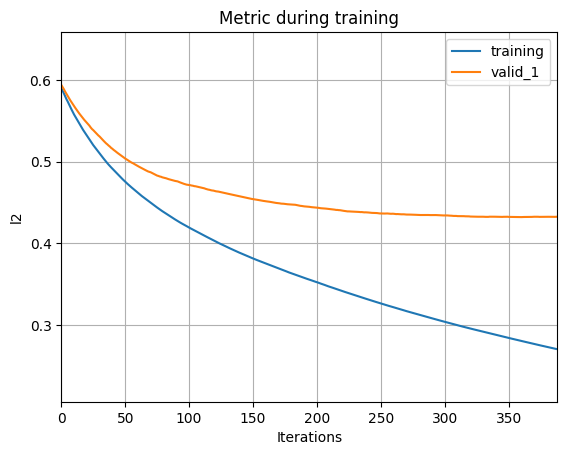

----> || Train Optimized QWK SCORE ::  0.741
----> || Val Optimized QWK SCORE ::  0.515
----> || Train Optimized Val QWK SCORE ::  0.479
----> || Val Optimized Train QWK SCORE ::  0.730
Fold 1 - Rounded Train QWK: 0.6273, Rounded Validation QWK: 0.3603


<Figure size 640x480 with 0 Axes>

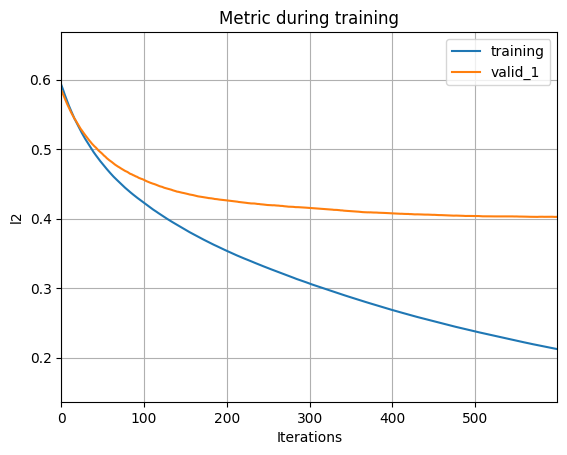

----> || Train Optimized QWK SCORE ::  0.804
----> || Val Optimized QWK SCORE ::  0.537
----> || Train Optimized Val QWK SCORE ::  0.529
----> || Val Optimized Train QWK SCORE ::  0.794
Fold 2 - Rounded Train QWK: 0.7215, Rounded Validation QWK: 0.4829


<Figure size 640x480 with 0 Axes>

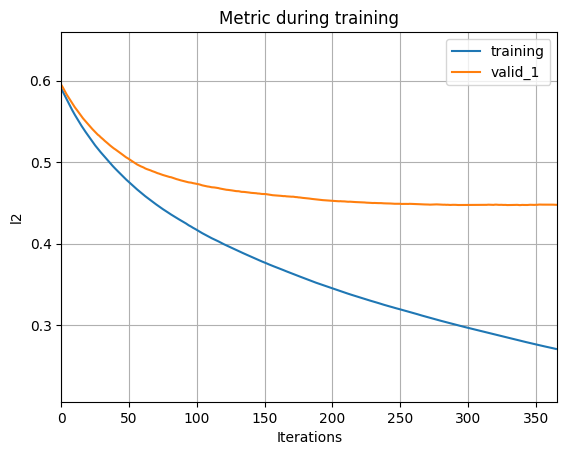

----> || Train Optimized QWK SCORE ::  0.734
----> || Val Optimized QWK SCORE ::  0.505
----> || Train Optimized Val QWK SCORE ::  0.499
----> || Val Optimized Train QWK SCORE ::  0.733
Fold 3 - Rounded Train QWK: 0.6302, Rounded Validation QWK: 0.3733


<Figure size 640x480 with 0 Axes>

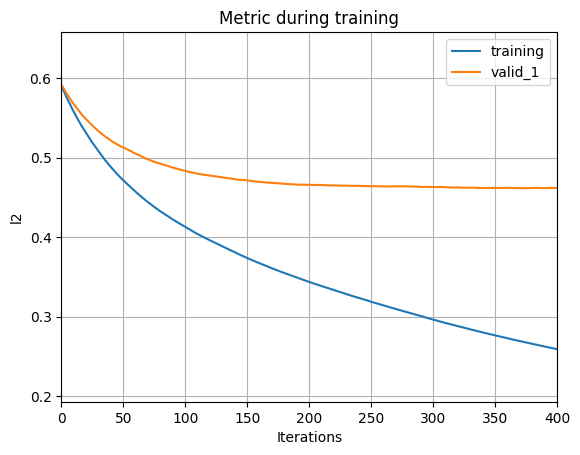

----> || Train Optimized QWK SCORE ::  0.752
----> || Val Optimized QWK SCORE ::  0.397
----> || Train Optimized Val QWK SCORE ::  0.472
----> || Val Optimized Train QWK SCORE ::  0.666
Fold 4 - Rounded Train QWK: 0.6551, Rounded Validation QWK: 0.3460


<Figure size 640x480 with 0 Axes>

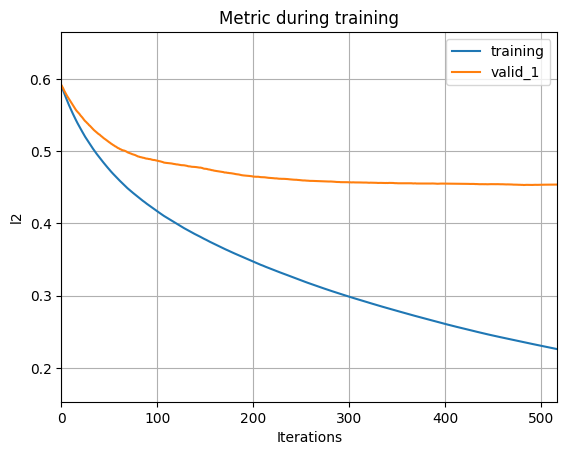

----> || Train Optimized QWK SCORE ::  0.795
----> || Val Optimized QWK SCORE ::  0.432
----> || Train Optimized Val QWK SCORE ::  0.428
----> || Val Optimized Train QWK SCORE ::  0.768
Fold 5 - Rounded Train QWK: 0.7024, Rounded Validation QWK: 0.3679
Mean Train QWK --> 0.7654
Mean Validation QWK ---> 0.4772
----> || Optimized QWK SCORE ::  0.496


In [225]:
lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_selected3_df, test_selected3_df, 200)

In [226]:
lgb_optuna_study.best_params

{'learning_rate': 0.019457007903413516,
 'early_stopping_round': 27,
 'max_depth': 19,
 'min_data_in_leaf': 59,
 'num_leaves': 183,
 'min_gain_to_split': 0.163996468742851,
 'lambda_l1': 0.8539409836334502,
 'lambda_l2': 197.25714502864943}

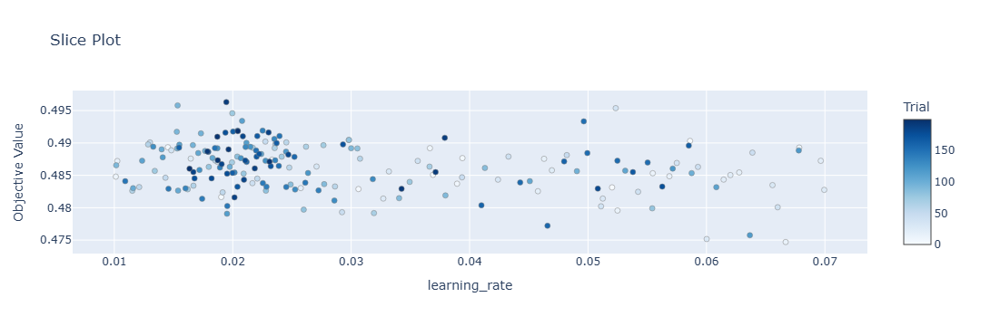

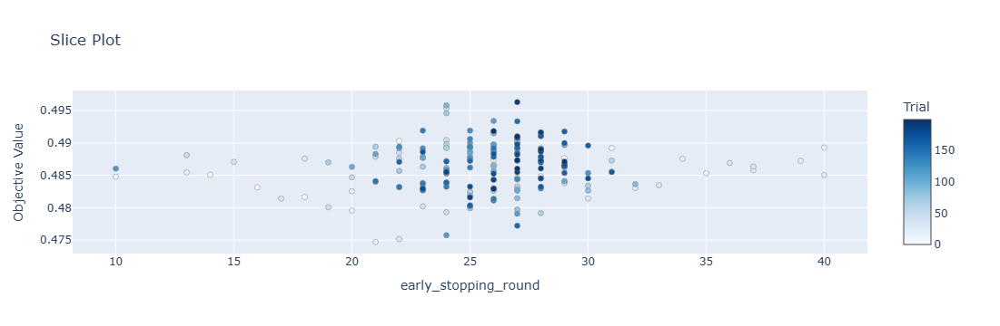

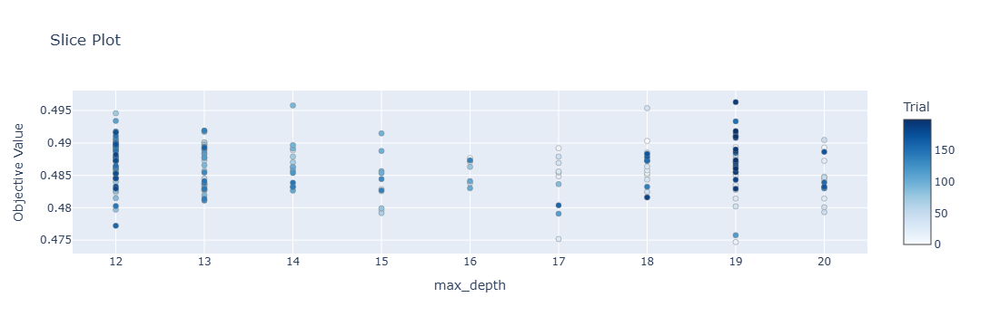

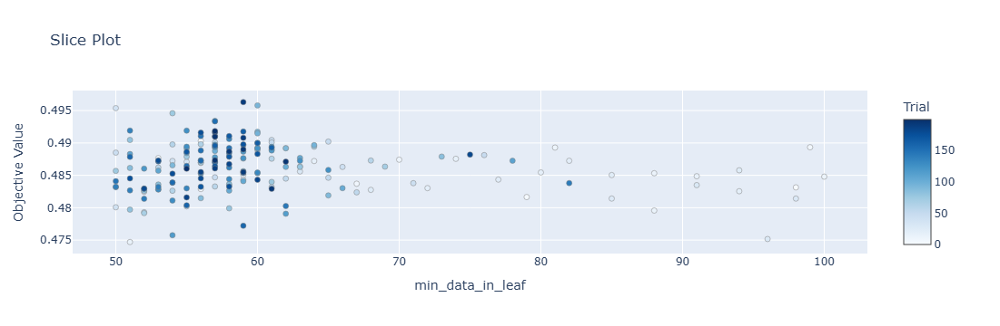

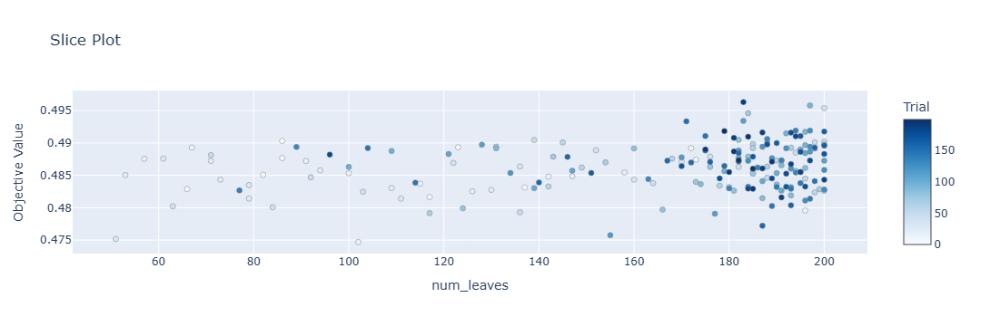

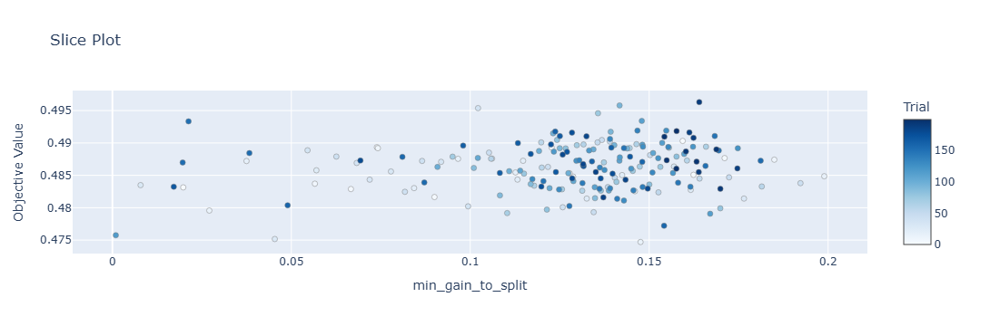

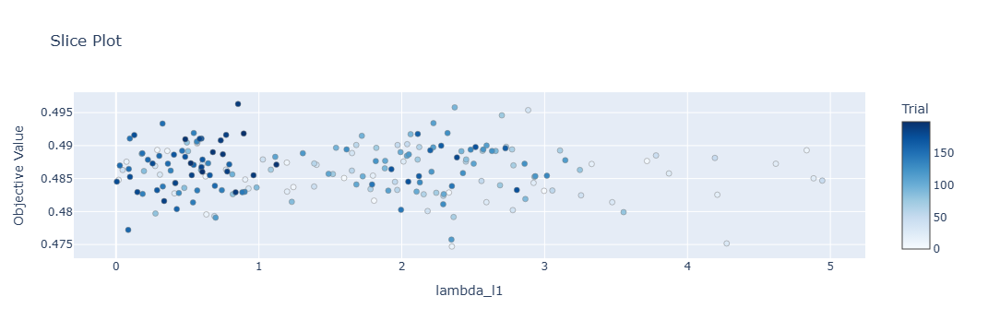

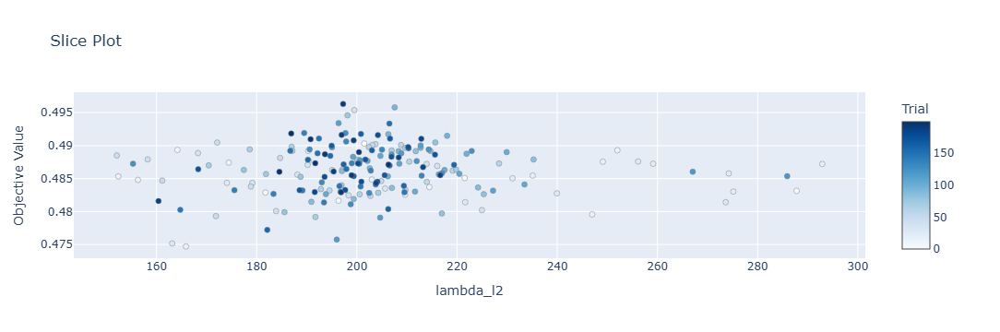

In [227]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

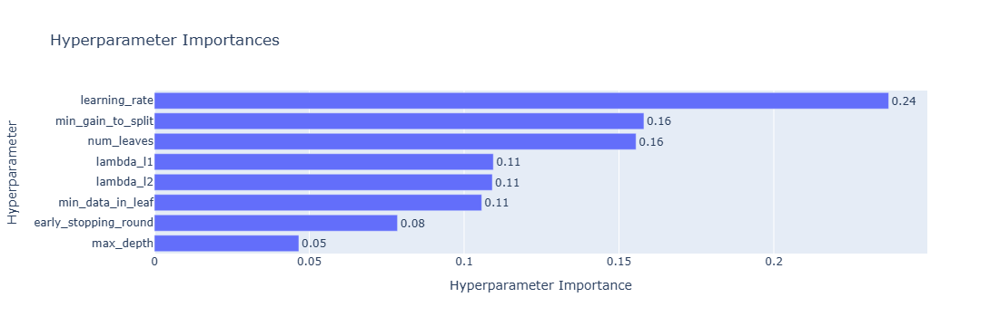

In [230]:
plot_param_importances(lgb_optuna_study)

In [231]:
cols = train_selected3_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
print(imp_df.shape)
imp_df

(177, 2)


,Feature,Importance
25,SDS-SDS_Total_Raw,311.0
24,PreInt_EduHx-computerinternet_hoursday,201.8
19,Physical-Height,113.8
9,FGC-FGC_PU,93.6
6,FGC-FGC_CU,85.4
17,Physical-BMI,83.0
2,Basic_Demos-Age,77.8
10,FMI_BFP,76.8
13,Muscle_to_Fat,73.0
48,Y_time_of_day_hour_window_11_mean,71.2


In [232]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [233]:
train_selected4_df = train_selected3_df.drop(unimportant_cols, axis=1)
print(train_selected4_df.shape)
train_selected4_df.head()

(2736, 92)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,Z_std,anglez_max,X_weekday_3_min,X_weekday_3_max,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_4_mean,Z_weekday_5_std,light_weekday_4_max,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_5_max,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_10%,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_11_std,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,light_time_of_day_hour_window_3_90%,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_1%,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_13_std,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_19_35%,light_time_of_day_hour_window_20_std,light_time_of_day_hour_window_21_entropy,battery_use_since_wear_time_of_day_hour_window_8_mean,battery_use_since_wear_time_of_day_hour_window_14_1%,Basic_Demos-Sex_0,Basic_Demos-Sex_1,FMI_BFP,Muscle_to_Fat,sii
0,00008ff9,5.0,51.0,16.877316,46.0,50.8,25.0,80.0,130.2,22.6,0.0,20.50,21.18,0.0,2.668550,13.81770,1.844,2.6342,41.6,3.0,1.0,0.550372,89.296684,-1.181594,1.139090,24.108867,-1.001339,0.067867,0.502684,929.050000,213.972368,696.71665,-0.782825,239.102159,95.603143,-0.011758,0.029482,135.530011,32.032105,1.140360,22.976666,-150.355033,-43.818953,11.926842,0.307957,-0.663917,0.227895,23.115072,-68.529391,-190.255550,-0.007054,-156.169044,52.527369,0.077986,0.077756,-1.295111,-18.909606,49.035377,-0.989829,-0.893364,232.212733,50.486203,-752.212750,0.494078,0.513271,18.664069,1.461590,-0.993515,-0.601909,-0.973880,0.024752,0.026305,0.044125,0.045051,0.001617,47.125891,15.214690,25.508007,0.123077,1343.000024,39.113261,0.425600,2.858217,13.298962,7.412545,286.112347,6.200000,1.0,0.0,0.332267,6.383063,2.0
1,000fd460,9.0,63.2,14.035590,48.0,46.0,22.0,70.0,122.0,14.4,3.0,23.08,24.94,5.0,2.579490,12.82540,1.704,2.3400,46.0,0.0,0.0,0.589627,89.456932,-1.175764,1.132539,20.828965,-1.000690,0.064376,0.540959,1148.777557,316.855106,507.16665,-0.881209,383.965568,-13.479982,0.007261,0.002160,43.066030,15.297014,1.058457,17.475854,561.547091,-306.613574,12.159670,0.337922,-0.744607,-0.012252,25.279001,-62.010112,66.859352,0.020190,184.093170,59.785731,0.097959,0.028424,-1.615314,-51.054434,28.113788,-0.984249,-0.840571,539.487087,37.416393,-806.503931,0.577153,0.514021,18.904598,1.241939,-0.996798,-0.978247,-0.

In [234]:
test_selected4_df = test_selected3_df.drop(unimportant_cols, axis=1)
print(test_selected4_df.shape)
test_selected4_df.head()

(20, 91)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-HeartRate,Physical-Systolic_BP,Fitness_Endurance-Time_Sec,FGC-FGC_CU,FGC-FGC_GSND,FGC-FGC_GSD,FGC-FGC_PU,BIA-BIA_BMC,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Physical-Waist_Circumference_isnan,Z_std,anglez_max,X_weekday_3_min,X_weekday_3_max,Y_weekday_7_entropy,Z_weekday_1_min,Z_weekday_4_mean,Z_weekday_5_std,light_weekday_4_max,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_5_max,X_time_of_day_hour_window_1_min,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_3_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_5_mean,X_time_of_day_hour_window_5_entropy,X_time_of_day_hour_window_10_entropy,X_time_of_day_hour_window_15_max,X_time_of_day_hour_window_19_entropy,X_time_of_day_hour_window_22_sum,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_4_1%,Y_time_of_day_hour_window_4_65%,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_7_sum,Y_time_of_day_hour_window_8_mean,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_10_mean,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_15_min,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_1_10%,Z_time_of_day_hour_window_5_sum,Z_time_of_day_hour_window_7_entropy,Z_time_of_day_hour_window_9_sum,Z_time_of_day_hour_window_11_std,Z_time_of_day_hour_window_15_std,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,enmo_time_of_day_hour_window_10_mean,enmo_time_of_day_hour_window_15_10%,light_time_of_day_hour_window_3_90%,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_std,light_time_of_day_hour_window_10_1%,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_13_std,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_19_35%,light_time_of_day_hour_window_20_std,light_time_of_day_hour_window_21_entropy,battery_use_since_wear_time_of_day_hour_window_8_mean,battery_use_since_wear_time_of_day_hour_window_14_1%,Basic_Demos-Sex_0,Basic_Demos-Sex_1,FMI_BFP,Muscle_to_Fat
0,00008ff9,5.0,51.0,16.877316,46.000,50.8,25.0,80.0,130.2,22.6,0.0,20.50,21.18,0.0,2.668550,13.81770,1.844,2.6342,41.6,3.0,1.0,0.550372,89.296684,-1.181594,1.139090,24.108867,-1.001339,0.067867,0.502684,929.050000,213.972368,696.71665,-0.782825,239.102159,95.603143,-0.011758,0.029482,135.530011,32.032105,1.140360,22.976666,-150.355033,-43.818953,11.926842,0.307957,-0.663917,0.227895,23.115072,-68.529391,-190.255550,-0.007054,-156.169044,52.527369,0.077986,0.077756,-1.295111,-18.909606,49.035377,-0.989829,-0.893364,232.212733,50.486203,-752.212750,0.494078,0.513271,18.664069,1.461590,-0.993515,-0.601909,-0.973880,0.024752,0.026305,0.044125,0.045051,0.001617,47.125891,15.214690,25.508007,0.123077,1343.000024,39.113261,0.425600,2.858217,13.298962,7.412545,286.112347,6.200000,1.0,0.0,0.332267,6.383063
1,000fd460,9.0,63.2,14.035590,48.000,46.0,22.0,70.0,122.0,14.4,3.0,23.08,24.94,5.0,2.579490,12.82540,1.704,2.3400,46.0,0.0,0.0,0.589627,89.456932,-1.175764,1.132539,20.828965,-1.000690,0.064376,0.540959,1148.777557,316.855106,507.16665,-0.881209,383.965568,-13.479982,0.007261,0.002160,43.066030,15.297014,1.058457,17.475854,561.547091,-306.613574,12.159670,0.337922,-0.744607,-0.012252,25.279001,-62.010112,66.859352,0.020190,184.093170,59.785731,0.097959,0.028424,-1.615314,-51.054434,28.113788,-0.984249,-0.840571,539.487087,37.416393,-806.503931,0.577153,0.514021,18.904598,1.241939,-0.996798,-0.978247,-0.7540

[I 2024-12-14 00:44:30,256] A new study created in memory with name: no-name-d78ad2aa-65ec-40cb-a490-f376b071021d
[I 2024-12-14 00:44:33,738] Trial 0 finished with value: 0.48610043622039456 and parameters: {'learning_rate': 0.058885585538464486, 'early_stopping_round': 25, 'max_depth': 18, 'min_data_in_leaf': 94, 'num_leaves': 247, 'min_gain_to_split': 0.05602151742114787, 'lambda_l1': 3.8660311211581453, 'lambda_l2': 250.60733041146048}. Best is trial 0 with value: 0.48610043622039456.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:44:41,554] Trial 1 finished with value: 0.4797998371125406 and parameters: {'learning_rate': 0.034432903783105595, 'early_stopping_round': 33, 'max_depth': 17, 'min_data_in_leaf': 51, 'num_leaves': 274, 'min_gain_to_split': 0.015192217796575026, 'lambda_l1': 3.565011714800156, 'lambda_l2': 293.0081278562436}. Best is trial 0 with value: 0.48610043622039456.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:44:44,409] Trial 2 finished with value: 0.48868884743143925 and parameters: {'learning_rate': 0.05871090236409355, 'early_stopping_round': 10, 'max_depth': 20, 'min_data_in_leaf': 96, 'num_leaves': 267, 'min_gain_to_split': 0.0033861919582769406, 'lambda_l1': 0.1096818188331733, 'lambda_l2': 276.294337921479}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:44:47,572] Trial 3 finished with value: 0.488593640829997 and parameters: {'learning_rate': 0.06729443303577656, 'early_stopping_round': 37, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 412, 'min_gain_to_split': 0.1174569069022528, 'lambda_l1': 4.994491716506659, 'lambda_l2': 139.57496637794932}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:44:50,604] Trial 4 finished with value: 0.4847049404543482 and parameters: {'learning_rate': 0.06783889999062767, 'early_stopping_round': 38, 'max_depth': 13, 'min_data_in_leaf': 86, 'num_leaves': 119, 'min_gain_to_split': 0.09742559943303425, 'lambda_l1': 0.5123881985759138, 'lambda_l2': 274.2508615090253}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:44:53,409] Trial 5 finished with value: 0.47935002483363376 and parameters: {'learning_rate': 0.06454337154898766, 'early_stopping_round': 13, 'max_depth': 20, 'min_data_in_leaf': 51, 'num_leaves': 230, 'min_gain_to_split': 0.11752167935985876, 'lambda_l1': 0.21154022913499992, 'lambda_l2': 196.83156482388503}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:44:56,449] Trial 6 finished with value: 0.48219407622603994 and parameters: {'learning_rate': 0.06660249533251503, 'early_stopping_round': 27, 'max_depth': 20, 'min_data_in_leaf': 82, 'num_leaves': 398, 'min_gain_to_split': 0.16107979007782813, 'lambda_l1': 0.7562009007986248, 'lambda_l2': 279.9750354791232}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:45:01,171] Trial 7 finished with value: 0.4880152644409794 and parameters: {'learning_rate': 0.040020043055472264, 'early_stopping_round': 23, 'max_depth': 18, 'min_data_in_leaf': 55, 'num_leaves': 351, 'min_gain_to_split': 0.17604503380622302, 'lambda_l1': 0.21947945686342563, 'lambda_l2': 188.84486813112883}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:45:09,823] Trial 8 finished with value: 0.48648023342403646 and parameters: {'learning_rate': 0.01832998680793496, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 67, 'num_leaves': 430, 'min_gain_to_split': 0.004342810223401217, 'lambda_l1': 0.3778815825116455, 'lambda_l2': 224.1678273775126}. Best is trial 2 with value: 0.48868884743143925.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:45:21,473] Trial 9 finished with value: 0.4912514597745401 and parameters: {'learning_rate': 0.01044218789157453, 'early_stopping_round': 33, 'max_depth': 13, 'min_data_in_leaf': 77, 'num_leaves': 110, 'min_gain_to_split': 0.13256678156325485, 'lambda_l1': 4.855614053650639, 'lambda_l2': 86.78071856057905}. Best is trial 9 with value: 0.4912514597745401.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:45:30,304] Trial 10 finished with value: 0.4875558877034998 and parameters: {'learning_rate': 0.011820431237788774, 'early_stopping_round': 31, 'max_depth': 12, 'min_data_in_leaf': 72, 'num_leaves': 106, 'min_gain_to_split': 0.15022773718702664, 'lambda_l1': 1.9597491699408343, 'lambda_l2': 57.35143152106966}. Best is trial 9 with value: 0.4912514597745401.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:45:32,879] Trial 11 finished with value: 0.49298740666755136 and parameters: {'learning_rate': 0.049090043880857345, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 100, 'num_leaves': 186, 'min_gain_to_split': 0.06578536585139591, 'lambda_l1': 1.860121794118149, 'lambda_l2': 119.69446070897416}. Best is trial 11 with value: 0.49298740666755136.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:45:36,265] Trial 12 finished with value: 0.48355903217692875 and parameters: {'learning_rate': 0.04361636574998176, 'early_stopping_round': 17, 'max_depth': 15, 'min_data_in_leaf': 82, 'num_leaves': 177, 'min_gain_to_split': 0.07219517641219937, 'lambda_l1': 1.8999507954105406, 'lambda_l2': 112.04567829081624}. Best is trial 11 with value: 0.49298740666755136.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:45:39,926] Trial 13 finished with value: 0.48940154901160726 and parameters: {'learning_rate': 0.02944999819531368, 'early_stopping_round': 19, 'max_depth': 15, 'min_data_in_leaf': 99, 'num_leaves': 174, 'min_gain_to_split': 0.0511208033473238, 'lambda_l1': 3.182513429851403, 'lambda_l2': 77.4674654154372}. Best is trial 11 with value: 0.49298740666755136.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:45:43,829] Trial 14 finished with value: 0.496441268436157 and parameters: {'learning_rate': 0.05038520256092819, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 89, 'num_leaves': 178, 'min_gain_to_split': 0.13659667180527602, 'lambda_l1': 4.699175134072466, 'lambda_l2': 127.0563043537071}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:45:47,401] Trial 15 finished with value: 0.48933302906756315 and parameters: {'learning_rate': 0.04862523109663126, 'early_stopping_round': 28, 'max_depth': 16, 'min_data_in_leaf': 90, 'num_leaves': 188, 'min_gain_to_split': 0.19575422618393185, 'lambda_l1': 1.4564408638076234, 'lambda_l2': 146.93230431974948}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:45:50,506] Trial 16 finished with value: 0.4899824936782726 and parameters: {'learning_rate': 0.05086136062873856, 'early_stopping_round': 16, 'max_depth': 14, 'min_data_in_leaf': 100, 'num_leaves': 496, 'min_gain_to_split': 0.08541627989675535, 'lambda_l1': 2.6298676520806454, 'lambda_l2': 140.765607164238}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:45:53,042] Trial 17 finished with value: 0.48645672200868717 and parameters: {'learning_rate': 0.052839958358625365, 'early_stopping_round': 10, 'max_depth': 17, 'min_data_in_leaf': 90, 'num_leaves': 311, 'min_gain_to_split': 0.035320739717785404, 'lambda_l1': 4.08516503558019, 'lambda_l2': 107.65274245802189}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:45:58,249] Trial 18 finished with value: 0.4881681808578069 and parameters: {'learning_rate': 0.030325839529486382, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 91, 'num_leaves': 192, 'min_gain_to_split': 0.13223087916960774, 'lambda_l1': 2.7529874207569023, 'lambda_l2': 169.73445318585743}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:46:01,398] Trial 19 finished with value: 0.48528949419672174 and parameters: {'learning_rate': 0.04316790471513477, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 84, 'num_leaves': 149, 'min_gain_to_split': 0.07544208876783587, 'lambda_l1': 1.226429908854512, 'lambda_l2': 114.4090557936295}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:46:04,472] Trial 20 finished with value: 0.4866997620342065 and parameters: {'learning_rate': 0.0578754348474383, 'early_stopping_round': 20, 'max_depth': 12, 'min_data_in_leaf': 75, 'num_leaves': 222, 'min_gain_to_split': 0.09884467176357581, 'lambda_l1': 2.1901046955687176, 'lambda_l2': 161.29723122524703}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:46:10,752] Trial 21 finished with value: 0.49124099579999536 and parameters: {'learning_rate': 0.021103748606607846, 'early_stopping_round': 34, 'max_depth': 13, 'min_data_in_leaf': 78, 'num_leaves': 143, 'min_gain_to_split': 0.13497119051788892, 'lambda_l1': 4.909770808652058, 'lambda_l2': 86.47188373073945}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:46:15,129] Trial 22 finished with value: 0.4875560700332803 and parameters: {'learning_rate': 0.03571375146540215, 'early_stopping_round': 35, 'max_depth': 14, 'min_data_in_leaf': 67, 'num_leaves': 107, 'min_gain_to_split': 0.1243998561774117, 'lambda_l1': 4.301792878810138, 'lambda_l2': 51.137633460716586}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:46:18,237] Trial 23 finished with value: 0.4882398927553441 and parameters: {'learning_rate': 0.048780666349850545, 'early_stopping_round': 31, 'max_depth': 16, 'min_data_in_leaf': 95, 'num_leaves': 146, 'min_gain_to_split': 0.14906934222247625, 'lambda_l1': 4.536849464443964, 'lambda_l2': 88.33279630382843}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:46:24,538] Trial 24 finished with value: 0.4921728348287323 and parameters: {'learning_rate': 0.02341252227411234, 'early_stopping_round': 32, 'max_depth': 13, 'min_data_in_leaf': 78, 'num_leaves': 213, 'min_gain_to_split': 0.17105285243214713, 'lambda_l1': 3.2543956050220864, 'lambda_l2': 126.61398626177879}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:46:29,353] Trial 25 finished with value: 0.49608710224598196 and parameters: {'learning_rate': 0.021262552879992902, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 88, 'num_leaves': 209, 'min_gain_to_split': 0.19509000436457918, 'lambda_l1': 3.205897905746673, 'lambda_l2': 128.18157383941977}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:46:33,023] Trial 26 finished with value: 0.49290851577004535 and parameters: {'learning_rate': 0.04478454388232011, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 87, 'num_leaves': 307, 'min_gain_to_split': 0.19477984279832192, 'lambda_l1': 3.0457137127674248, 'lambda_l2': 198.8193067307338}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:46:36,083] Trial 27 finished with value: 0.49480303132610803 and parameters: {'learning_rate': 0.0542204492598859, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 280, 'min_gain_to_split': 0.17870308172360355, 'lambda_l1': 1.4566693495141556, 'lambda_l2': 125.4283108084902}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:46:39,161] Trial 28 finished with value: 0.4897888982778347 and parameters: {'learning_rate': 0.05394778684660747, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 345, 'min_gain_to_split': 0.1815056618171303, 'lambda_l1': 1.101423656236479, 'lambda_l2': 157.0859684606296}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:46:42,157] Trial 29 finished with value: 0.4954801069245871 and parameters: {'learning_rate': 0.0629887742303936, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 95, 'num_leaves': 253, 'min_gain_to_split': 0.1620879024060518, 'lambda_l1': 3.705758945655863, 'lambda_l2': 225.48686470503503}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:46:45,258] Trial 30 finished with value: 0.48986091513807706 and parameters: {'learning_rate': 0.0631665165374012, 'early_stopping_round': 24, 'max_depth': 17, 'min_data_in_leaf': 87, 'num_leaves': 248, 'min_gain_to_split': 0.1596667935624797, 'lambda_l1': 3.7765594259545914, 'lambda_l2': 236.13516785502065}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:46:48,555] Trial 31 finished with value: 0.4839058783190108 and parameters: {'learning_rate': 0.05607345851488897, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 95, 'num_leaves': 278, 'min_gain_to_split': 0.18571160733609327, 'lambda_l1': 3.580673177062312, 'lambda_l2': 216.38450867936223}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:46:51,212] Trial 32 finished with value: 0.4831296409863052 and parameters: {'learning_rate': 0.06186946296388446, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 97, 'num_leaves': 251, 'min_gain_to_split': 0.1659831883667564, 'lambda_l1': 4.454576338074536, 'lambda_l2': 254.50555551013792}. Best is trial 14 with value: 0.496441268436157.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:46:53,756] Trial 33 finished with value: 0.49787387733104593 and parameters: {'learning_rate': 0.0606300716607054, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 331, 'min_gain_to_split': 0.19994560996694796, 'lambda_l1': 3.981692913047373, 'lambda_l2': 100.19979023994895}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 00:46:56,164] Trial 34 finished with value: 0.4846244252538331 and parameters: {'learning_rate': 0.06090278619406615, 'early_stopping_round': 21, 'max_depth': 15, 'min_data_in_leaf': 89, 'num_leaves': 330, 'min_gain_to_split': 0.199348825331299, 'lambda_l1': 3.9686023224350593, 'lambda_l2': 100.89664125638048}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:46:58,912] Trial 35 finished with value: 0.4826634227644524 and parameters: {'learning_rate': 0.06878886124324579, 'early_stopping_round': 24, 'max_depth': 12, 'min_data_in_leaf': 83, 'num_leaves': 381, 'min_gain_to_split': 0.1513673547824389, 'lambda_l1': 3.5715092437166094, 'lambda_l2': 182.15853707794943}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:47:01,550] Trial 36 finished with value: 0.4886242240877988 and parameters: {'learning_rate': 0.05744977005739481, 'early_stopping_round': 18, 'max_depth': 13, 'min_data_in_leaf': 97, 'num_leaves': 216, 'min_gain_to_split': 0.18775795063519074, 'lambda_l1': 4.252795439615746, 'lambda_l2': 134.3988830960505}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:47:04,449] Trial 37 finished with value: 0.4906614713100167 and parameters: {'learning_rate': 0.06085844031383951, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 263, 'min_gain_to_split': 0.14104445159479737, 'lambda_l1': 3.7715695370379407, 'lambda_l2': 253.19633070587835}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:47:06,622] Trial 38 finished with value: 0.48951586708901174 and parameters: {'learning_rate': 0.06511317838950931, 'early_stopping_round': 15, 'max_depth': 19, 'min_data_in_leaf': 85, 'num_leaves': 291, 'min_gain_to_split': 0.11075407049855646, 'lambda_l1': 4.612294011208973, 'lambda_l2': 71.10102489886452}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:47:14,208] Trial 39 finished with value: 0.4922281692206173 and parameters: {'learning_rate': 0.014735040889435613, 'early_stopping_round': 22, 'max_depth': 13, 'min_data_in_leaf': 80, 'num_leaves': 234, 'min_gain_to_split': 0.1693337680999796, 'lambda_l1': 3.2919116199696274, 'lambda_l2': 153.1865242886035}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:47:18,603] Trial 40 finished with value: 0.48970018356108513 and parameters: {'learning_rate': 0.030928868536914553, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 87, 'num_leaves': 375, 'min_gain_to_split': 0.15711179093369992, 'lambda_l1': 2.9119709566578122, 'lambda_l2': 96.93555200929515}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:47:21,273] Trial 41 finished with value: 0.4841258439879328 and parameters: {'learning_rate': 0.06988352324491162, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 283, 'min_gain_to_split': 0.17972685495467441, 'lambda_l1': 3.5295817294821177, 'lambda_l2': 129.53178629021585}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:47:24,339] Trial 42 finished with value: 0.4880220827445698 and parameters: {'learning_rate': 0.05542912020937644, 'early_stopping_round': 36, 'max_depth': 14, 'min_data_in_leaf': 97, 'num_leaves': 324, 'min_gain_to_split': 0.17426294790320643, 'lambda_l1': 2.3706220488221375, 'lambda_l2': 169.03791167711307}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:47:27,509] Trial 43 finished with value: 0.4887323425579133 and parameters: {'learning_rate': 0.059622637559193364, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 94, 'num_leaves': 263, 'min_gain_to_split': 0.1888356755670443, 'lambda_l1': 4.159324300797148, 'lambda_l2': 293.3708155480375}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:47:30,184] Trial 44 finished with value: 0.4893233836894738 and parameters: {'learning_rate': 0.06520712460600468, 'early_stopping_round': 23, 'max_depth': 13, 'min_data_in_leaf': 88, 'num_leaves': 202, 'min_gain_to_split': 0.19968677014914266, 'lambda_l1': 3.8447361182938753, 'lambda_l2': 124.40511837587323}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:47:34,222] Trial 45 finished with value: 0.48676181124837303 and parameters: {'learning_rate': 0.03754505170563105, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 91, 'num_leaves': 233, 'min_gain_to_split': 0.16373132592030504, 'lambda_l1': 0.7189798152871427, 'lambda_l2': 203.31011987835927}. Best is trial 33 with value: 0.49787387733104593.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:47:38,142] Trial 46 finished with value: 0.49790014867356747 and parameters: {'learning_rate': 0.0461854895596039, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 356, 'min_gain_to_split': 0.17990740887124768, 'lambda_l1': 4.7779394852934605, 'lambda_l2': 143.45064091992037}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 00:47:41,987] Trial 47 finished with value: 0.48391642457391526 and parameters: {'learning_rate': 0.04045792783105504, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 430, 'min_gain_to_split': 0.18988124041922988, 'lambda_l1': 4.716179757764575, 'lambda_l2': 142.9040147738947}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:47:45,803] Trial 48 finished with value: 0.49503263294522715 and parameters: {'learning_rate': 0.05164952365102077, 'early_stopping_round': 21, 'max_depth': 18, 'min_data_in_leaf': 61, 'num_leaves': 362, 'min_gain_to_split': 0.15206615458316655, 'lambda_l1': 4.965180059515997, 'lambda_l2': 181.0373197706327}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:47:50,386] Trial 49 finished with value: 0.4822370231453965 and parameters: {'learning_rate': 0.04517522730319992, 'early_stopping_round': 33, 'max_depth': 16, 'min_data_in_leaf': 53, 'num_leaves': 407, 'min_gain_to_split': 0.17273037711760375, 'lambda_l1': 4.412257767506679, 'lambda_l2': 269.3553223988622}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:47:56,395] Trial 50 finished with value: 0.4860693294496484 and parameters: {'learning_rate': 0.02559609585561144, 'early_stopping_round': 27, 'max_depth': 17, 'min_data_in_leaf': 72, 'num_leaves': 471, 'min_gain_to_split': 0.11203357732707839, 'lambda_l1': 4.769032662443152, 'lambda_l2': 105.26397899472202}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:48:00,006] Trial 51 finished with value: 0.49054185789237315 and parameters: {'learning_rate': 0.051440538314198675, 'early_stopping_round': 20, 'max_depth': 18, 'min_data_in_leaf': 63, 'num_leaves': 364, 'min_gain_to_split': 0.1447396225104919, 'lambda_l1': 4.9181172313258426, 'lambda_l2': 183.50822223407357}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:48:03,986] Trial 52 finished with value: 0.4925469654347334 and parameters: {'learning_rate': 0.04695619429549723, 'early_stopping_round': 22, 'max_depth': 18, 'min_data_in_leaf': 65, 'num_leaves': 337, 'min_gain_to_split': 0.15521287734098407, 'lambda_l1': 4.995904197218985, 'lambda_l2': 218.07936743194034}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:48:08,619] Trial 53 finished with value: 0.49407812141483376 and parameters: {'learning_rate': 0.0411232339498179, 'early_stopping_round': 24, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 162, 'min_gain_to_split': 0.1251388986736647, 'lambda_l1': 4.036855869325386, 'lambda_l2': 148.9444844379138}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:48:12,045] Trial 54 finished with value: 0.4878115706235986 and parameters: {'learning_rate': 0.0509808071409433, 'early_stopping_round': 20, 'max_depth': 19, 'min_data_in_leaf': 50, 'num_leaves': 361, 'min_gain_to_split': 0.140756499214397, 'lambda_l1': 4.679607030229463, 'lambda_l2': 118.28389999436723}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:48:15,207] Trial 55 finished with value: 0.48898142069828865 and parameters: {'learning_rate': 0.06682871826817957, 'early_stopping_round': 23, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 313, 'min_gain_to_split': 0.1630994447220071, 'lambda_l1': 3.4139327694205104, 'lambda_l2': 136.46136076473115}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:48:18,555] Trial 56 finished with value: 0.4901913635155356 and parameters: {'learning_rate': 0.04717213510332744, 'early_stopping_round': 18, 'max_depth': 17, 'min_data_in_leaf': 71, 'num_leaves': 133, 'min_gain_to_split': 0.19183603944065028, 'lambda_l1': 4.3937392782338165, 'lambda_l2': 157.51005919733143}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:48:23,973] Trial 57 finished with value: 0.487399522342437 and parameters: {'learning_rate': 0.037523472370052276, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 53, 'num_leaves': 390, 'min_gain_to_split': 0.1826730173640661, 'lambda_l1': 4.199768991222915, 'lambda_l2': 232.5808806866963}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:48:26,955] Trial 58 finished with value: 0.48214058154614214 and parameters: {'learning_rate': 0.05854053062697355, 'early_stopping_round': 32, 'max_depth': 15, 'min_data_in_leaf': 67, 'num_leaves': 422, 'min_gain_to_split': 0.17554986319726573, 'lambda_l1': 4.52984833561886, 'lambda_l2': 72.52782515383441}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:48:30,309] Trial 59 finished with value: 0.48503801383499867 and parameters: {'learning_rate': 0.05233297439471007, 'early_stopping_round': 28, 'max_depth': 18, 'min_data_in_leaf': 99, 'num_leaves': 166, 'min_gain_to_split': 0.0915468308790174, 'lambda_l1': 4.785399912207068, 'lambda_l2': 176.91163797755328}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:48:38,675] Trial 60 finished with value: 0.4951830228377946 and parameters: {'learning_rate': 0.01761803621738109, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 69, 'num_leaves': 351, 'min_gain_to_split': 0.1678744599207849, 'lambda_l1': 3.7218351278624437, 'lambda_l2': 165.41250782763507}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:48:46,656] Trial 61 finished with value: 0.49230539257117123 and parameters: {'learning_rate': 0.01794058431416573, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 369, 'min_gain_to_split': 0.1494275696673887, 'lambda_l1': 3.713707015492416, 'lambda_l2': 165.18099856077598}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:48:55,938] Trial 62 finished with value: 0.4902094065797664 and parameters: {'learning_rate': 0.014597309624404368, 'early_stopping_round': 21, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 350, 'min_gain_to_split': 0.18304724207474143, 'lambda_l1': 3.964439905521834, 'lambda_l2': 205.89082384120462}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:49:02,933] Trial 63 finished with value: 0.49273515256398903 and parameters: {'learning_rate': 0.019181633887166167, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 70, 'num_leaves': 298, 'min_gain_to_split': 0.16951203499052933, 'lambda_l1': 2.9953743298322832, 'lambda_l2': 145.9166822099478}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:49:07,475] Trial 64 finished with value: 0.49141404175003045 and parameters: {'learning_rate': 0.025462124508864075, 'early_stopping_round': 21, 'max_depth': 16, 'min_data_in_leaf': 75, 'num_leaves': 324, 'min_gain_to_split': 0.1601953439336825, 'lambda_l1': 3.1625423339348386, 'lambda_l2': 113.38898307601885}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:49:18,938] Trial 65 finished with value: 0.49313843474165664 and parameters: {'learning_rate': 0.014359727855843128, 'early_stopping_round': 28, 'max_depth': 15, 'min_data_in_leaf': 62, 'num_leaves': 385, 'min_gain_to_split': 0.03086724161830659, 'lambda_l1': 2.7814176672418807, 'lambda_l2': 193.4394649846215}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:49:22,093] Trial 66 finished with value: 0.4895835073592061 and parameters: {'learning_rate': 0.04985767833425559, 'early_stopping_round': 23, 'max_depth': 17, 'min_data_in_leaf': 70, 'num_leaves': 193, 'min_gain_to_split': 0.1930051462986338, 'lambda_l1': 3.420364589603226, 'lambda_l2': 93.04699989946613}. Best is trial 46 with value: 0.49790014867356747.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:49:26,697] Trial 67 finished with value: 0.4985978373565991 and parameters: {'learning_rate': 0.04243219074406642, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 350, 'min_gain_to_split': 0.13501857863808484, 'lambda_l1': 4.305170090258216, 'lambda_l2': 133.84445707962368}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 00:49:31,026] Trial 68 finished with value: 0.48984646776412344 and parameters: {'learning_rate': 0.04314019317147759, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 342, 'min_gain_to_split': 0.1319391636836741, 'lambda_l1': 3.9832485494399394, 'lambda_l2': 133.32750813460405}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:49:36,192] Trial 69 finished with value: 0.48882423412630494 and parameters: {'learning_rate': 0.03397149874033144, 'early_stopping_round': 34, 'max_depth': 13, 'min_data_in_leaf': 65, 'num_leaves': 315, 'min_gain_to_split': 0.12198486816988931, 'lambda_l1': 4.352351419055152, 'lambda_l2': 109.53654689763678}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:49:40,266] Trial 70 finished with value: 0.49295259144656867 and parameters: {'learning_rate': 0.041905086410563536, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 81, 'num_leaves': 403, 'min_gain_to_split': 0.13613312133829186, 'lambda_l1': 3.7260794456137556, 'lambda_l2': 120.83446371582703}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:49:44,740] Trial 71 finished with value: 0.4912931029808585 and parameters: {'learning_rate': 0.04681401355552317, 'early_stopping_round': 34, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 351, 'min_gain_to_split': 0.14567659733641128, 'lambda_l1': 4.602933531482863, 'lambda_l2': 171.70317980003958}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:49:47,913] Trial 72 finished with value: 0.48913813307235665 and parameters: {'learning_rate': 0.06288502630308304, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 360, 'min_gain_to_split': 0.15213387574322437, 'lambda_l1': 4.101396121238865, 'lambda_l2': 139.07513616462927}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:49:52,138] Trial 73 finished with value: 0.4941439265877807 and parameters: {'learning_rate': 0.038622324319926335, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 89, 'num_leaves': 333, 'min_gain_to_split': 0.10531509053686694, 'lambda_l1': 4.863195209389074, 'lambda_l2': 161.62034545274759}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:49:55,485] Trial 74 finished with value: 0.4846329069563694 and parameters: {'learning_rate': 0.05571732413821029, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 54, 'num_leaves': 297, 'min_gain_to_split': 0.1658964504025966, 'lambda_l1': 4.2576820718125274, 'lambda_l2': 130.59082097650588}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:50:05,850] Trial 75 finished with value: 0.4903091936616364 and parameters: {'learning_rate': 0.010518970952550714, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 75, 'num_leaves': 205, 'min_gain_to_split': 0.178374728534456, 'lambda_l1': 4.498052009468504, 'lambda_l2': 151.04246986247963}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:50:09,314] Trial 76 finished with value: 0.4848102170649766 and parameters: {'learning_rate': 0.04502300389359108, 'early_stopping_round': 19, 'max_depth': 14, 'min_data_in_leaf': 85, 'num_leaves': 176, 'min_gain_to_split': 0.19803139306130046, 'lambda_l1': 3.885226071830548, 'lambda_l2': 243.29518180913553}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:50:12,609] Trial 77 finished with value: 0.4893206644034521 and parameters: {'learning_rate': 0.05408405772923715, 'early_stopping_round': 31, 'max_depth': 13, 'min_data_in_leaf': 95, 'num_leaves': 394, 'min_gain_to_split': 0.15671936507334056, 'lambda_l1': 3.5962529598499375, 'lambda_l2': 177.23616251676674}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:50:16,797] Trial 78 finished with value: 0.4881372255553965 and parameters: {'learning_rate': 0.04845081255414403, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 68, 'num_leaves': 376, 'min_gain_to_split': 0.12897408936838775, 'lambda_l1': 3.4029755009845952, 'lambda_l2': 265.6962510574319}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:50:21,908] Trial 79 finished with value: 0.489720051589409 and parameters: {'learning_rate': 0.034587133264110545, 'early_stopping_round': 33, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 356, 'min_gain_to_split': 0.16878920381321552, 'lambda_l1': 4.645819139670288, 'lambda_l2': 189.69527857242096}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:50:27,731] Trial 80 finished with value: 0.49123776193437363 and parameters: {'learning_rate': 0.016522832060404585, 'early_stopping_round': 35, 'max_depth': 12, 'min_data_in_leaf': 91, 'num_leaves': 319, 'min_gain_to_split': 0.18693139375285214, 'lambda_l1': 4.297270016673017, 'lambda_l2': 82.71041753410384}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:50:30,585] Trial 81 finished with value: 0.49099100305612176 and parameters: {'learning_rate': 0.053505082316171466, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 272, 'min_gain_to_split': 0.1777013808041897, 'lambda_l1': 1.313132270464549, 'lambda_l2': 123.4527708204306}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:50:36,420] Trial 82 finished with value: 0.485993999111651 and parameters: {'learning_rate': 0.021644222623220126, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 340, 'min_gain_to_split': 0.13888584475792826, 'lambda_l1': 0.9746305931468469, 'lambda_l2': 104.04874757979526}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:50:39,330] Trial 83 finished with value: 0.4902674325219897 and parameters: {'learning_rate': 0.057395469939497804, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 97, 'num_leaves': 255, 'min_gain_to_split': 0.18469518002814714, 'lambda_l1': 2.539625959319448, 'lambda_l2': 141.3291100179376}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:50:42,399] Trial 84 finished with value: 0.4838466113490223 and parameters: {'learning_rate': 0.05432544776256948, 'early_stopping_round': 28, 'max_depth': 13, 'min_data_in_leaf': 89, 'num_leaves': 286, 'min_gain_to_split': 0.1923597703107698, 'lambda_l1': 1.7900751110592519, 'lambda_l2': 117.73490244726895}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:50:45,206] Trial 85 finished with value: 0.48484223859005715 and parameters: {'learning_rate': 0.059460539943998136, 'early_stopping_round': 12, 'max_depth': 14, 'min_data_in_leaf': 94, 'num_leaves': 243, 'min_gain_to_split': 0.14515740451682824, 'lambda_l1': 1.5871510208725694, 'lambda_l2': 283.8295675333023}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:50:48,348] Trial 86 finished with value: 0.49547575286300005 and parameters: {'learning_rate': 0.052010918117404, 'early_stopping_round': 30, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 328, 'min_gain_to_split': 0.17393381822467582, 'lambda_l1': 4.975846211706149, 'lambda_l2': 154.86777956210355}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:50:51,487] Trial 87 finished with value: 0.48652432901324605 and parameters: {'learning_rate': 0.049129817207501994, 'early_stopping_round': 22, 'max_depth': 16, 'min_data_in_leaf': 99, 'num_leaves': 308, 'min_gain_to_split': 0.174138721288366, 'lambda_l1': 4.948139216736913, 'lambda_l2': 149.8142603505212}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:50:55,087] Trial 88 finished with value: 0.4956369103714201 and parameters: {'learning_rate': 0.043164114804091006, 'early_stopping_round': 30, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 224, 'min_gain_to_split': 0.16116205696435482, 'lambda_l1': 4.782842756862995, 'lambda_l2': 156.7496566630051}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:50:57,991] Trial 89 finished with value: 0.4924744439307547 and parameters: {'learning_rate': 0.04609331227993781, 'early_stopping_round': 30, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 206, 'min_gain_to_split': 0.16787766220774777, 'lambda_l1': 4.803957128026498, 'lambda_l2': 159.431348775225}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:51:01,373] Trial 90 finished with value: 0.4870066499137974 and parameters: {'learning_rate': 0.04332286737272592, 'early_stopping_round': 32, 'max_depth': 15, 'min_data_in_leaf': 100, 'num_leaves': 225, 'min_gain_to_split': 0.15952731296275574, 'lambda_l1': 4.144558613631492, 'lambda_l2': 165.12828995324463}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:51:04,933] Trial 91 finished with value: 0.49346820760140353 and parameters: {'learning_rate': 0.04179814904642993, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 96, 'num_leaves': 329, 'min_gain_to_split': 0.15249563376595587, 'lambda_l1': 4.678741632680488, 'lambda_l2': 155.27509709964033}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:51:09,172] Trial 92 finished with value: 0.4895808786399596 and parameters: {'learning_rate': 0.03940730573713795, 'early_stopping_round': 33, 'max_depth': 15, 'min_data_in_leaf': 65, 'num_leaves': 191, 'min_gain_to_split': 0.1947213445280014, 'lambda_l1': 4.5044456556349814, 'lambda_l2': 135.74873145466032}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:51:12,129] Trial 93 finished with value: 0.49102538299762 and parameters: {'learning_rate': 0.05189087685177672, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 77, 'num_leaves': 370, 'min_gain_to_split': 0.1628439502638599, 'lambda_l1': 4.814949894963473, 'lambda_l2': 144.1702532984696}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:51:15,229] Trial 94 finished with value: 0.4888263517505307 and parameters: {'learning_rate': 0.050571842729907834, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 98, 'num_leaves': 212, 'min_gain_to_split': 0.18199532387016534, 'lambda_l1': 4.967839078812104, 'lambda_l2': 181.1968524025329}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:51:18,431] Trial 95 finished with value: 0.491379614669183 and parameters: {'learning_rate': 0.04783183587364556, 'early_stopping_round': 22, 'max_depth': 17, 'min_data_in_leaf': 95, 'num_leaves': 348, 'min_gain_to_split': 0.15536260192474755, 'lambda_l1': 4.416173648794265, 'lambda_l2': 128.89400637037215}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:51:21,484] Trial 96 finished with value: 0.4837419434504715 and parameters: {'learning_rate': 0.06435224147107761, 'early_stopping_round': 32, 'max_depth': 20, 'min_data_in_leaf': 91, 'num_leaves': 181, 'min_gain_to_split': 0.17335202044142325, 'lambda_l1': 3.8855598151100517, 'lambda_l2': 164.77021395681905}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:51:25,735] Trial 97 finished with value: 0.4950478306643562 and parameters: {'learning_rate': 0.04590480359692832, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 57, 'num_leaves': 241, 'min_gain_to_split': 0.1477733625625522, 'lambda_l1': 4.5911250960511225, 'lambda_l2': 210.29369462461435}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:51:30,115] Trial 98 finished with value: 0.4983546819787985 and parameters: {'learning_rate': 0.04416219421444498, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 52, 'num_leaves': 221, 'min_gain_to_split': 0.18885059437490168, 'lambda_l1': 4.594923612361561, 'lambda_l2': 224.67872741911833}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 00:51:34,977] Trial 99 finished with value: 0.4907999792120833 and parameters: {'learning_rate': 0.04424772571517295, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 51, 'num_leaves': 218, 'min_gain_to_split': 0.18878544092989416, 'lambda_l1': 3.650618006529082, 'lambda_l2': 235.36189840371344}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:51:39,317] Trial 100 finished with value: 0.48610518665971525 and parameters: {'learning_rate': 0.042390028700965594, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 230, 'min_gain_to_split': 0.19748092778464835, 'lambda_l1': 4.719021779380261, 'lambda_l2': 228.6404554121635}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:51:43,237] Trial 101 finished with value: 0.4919514523387427 and parameters: {'learning_rate': 0.04578428218910281, 'early_stopping_round': 33, 'max_depth': 15, 'min_data_in_leaf': 53, 'num_leaves': 200, 'min_gain_to_split': 0.1810790860786144, 'lambda_l1': 4.589317302165276, 'lambda_l2': 215.63946693197622}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:51:48,024] Trial 102 finished with value: 0.48743473347374533 and parameters: {'learning_rate': 0.04058588032378786, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 242, 'min_gain_to_split': 0.14680625428880506, 'lambda_l1': 4.351562464608445, 'lambda_l2': 219.21242851663067}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:51:52,646] Trial 103 finished with value: 0.4848879129400624 and parameters: {'learning_rate': 0.04419452680960145, 'early_stopping_round': 30, 'max_depth': 15, 'min_data_in_leaf': 52, 'num_leaves': 259, 'min_gain_to_split': 0.16561235230590227, 'lambda_l1': 4.8635431599285015, 'lambda_l2': 206.16121983669296}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:51:55,457] Trial 104 finished with value: 0.48883471260469624 and parameters: {'learning_rate': 0.06118361714027027, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 98, 'num_leaves': 233, 'min_gain_to_split': 0.19990947576507132, 'lambda_l1': 4.181323843939959, 'lambda_l2': 210.74351706161994}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:51:58,619] Trial 105 finished with value: 0.48599827894840975 and parameters: {'learning_rate': 0.06811173544234683, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 268, 'min_gain_to_split': 0.18586394363602937, 'lambda_l1': 4.5605267851702935, 'lambda_l2': 239.59315953266486}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:52:03,920] Trial 106 finished with value: 0.4827839539983214 and parameters: {'learning_rate': 0.036955266071409164, 'early_stopping_round': 34, 'max_depth': 17, 'min_data_in_leaf': 50, 'num_leaves': 169, 'min_gain_to_split': 0.17066139511266326, 'lambda_l1': 4.042873959771975, 'lambda_l2': 228.1687988331934}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:52:08,297] Trial 107 finished with value: 0.4927276748570285 and parameters: {'learning_rate': 0.046038051218377785, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 225, 'min_gain_to_split': 0.11491060376924746, 'lambda_l1': 4.464326583115089, 'lambda_l2': 223.14309317433677}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:52:11,982] Trial 108 finished with value: 0.48406631982573944 and parameters: {'learning_rate': 0.0495451422442879, 'early_stopping_round': 28, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 239, 'min_gain_to_split': 0.176154059339068, 'lambda_l1': 4.7046737722405725, 'lambda_l2': 171.46148872312358}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:52:16,117] Trial 109 finished with value: 0.48732355287344364 and parameters: {'learning_rate': 0.03222499566207873, 'early_stopping_round': 36, 'max_depth': 15, 'min_data_in_leaf': 90, 'num_leaves': 213, 'min_gain_to_split': 0.15986123348505252, 'lambda_l1': 4.252980208379891, 'lambda_l2': 61.937211657986516}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:52:23,868] Trial 110 finished with value: 0.47926311605867633 and parameters: {'learning_rate': 0.020120054736653483, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 73, 'num_leaves': 249, 'min_gain_to_split': 0.0588437999161505, 'lambda_l1': 3.784899923301423, 'lambda_l2': 245.49602114421307}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.479


[I 2024-12-14 00:52:27,767] Trial 111 finished with value: 0.4852727703435611 and parameters: {'learning_rate': 0.05024340199708523, 'early_stopping_round': 19, 'max_depth': 18, 'min_data_in_leaf': 57, 'num_leaves': 326, 'min_gain_to_split': 0.1534929268434699, 'lambda_l1': 4.986038123832771, 'lambda_l2': 200.20244284536338}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:52:31,435] Trial 112 finished with value: 0.49707127795143746 and parameters: {'learning_rate': 0.047778326603469125, 'early_stopping_round': 21, 'max_depth': 18, 'min_data_in_leaf': 63, 'num_leaves': 338, 'min_gain_to_split': 0.19095369848267113, 'lambda_l1': 4.767346334849101, 'lambda_l2': 211.91305763788165}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 00:52:35,238] Trial 113 finished with value: 0.49228675991827386 and parameters: {'learning_rate': 0.04787745001228489, 'early_stopping_round': 27, 'max_depth': 18, 'min_data_in_leaf': 64, 'num_leaves': 155, 'min_gain_to_split': 0.19299264740623445, 'lambda_l1': 4.793553472364639, 'lambda_l2': 211.64538403100738}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:52:39,398] Trial 114 finished with value: 0.49131627560220503 and parameters: {'learning_rate': 0.038990030284232466, 'early_stopping_round': 23, 'max_depth': 17, 'min_data_in_leaf': 68, 'num_leaves': 340, 'min_gain_to_split': 0.18977745133080845, 'lambda_l1': 4.6237451088529875, 'lambda_l2': 146.41919193441572}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:52:43,229] Trial 115 finished with value: 0.49103930849969135 and parameters: {'learning_rate': 0.04256023743909071, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 94, 'num_leaves': 318, 'min_gain_to_split': 0.17896421961117695, 'lambda_l1': 4.464578066360931, 'lambda_l2': 153.7180280515014}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:52:47,615] Trial 116 finished with value: 0.482730509622316 and parameters: {'learning_rate': 0.044058763774811646, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 301, 'min_gain_to_split': 0.14257662942128904, 'lambda_l1': 4.8663586204862765, 'lambda_l2': 258.2250949937961}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:52:51,211] Trial 117 finished with value: 0.4901921835427323 and parameters: {'learning_rate': 0.04708583702050015, 'early_stopping_round': 30, 'max_depth': 19, 'min_data_in_leaf': 86, 'num_leaves': 183, 'min_gain_to_split': 0.18463037271932256, 'lambda_l1': 3.4817849255184097, 'lambda_l2': 225.55305869462768}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:53:01,712] Trial 118 finished with value: 0.4862613864773554 and parameters: {'learning_rate': 0.013235837055753753, 'early_stopping_round': 20, 'max_depth': 18, 'min_data_in_leaf': 56, 'num_leaves': 333, 'min_gain_to_split': 0.195235861324499, 'lambda_l1': 3.2793215043096984, 'lambda_l2': 187.45819613570518}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:53:08,642] Trial 119 finished with value: 0.4887828886379343 and parameters: {'learning_rate': 0.01695094834276154, 'early_stopping_round': 32, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 196, 'min_gain_to_split': 0.1719140699000988, 'lambda_l1': 4.3530187711941135, 'lambda_l2': 139.20319793193465}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:53:11,961] Trial 120 finished with value: 0.4842765217534961 and parameters: {'learning_rate': 0.06618484042458307, 'early_stopping_round': 33, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 349, 'min_gain_to_split': 0.1357985648983788, 'lambda_l1': 4.750212939875206, 'lambda_l2': 99.20298794686968}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:53:15,486] Trial 121 finished with value: 0.48326007871182386 and parameters: {'learning_rate': 0.052775889292008035, 'early_stopping_round': 18, 'max_depth': 18, 'min_data_in_leaf': 58, 'num_leaves': 358, 'min_gain_to_split': 0.14897723836209747, 'lambda_l1': 4.584309134846518, 'lambda_l2': 209.94977863231188}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:53:19,671] Trial 122 finished with value: 0.49204114501369167 and parameters: {'learning_rate': 0.051316060964201216, 'early_stopping_round': 21, 'max_depth': 19, 'min_data_in_leaf': 61, 'num_leaves': 354, 'min_gain_to_split': 0.12813991966877747, 'lambda_l1': 4.894253601512363, 'lambda_l2': 174.28667689008714}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:53:24,597] Trial 123 finished with value: 0.4859634571690248 and parameters: {'learning_rate': 0.027235291278453103, 'early_stopping_round': 21, 'max_depth': 18, 'min_data_in_leaf': 66, 'num_leaves': 363, 'min_gain_to_split': 0.16371332523497611, 'lambda_l1': 4.72600615371809, 'lambda_l2': 114.59840204217556}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:53:28,566] Trial 124 finished with value: 0.4873335588369455 and parameters: {'learning_rate': 0.045208445759218556, 'early_stopping_round': 24, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 377, 'min_gain_to_split': 0.13894925880510878, 'lambda_l1': 4.993731367661396, 'lambda_l2': 192.45867837934023}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:53:32,198] Trial 125 finished with value: 0.4955194615742863 and parameters: {'learning_rate': 0.04825357975278573, 'early_stopping_round': 23, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 384, 'min_gain_to_split': 0.15896932465586083, 'lambda_l1': 4.653764424583659, 'lambda_l2': 160.52453659018397}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:53:34,910] Trial 126 finished with value: 0.492051548942089 and parameters: {'learning_rate': 0.06287530514145567, 'early_stopping_round': 23, 'max_depth': 17, 'min_data_in_leaf': 88, 'num_leaves': 369, 'min_gain_to_split': 0.157090045542259, 'lambda_l1': 4.496429131697501, 'lambda_l2': 158.08799153535196}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:53:38,005] Trial 127 finished with value: 0.48645398843598076 and parameters: {'learning_rate': 0.04872314059212052, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 94, 'num_leaves': 398, 'min_gain_to_split': 0.19000450644962844, 'lambda_l1': 4.103228153352025, 'lambda_l2': 168.69048796066605}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:53:42,888] Trial 128 finished with value: 0.4879598355890924 and parameters: {'learning_rate': 0.04089034492439208, 'early_stopping_round': 22, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 387, 'min_gain_to_split': 0.008906591728600532, 'lambda_l1': 3.886833466125891, 'lambda_l2': 130.98850074514942}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:53:47,058] Trial 129 finished with value: 0.4901458948327524 and parameters: {'learning_rate': 0.04670428012513237, 'early_stopping_round': 23, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 337, 'min_gain_to_split': 0.16717581778893653, 'lambda_l1': 4.257224261264374, 'lambda_l2': 152.6567405101299}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:53:50,764] Trial 130 finished with value: 0.4915839447561502 and parameters: {'learning_rate': 0.043461828014270155, 'early_stopping_round': 26, 'max_depth': 19, 'min_data_in_leaf': 62, 'num_leaves': 345, 'min_gain_to_split': 0.176980311359632, 'lambda_l1': 4.642763841731653, 'lambda_l2': 146.55043225533947}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:53:53,973] Trial 131 finished with value: 0.49323698882757727 and parameters: {'learning_rate': 0.05661358814004158, 'early_stopping_round': 20, 'max_depth': 18, 'min_data_in_leaf': 64, 'num_leaves': 125, 'min_gain_to_split': 0.1608594035264039, 'lambda_l1': 0.024817070470787073, 'lambda_l2': 126.05072741573447}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:53:57,551] Trial 132 finished with value: 0.4897615197139148 and parameters: {'learning_rate': 0.0477683313867064, 'early_stopping_round': 19, 'max_depth': 18, 'min_data_in_leaf': 61, 'num_leaves': 368, 'min_gain_to_split': 0.15059328702031174, 'lambda_l1': 4.865622838793735, 'lambda_l2': 164.70879787819968}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:54:01,474] Trial 133 finished with value: 0.4836720481838045 and parameters: {'learning_rate': 0.049248751519570616, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 56, 'num_leaves': 380, 'min_gain_to_split': 0.14265790136588544, 'lambda_l1': 4.779182185976351, 'lambda_l2': 136.64685955916067}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:54:04,599] Trial 134 finished with value: 0.4802875675696432 and parameters: {'learning_rate': 0.04543933280891749, 'early_stopping_round': 21, 'max_depth': 19, 'min_data_in_leaf': 98, 'num_leaves': 223, 'min_gain_to_split': 0.18247077478191023, 'lambda_l1': 4.401548172181823, 'lambda_l2': 196.87435094124925}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.480


[I 2024-12-14 00:54:08,095] Trial 135 finished with value: 0.4927930193330262 and parameters: {'learning_rate': 0.05196933959287701, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 208, 'min_gain_to_split': 0.12238830901228813, 'lambda_l1': 4.659784403666837, 'lambda_l2': 142.1147480585515}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:54:11,703] Trial 136 finished with value: 0.49059697880885744 and parameters: {'learning_rate': 0.0549727511868889, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 355, 'min_gain_to_split': 0.15644125646777632, 'lambda_l1': 4.882605761803409, 'lambda_l2': 221.45449119380706}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:54:19,534] Trial 137 finished with value: 0.48483969693471607 and parameters: {'learning_rate': 0.023243233303741284, 'early_stopping_round': 32, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 326, 'min_gain_to_split': 0.171767980748132, 'lambda_l1': 2.3432569586869194, 'lambda_l2': 178.85181221338493}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:54:22,767] Trial 138 finished with value: 0.497742121315114 and parameters: {'learning_rate': 0.05047136139049298, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 305, 'min_gain_to_split': 0.18738917483856052, 'lambda_l1': 3.1430261732324727, 'lambda_l2': 150.24239111975757}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 00:54:26,306] Trial 139 finished with value: 0.48975250178205354 and parameters: {'learning_rate': 0.05007499383726512, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 308, 'min_gain_to_split': 0.18640955885294985, 'lambda_l1': 3.051165603914502, 'lambda_l2': 156.32058204314205}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:54:29,672] Trial 140 finished with value: 0.48517521178268885 and parameters: {'learning_rate': 0.041847128996949756, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 90, 'num_leaves': 411, 'min_gain_to_split': 0.19450568696004994, 'lambda_l1': 3.656385702751907, 'lambda_l2': 161.97337675884742}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:54:33,565] Trial 141 finished with value: 0.4924663256482038 and parameters: {'learning_rate': 0.04826663375730778, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 295, 'min_gain_to_split': 0.07744895149934486, 'lambda_l1': 2.641802562707115, 'lambda_l2': 232.3740006066447}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:54:36,903] Trial 142 finished with value: 0.49148276276746594 and parameters: {'learning_rate': 0.052906139839429316, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 95, 'num_leaves': 321, 'min_gain_to_split': 0.19919215512796754, 'lambda_l1': 2.826919326618842, 'lambda_l2': 216.10452143535844}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:54:39,819] Trial 143 finished with value: 0.4873497917167017 and parameters: {'learning_rate': 0.051217754844257515, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 94, 'num_leaves': 287, 'min_gain_to_split': 0.19012234133114983, 'lambda_l1': 4.549662746450816, 'lambda_l2': 150.55233703675484}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:54:43,254] Trial 144 finished with value: 0.49551268575863905 and parameters: {'learning_rate': 0.04655419769781123, 'early_stopping_round': 32, 'max_depth': 18, 'min_data_in_leaf': 88, 'num_leaves': 344, 'min_gain_to_split': 0.1654184512732436, 'lambda_l1': 4.766489627849905, 'lambda_l2': 168.52638841528065}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:54:47,143] Trial 145 finished with value: 0.4936445582930673 and parameters: {'learning_rate': 0.0446008908697315, 'early_stopping_round': 32, 'max_depth': 13, 'min_data_in_leaf': 90, 'num_leaves': 334, 'min_gain_to_split': 0.16584452708777597, 'lambda_l1': 3.1856485393924965, 'lambda_l2': 173.17162591288428}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:54:50,561] Trial 146 finished with value: 0.4911740972362316 and parameters: {'learning_rate': 0.04639978360910197, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 88, 'num_leaves': 311, 'min_gain_to_split': 0.17900787715288238, 'lambda_l1': 4.757867977535925, 'lambda_l2': 166.96226017202096}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:54:54,426] Trial 147 finished with value: 0.4904006133963277 and parameters: {'learning_rate': 0.0432053114544709, 'early_stopping_round': 33, 'max_depth': 15, 'min_data_in_leaf': 83, 'num_leaves': 303, 'min_gain_to_split': 0.1702447845551576, 'lambda_l1': 4.551024758567643, 'lambda_l2': 133.12356800525876}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:54:57,675] Trial 148 finished with value: 0.4853357121100038 and parameters: {'learning_rate': 0.047221479300307345, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 87, 'num_leaves': 346, 'min_gain_to_split': 0.174828770029874, 'lambda_l1': 4.690692854094258, 'lambda_l2': 158.85598759187846}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:55:01,417] Trial 149 finished with value: 0.49066665243222185 and parameters: {'learning_rate': 0.045424357738804225, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 96, 'num_leaves': 274, 'min_gain_to_split': 0.16211676038754924, 'lambda_l1': 4.454707295499557, 'lambda_l2': 123.67622846053747}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:55:04,262] Trial 150 finished with value: 0.4885299505478051 and parameters: {'learning_rate': 0.06398448783901908, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 91, 'num_leaves': 237, 'min_gain_to_split': 0.1860448081002831, 'lambda_l1': 4.026638144826754, 'lambda_l2': 142.96685505434664}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:55:07,852] Trial 151 finished with value: 0.49010703326175853 and parameters: {'learning_rate': 0.04950583462212357, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 92, 'num_leaves': 362, 'min_gain_to_split': 0.1540534705386655, 'lambda_l1': 4.928055502206132, 'lambda_l2': 150.2234975604791}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:55:11,127] Trial 152 finished with value: 0.4876269909131753 and parameters: {'learning_rate': 0.06028524676148648, 'early_stopping_round': 34, 'max_depth': 18, 'min_data_in_leaf': 89, 'num_leaves': 341, 'min_gain_to_split': 0.14673205876973897, 'lambda_l1': 4.784630845304051, 'lambda_l2': 186.06705432895282}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:55:13,858] Trial 153 finished with value: 0.4848485413400395 and parameters: {'learning_rate': 0.047762649501284345, 'early_stopping_round': 22, 'max_depth': 18, 'min_data_in_leaf': 86, 'num_leaves': 352, 'min_gain_to_split': 0.13322661615769832, 'lambda_l1': 4.847490116869436, 'lambda_l2': 92.3684800642807}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:55:17,869] Trial 154 finished with value: 0.48669575675648813 and parameters: {'learning_rate': 0.04994096439205859, 'early_stopping_round': 40, 'max_depth': 18, 'min_data_in_leaf': 57, 'num_leaves': 332, 'min_gain_to_split': 0.15947958778844284, 'lambda_l1': 4.987364608539074, 'lambda_l2': 156.57419195955396}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:55:21,830] Trial 155 finished with value: 0.4872640160116435 and parameters: {'learning_rate': 0.039841940041480055, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 252, 'min_gain_to_split': 0.19445492788995544, 'lambda_l1': 3.3577236208685397, 'lambda_l2': 160.49813725523882}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:55:25,934] Trial 156 finished with value: 0.492754839901271 and parameters: {'learning_rate': 0.0441194237275805, 'early_stopping_round': 33, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 317, 'min_gain_to_split': 0.164461451869065, 'lambda_l1': 4.639464556871193, 'lambda_l2': 146.17784033760907}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:55:28,727] Trial 157 finished with value: 0.48229227314314227 and parameters: {'learning_rate': 0.04853217636788779, 'early_stopping_round': 20, 'max_depth': 16, 'min_data_in_leaf': 97, 'num_leaves': 374, 'min_gain_to_split': 0.18150204141780837, 'lambda_l1': 3.4992021403751, 'lambda_l2': 118.43745557549643}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:55:36,909] Trial 158 finished with value: 0.49003500003451683 and parameters: {'learning_rate': 0.01569194827214588, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 228, 'min_gain_to_split': 0.15139176941521224, 'lambda_l1': 4.321010836550024, 'lambda_l2': 169.66248644144076}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:55:40,018] Trial 159 finished with value: 0.48314590890414466 and parameters: {'learning_rate': 0.05339621433575279, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 62, 'num_leaves': 218, 'min_gain_to_split': 0.16839777607307158, 'lambda_l1': 3.8091043601000822, 'lambda_l2': 108.04657701372922}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 00:55:47,069] Trial 160 finished with value: 0.48475293205463577 and parameters: {'learning_rate': 0.01868252436624365, 'early_stopping_round': 25, 'max_depth': 18, 'min_data_in_leaf': 69, 'num_leaves': 362, 'min_gain_to_split': 0.191577828241488, 'lambda_l1': 4.701690452978506, 'lambda_l2': 230.8413170303707}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:55:49,918] Trial 161 finished with value: 0.49517038021765103 and parameters: {'learning_rate': 0.058587245895579176, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 95, 'num_leaves': 263, 'min_gain_to_split': 0.18093813707312398, 'lambda_l1': 4.832412116536608, 'lambda_l2': 139.148037944695}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:55:52,731] Trial 162 finished with value: 0.48709600841048606 and parameters: {'learning_rate': 0.05861890333599645, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 96, 'num_leaves': 257, 'min_gain_to_split': 0.1758406183134082, 'lambda_l1': 4.999414772009909, 'lambda_l2': 137.79162495751723}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:55:55,463] Trial 163 finished with value: 0.49109504897415224 and parameters: {'learning_rate': 0.06262499131269764, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 95, 'num_leaves': 246, 'min_gain_to_split': 0.1870305242372537, 'lambda_l1': 4.870187279810825, 'lambda_l2': 203.39766439589098}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:55:58,878] Trial 164 finished with value: 0.4940990470662946 and parameters: {'learning_rate': 0.05717097472642087, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 73, 'num_leaves': 341, 'min_gain_to_split': 0.19709921087562796, 'lambda_l1': 4.802011944607803, 'lambda_l2': 128.40843413066736}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:56:02,196] Trial 165 finished with value: 0.4861717162714473 and parameters: {'learning_rate': 0.04637839061111814, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 470, 'min_gain_to_split': 0.18198099244266708, 'lambda_l1': 4.583857405093169, 'lambda_l2': 153.3177246664711}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:56:05,757] Trial 166 finished with value: 0.48391043680411117 and parameters: {'learning_rate': 0.051674728612559465, 'early_stopping_round': 29, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 328, 'min_gain_to_split': 0.15880717910830472, 'lambda_l1': 4.6626627658722395, 'lambda_l2': 148.50921871480122}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:56:09,186] Trial 167 finished with value: 0.4887157519477906 and parameters: {'learning_rate': 0.05963848759549949, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 52, 'num_leaves': 267, 'min_gain_to_split': 0.173030607924948, 'lambda_l1': 4.7667693618311135, 'lambda_l2': 141.5667763190639}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:56:12,616] Trial 168 finished with value: 0.48620408341649246 and parameters: {'learning_rate': 0.061181973506007487, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 55, 'num_leaves': 354, 'min_gain_to_split': 0.17821507031655273, 'lambda_l1': 4.473906786882519, 'lambda_l2': 133.3840251100139}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:56:15,414] Trial 169 finished with value: 0.4933172007162283 and parameters: {'learning_rate': 0.055270339303165626, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 98, 'num_leaves': 239, 'min_gain_to_split': 0.1898134614764602, 'lambda_l1': 3.938824305424677, 'lambda_l2': 163.89520345933016}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:56:19,121] Trial 170 finished with value: 0.4854603578961303 and parameters: {'learning_rate': 0.04250168088638754, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 201, 'min_gain_to_split': 0.1678560159940542, 'lambda_l1': 4.921743556457001, 'lambda_l2': 237.82932471199828}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:56:21,845] Trial 171 finished with value: 0.47836589643038263 and parameters: {'learning_rate': 0.054411041596908044, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 95, 'num_leaves': 282, 'min_gain_to_split': 0.18418481281139287, 'lambda_l1': 4.829539355172379, 'lambda_l2': 126.43249979282656}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.478


[I 2024-12-14 00:56:25,172] Trial 172 finished with value: 0.4932876678312964 and parameters: {'learning_rate': 0.05077675264808444, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 94, 'num_leaves': 261, 'min_gain_to_split': 0.17351837887339047, 'lambda_l1': 1.6657400876403046, 'lambda_l2': 121.44298619028773}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:56:28,897] Trial 173 finished with value: 0.4900066628468833 and parameters: {'learning_rate': 0.048999376970821476, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 91, 'num_leaves': 278, 'min_gain_to_split': 0.1797240340750202, 'lambda_l1': 2.0381751514807087, 'lambda_l2': 223.32374172157654}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:56:32,483] Trial 174 finished with value: 0.489720051589409 and parameters: {'learning_rate': 0.05263965626397135, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 97, 'num_leaves': 293, 'min_gain_to_split': 0.15552282536778242, 'lambda_l1': 0.5703983575708972, 'lambda_l2': 213.2579141813841}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:56:35,926] Trial 175 finished with value: 0.4952013531233965 and parameters: {'learning_rate': 0.04507577365709796, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 250, 'min_gain_to_split': 0.1637079623533484, 'lambda_l1': 3.635460819689466, 'lambda_l2': 141.66430606482044}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:56:39,412] Trial 176 finished with value: 0.4906158790811127 and parameters: {'learning_rate': 0.04470084165821902, 'early_stopping_round': 22, 'max_depth': 16, 'min_data_in_leaf': 85, 'num_leaves': 250, 'min_gain_to_split': 0.14928087655605446, 'lambda_l1': 3.6557322633608385, 'lambda_l2': 140.35691972359058}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:56:43,199] Trial 177 finished with value: 0.49370884278629734 and parameters: {'learning_rate': 0.04652322920532064, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 233, 'min_gain_to_split': 0.16388091521005538, 'lambda_l1': 4.570469746502046, 'lambda_l2': 146.43108688164793}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:56:46,136] Trial 178 finished with value: 0.4923098660833434 and parameters: {'learning_rate': 0.06546165822369591, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 93, 'num_leaves': 383, 'min_gain_to_split': 0.1615189175830091, 'lambda_l1': 3.7090254781620287, 'lambda_l2': 135.98601761130573}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:56:50,110] Trial 179 finished with value: 0.4912960630429868 and parameters: {'learning_rate': 0.04553073675971667, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 79, 'num_leaves': 215, 'min_gain_to_split': 0.13901029463213813, 'lambda_l1': 2.9704037210785934, 'lambda_l2': 155.5301772545879}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:56:54,277] Trial 180 finished with value: 0.4878395061156713 and parameters: {'learning_rate': 0.04347985326190367, 'early_stopping_round': 25, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 245, 'min_gain_to_split': 0.19618061494637876, 'lambda_l1': 3.485299192981233, 'lambda_l2': 177.34966553887799}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:56:57,827] Trial 181 finished with value: 0.49196868366392 and parameters: {'learning_rate': 0.04112011848549056, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 95, 'num_leaves': 272, 'min_gain_to_split': 0.17048378437033207, 'lambda_l1': 3.116475473893386, 'lambda_l2': 129.88665603710677}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:57:00,895] Trial 182 finished with value: 0.48500264539497784 and parameters: {'learning_rate': 0.05067131939885866, 'early_stopping_round': 27, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 260, 'min_gain_to_split': 0.16595821690945897, 'lambda_l1': 0.865267106485933, 'lambda_l2': 133.5583380486133}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 00:57:04,291] Trial 183 finished with value: 0.4913332289593165 and parameters: {'learning_rate': 0.04720709277545786, 'early_stopping_round': 28, 'max_depth': 14, 'min_data_in_leaf': 94, 'num_leaves': 337, 'min_gain_to_split': 0.18642604836770751, 'lambda_l1': 0.26020492023592956, 'lambda_l2': 151.42008706920652}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:57:07,853] Trial 184 finished with value: 0.49429813198704475 and parameters: {'learning_rate': 0.04825991203588807, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 88, 'num_leaves': 348, 'min_gain_to_split': 0.10678749085247181, 'lambda_l1': 3.5745448832586275, 'lambda_l2': 82.68038228436015}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:57:10,905] Trial 185 finished with value: 0.4870787655458314 and parameters: {'learning_rate': 0.056253113678534424, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 91, 'num_leaves': 264, 'min_gain_to_split': 0.04033972912346642, 'lambda_l1': 4.698996895659854, 'lambda_l2': 144.15926614230466}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:57:13,638] Trial 186 finished with value: 0.481324093608523 and parameters: {'learning_rate': 0.058111343713275136, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 221, 'min_gain_to_split': 0.191968915260611, 'lambda_l1': 3.818707192890888, 'lambda_l2': 114.1904257336294}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.481


[I 2024-12-14 00:57:16,640] Trial 187 finished with value: 0.49538985417055226 and parameters: {'learning_rate': 0.06164442370002359, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 95, 'num_leaves': 255, 'min_gain_to_split': 0.17655532082242617, 'lambda_l1': 1.2890359522392465, 'lambda_l2': 168.20645969049718}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:57:19,569] Trial 188 finished with value: 0.4842384311736644 and parameters: {'learning_rate': 0.06257444913246982, 'early_stopping_round': 33, 'max_depth': 18, 'min_data_in_leaf': 96, 'num_leaves': 232, 'min_gain_to_split': 0.157148669583652, 'lambda_l1': 4.907518039125012, 'lambda_l2': 299.35494229641347}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:57:22,449] Trial 189 finished with value: 0.4934193882887191 and parameters: {'learning_rate': 0.06209125561188019, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 99, 'num_leaves': 141, 'min_gain_to_split': 0.16929701399969294, 'lambda_l1': 3.3567564402580405, 'lambda_l2': 158.48332511946734}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:57:25,274] Trial 190 finished with value: 0.49080564328212806 and parameters: {'learning_rate': 0.05994822994363384, 'early_stopping_round': 24, 'max_depth': 18, 'min_data_in_leaf': 96, 'num_leaves': 252, 'min_gain_to_split': 0.1757032328301256, 'lambda_l1': 4.820793135464233, 'lambda_l2': 170.44327984447696}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:57:28,156] Trial 191 finished with value: 0.4939830986993846 and parameters: {'learning_rate': 0.06092689716158613, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 94, 'num_leaves': 243, 'min_gain_to_split': 0.17662249390095963, 'lambda_l1': 1.1317234293699776, 'lambda_l2': 165.0754267212853}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:57:37,385] Trial 192 finished with value: 0.4876275123724876 and parameters: {'learning_rate': 0.011992949632624837, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 90, 'num_leaves': 255, 'min_gain_to_split': 0.18237514490150086, 'lambda_l1': 1.525233906490838, 'lambda_l2': 175.08372195919014}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:57:40,980] Trial 193 finished with value: 0.4936228958741523 and parameters: {'learning_rate': 0.044778061640587875, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 95, 'num_leaves': 276, 'min_gain_to_split': 0.1531033315863374, 'lambda_l1': 1.3352908977336722, 'lambda_l2': 161.46128263691332}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:57:43,954] Trial 194 finished with value: 0.48229806413360865 and parameters: {'learning_rate': 0.0636143334590461, 'early_stopping_round': 32, 'max_depth': 15, 'min_data_in_leaf': 93, 'num_leaves': 345, 'min_gain_to_split': 0.1999627831980486, 'lambda_l1': 1.320662137920142, 'lambda_l2': 167.83240858893365}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:57:47,313] Trial 195 finished with value: 0.49026914843017766 and parameters: {'learning_rate': 0.04949350727378083, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 97, 'num_leaves': 266, 'min_gain_to_split': 0.1631730790659631, 'lambda_l1': 4.734878502178201, 'lambda_l2': 226.23440114393912}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:57:50,539] Trial 196 finished with value: 0.482289023530432 and parameters: {'learning_rate': 0.05221068874904485, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 363, 'min_gain_to_split': 0.18920817279970017, 'lambda_l1': 1.4205169951512149, 'lambda_l2': 140.04384267870378}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 00:57:53,681] Trial 197 finished with value: 0.48874764834494333 and parameters: {'learning_rate': 0.053733917767778944, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 89, 'num_leaves': 325, 'min_gain_to_split': 0.17890483263279433, 'lambda_l1': 4.608166844884915, 'lambda_l2': 180.5623026983664}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:57:57,381] Trial 198 finished with value: 0.49564062799852704 and parameters: {'learning_rate': 0.045934506359584945, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 93, 'num_leaves': 356, 'min_gain_to_split': 0.17237488282281332, 'lambda_l1': 1.2033635623756347, 'lambda_l2': 151.98527501547045}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:58:00,584] Trial 199 finished with value: 0.48449816955630487 and parameters: {'learning_rate': 0.046697175454089544, 'early_stopping_round': 23, 'max_depth': 15, 'min_data_in_leaf': 93, 'num_leaves': 356, 'min_gain_to_split': 0.1726584188542785, 'lambda_l1': 0.9142433058250019, 'lambda_l2': 150.4898257898268}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:58:04,612] Trial 200 finished with value: 0.4947534232415437 and parameters: {'learning_rate': 0.042597482682581365, 'early_stopping_round': 30, 'max_depth': 15, 'min_data_in_leaf': 94, 'num_leaves': 187, 'min_gain_to_split': 0.16024914494164888, 'lambda_l1': 4.171252011456691, 'lambda_l2': 161.6548119956347}. Best is trial 67 with value: 0.4985978373565991.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:58:08,400] Trial 201 finished with value: 0.49870762234687194 and parameters: {'learning_rate': 0.04601122463544175, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 95, 'num_leaves': 338, 'min_gain_to_split': 0.16721006254714882, 'lambda_l1': 1.2485079784560842, 'lambda_l2': 154.67859415207772}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 00:58:12,490] Trial 202 finished with value: 0.4863382204665744 and parameters: {'learning_rate': 0.04550460300427887, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 95, 'num_leaves': 335, 'min_gain_to_split': 0.09437712987561503, 'lambda_l1': 1.1835481144831204, 'lambda_l2': 153.35102270941687}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:58:16,242] Trial 203 finished with value: 0.48723276105011304 and parameters: {'learning_rate': 0.04382652208094939, 'early_stopping_round': 28, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 367, 'min_gain_to_split': 0.1654571953364115, 'lambda_l1': 0.980588416627576, 'lambda_l2': 155.7764381462857}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:58:19,490] Trial 204 finished with value: 0.4911734734517528 and parameters: {'learning_rate': 0.047705329489030855, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 97, 'num_leaves': 345, 'min_gain_to_split': 0.170679966742095, 'lambda_l1': 1.0703635258438209, 'lambda_l2': 146.2517410067191}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:58:23,023] Trial 205 finished with value: 0.4839713085261961 and parameters: {'learning_rate': 0.0458768695650631, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 94, 'num_leaves': 356, 'min_gain_to_split': 0.1677770904433722, 'lambda_l1': 4.8905594196131235, 'lambda_l2': 207.0685530664514}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 00:58:27,702] Trial 206 finished with value: 0.48858208989902263 and parameters: {'learning_rate': 0.04437003321460888, 'early_stopping_round': 30, 'max_depth': 16, 'min_data_in_leaf': 54, 'num_leaves': 331, 'min_gain_to_split': 0.16053449929436014, 'lambda_l1': 4.723247665981097, 'lambda_l2': 157.74841785942198}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 00:58:35,272] Trial 207 finished with value: 0.48769263566809584 and parameters: {'learning_rate': 0.021115533205648292, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 63, 'num_leaves': 318, 'min_gain_to_split': 0.14463406059909942, 'lambda_l1': 1.2762172516591654, 'lambda_l2': 219.39560370893952}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:58:39,616] Trial 208 finished with value: 0.4961133325375985 and parameters: {'learning_rate': 0.04740894281314898, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 349, 'min_gain_to_split': 0.15557790112132827, 'lambda_l1': 4.501793486835598, 'lambda_l2': 148.92780070107278}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:58:43,182] Trial 209 finished with value: 0.49440021330781436 and parameters: {'learning_rate': 0.04780987219104568, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 92, 'num_leaves': 342, 'min_gain_to_split': 0.15621084499754825, 'lambda_l1': 4.52921872008037, 'lambda_l2': 148.81816188586515}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 00:58:47,226] Trial 210 finished with value: 0.4910549220346355 and parameters: {'learning_rate': 0.0462042229755491, 'early_stopping_round': 32, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 427, 'min_gain_to_split': 0.1835420427773643, 'lambda_l1': 4.392468787025355, 'lambda_l2': 142.94698201748858}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:58:51,175] Trial 211 finished with value: 0.4922023384272247 and parameters: {'learning_rate': 0.04855368881140466, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 373, 'min_gain_to_split': 0.14948565128230923, 'lambda_l1': 4.656722531143303, 'lambda_l2': 137.17445173764762}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:58:55,078] Trial 212 finished with value: 0.49219858156028373 and parameters: {'learning_rate': 0.045190631509326784, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 62, 'num_leaves': 346, 'min_gain_to_split': 0.1636355346994287, 'lambda_l1': 4.795736349544469, 'lambda_l2': 163.85759183910704}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:58:59,495] Trial 213 finished with value: 0.4861867704280155 and parameters: {'learning_rate': 0.047362288046852136, 'early_stopping_round': 32, 'max_depth': 18, 'min_data_in_leaf': 56, 'num_leaves': 351, 'min_gain_to_split': 0.1583385235733758, 'lambda_l1': 2.8868896379610716, 'lambda_l2': 155.21843744832262}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 00:59:03,052] Trial 214 finished with value: 0.4905876825924025 and parameters: {'learning_rate': 0.049396799532710645, 'early_stopping_round': 30, 'max_depth': 18, 'min_data_in_leaf': 95, 'num_leaves': 360, 'min_gain_to_split': 0.1675412684579035, 'lambda_l1': 2.6824140199185713, 'lambda_l2': 151.06370695696683}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:59:07,261] Trial 215 finished with value: 0.4970992645801582 and parameters: {'learning_rate': 0.04321715837746562, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 337, 'min_gain_to_split': 0.19498406154755327, 'lambda_l1': 2.447213865121676, 'lambda_l2': 173.01754319927483}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 00:59:11,740] Trial 216 finished with value: 0.4873716067323497 and parameters: {'learning_rate': 0.041735395271193465, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 325, 'min_gain_to_split': 0.19485770309742, 'lambda_l1': 1.2152924090334123, 'lambda_l2': 169.11468975803334}. Best is trial 201 with value: 0.49870762234687194.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 00:59:15,896] Trial 217 finished with value: 0.5001195712271451 and parameters: {'learning_rate': 0.042863907893657065, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 335, 'min_gain_to_split': 0.19237511428856374, 'lambda_l1': 2.457083099204966, 'lambda_l2': 161.9736034005514}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 00:59:20,348] Trial 218 finished with value: 0.49222225386608953 and parameters: {'learning_rate': 0.04310556803464241, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 336, 'min_gain_to_split': 0.18881170605727915, 'lambda_l1': 2.3308257758881625, 'lambda_l2': 170.71641636399312}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:59:24,872] Trial 219 finished with value: 0.49508085877721886 and parameters: {'learning_rate': 0.040899019204846315, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 342, 'min_gain_to_split': 0.19368799832055508, 'lambda_l1': 1.0581481081137973, 'lambda_l2': 161.0424485507434}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 00:59:28,963] Trial 220 finished with value: 0.487652167946526 and parameters: {'learning_rate': 0.04238560755427836, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 328, 'min_gain_to_split': 0.1997123661445405, 'lambda_l1': 2.495978900847988, 'lambda_l2': 174.97743133301773}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:59:33,396] Trial 221 finished with value: 0.4875352409705419 and parameters: {'learning_rate': 0.038986077423801044, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 341, 'min_gain_to_split': 0.19445551318646637, 'lambda_l1': 2.2112834076809715, 'lambda_l2': 161.3338530082369}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 00:59:37,754] Trial 222 finished with value: 0.4930269814579541 and parameters: {'learning_rate': 0.040463071787772455, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 339, 'min_gain_to_split': 0.19360513801607107, 'lambda_l1': 2.4081675828926423, 'lambda_l2': 165.19000609897057}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 00:59:41,810] Trial 223 finished with value: 0.4964182496012277 and parameters: {'learning_rate': 0.04073662329538016, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 351, 'min_gain_to_split': 0.1868058491638697, 'lambda_l1': 1.109846841858665, 'lambda_l2': 157.70156648839082}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 00:59:45,614] Trial 224 finished with value: 0.4899416185861768 and parameters: {'learning_rate': 0.04423759510188261, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 351, 'min_gain_to_split': 0.1865412086264118, 'lambda_l1': 2.0122470832012684, 'lambda_l2': 154.38935316856782}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 00:59:49,972] Trial 225 finished with value: 0.4916305823046596 and parameters: {'learning_rate': 0.043376454495495285, 'early_stopping_round': 25, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 316, 'min_gain_to_split': 0.19057356817624446, 'lambda_l1': 1.4235580034524395, 'lambda_l2': 148.70855398822496}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 00:59:54,515] Trial 226 finished with value: 0.4913637154450403 and parameters: {'learning_rate': 0.039844105395622165, 'early_stopping_round': 28, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 334, 'min_gain_to_split': 0.18103928818152645, 'lambda_l1': 2.5502697751080823, 'lambda_l2': 159.37421007809138}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 00:59:57,976] Trial 227 finished with value: 0.48714890759918505 and parameters: {'learning_rate': 0.041628605829958074, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 96, 'num_leaves': 308, 'min_gain_to_split': 0.17297912103771398, 'lambda_l1': 3.2312130178877263, 'lambda_l2': 144.25974714114153}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 01:00:01,949] Trial 228 finished with value: 0.48931645929431145 and parameters: {'learning_rate': 0.04485012365575686, 'early_stopping_round': 27, 'max_depth': 15, 'min_data_in_leaf': 87, 'num_leaves': 351, 'min_gain_to_split': 0.11717517212352808, 'lambda_l1': 1.148301689392134, 'lambda_l2': 166.18368337681798}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 01:00:04,809] Trial 229 finished with value: 0.4910538155390206 and parameters: {'learning_rate': 0.06189953778823132, 'early_stopping_round': 25, 'max_depth': 14, 'min_data_in_leaf': 94, 'num_leaves': 332, 'min_gain_to_split': 0.1841095114955708, 'lambda_l1': 2.1739260650715715, 'lambda_l2': 154.82363684688252}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 01:00:08,576] Trial 230 finished with value: 0.4840625139704471 and parameters: {'learning_rate': 0.03747499071829282, 'early_stopping_round': 28, 'max_depth': 20, 'min_data_in_leaf': 98, 'num_leaves': 325, 'min_gain_to_split': 0.18874980122711507, 'lambda_l1': 3.631261882611488, 'lambda_l2': 138.77439427974673}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 01:00:13,016] Trial 231 finished with value: 0.49097987680293587 and parameters: {'learning_rate': 0.04159626643345132, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 346, 'min_gain_to_split': 0.1927969956085249, 'lambda_l1': 1.0382826698429, 'lambda_l2': 160.10432903768609}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 01:00:17,671] Trial 232 finished with value: 0.4998918686116206 and parameters: {'learning_rate': 0.04016497198844672, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 341, 'min_gain_to_split': 0.19547648245038737, 'lambda_l1': 1.153661718690969, 'lambda_l2': 172.41014376197793}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 01:00:22,395] Trial 233 finished with value: 0.489747884400593 and parameters: {'learning_rate': 0.03828849476657292, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 359, 'min_gain_to_split': 0.19809979246944073, 'lambda_l1': 1.2003678039066061, 'lambda_l2': 174.72002050636513}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 01:00:26,789] Trial 234 finished with value: 0.4982662464860408 and parameters: {'learning_rate': 0.04315082746263712, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 352, 'min_gain_to_split': 0.18628885805751322, 'lambda_l1': 0.8706239055875151, 'lambda_l2': 171.46543204029442}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 01:00:30,963] Trial 235 finished with value: 0.4926688469896179 and parameters: {'learning_rate': 0.04302775837145697, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 350, 'min_gain_to_split': 0.1909941187474874, 'lambda_l1': 0.9318997742832852, 'lambda_l2': 170.53737646354276}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 01:00:36,286] Trial 236 finished with value: 0.49769363890581764 and parameters: {'learning_rate': 0.036313557225817895, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 158, 'min_gain_to_split': 0.1971474535837462, 'lambda_l1': 1.333980019034103, 'lambda_l2': 178.2246519472005}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 01:00:42,233] Trial 237 finished with value: 0.4954408540458578 and parameters: {'learning_rate': 0.030322249447096758, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 173, 'min_gain_to_split': 0.1965526183482938, 'lambda_l1': 1.1025588353449418, 'lambda_l2': 177.92364857523253}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 01:00:48,401] Trial 238 finished with value: 0.4862715161663671 and parameters: {'learning_rate': 0.026842796069456387, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 171, 'min_gain_to_split': 0.19515304460644434, 'lambda_l1': 1.2864645681597866, 'lambda_l2': 183.76885018695035}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 01:00:53,863] Trial 239 finished with value: 0.4891831026124104 and parameters: {'learning_rate': 0.030914825420308545, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 152, 'min_gain_to_split': 0.19744940438449435, 'lambda_l1': 0.5857296176442285, 'lambda_l2': 176.7289700321108}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 01:01:02,199] Trial 240 finished with value: 0.4909638580854788 and parameters: {'learning_rate': 0.02258618687599104, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 155, 'min_gain_to_split': 0.19970069810532015, 'lambda_l1': 1.1138925189455078, 'lambda_l2': 181.15235717170157}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 01:01:06,605] Trial 241 finished with value: 0.49427397832494024 and parameters: {'learning_rate': 0.04023170174598643, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 166, 'min_gain_to_split': 0.18716795007366144, 'lambda_l1': 1.1513555891594578, 'lambda_l2': 190.2773586062852}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 01:01:10,894] Trial 242 finished with value: 0.4932181180720331 and parameters: {'learning_rate': 0.0439099369000623, 'early_stopping_round': 24, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 166, 'min_gain_to_split': 0.19668450832584328, 'lambda_l1': 1.2983183127629352, 'lambda_l2': 172.9295464685392}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 01:01:15,996] Trial 243 finished with value: 0.49341721721333853 and parameters: {'learning_rate': 0.029546942779900907, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 135, 'min_gain_to_split': 0.19323817666829216, 'lambda_l1': 0.7650739035485319, 'lambda_l2': 168.17822558600997}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 01:01:20,489] Trial 244 finished with value: 0.4881521798889439 and parameters: {'learning_rate': 0.03629773243629248, 'early_stopping_round': 23, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 337, 'min_gain_to_split': 0.19093214241051026, 'lambda_l1': 0.7388900226812429, 'lambda_l2': 179.17128176528547}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 01:01:25,067] Trial 245 finished with value: 0.4890866930100668 and parameters: {'learning_rate': 0.04253558965742455, 'early_stopping_round': 25, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 181, 'min_gain_to_split': 0.18782561884645296, 'lambda_l1': 1.4381758151504773, 'lambda_l2': 245.1507012275885}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 01:01:30,546] Trial 246 finished with value: 0.4908733470320147 and parameters: {'learning_rate': 0.033401102895952724, 'early_stopping_round': 26, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 180, 'min_gain_to_split': 0.19541923894738236, 'lambda_l1': 0.8220088407758296, 'lambda_l2': 163.67761940324033}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 01:01:35,124] Trial 247 finished with value: 0.4893717105091231 and parameters: {'learning_rate': 0.04644347040110944, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 159, 'min_gain_to_split': 0.18564682797541956, 'lambda_l1': 1.0242110906781947, 'lambda_l2': 153.86155539970625}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 01:01:41,279] Trial 248 finished with value: 0.4884628490467906 and parameters: {'learning_rate': 0.024680666648341155, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 208, 'min_gain_to_split': 0.19140219815597784, 'lambda_l1': 1.392296304822476, 'lambda_l2': 172.71879132866223}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 01:01:45,445] Trial 249 finished with value: 0.48487430762675754 and parameters: {'learning_rate': 0.03228348534125243, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 341, 'min_gain_to_split': 0.19645968537231132, 'lambda_l1': 1.7439796595669814, 'lambda_l2': 166.45824322840218}. Best is trial 217 with value: 0.5001195712271451.


----> || Optimized QWK SCORE ::  0.485


<Figure size 640x480 with 0 Axes>

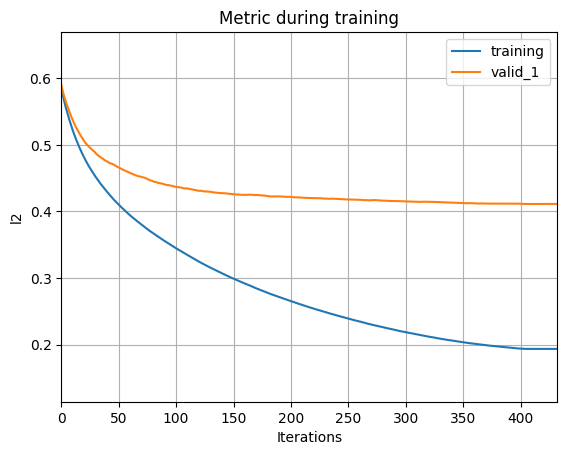

----> || Train Optimized QWK SCORE ::  0.833
----> || Val Optimized QWK SCORE ::  0.538
----> || Train Optimized Val QWK SCORE ::  0.520
----> || Val Optimized Train QWK SCORE ::  0.825
Fold 1 - Rounded Train QWK: 0.7535, Rounded Validation QWK: 0.4303


<Figure size 640x480 with 0 Axes>

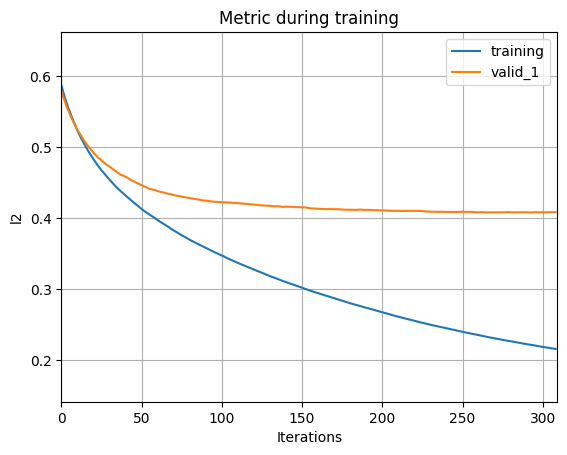

----> || Train Optimized QWK SCORE ::  0.796
----> || Val Optimized QWK SCORE ::  0.532
----> || Train Optimized Val QWK SCORE ::  0.510
----> || Val Optimized Train QWK SCORE ::  0.782
Fold 2 - Rounded Train QWK: 0.7062, Rounded Validation QWK: 0.4794


<Figure size 640x480 with 0 Axes>

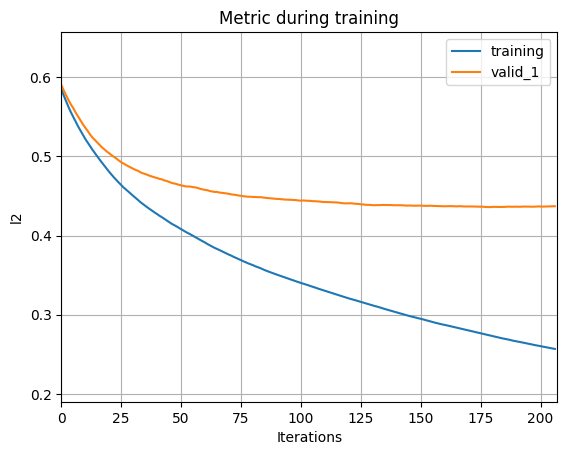

----> || Train Optimized QWK SCORE ::  0.737
----> || Val Optimized QWK SCORE ::  0.526
----> || Train Optimized Val QWK SCORE ::  0.500
----> || Val Optimized Train QWK SCORE ::  0.728
Fold 3 - Rounded Train QWK: 0.6326, Rounded Validation QWK: 0.3774


<Figure size 640x480 with 0 Axes>

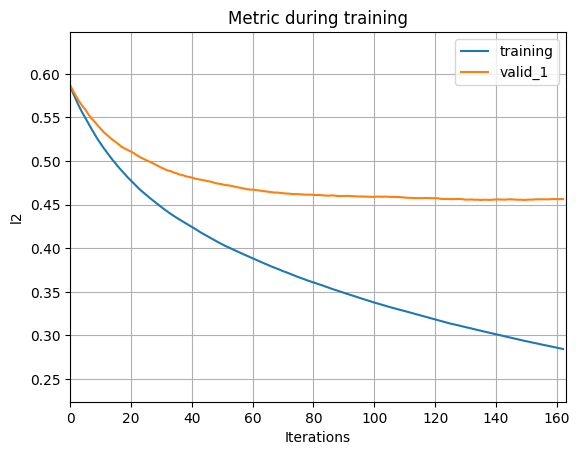

----> || Train Optimized QWK SCORE ::  0.701
----> || Val Optimized QWK SCORE ::  0.490
----> || Train Optimized Val QWK SCORE ::  0.470
----> || Val Optimized Train QWK SCORE ::  0.681
Fold 4 - Rounded Train QWK: 0.6003, Rounded Validation QWK: 0.3591


<Figure size 640x480 with 0 Axes>

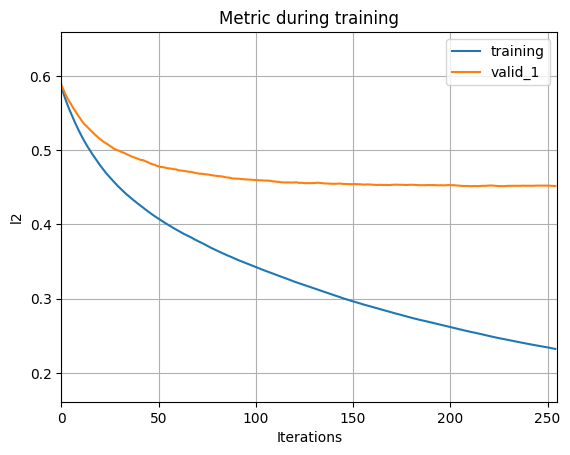

----> || Train Optimized QWK SCORE ::  0.773
----> || Val Optimized QWK SCORE ::  0.456
----> || Train Optimized Val QWK SCORE ::  0.457
----> || Val Optimized Train QWK SCORE ::  0.753
Fold 5 - Rounded Train QWK: 0.6805, Rounded Validation QWK: 0.3603
Mean Train QWK --> 0.7680
Mean Validation QWK ---> 0.5083
----> || Optimized QWK SCORE ::  0.500


In [235]:
lgb_models_list4, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_selected4_df, test_selected4_df, 250)

In [236]:
lgb_optuna_study.best_params

{'learning_rate': 0.042863907893657065,
 'early_stopping_round': 27,
 'max_depth': 16,
 'min_data_in_leaf': 59,
 'num_leaves': 335,
 'min_gain_to_split': 0.19237511428856374,
 'lambda_l1': 2.457083099204966,
 'lambda_l2': 161.9736034005514}

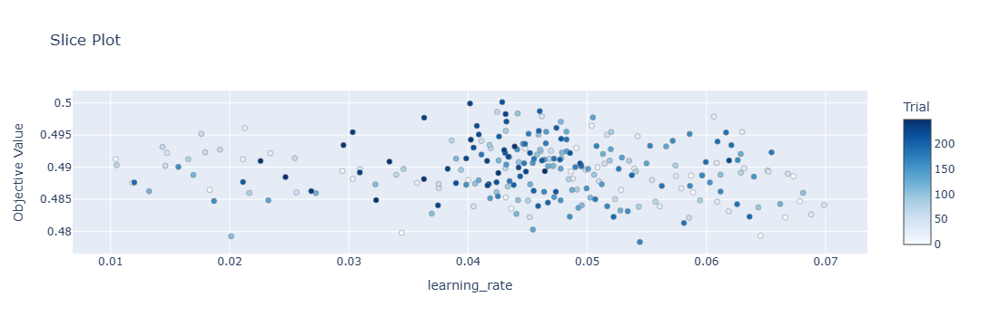

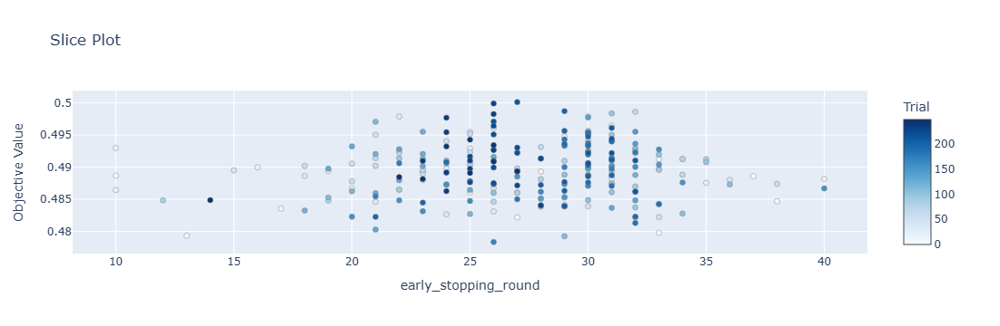

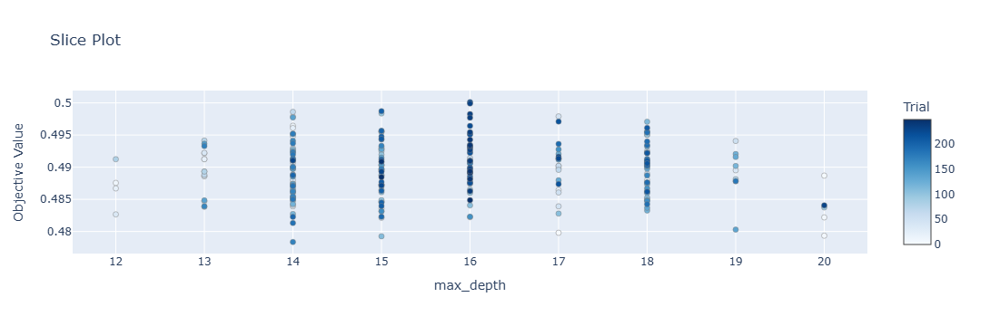

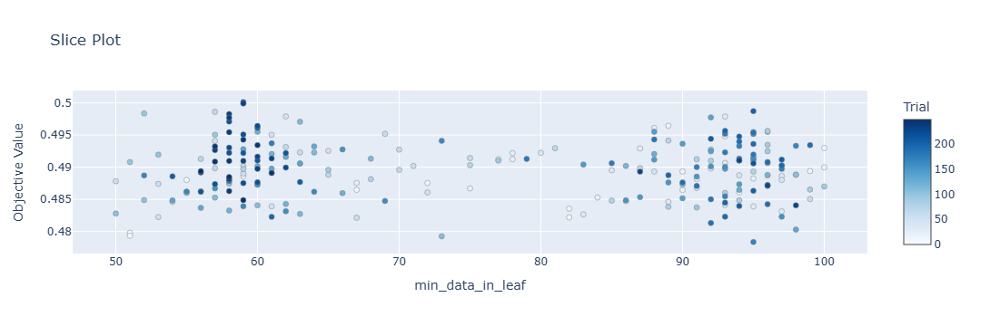

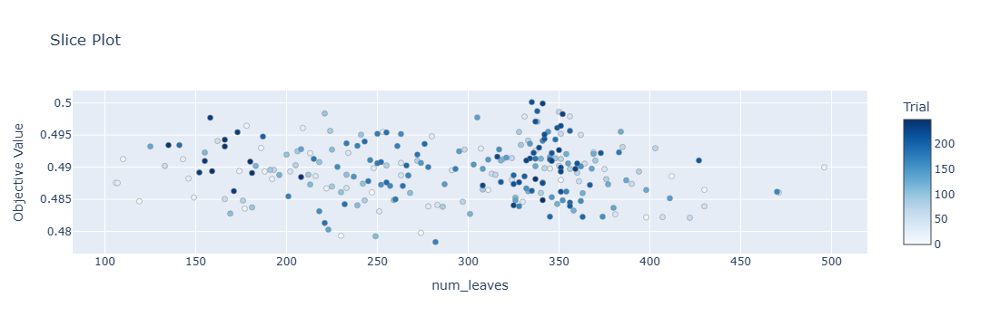

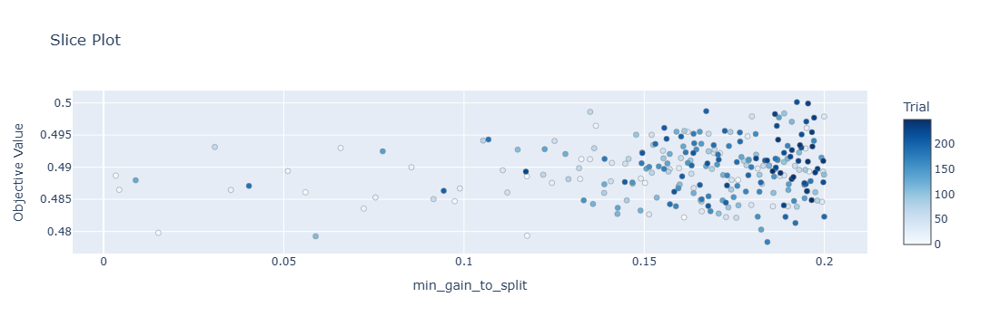

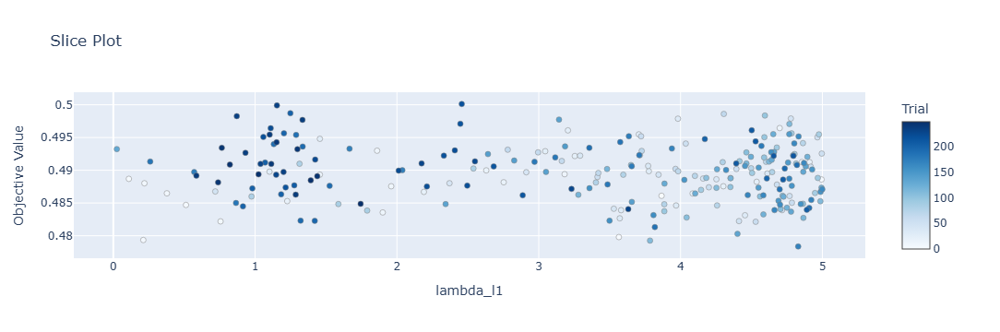

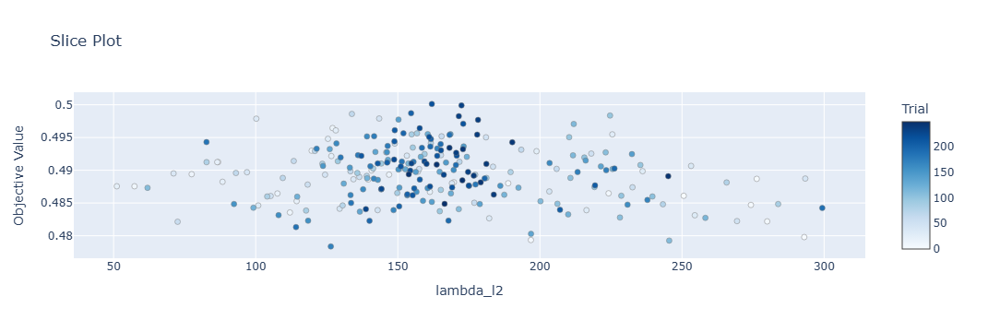

In [237]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

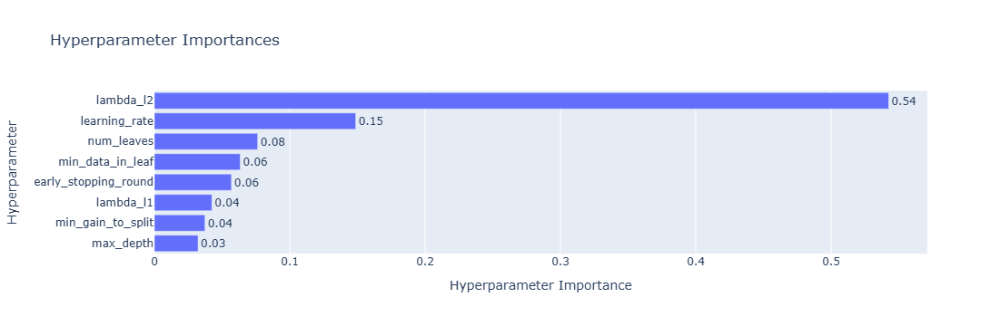

In [240]:
plot_param_importances(lgb_optuna_study)

In [242]:
cols = train_selected4_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list4:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
print(imp_df.shape)
imp_df

(90, 2)


,Feature,Importance
23,SDS-SDS_Total_Raw,160.8
22,PreInt_EduHx-computerinternet_hoursday,96.6
40,Y_time_of_day_hour_window_20_sum,78.4
71,battery_use_since_wear_time_of_day_hour_window_8_mean,72.6
15,Physical-BMI,70.4
76,enmo_time_of_day_hour_window_1_std,66.6
46,Y_time_of_day_hour_window_5_entropy,64.2
12,Muscle_to_Fat,64.0
82,light_time_of_day_hour_window_15_3%,63.4
38,Y_time_of_day_hour_window_11_mean,63.0


In [243]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [244]:
train_selected5_df = train_selected4_df.drop(unimportant_cols, axis=1)
print(train_selected5_df.shape)
train_selected5_df.head()

(2736, 47)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-HeartRate,FGC-FGC_CU,FGC-FGC_PU,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Z_weekday_1_min,Z_weekday_4_mean,light_weekday_4_max,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_5_max,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_15_max,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_20_std,battery_use_since_wear_time_of_day_hour_window_8_mean,Muscle_to_Fat,sii
0,00008ff9,5.0,51.0,16.877316,46.0,80.0,0.0,0.0,13.81770,1.844,2.6342,41.6,3.0,-1.001339,0.067867,929.050000,213.972368,696.71665,239.102159,-0.011758,1.140360,-43.818953,11.926842,0.307957,23.115072,-68.529391,-156.169044,52.527369,0.077756,-18.909606,49.035377,-0.989829,18.664069,1.461590,-0.993515,-0.601909,-0.973880,0.024752,0.026305,0.044125,15.214690,1343.000024,0.425600,13.298962,286.112347,6.383063,2.0
1,000fd460,9.0,63.2,14.035590,48.0,70.0,3.0,5.0,12.82540,1.704,2.3400,46.0,0.0,-1.000690,0.064376,1148.777557,316.855106,507.16665,383.965568,0.007261,1.058457,-306.613574,12.159670,0.337922,25.279001,-62.010112,184.093170,59.785731,0.028424,-51.054434,28.113788,-0.984249,18.904598,1.241939,-0.996798,-0.978247,-0.754005,0.028585,0.031380,0.058982,19.015883,706.656366,0.754995,10.445207,251.225998,12.718037,0.0
2,00105258,10.0,71.0,16.648696,56.5,94.0,20.0,7.0,24.52766,2.578,2.1700,38.0,2.0,-1.001535,-0.018174,2174.520020,280.658752,475.76665,-27.948322,-0.157110,1.251344,-525.753946,37.619012,0.353785,17.038335,-1122.292294,48.409760,73.123344,0.018078,-189.599450,35.522243,-0.907346,31.276516,1.612058,-0.999681,-0.997746,-0.993624,0.023039,0.010238,0.049712,22.907549,2086.549777,0.637935,10.215226,285.961932,9.755870,0.0
3,00115b9f,9.0,71.0,18.292347,56.0,97.0,18.0,5.0,14.07400,2.018,2.4510,31.0,0.0,-1.013281,0.016126,2318.199951,178.458450,359.00000,-12.885210,-0.110789,1.023125,38.194061,11.161091,0.314303,22.678757,-148.687180,712.567383,9.328824,0.162170,-162.726105,56.389805,-1.007734,14.085580,0.999349,-1.028047,-0.994922,-1.004505,0.022990,0.018390,0.040718,17.601913,2633.250000,0.021999,5.821051,145.146576,6.274343,1.0
4,001f3379,13.0,50.0,22.279952,59.5,73.0,12.0,6.0,16.68770,2.004,4.1100,40.0,0.0,-1.011558,-0.094034,2578.000000,139.089218,432.00000,-740.448975,-0.098163,1.006678,-80.104980,20.508488,0.274352,14.871807,14.181335,735.050537,15.849753,0.051869,100.479034,15.112022,-0.988334,12.457760,1.126889,-1.010555,-1.014619,-1.006673,0.009905,0.006331,0.020525,23.471333,442.799988,0.004621,6.074192,279.661560,2.621003,1.0


In [245]:
test_selected5_df = test_selected4_df.drop(unimportant_cols, axis=1)
print(test_selected5_df.shape)
test_selected5_df.head()

(20, 46)


,id,Basic_Demos-Age,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-HeartRate,FGC-FGC_CU,FGC-FGC_PU,BIA-BIA_FFMI,PAQ_A-PAQ_A_Total,PAQ_C-PAQ_C_Total,SDS-SDS_Total_Raw,PreInt_EduHx-computerinternet_hoursday,Z_weekday_1_min,Z_weekday_4_mean,light_weekday_4_max,battery_use_since_wear_weekday_3_mean,battery_use_since_wear_weekday_5_max,X_time_of_day_hour_window_2_sum,X_time_of_day_hour_window_4_mean,X_time_of_day_hour_window_15_max,Y_time_of_day_hour_window_0_sum,Y_time_of_day_hour_window_2_entropy,Y_time_of_day_hour_window_3_std,Y_time_of_day_hour_window_5_entropy,Y_time_of_day_hour_window_6_sum,Y_time_of_day_hour_window_9_sum,Y_time_of_day_hour_window_9_entropy,Y_time_of_day_hour_window_11_mean,Y_time_of_day_hour_window_20_sum,Y_time_of_day_hour_window_22_entropy,Z_time_of_day_hour_window_0_min,Z_time_of_day_hour_window_15_entropy,Z_time_of_day_hour_window_16_max,Z_time_of_day_hour_window_20_min,Z_time_of_day_hour_window_22_min,Z_time_of_day_hour_window_23_min,enmo_time_of_day_hour_window_1_std,enmo_time_of_day_hour_window_6_mean,enmo_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_8_mean,light_time_of_day_hour_window_10_max,light_time_of_day_hour_window_15_3%,light_time_of_day_hour_window_20_std,battery_use_since_wear_time_of_day_hour_window_8_mean,Muscle_to_Fat
0,00008ff9,5.0,51.0,16.877316,46.000,80.0,0.0,0.0,13.81770,1.844,2.6342,41.6,3.0,-1.001339,0.067867,929.050000,213.972368,696.71665,239.102159,-0.011758,1.140360,-43.818953,11.926842,0.307957,23.115072,-68.529391,-156.169044,52.527369,0.077756,-18.909606,49.035377,-0.989829,18.664069,1.461590,-0.993515,-0.601909,-0.973880,0.024752,0.026305,0.044125,15.214690,1343.000024,0.425600,13.298962,286.112347,6.383063
1,000fd460,9.0,63.2,14.035590,48.000,70.0,3.0,5.0,12.82540,1.704,2.3400,46.0,0.0,-1.000690,0.064376,1148.777557,316.855106,507.16665,383.965568,0.007261,1.058457,-306.613574,12.159670,0.337922,25.279001,-62.010112,184.093170,59.785731,0.028424,-51.054434,28.113788,-0.984249,18.904598,1.241939,-0.996798,-0.978247,-0.754005,0.028585,0.031380,0.058982,19.015883,706.656366,0.754995,10.445207,251.225998,12.718037
2,00105258,10.0,71.0,16.648696,56.500,94.0,20.0,7.0,24.52766,2.578,2.1700,38.0,2.0,-1.001535,-0.018174,2174.520020,280.658752,475.76665,-27.948322,-0.157110,1.251344,-525.753946,37.619012,0.353785,17.038335,-1122.292294,48.409760,73.123344,0.018078,-189.599450,35.522243,-0.907346,31.276516,1.612058,-0.999681,-0.997746,-0.993624,0.023039,0.010238,0.049712,22.907549,2086.549777,0.637935,10.215226,285.961932,9.755870
3,00115b9f,9.0,71.0,18.292347,56.000,97.0,18.0,5.0,14.07400,2.018,2.4510,31.0,0.0,-1.013281,0.016126,2318.199951,178.458450,359.00000,-12.885210,-0.110789,1.023125,38.194061,11.161091,0.314303,22.678757,-148.687180,712.567383,9.328824,0.162170,-162.726105,56.389805,-1.007734,14.085580,0.999349,-1.028047,-0.994922,-1.004505,0.022990,0.018390,0.040718,17.601913,2633.250000,0.021999,5.821051,145.146576,6.274343
4,0016bb22,18.0,65.8,22.367377,66.878,75.4,5.8,4.2,15.81610,1.040,2.2922,65.2,2.2,-0.601322,-0.269379,1052.849274,208.150089,586.00000,-346.688521,-0.027934,1.010730,311.321217,23.034155,0.423979,34.068309,418.256672,-310.559863,21.064805,0.094592,179.947000,26.405155,-0.986945,11.501916,1.059301,-0.880040,-1.001321,-0.951278,0.036318,0.020408,0.060554,33.682291,1129.729980,0.435771,13.463926,232.641109,10.738625


[I 2024-12-14 02:35:04,831] A new study created in memory with name: no-name-d63a5c6b-faa6-4c21-88d4-a56797e4fb2a
[I 2024-12-14 02:35:16,994] Trial 0 finished with value: 0.4914194331090769 and parameters: {'learning_rate': 0.011738578120523969, 'early_stopping_round': 39, 'max_depth': 15, 'min_data_in_leaf': 75, 'num_leaves': 220, 'min_gain_to_split': 0.10014123785947661, 'lambda_l1': 5.749966859546329, 'lambda_l2': 220.04492863336884}. Best is trial 0 with value: 0.4914194331090769.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:35:21,808] Trial 1 finished with value: 0.4834861495214603 and parameters: {'learning_rate': 0.03846214075617144, 'early_stopping_round': 33, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 310, 'min_gain_to_split': 0.06232300262611687, 'lambda_l1': 5.265035809923521, 'lambda_l2': 270.72398528407484}. Best is trial 0 with value: 0.4914194331090769.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 02:35:25,514] Trial 2 finished with value: 0.4911653335085475 and parameters: {'learning_rate': 0.04227779963116653, 'early_stopping_round': 13, 'max_depth': 19, 'min_data_in_leaf': 57, 'num_leaves': 296, 'min_gain_to_split': 0.07820732461513204, 'lambda_l1': 2.2058120224475015, 'lambda_l2': 152.80696443765686}. Best is trial 0 with value: 0.4914194331090769.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:35:29,261] Trial 3 finished with value: 0.4958422335128345 and parameters: {'learning_rate': 0.059669303837627044, 'early_stopping_round': 26, 'max_depth': 17, 'min_data_in_leaf': 73, 'num_leaves': 115, 'min_gain_to_split': 0.0015231591601444826, 'lambda_l1': 6.035926262170908, 'lambda_l2': 218.75201587797503}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:35:35,364] Trial 4 finished with value: 0.4913025006329901 and parameters: {'learning_rate': 0.028000587140782726, 'early_stopping_round': 40, 'max_depth': 18, 'min_data_in_leaf': 84, 'num_leaves': 128, 'min_gain_to_split': 0.08363935077088644, 'lambda_l1': 4.351151869023785, 'lambda_l2': 215.17091763901757}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:35:37,947] Trial 5 finished with value: 0.489143247882283 and parameters: {'learning_rate': 0.0622688476851278, 'early_stopping_round': 21, 'max_depth': 14, 'min_data_in_leaf': 80, 'num_leaves': 339, 'min_gain_to_split': 0.20865207355776103, 'lambda_l1': 0.5160689615928075, 'lambda_l2': 235.91714309324558}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:35:41,325] Trial 6 finished with value: 0.4866016311997341 and parameters: {'learning_rate': 0.0303370574700777, 'early_stopping_round': 12, 'max_depth': 13, 'min_data_in_leaf': 95, 'num_leaves': 187, 'min_gain_to_split': 0.189198406102394, 'lambda_l1': 6.158626769572443, 'lambda_l2': 280.73922596435995}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:35:43,729] Trial 7 finished with value: 0.48575233160086917 and parameters: {'learning_rate': 0.06330403155682364, 'early_stopping_round': 12, 'max_depth': 12, 'min_data_in_leaf': 78, 'num_leaves': 330, 'min_gain_to_split': 0.24574350884094517, 'lambda_l1': 5.040967270207259, 'lambda_l2': 174.64858775978445}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:35:46,765] Trial 8 finished with value: 0.48918475856745103 and parameters: {'learning_rate': 0.04931784337125444, 'early_stopping_round': 18, 'max_depth': 12, 'min_data_in_leaf': 94, 'num_leaves': 220, 'min_gain_to_split': 0.09312994587512148, 'lambda_l1': 6.039233176441933, 'lambda_l2': 190.61447956553306}. Best is trial 3 with value: 0.4958422335128345.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:35:50,394] Trial 9 finished with value: 0.5013338486970387 and parameters: {'learning_rate': 0.0635492124562308, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 427, 'min_gain_to_split': 0.2401681797624129, 'lambda_l1': 0.4757715935655268, 'lambda_l2': 206.8701297958567}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:35:53,176] Trial 10 finished with value: 0.48782883613077765 and parameters: {'learning_rate': 0.06985516541439718, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 50, 'num_leaves': 473, 'min_gain_to_split': 0.2988141786836977, 'lambda_l1': 0.005320015887973817, 'lambda_l2': 69.25438230122879}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:35:56,943] Trial 11 finished with value: 0.49057753503802837 and parameters: {'learning_rate': 0.05404208999809222, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 499, 'min_gain_to_split': 0.020315863291234776, 'lambda_l1': 2.7338844605058683, 'lambda_l2': 135.7699096274253}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:35:59,773] Trial 12 finished with value: 0.4898162515312372 and parameters: {'learning_rate': 0.05620765493847654, 'early_stopping_round': 25, 'max_depth': 20, 'min_data_in_leaf': 69, 'num_leaves': 427, 'min_gain_to_split': 0.1646009172760007, 'lambda_l1': 1.4727385246559934, 'lambda_l2': 112.88933462697277}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:36:02,054] Trial 13 finished with value: 0.4835292984069153 and parameters: {'learning_rate': 0.06799415475541189, 'early_stopping_round': 36, 'max_depth': 17, 'min_data_in_leaf': 69, 'num_leaves': 396, 'min_gain_to_split': 0.2562057323510014, 'lambda_l1': 6.96993093018544, 'lambda_l2': 250.65123964047396}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:36:05,812] Trial 14 finished with value: 0.4881144175700818 and parameters: {'learning_rate': 0.04841894042137448, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 135, 'min_gain_to_split': 0.13355597010413772, 'lambda_l1': 3.6899747100451017, 'lambda_l2': 196.98279676245414}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:36:09,039] Trial 15 finished with value: 0.4878297158603062 and parameters: {'learning_rate': 0.05750130329445267, 'early_stopping_round': 26, 'max_depth': 16, 'min_data_in_leaf': 88, 'num_leaves': 389, 'min_gain_to_split': 2.0288877634278002e-05, 'lambda_l1': 1.284117933612857, 'lambda_l2': 249.4106858307688}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:36:11,999] Trial 16 finished with value: 0.4974121096381624 and parameters: {'learning_rate': 0.06141448067410707, 'early_stopping_round': 18, 'max_depth': 18, 'min_data_in_leaf': 73, 'num_leaves': 252, 'min_gain_to_split': 0.13989178661949211, 'lambda_l1': 3.47850361881367, 'lambda_l2': 164.8115372945309}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:36:15,155] Trial 17 finished with value: 0.48409820341935006 and parameters: {'learning_rate': 0.04862855155228507, 'early_stopping_round': 18, 'max_depth': 20, 'min_data_in_leaf': 63, 'num_leaves': 261, 'min_gain_to_split': 0.13478355944137163, 'lambda_l1': 3.0903037938567857, 'lambda_l2': 103.41592019847933}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:36:24,291] Trial 18 finished with value: 0.47710216122187876 and parameters: {'learning_rate': 0.012033706009026895, 'early_stopping_round': 16, 'max_depth': 18, 'min_data_in_leaf': 51, 'num_leaves': 370, 'min_gain_to_split': 0.2140657142309913, 'lambda_l1': 1.7964309411616388, 'lambda_l2': 154.7880021847169}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.477


[I 2024-12-14 02:36:27,728] Trial 19 finished with value: 0.4868220800259626 and parameters: {'learning_rate': 0.04016255366271211, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 448, 'min_gain_to_split': 0.29848114054354535, 'lambda_l1': 3.974175696582691, 'lambda_l2': 298.86003818696975}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:36:29,632] Trial 20 finished with value: 0.48503563360526447 and parameters: {'learning_rate': 0.06446749645355836, 'early_stopping_round': 21, 'max_depth': 19, 'min_data_in_leaf': 100, 'num_leaves': 253, 'min_gain_to_split': 0.16432139292361037, 'lambda_l1': 0.5023348000606064, 'lambda_l2': 76.31289163582113}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 02:36:33,384] Trial 21 finished with value: 0.4928714152128125 and parameters: {'learning_rate': 0.05927313798282592, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 72, 'num_leaves': 160, 'min_gain_to_split': 0.04138165332201056, 'lambda_l1': 6.916467565359216, 'lambda_l2': 179.6757308211391}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:36:36,270] Trial 22 finished with value: 0.49087051965540773 and parameters: {'learning_rate': 0.05233582754396614, 'early_stopping_round': 36, 'max_depth': 18, 'min_data_in_leaf': 74, 'num_leaves': 107, 'min_gain_to_split': 0.2564245511832265, 'lambda_l1': 4.421828145228728, 'lambda_l2': 208.05826535998773}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:36:39,179] Trial 23 finished with value: 0.4895992630124366 and parameters: {'learning_rate': 0.06288761941763356, 'early_stopping_round': 15, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 178, 'min_gain_to_split': 0.1217885327067338, 'lambda_l1': 2.6636079935605412, 'lambda_l2': 155.56463195857248}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:36:41,312] Trial 24 finished with value: 0.49285566979936946 and parameters: {'learning_rate': 0.06925225533687362, 'early_stopping_round': 10, 'max_depth': 15, 'min_data_in_leaf': 81, 'num_leaves': 278, 'min_gain_to_split': 0.18466240985696536, 'lambda_l1': 5.000460747232129, 'lambda_l2': 127.60371163786498}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:36:45,227] Trial 25 finished with value: 0.4990894596191562 and parameters: {'learning_rate': 0.05952508740566591, 'early_stopping_round': 23, 'max_depth': 19, 'min_data_in_leaf': 68, 'num_leaves': 230, 'min_gain_to_split': 0.04803380271129919, 'lambda_l1': 3.118291914017656, 'lambda_l2': 231.9646343374313}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:36:49,409] Trial 26 finished with value: 0.49069658668759775 and parameters: {'learning_rate': 0.045629210047274014, 'early_stopping_round': 23, 'max_depth': 19, 'min_data_in_leaf': 69, 'num_leaves': 217, 'min_gain_to_split': 0.11209868713467358, 'lambda_l1': 3.2489130799058654, 'lambda_l2': 237.90599478893128}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:36:53,397] Trial 27 finished with value: 0.48198140210082296 and parameters: {'learning_rate': 0.031406815074990706, 'early_stopping_round': 19, 'max_depth': 20, 'min_data_in_leaf': 66, 'num_leaves': 247, 'min_gain_to_split': 0.2287309076103643, 'lambda_l1': 2.4151421699077322, 'lambda_l2': 167.550767550535}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 02:37:03,677] Trial 28 finished with value: 0.49035121574681595 and parameters: {'learning_rate': 0.018124417920032384, 'early_stopping_round': 28, 'max_depth': 19, 'min_data_in_leaf': 54, 'num_leaves': 338, 'min_gain_to_split': 0.05122097774916502, 'lambda_l1': 1.1537844207024905, 'lambda_l2': 197.05347161732809}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:37:06,903] Trial 29 finished with value: 0.4935400698579977 and parameters: {'learning_rate': 0.0532813657996042, 'early_stopping_round': 36, 'max_depth': 13, 'min_data_in_leaf': 78, 'num_leaves': 224, 'min_gain_to_split': 0.2719931757561996, 'lambda_l1': 1.8929765552670657, 'lambda_l2': 234.1696637529666}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:37:10,098] Trial 30 finished with value: 0.48738783157479537 and parameters: {'learning_rate': 0.06596589466859606, 'early_stopping_round': 33, 'max_depth': 18, 'min_data_in_leaf': 71, 'num_leaves': 195, 'min_gain_to_split': 0.15043656048589968, 'lambda_l1': 3.5572722812615742, 'lambda_l2': 267.299756274596}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:37:13,718] Trial 31 finished with value: 0.4930316581068904 and parameters: {'learning_rate': 0.059927751952595726, 'early_stopping_round': 23, 'max_depth': 17, 'min_data_in_leaf': 75, 'num_leaves': 153, 'min_gain_to_split': 0.0019433823853829552, 'lambda_l1': 4.4159457273227, 'lambda_l2': 220.9990896150183}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:37:17,735] Trial 32 finished with value: 0.4906709781729992 and parameters: {'learning_rate': 0.058565205532010216, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 102, 'min_gain_to_split': 0.021762355532170492, 'lambda_l1': 5.404262364030815, 'lambda_l2': 212.90363575351546}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:37:21,049] Trial 33 finished with value: 0.48859470309904074 and parameters: {'learning_rate': 0.061495965807280416, 'early_stopping_round': 16, 'max_depth': 18, 'min_data_in_leaf': 64, 'num_leaves': 297, 'min_gain_to_split': 0.0657400440535579, 'lambda_l1': 3.1383968475175896, 'lambda_l2': 225.4393809652986}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:37:24,085] Trial 34 finished with value: 0.48773290941500924 and parameters: {'learning_rate': 0.05505667739819827, 'early_stopping_round': 20, 'max_depth': 17, 'min_data_in_leaf': 85, 'num_leaves': 276, 'min_gain_to_split': 0.029213640342301644, 'lambda_l1': 4.19320121172223, 'lambda_l2': 189.97985811079087}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:37:29,335] Trial 35 finished with value: 0.48902218347040083 and parameters: {'learning_rate': 0.035443205551511855, 'early_stopping_round': 33, 'max_depth': 19, 'min_data_in_leaf': 72, 'num_leaves': 314, 'min_gain_to_split': 0.06102197459409818, 'lambda_l1': 4.682167564155125, 'lambda_l2': 252.05643177357706}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:37:32,443] Trial 36 finished with value: 0.49510572770852956 and parameters: {'learning_rate': 0.06602166850137671, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 78, 'num_leaves': 358, 'min_gain_to_split': 0.08090652316249387, 'lambda_l1': 6.470250466451431, 'lambda_l2': 209.2456020679878}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:37:36,288] Trial 37 finished with value: 0.48534142612154996 and parameters: {'learning_rate': 0.043234905349862185, 'early_stopping_round': 27, 'max_depth': 18, 'min_data_in_leaf': 62, 'num_leaves': 238, 'min_gain_to_split': 0.09930964365821082, 'lambda_l1': 5.648673546248503, 'lambda_l2': 167.27194820234658}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 02:37:41,991] Trial 38 finished with value: 0.4853374631563171 and parameters: {'learning_rate': 0.02336790156428696, 'early_stopping_round': 14, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 196, 'min_gain_to_split': 0.19519031952905963, 'lambda_l1': 0.6745390965035316, 'lambda_l2': 270.2121777246492}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 02:37:44,917] Trial 39 finished with value: 0.4914921190893169 and parameters: {'learning_rate': 0.051308659205373856, 'early_stopping_round': 17, 'max_depth': 19, 'min_data_in_leaf': 67, 'num_leaves': 318, 'min_gain_to_split': 0.04216511047225091, 'lambda_l1': 3.9103166746397613, 'lambda_l2': 141.20710141378368}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:37:48,325] Trial 40 finished with value: 0.4904778677938241 and parameters: {'learning_rate': 0.06116701678703262, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 75, 'num_leaves': 279, 'min_gain_to_split': 0.012761166957573351, 'lambda_l1': 2.1313347118309536, 'lambda_l2': 181.21427644802978}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:37:51,382] Trial 41 finished with value: 0.49158687270617396 and parameters: {'learning_rate': 0.06560392411530172, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 78, 'num_leaves': 355, 'min_gain_to_split': 0.08462345632271212, 'lambda_l1': 6.064440162379899, 'lambda_l2': 206.91230930883486}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:37:53,949] Trial 42 finished with value: 0.48297107650179694 and parameters: {'learning_rate': 0.06672484959900349, 'early_stopping_round': 20, 'max_depth': 13, 'min_data_in_leaf': 81, 'num_leaves': 419, 'min_gain_to_split': 0.07257886736860315, 'lambda_l1': 6.518195104881642, 'lambda_l2': 231.08455051155804}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 02:37:57,537] Trial 43 finished with value: 0.49008196736474274 and parameters: {'learning_rate': 0.05626777326806133, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 83, 'num_leaves': 361, 'min_gain_to_split': 0.03445833773899352, 'lambda_l1': 6.539199580822978, 'lambda_l2': 201.67038573783114}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:38:00,413] Trial 44 finished with value: 0.4887226187275101 and parameters: {'learning_rate': 0.06342641766561241, 'early_stopping_round': 24, 'max_depth': 15, 'min_data_in_leaf': 73, 'num_leaves': 460, 'min_gain_to_split': 0.08394021353735857, 'lambda_l1': 6.440578065817432, 'lambda_l2': 240.94674272434983}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:38:03,504] Trial 45 finished with value: 0.4987152630104631 and parameters: {'learning_rate': 0.06929661650335309, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 69, 'num_leaves': 420, 'min_gain_to_split': 0.10917193710289354, 'lambda_l1': 5.708866874074025, 'lambda_l2': 217.655048852885}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:38:06,438] Trial 46 finished with value: 0.49330681805877863 and parameters: {'learning_rate': 0.0683232501914414, 'early_stopping_round': 21, 'max_depth': 13, 'min_data_in_leaf': 68, 'num_leaves': 495, 'min_gain_to_split': 0.11026351574916612, 'lambda_l1': 5.682944078767314, 'lambda_l2': 259.1465945014308}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:38:09,067] Trial 47 finished with value: 0.49333153436401256 and parameters: {'learning_rate': 0.06979474339695184, 'early_stopping_round': 18, 'max_depth': 14, 'min_data_in_leaf': 70, 'num_leaves': 410, 'min_gain_to_split': 0.17158195540627708, 'lambda_l1': 4.920608060826522, 'lambda_l2': 189.86302010763836}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:38:13,252] Trial 48 finished with value: 0.4991198109680627 and parameters: {'learning_rate': 0.05729694810419992, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 76, 'num_leaves': 383, 'min_gain_to_split': 0.052692593853411, 'lambda_l1': 0.06686279195000155, 'lambda_l2': 284.1731067307522}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:38:16,481] Trial 49 finished with value: 0.49264474818636705 and parameters: {'learning_rate': 0.057848393648550385, 'early_stopping_round': 22, 'max_depth': 14, 'min_data_in_leaf': 76, 'num_leaves': 384, 'min_gain_to_split': 0.14819842281137519, 'lambda_l1': 0.9252331194832819, 'lambda_l2': 291.360638674956}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:38:19,049] Trial 50 finished with value: 0.48373330955618465 and parameters: {'learning_rate': 0.06331601092965088, 'early_stopping_round': 12, 'max_depth': 13, 'min_data_in_leaf': 87, 'num_leaves': 453, 'min_gain_to_split': 0.05261642786853821, 'lambda_l1': 0.32319297410700853, 'lambda_l2': 281.6313413318183}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:38:22,798] Trial 51 finished with value: 0.49111238581200833 and parameters: {'learning_rate': 0.0599206518260649, 'early_stopping_round': 26, 'max_depth': 14, 'min_data_in_leaf': 71, 'num_leaves': 424, 'min_gain_to_split': 0.129839094130124, 'lambda_l1': 1.5847236838429617, 'lambda_l2': 223.68697825210788}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:38:27,182] Trial 52 finished with value: 0.49597593780646154 and parameters: {'learning_rate': 0.05023367417137667, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 67, 'num_leaves': 409, 'min_gain_to_split': 0.11163020358072778, 'lambda_l1': 5.343204766834008, 'lambda_l2': 281.4696738327225}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:38:31,706] Trial 53 finished with value: 0.4947634452960462 and parameters: {'learning_rate': 0.05050970853425968, 'early_stopping_round': 28, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 435, 'min_gain_to_split': 0.1095214725847765, 'lambda_l1': 0.265719852590216, 'lambda_l2': 277.3155595251561}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:38:35,630] Trial 54 finished with value: 0.4834936238468035 and parameters: {'learning_rate': 0.054812805157826966, 'early_stopping_round': 25, 'max_depth': 12, 'min_data_in_leaf': 57, 'num_leaves': 401, 'min_gain_to_split': 0.14504340562712772, 'lambda_l1': 0.1497447014057142, 'lambda_l2': 287.23716357728216}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.483


[I 2024-12-14 02:38:40,156] Trial 55 finished with value: 0.49675685635919764 and parameters: {'learning_rate': 0.05738018768665878, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 63, 'num_leaves': 469, 'min_gain_to_split': 0.10029201790364756, 'lambda_l1': 0.7420282544652583, 'lambda_l2': 297.7821272942172}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:38:45,558] Trial 56 finished with value: 0.4955999607639813 and parameters: {'learning_rate': 0.04662457092445345, 'early_stopping_round': 33, 'max_depth': 13, 'min_data_in_leaf': 63, 'num_leaves': 475, 'min_gain_to_split': 0.09627712671887131, 'lambda_l1': 0.8568772802716453, 'lambda_l2': 295.6144916855028}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:38:48,621] Trial 57 finished with value: 0.4886592732974687 and parameters: {'learning_rate': 0.061446830175642, 'early_stopping_round': 19, 'max_depth': 13, 'min_data_in_leaf': 54, 'num_leaves': 482, 'min_gain_to_split': 0.16005534561758472, 'lambda_l1': 0.06521919730945525, 'lambda_l2': 261.25587007841784}. Best is trial 9 with value: 0.5013338486970387.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:38:53,127] Trial 58 finished with value: 0.5015648245622636 and parameters: {'learning_rate': 0.057266165387409654, 'early_stopping_round': 30, 'max_depth': 14, 'min_data_in_leaf': 65, 'num_leaves': 436, 'min_gain_to_split': 0.12224353304340599, 'lambda_l1': 2.7432910895173332, 'lambda_l2': 299.3714594696884}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:38:56,275] Trial 59 finished with value: 0.4842671972528234 and parameters: {'learning_rate': 0.06466243036317255, 'early_stopping_round': 22, 'max_depth': 15, 'min_data_in_leaf': 65, 'num_leaves': 443, 'min_gain_to_split': 0.1257099894875019, 'lambda_l1': 2.8556899408835106, 'lambda_l2': 169.23976039335548}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:38:59,461] Trial 60 finished with value: 0.4881691146311721 and parameters: {'learning_rate': 0.06755926763092071, 'early_stopping_round': 31, 'max_depth': 14, 'min_data_in_leaf': 76, 'num_leaves': 382, 'min_gain_to_split': 0.17716202059045144, 'lambda_l1': 2.3523798966372262, 'lambda_l2': 243.1127479061168}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:39:03,545] Trial 61 finished with value: 0.49651216406208454 and parameters: {'learning_rate': 0.05689513805275247, 'early_stopping_round': 30, 'max_depth': 13, 'min_data_in_leaf': 69, 'num_leaves': 436, 'min_gain_to_split': 0.13604092923450317, 'lambda_l1': 3.456481679534744, 'lambda_l2': 275.1637125788179}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:39:08,410] Trial 62 finished with value: 0.49500612839114844 and parameters: {'learning_rate': 0.05355975014163867, 'early_stopping_round': 35, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 463, 'min_gain_to_split': 0.09519483351330892, 'lambda_l1': 0.6509419812547286, 'lambda_l2': 297.3451652117947}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:39:12,786] Trial 63 finished with value: 0.4967551952884316 and parameters: {'learning_rate': 0.06077584951666592, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 489, 'min_gain_to_split': 0.1214920152530608, 'lambda_l1': 1.1423038628962963, 'lambda_l2': 285.3148782437407}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:39:15,637] Trial 64 finished with value: 0.49539341104196455 and parameters: {'learning_rate': 0.058488341370758055, 'early_stopping_round': 29, 'max_depth': 20, 'min_data_in_leaf': 65, 'num_leaves': 466, 'min_gain_to_split': 0.15700514104505175, 'lambda_l1': 2.9108948038867877, 'lambda_l2': 50.990046284007704}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:39:19,887] Trial 65 finished with value: 0.49313237161155976 and parameters: {'learning_rate': 0.06310534645323784, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 67, 'num_leaves': 231, 'min_gain_to_split': 0.06957087978790562, 'lambda_l1': 3.761406988882204, 'lambda_l2': 258.21111034246195}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:39:23,309] Trial 66 finished with value: 0.48473732477400766 and parameters: {'learning_rate': 0.0569549571358684, 'early_stopping_round': 26, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 214, 'min_gain_to_split': 0.05104848462091812, 'lambda_l1': 0.42646683289197607, 'lambda_l2': 150.72200488252466}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 02:39:27,487] Trial 67 finished with value: 0.49551295687868835 and parameters: {'learning_rate': 0.055092956613513794, 'early_stopping_round': 23, 'max_depth': 14, 'min_data_in_leaf': 70, 'num_leaves': 419, 'min_gain_to_split': 0.11781174586620816, 'lambda_l1': 1.4213093310554685, 'lambda_l2': 264.46355091439347}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:39:30,707] Trial 68 finished with value: 0.49143367370688373 and parameters: {'learning_rate': 0.06409477082332812, 'early_stopping_round': 32, 'max_depth': 15, 'min_data_in_leaf': 73, 'num_leaves': 450, 'min_gain_to_split': 0.2265625321894749, 'lambda_l1': 3.276900403105605, 'lambda_l2': 248.65221501606655}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:39:33,560] Trial 69 finished with value: 0.4918359147358934 and parameters: {'learning_rate': 0.05923095814818651, 'early_stopping_round': 27, 'max_depth': 13, 'min_data_in_leaf': 55, 'num_leaves': 266, 'min_gain_to_split': 0.2860910506091463, 'lambda_l1': 4.13897906993251, 'lambda_l2': 216.01745496271855}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:39:36,188] Trial 70 finished with value: 0.4854290171606863 and parameters: {'learning_rate': 0.06781895276554671, 'early_stopping_round': 20, 'max_depth': 20, 'min_data_in_leaf': 65, 'num_leaves': 399, 'min_gain_to_split': 0.20133562850412884, 'lambda_l1': 2.589960281378575, 'lambda_l2': 289.9034335729391}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.485


[I 2024-12-14 02:39:40,613] Trial 71 finished with value: 0.501516760992599 and parameters: {'learning_rate': 0.06090919169809651, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 486, 'min_gain_to_split': 0.13882503315914993, 'lambda_l1': 1.0916459509753196, 'lambda_l2': 288.97762529969464}. Best is trial 58 with value: 0.5015648245622636.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:39:44,802] Trial 72 finished with value: 0.503236797274276 and parameters: {'learning_rate': 0.0620108800283832, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 52, 'num_leaves': 474, 'min_gain_to_split': 0.13776064799913407, 'lambda_l1': 0.9740929138074117, 'lambda_l2': 299.992364149755}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.503


[I 2024-12-14 02:39:49,300] Trial 73 finished with value: 0.4917731869305476 and parameters: {'learning_rate': 0.06194087855789596, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 53, 'num_leaves': 435, 'min_gain_to_split': 0.14045831912496817, 'lambda_l1': 1.9162875085961937, 'lambda_l2': 271.3044082674098}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:39:53,404] Trial 74 finished with value: 0.4873744763003236 and parameters: {'learning_rate': 0.06479200310537107, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 52, 'num_leaves': 481, 'min_gain_to_split': 0.15146176258818836, 'lambda_l1': 1.039306090323222, 'lambda_l2': 182.02348267958965}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:39:57,430] Trial 75 finished with value: 0.495289842319391 and parameters: {'learning_rate': 0.06630744122049094, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 50, 'num_leaves': 246, 'min_gain_to_split': 0.16855522614383073, 'lambda_l1': 1.5758035310781713, 'lambda_l2': 160.48766740002716}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:40:01,450] Trial 76 finished with value: 0.49375477431292336 and parameters: {'learning_rate': 0.06007819605367258, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 454, 'min_gain_to_split': 0.18312830252520473, 'lambda_l1': 3.3813236232625896, 'lambda_l2': 292.45217837635056}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:40:05,898] Trial 77 finished with value: 0.49163560154243646 and parameters: {'learning_rate': 0.051847513816099894, 'early_stopping_round': 37, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 204, 'min_gain_to_split': 0.13692669014906372, 'lambda_l1': 2.9917220622810863, 'lambda_l2': 121.4738854228527}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:40:10,259] Trial 78 finished with value: 0.4991279952489849 and parameters: {'learning_rate': 0.06903061079816099, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 287, 'min_gain_to_split': 0.10503460057553954, 'lambda_l1': 0.537078490048521, 'lambda_l2': 229.27042007304777}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:40:14,459] Trial 79 finished with value: 0.4994483892878878 and parameters: {'learning_rate': 0.06937932858442962, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 374, 'min_gain_to_split': 0.10422490255968078, 'lambda_l1': 0.5232884825288595, 'lambda_l2': 226.92345518897864}. Best is trial 72 with value: 0.503236797274276.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:40:18,632] Trial 80 finished with value: 0.5082049076861189 and parameters: {'learning_rate': 0.06999676663300701, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 335, 'min_gain_to_split': 0.08825900875656548, 'lambda_l1': 0.6013118118688167, 'lambda_l2': 251.2537853387134}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.508


[I 2024-12-14 02:40:23,047] Trial 81 finished with value: 0.5014241677908478 and parameters: {'learning_rate': 0.06667242880383242, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 331, 'min_gain_to_split': 0.09046795340018174, 'lambda_l1': 0.4269411583209458, 'lambda_l2': 230.13117379030257}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:40:27,390] Trial 82 finished with value: 0.49456912440548995 and parameters: {'learning_rate': 0.06820936328783561, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 327, 'min_gain_to_split': 0.07601721845036889, 'lambda_l1': 0.5684908807942933, 'lambda_l2': 232.23120008491708}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:40:31,777] Trial 83 finished with value: 0.4936491856931349 and parameters: {'learning_rate': 0.06991206995990283, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 338, 'min_gain_to_split': 0.0895956403416993, 'lambda_l1': 0.2720988334938444, 'lambda_l2': 244.86766094653962}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:40:36,032] Trial 84 finished with value: 0.49453148093408217 and parameters: {'learning_rate': 0.06629297618789524, 'early_stopping_round': 40, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 373, 'min_gain_to_split': 0.10365453119524257, 'lambda_l1': 0.48418347986351346, 'lambda_l2': 253.8194609654049}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:40:40,401] Trial 85 finished with value: 0.4936574722277073 and parameters: {'learning_rate': 0.06494500718939608, 'early_stopping_round': 37, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 301, 'min_gain_to_split': 0.12805679948381302, 'lambda_l1': 1.2917125636343285, 'lambda_l2': 224.38110321843752}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:40:44,740] Trial 86 finished with value: 0.49366733281840136 and parameters: {'learning_rate': 0.0671406362799321, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 307, 'min_gain_to_split': 0.06082646818695081, 'lambda_l1': 0.8897384052370584, 'lambda_l2': 272.8059865303085}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:40:49,377] Trial 87 finished with value: 0.49940151499961205 and parameters: {'learning_rate': 0.06241106196676163, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 353, 'min_gain_to_split': 0.12074551595399266, 'lambda_l1': 0.16154903262241177, 'lambda_l2': 285.15032937524677}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:40:53,528] Trial 88 finished with value: 0.4959514715794203 and parameters: {'learning_rate': 0.06266261483823882, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 290, 'min_gain_to_split': 0.11938141555299903, 'lambda_l1': 0.702477193864312, 'lambda_l2': 201.44564922425914}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:40:57,215] Trial 89 finished with value: 0.49772075021905626 and parameters: {'learning_rate': 0.06820492126918722, 'early_stopping_round': 34, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 327, 'min_gain_to_split': 0.11623864626754686, 'lambda_l1': 0.42667416530317526, 'lambda_l2': 237.97767083937802}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:41:01,524] Trial 90 finished with value: 0.49549564003625945 and parameters: {'learning_rate': 0.06548150087898241, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 52, 'num_leaves': 355, 'min_gain_to_split': 0.12802566139541033, 'lambda_l1': 1.1006747717324115, 'lambda_l2': 299.32569321221587}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:41:05,986] Trial 91 finished with value: 0.49419709745027307 and parameters: {'learning_rate': 0.06228595105252187, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 367, 'min_gain_to_split': 0.09069954058167472, 'lambda_l1': 0.0211321597201651, 'lambda_l2': 287.2810054157017}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:41:12,323] Trial 92 finished with value: 0.49161128085926276 and parameters: {'learning_rate': 0.0371142027645911, 'early_stopping_round': 36, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 500, 'min_gain_to_split': 0.10268359621547536, 'lambda_l1': 0.17519508279002516, 'lambda_l2': 277.7549378418654}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:41:16,408] Trial 93 finished with value: 0.4948721025764107 and parameters: {'learning_rate': 0.0691960653344732, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 377, 'min_gain_to_split': 0.0890282426187106, 'lambda_l1': 0.7810998752988223, 'lambda_l2': 266.9297197355293}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:41:20,507] Trial 94 finished with value: 0.49298517240871975 and parameters: {'learning_rate': 0.06376379100910823, 'early_stopping_round': 37, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 391, 'min_gain_to_split': 0.07945415377363269, 'lambda_l1': 0.36886964504843833, 'lambda_l2': 229.6775124567992}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:41:25,071] Trial 95 finished with value: 0.5016131879985489 and parameters: {'learning_rate': 0.06714422551054097, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 350, 'min_gain_to_split': 0.10393515965277492, 'lambda_l1': 0.9745219203561699, 'lambda_l2': 281.9307675070167}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:41:29,770] Trial 96 finished with value: 0.49463536053282353 and parameters: {'learning_rate': 0.06698447192680004, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 54, 'num_leaves': 347, 'min_gain_to_split': 0.10371450112001376, 'lambda_l1': 0.9702428620112044, 'lambda_l2': 293.39205635812556}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:41:33,674] Trial 97 finished with value: 0.49324802155244996 and parameters: {'learning_rate': 0.06883357114607562, 'early_stopping_round': 39, 'max_depth': 15, 'min_data_in_leaf': 55, 'num_leaves': 345, 'min_gain_to_split': 0.14316261337552005, 'lambda_l1': 1.3488825397584954, 'lambda_l2': 212.34027399896826}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:41:37,869] Trial 98 finished with value: 0.48961393146718657 and parameters: {'learning_rate': 0.06546924433558796, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 320, 'min_gain_to_split': 0.13322339011585085, 'lambda_l1': 0.6192129396896727, 'lambda_l2': 279.7276190624318}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:41:42,040] Trial 99 finished with value: 0.49265881720592775 and parameters: {'learning_rate': 0.06704782854292725, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 347, 'min_gain_to_split': 0.10525966406668796, 'lambda_l1': 1.701906865844614, 'lambda_l2': 255.86818412820966}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:41:45,240] Trial 100 finished with value: 0.4937464051113488 and parameters: {'learning_rate': 0.0639908261800607, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 292, 'min_gain_to_split': 0.252937941263371, 'lambda_l1': 1.2410304039235032, 'lambda_l2': 229.0746471146292}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:41:49,400] Trial 101 finished with value: 0.49393311630659953 and parameters: {'learning_rate': 0.06193788715469744, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 363, 'min_gain_to_split': 0.12404730553117418, 'lambda_l1': 0.2042891434018298, 'lambda_l2': 283.80243116154}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:41:54,327] Trial 102 finished with value: 0.4998878804381235 and parameters: {'learning_rate': 0.06003138597147207, 'early_stopping_round': 34, 'max_depth': 13, 'min_data_in_leaf': 62, 'num_leaves': 332, 'min_gain_to_split': 0.1168071105851988, 'lambda_l1': 0.5315205914942007, 'lambda_l2': 287.77580912377687}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:41:59,021] Trial 103 finished with value: 0.49688072036772446 and parameters: {'learning_rate': 0.060723416465959995, 'early_stopping_round': 39, 'max_depth': 13, 'min_data_in_leaf': 62, 'num_leaves': 335, 'min_gain_to_split': 0.11438599040177957, 'lambda_l1': 0.5400684306857617, 'lambda_l2': 290.10458504371985}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:42:03,024] Trial 104 finished with value: 0.4962244154171567 and parameters: {'learning_rate': 0.0698598097450605, 'early_stopping_round': 32, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 313, 'min_gain_to_split': 0.08550595620937051, 'lambda_l1': 0.8179440968549888, 'lambda_l2': 263.8946363350068}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:42:07,970] Trial 105 finished with value: 0.48958859685508493 and parameters: {'learning_rate': 0.05849255843329817, 'early_stopping_round': 36, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 326, 'min_gain_to_split': 0.09960431563040362, 'lambda_l1': 0.3273003931166909, 'lambda_l2': 274.71484369792904}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:42:23,192] Trial 106 finished with value: 0.4918900874362845 and parameters: {'learning_rate': 0.01143910310773575, 'early_stopping_round': 34, 'max_depth': 13, 'min_data_in_leaf': 56, 'num_leaves': 304, 'min_gain_to_split': 0.10818447916577681, 'lambda_l1': 0.9948798803261467, 'lambda_l2': 248.75600761336955}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:42:27,523] Trial 107 finished with value: 0.4974665124170635 and parameters: {'learning_rate': 0.06589830991733509, 'early_stopping_round': 34, 'max_depth': 15, 'min_data_in_leaf': 64, 'num_leaves': 348, 'min_gain_to_split': 0.11558027642884201, 'lambda_l1': 0.590518583621692, 'lambda_l2': 299.44620336950044}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:42:30,850] Trial 108 finished with value: 0.4842182755130211 and parameters: {'learning_rate': 0.0631684916710649, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 92, 'num_leaves': 406, 'min_gain_to_split': 0.15595553862334538, 'lambda_l1': 0.7808441505745816, 'lambda_l2': 292.5979575016877}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:42:38,582] Trial 109 finished with value: 0.4874172080396644 and parameters: {'learning_rate': 0.025513827221817796, 'early_stopping_round': 37, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 320, 'min_gain_to_split': 0.09310869730706753, 'lambda_l1': 1.1634787980562318, 'lambda_l2': 220.4555698677193}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:42:43,087] Trial 110 finished with value: 0.4992306854882608 and parameters: {'learning_rate': 0.06841007390534457, 'early_stopping_round': 40, 'max_depth': 13, 'min_data_in_leaf': 57, 'num_leaves': 492, 'min_gain_to_split': 0.12994750355977563, 'lambda_l1': 0.00892267468962693, 'lambda_l2': 239.7631133956192}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:42:47,243] Trial 111 finished with value: 0.49448543255894983 and parameters: {'learning_rate': 0.06848447741036813, 'early_stopping_round': 40, 'max_depth': 13, 'min_data_in_leaf': 57, 'num_leaves': 492, 'min_gain_to_split': 0.1313618529817548, 'lambda_l1': 0.14174009391457415, 'lambda_l2': 238.807085289096}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:42:51,616] Trial 112 finished with value: 0.49415215139570867 and parameters: {'learning_rate': 0.06436499590506978, 'early_stopping_round': 40, 'max_depth': 12, 'min_data_in_leaf': 60, 'num_leaves': 282, 'min_gain_to_split': 0.12286205240859702, 'lambda_l1': 0.39768196944480394, 'lambda_l2': 244.38214477675484}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:42:55,306] Trial 113 finished with value: 0.4957939467522331 and parameters: {'learning_rate': 0.06706226526582613, 'early_stopping_round': 39, 'max_depth': 13, 'min_data_in_leaf': 61, 'num_leaves': 335, 'min_gain_to_split': 0.1478664548048772, 'lambda_l1': 0.5224424349576298, 'lambda_l2': 234.9203743958038}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:42:59,524] Trial 114 finished with value: 0.48812780318656523 and parameters: {'learning_rate': 0.06056598773642641, 'early_stopping_round': 39, 'max_depth': 13, 'min_data_in_leaf': 58, 'num_leaves': 477, 'min_gain_to_split': 0.1377813509531296, 'lambda_l1': 0.24768839678473586, 'lambda_l2': 287.2723312042791}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:43:04,161] Trial 115 finished with value: 0.49831661518170134 and parameters: {'learning_rate': 0.06832311425739787, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 51, 'num_leaves': 459, 'min_gain_to_split': 0.11105981224509814, 'lambda_l1': 0.010348860691164807, 'lambda_l2': 226.09528120602388}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:43:08,302] Trial 116 finished with value: 0.49691050705153783 and parameters: {'learning_rate': 0.06631179511476629, 'early_stopping_round': 38, 'max_depth': 13, 'min_data_in_leaf': 59, 'num_leaves': 489, 'min_gain_to_split': 0.09624929909104749, 'lambda_l1': 0.9528192446668073, 'lambda_l2': 279.98122403587956}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:43:12,168] Trial 117 finished with value: 0.502048 and parameters: {'learning_rate': 0.06990203033715485, 'early_stopping_round': 35, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 444, 'min_gain_to_split': 0.1204738951630843, 'lambda_l1': 0.7192842909019355, 'lambda_l2': 269.06962365627726}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:43:23,718] Trial 118 finished with value: 0.49482733995254446 and parameters: {'learning_rate': 0.016419203818129224, 'early_stopping_round': 35, 'max_depth': 12, 'min_data_in_leaf': 63, 'num_leaves': 445, 'min_gain_to_split': 0.14345530028651343, 'lambda_l1': 0.6997990865835835, 'lambda_l2': 270.1310387470737}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:43:29,403] Trial 119 finished with value: 0.4996418565668188 and parameters: {'learning_rate': 0.041441332423259626, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 430, 'min_gain_to_split': 0.12126988065326094, 'lambda_l1': 2.0848283873684714, 'lambda_l2': 265.2263891869305}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:43:35,724] Trial 120 finished with value: 0.5067452187263607 and parameters: {'learning_rate': 0.040393749678512135, 'early_stopping_round': 32, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 432, 'min_gain_to_split': 0.11973314656533661, 'lambda_l1': 2.0590094561632863, 'lambda_l2': 260.00851319796215}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.507


[I 2024-12-14 02:43:41,372] Trial 121 finished with value: 0.49694135350679036 and parameters: {'learning_rate': 0.04429911215041846, 'early_stopping_round': 32, 'max_depth': 16, 'min_data_in_leaf': 66, 'num_leaves': 432, 'min_gain_to_split': 0.11868436854904169, 'lambda_l1': 1.4459482138028747, 'lambda_l2': 262.59127435539943}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:43:46,604] Trial 122 finished with value: 0.4944800322374454 and parameters: {'learning_rate': 0.04188831911824941, 'early_stopping_round': 34, 'max_depth': 16, 'min_data_in_leaf': 65, 'num_leaves': 415, 'min_gain_to_split': 0.12322911423205718, 'lambda_l1': 1.709943097602904, 'lambda_l2': 269.7704570900072}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:43:52,828] Trial 123 finished with value: 0.4928025765901438 and parameters: {'learning_rate': 0.03464673584805224, 'early_stopping_round': 35, 'max_depth': 16, 'min_data_in_leaf': 64, 'num_leaves': 470, 'min_gain_to_split': 0.13581429322122104, 'lambda_l1': 2.3112040477824394, 'lambda_l2': 259.0302412768768}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:43:57,813] Trial 124 finished with value: 0.4884251439238536 and parameters: {'learning_rate': 0.03963510419382189, 'early_stopping_round': 33, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 426, 'min_gain_to_split': 0.11138597780961684, 'lambda_l1': 2.464963042736175, 'lambda_l2': 275.3986729713014}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:44:03,698] Trial 125 finished with value: 0.4988101970911186 and parameters: {'learning_rate': 0.04179705395236552, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 437, 'min_gain_to_split': 0.11898326089989537, 'lambda_l1': 2.0850039797316233, 'lambda_l2': 284.2685636284445}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:44:08,295] Trial 126 finished with value: 0.49729408693610755 and parameters: {'learning_rate': 0.047222158783259416, 'early_stopping_round': 37, 'max_depth': 15, 'min_data_in_leaf': 68, 'num_leaves': 448, 'min_gain_to_split': 0.15290525604009908, 'lambda_l1': 2.7162672422326772, 'lambda_l2': 293.6538471144033}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:44:14,976] Trial 127 finished with value: 0.49381367098370665 and parameters: {'learning_rate': 0.033228079044449826, 'early_stopping_round': 34, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 394, 'min_gain_to_split': 0.09737623156520255, 'lambda_l1': 1.0815442266025523, 'lambda_l2': 254.379936919001}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:44:19,440] Trial 128 finished with value: 0.49668807840015605 and parameters: {'learning_rate': 0.06233266302287788, 'early_stopping_round': 33, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 440, 'min_gain_to_split': 0.0774307665839358, 'lambda_l1': 1.9531144180376743, 'lambda_l2': 279.63372997175645}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:44:25,117] Trial 129 finished with value: 0.495408723695531 and parameters: {'learning_rate': 0.04008085874632447, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 62, 'num_leaves': 353, 'min_gain_to_split': 0.12616432045158807, 'lambda_l1': 0.8740016498718236, 'lambda_l2': 267.4138246313703}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:44:31,125] Trial 130 finished with value: 0.500155867368791 and parameters: {'learning_rate': 0.036569213039026584, 'early_stopping_round': 36, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 461, 'min_gain_to_split': 0.16342685930695156, 'lambda_l1': 1.2153272675959303, 'lambda_l2': 285.3390958572497}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:44:36,023] Trial 131 finished with value: 0.49382999075091505 and parameters: {'learning_rate': 0.03680016156854974, 'early_stopping_round': 36, 'max_depth': 15, 'min_data_in_leaf': 66, 'num_leaves': 454, 'min_gain_to_split': 0.23260300718101226, 'lambda_l1': 1.244423870187251, 'lambda_l2': 287.8326935350151}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:44:40,771] Trial 132 finished with value: 0.49889670764943517 and parameters: {'learning_rate': 0.03897425397952602, 'early_stopping_round': 31, 'max_depth': 15, 'min_data_in_leaf': 67, 'num_leaves': 427, 'min_gain_to_split': 0.2687276561090064, 'lambda_l1': 0.7355145698415917, 'lambda_l2': 295.7250647965076}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:44:45,878] Trial 133 finished with value: 0.497689696471472 and parameters: {'learning_rate': 0.04344265728645865, 'early_stopping_round': 37, 'max_depth': 14, 'min_data_in_leaf': 64, 'num_leaves': 459, 'min_gain_to_split': 0.21717545509709785, 'lambda_l1': 0.42113444450998266, 'lambda_l2': 283.2530569570171}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:44:51,766] Trial 134 finished with value: 0.495955892145286 and parameters: {'learning_rate': 0.03677167420001929, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 63, 'num_leaves': 484, 'min_gain_to_split': 0.14065592694394258, 'lambda_l1': 1.575821283629704, 'lambda_l2': 273.5573584652359}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:44:58,241] Trial 135 finished with value: 0.5009239109616153 and parameters: {'learning_rate': 0.03806116449860473, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 370, 'min_gain_to_split': 0.11344911223944429, 'lambda_l1': 2.056354375326864, 'lambda_l2': 289.0063159630061}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:45:04,268] Trial 136 finished with value: 0.4905975951959394 and parameters: {'learning_rate': 0.03458223060326383, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 468, 'min_gain_to_split': 0.08483990260122157, 'lambda_l1': 2.099531684781876, 'lambda_l2': 250.52582181550844}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:45:10,571] Trial 137 finished with value: 0.4965100903908265 and parameters: {'learning_rate': 0.03273257483653636, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 68, 'num_leaves': 371, 'min_gain_to_split': 0.10736318055777487, 'lambda_l1': 2.2018591239049696, 'lambda_l2': 299.20808965916143}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:45:16,670] Trial 138 finished with value: 0.5005603667855323 and parameters: {'learning_rate': 0.03741950706259567, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 55, 'num_leaves': 406, 'min_gain_to_split': 0.09754966486237195, 'lambda_l1': 1.7740507832252266, 'lambda_l2': 262.88413834400893}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:45:22,359] Trial 139 finished with value: 0.4973064231042582 and parameters: {'learning_rate': 0.03793619090185453, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 54, 'num_leaves': 406, 'min_gain_to_split': 0.16202309493104322, 'lambda_l1': 1.856689334371297, 'lambda_l2': 263.18864082113305}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:45:29,108] Trial 140 finished with value: 0.49123165551867176 and parameters: {'learning_rate': 0.03523891909373182, 'early_stopping_round': 38, 'max_depth': 17, 'min_data_in_leaf': 56, 'num_leaves': 431, 'min_gain_to_split': 0.11399325193576236, 'lambda_l1': 2.006379530265021, 'lambda_l2': 275.7450048238319}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:45:36,352] Trial 141 finished with value: 0.4947963994856407 and parameters: {'learning_rate': 0.04148435860554941, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 416, 'min_gain_to_split': 0.09171419277936622, 'lambda_l1': 1.7963309044315547, 'lambda_l2': 291.3212932187679}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:45:43,868] Trial 142 finished with value: 0.4878736624335148 and parameters: {'learning_rate': 0.03079450652161406, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 387, 'min_gain_to_split': 0.10287198025772856, 'lambda_l1': 2.5270433708136326, 'lambda_l2': 267.53864596474966}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:45:50,053] Trial 143 finished with value: 0.4896213243674493 and parameters: {'learning_rate': 0.03803663165050137, 'early_stopping_round': 32, 'max_depth': 14, 'min_data_in_leaf': 53, 'num_leaves': 443, 'min_gain_to_split': 0.07131670281227138, 'lambda_l1': 2.3053859714280565, 'lambda_l2': 256.8223892909545}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:45:53,934] Trial 144 finished with value: 0.48564165488249766 and parameters: {'learning_rate': 0.04036343051881212, 'early_stopping_round': 39, 'max_depth': 18, 'min_data_in_leaf': 99, 'num_leaves': 360, 'min_gain_to_split': 0.13187195694357748, 'lambda_l1': 1.5646677972950578, 'lambda_l2': 279.0243483078051}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:46:00,758] Trial 145 finished with value: 0.4981838582762118 and parameters: {'learning_rate': 0.028916331714974645, 'early_stopping_round': 34, 'max_depth': 14, 'min_data_in_leaf': 65, 'num_leaves': 379, 'min_gain_to_split': 0.09722947682960265, 'lambda_l1': 1.3521663659281025, 'lambda_l2': 289.7609914774917}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:46:08,005] Trial 146 finished with value: 0.4967347172496912 and parameters: {'learning_rate': 0.035906762564166285, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 399, 'min_gain_to_split': 0.1083321301380891, 'lambda_l1': 1.1832406922734124, 'lambda_l2': 295.1249111076211}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:46:14,538] Trial 147 finished with value: 0.4864419994802045 and parameters: {'learning_rate': 0.032920727009373554, 'early_stopping_round': 33, 'max_depth': 14, 'min_data_in_leaf': 51, 'num_leaves': 461, 'min_gain_to_split': 0.11482708124418205, 'lambda_l1': 0.951322034362883, 'lambda_l2': 245.85600710148114}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:46:20,876] Trial 148 finished with value: 0.49493070316274357 and parameters: {'learning_rate': 0.04073390739304255, 'early_stopping_round': 37, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 422, 'min_gain_to_split': 0.12677860566468824, 'lambda_l1': 0.6812889175417934, 'lambda_l2': 260.01938082727094}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:46:25,480] Trial 149 finished with value: 0.5042219091592245 and parameters: {'learning_rate': 0.06487857385540316, 'early_stopping_round': 35, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 412, 'min_gain_to_split': 0.08228438506647968, 'lambda_l1': 1.4536781979072724, 'lambda_l2': 272.5286047838998}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.504


[I 2024-12-14 02:46:31,961] Trial 150 finished with value: 0.4956387614236687 and parameters: {'learning_rate': 0.04483029896147147, 'early_stopping_round': 35, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 411, 'min_gain_to_split': 0.08062817232597908, 'lambda_l1': 1.7437168272843973, 'lambda_l2': 268.8749091215261}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:46:36,293] Trial 151 finished with value: 0.4999818524464298 and parameters: {'learning_rate': 0.06511888972825758, 'early_stopping_round': 40, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 342, 'min_gain_to_split': 0.08845848302040867, 'lambda_l1': 1.4812034774328153, 'lambda_l2': 272.31807291690285}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:46:40,606] Trial 152 finished with value: 0.49502441027711386 and parameters: {'learning_rate': 0.05936712254493415, 'early_stopping_round': 36, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 333, 'min_gain_to_split': 0.0661595094946301, 'lambda_l1': 1.465922822203689, 'lambda_l2': 273.6096397490886}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:46:45,248] Trial 153 finished with value: 0.4952454682482812 and parameters: {'learning_rate': 0.0643994835224116, 'early_stopping_round': 34, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 449, 'min_gain_to_split': 0.09106072377713667, 'lambda_l1': 1.6116565124281697, 'lambda_l2': 283.7117382553112}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:46:51,352] Trial 154 finished with value: 0.49112260746170266 and parameters: {'learning_rate': 0.03893084914727572, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 343, 'min_gain_to_split': 0.07723970386060836, 'lambda_l1': 1.3487895446217808, 'lambda_l2': 280.7005270329572}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:46:54,742] Trial 155 finished with value: 0.48649261701699753 and parameters: {'learning_rate': 0.06561519196260843, 'early_stopping_round': 35, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 425, 'min_gain_to_split': 0.08523469552822821, 'lambda_l1': 1.0830656208596274, 'lambda_l2': 265.60630298311565}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:47:00,089] Trial 156 finished with value: 0.4941222742556418 and parameters: {'learning_rate': 0.061522477754350595, 'early_stopping_round': 38, 'max_depth': 18, 'min_data_in_leaf': 55, 'num_leaves': 477, 'min_gain_to_split': 0.09789655378913012, 'lambda_l1': 1.9683532727423274, 'lambda_l2': 276.9541558853234}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:47:03,999] Trial 157 finished with value: 0.49326307986443496 and parameters: {'learning_rate': 0.06361511829202161, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 327, 'min_gain_to_split': 0.08785269465473908, 'lambda_l1': 1.257170538652049, 'lambda_l2': 288.2520622649425}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:47:07,805] Trial 158 finished with value: 0.49493561435178457 and parameters: {'learning_rate': 0.06712510129272423, 'early_stopping_round': 37, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 438, 'min_gain_to_split': 0.1220486442213283, 'lambda_l1': 2.2136444372944224, 'lambda_l2': 299.7571388950656}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:47:12,067] Trial 159 finished with value: 0.49810394142114267 and parameters: {'learning_rate': 0.06490933968908165, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 342, 'min_gain_to_split': 0.0728488835283526, 'lambda_l1': 1.4387801046398743, 'lambda_l2': 262.9156508251445}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:47:18,122] Trial 160 finished with value: 0.4927356523647537 and parameters: {'learning_rate': 0.0362182250062604, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 418, 'min_gain_to_split': 0.13342612088029873, 'lambda_l1': 0.8776121398086514, 'lambda_l2': 271.9026206705837}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:47:21,574] Trial 161 finished with value: 0.4971823727911965 and parameters: {'learning_rate': 0.06968916755415124, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 371, 'min_gain_to_split': 0.10224355033976378, 'lambda_l1': 1.0837563003563493, 'lambda_l2': 93.65086965299334}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:47:25,964] Trial 162 finished with value: 0.5023606349067248 and parameters: {'learning_rate': 0.06992417850624287, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 365, 'min_gain_to_split': 0.10954699456497524, 'lambda_l1': 0.5697722580393856, 'lambda_l2': 291.03209842010824}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:47:30,026] Trial 163 finished with value: 0.49231339518312967 and parameters: {'learning_rate': 0.06766192805247155, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 313, 'min_gain_to_split': 0.11486559013986271, 'lambda_l1': 1.7483575175649877, 'lambda_l2': 287.1454117661407}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:47:35,852] Trial 164 finished with value: 0.49059359098939126 and parameters: {'learning_rate': 0.037778611067589646, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 363, 'min_gain_to_split': 0.0935382775378227, 'lambda_l1': 0.8027700480190798, 'lambda_l2': 292.6426340792366}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:47:39,647] Trial 165 finished with value: 0.49688629103756154 and parameters: {'learning_rate': 0.06581920896100815, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 353, 'min_gain_to_split': 0.1924131098422207, 'lambda_l1': 0.6286492258615336, 'lambda_l2': 281.909416915464}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:47:43,721] Trial 166 finished with value: 0.49413362732565014 and parameters: {'learning_rate': 0.06739148524117433, 'early_stopping_round': 38, 'max_depth': 18, 'min_data_in_leaf': 52, 'num_leaves': 430, 'min_gain_to_split': 0.10844520237297461, 'lambda_l1': 1.0222508165513013, 'lambda_l2': 253.21401717520965}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:47:49,267] Trial 167 finished with value: 0.4973912465521252 and parameters: {'learning_rate': 0.042890897981381196, 'early_stopping_round': 37, 'max_depth': 15, 'min_data_in_leaf': 67, 'num_leaves': 407, 'min_gain_to_split': 0.057609504607918055, 'lambda_l1': 1.6233462838010122, 'lambda_l2': 292.2344272463724}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:47:52,493] Trial 168 finished with value: 0.49704061002032396 and parameters: {'learning_rate': 0.0629181228150602, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 445, 'min_gain_to_split': 0.28522693803990434, 'lambda_l1': 1.895261338296809, 'lambda_l2': 275.8943021184151}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:47:56,283] Trial 169 finished with value: 0.49796097199285494 and parameters: {'learning_rate': 0.06976901644956367, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 70, 'num_leaves': 469, 'min_gain_to_split': 0.12558262006409115, 'lambda_l1': 0.4291197821700187, 'lambda_l2': 285.57636933241224}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:48:00,391] Trial 170 finished with value: 0.4953406922451383 and parameters: {'learning_rate': 0.060307411648901646, 'early_stopping_round': 33, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 339, 'min_gain_to_split': 0.11721978020520374, 'lambda_l1': 1.4926886056170747, 'lambda_l2': 299.99482715631524}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:48:04,441] Trial 171 finished with value: 0.49396525184910367 and parameters: {'learning_rate': 0.06789184819270755, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 390, 'min_gain_to_split': 0.10342697948897837, 'lambda_l1': 0.5390878363961273, 'lambda_l2': 197.94311439309533}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:48:08,577] Trial 172 finished with value: 0.49645962302118607 and parameters: {'learning_rate': 0.06900419758960236, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 362, 'min_gain_to_split': 0.11106921603651047, 'lambda_l1': 0.34970488534835087, 'lambda_l2': 258.4632078302142}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:48:12,984] Trial 173 finished with value: 0.49536250157177963 and parameters: {'learning_rate': 0.066436217084227, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 374, 'min_gain_to_split': 0.09788950464517764, 'lambda_l1': 0.7082808117741748, 'lambda_l2': 270.239221363409}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:48:16,781] Trial 174 finished with value: 0.4944650459615073 and parameters: {'learning_rate': 0.06862463725831104, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 457, 'min_gain_to_split': 0.10592567633169256, 'lambda_l1': 0.5330311603924613, 'lambda_l2': 204.15839241849181}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:48:21,072] Trial 175 finished with value: 0.4955581224951695 and parameters: {'learning_rate': 0.06485926023647384, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 55, 'num_leaves': 322, 'min_gain_to_split': 0.08313363316510233, 'lambda_l1': 0.8743046330781072, 'lambda_l2': 186.39881775349505}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:48:25,012] Trial 176 finished with value: 0.4985763524651581 and parameters: {'learning_rate': 0.0665771376061595, 'early_stopping_round': 39, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 399, 'min_gain_to_split': 0.1464225136931153, 'lambda_l1': 1.2120771614688217, 'lambda_l2': 295.6579805052819}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:48:28,418] Trial 177 finished with value: 0.49444695323304455 and parameters: {'learning_rate': 0.06984760193534162, 'early_stopping_round': 29, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 349, 'min_gain_to_split': 0.2415268725225962, 'lambda_l1': 0.2736707787075149, 'lambda_l2': 280.26555461841673}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:48:33,205] Trial 178 finished with value: 0.4961415782632935 and parameters: {'learning_rate': 0.05836117191276781, 'early_stopping_round': 34, 'max_depth': 14, 'min_data_in_leaf': 65, 'num_leaves': 383, 'min_gain_to_split': 0.11992522157161858, 'lambda_l1': 0.9813213951163406, 'lambda_l2': 290.14582002150104}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:48:37,600] Trial 179 finished with value: 0.4940772689731119 and parameters: {'learning_rate': 0.06138083311512012, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 54, 'num_leaves': 434, 'min_gain_to_split': 0.13955653630778508, 'lambda_l1': 2.1088423383448847, 'lambda_l2': 214.68216799130371}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:48:42,000] Trial 180 finished with value: 0.4999436945995077 and parameters: {'learning_rate': 0.06378451903966915, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 333, 'min_gain_to_split': 0.09050035109501137, 'lambda_l1': 0.7414763544860611, 'lambda_l2': 265.2917214509941}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:48:46,291] Trial 181 finished with value: 0.5027853975521961 and parameters: {'learning_rate': 0.06383367492086509, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 358, 'min_gain_to_split': 0.10077136506881282, 'lambda_l1': 0.7612788841508483, 'lambda_l2': 266.01181072391796}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.503


[I 2024-12-14 02:48:50,734] Trial 182 finished with value: 0.4897800215991276 and parameters: {'learning_rate': 0.06339357198543862, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 63, 'num_leaves': 334, 'min_gain_to_split': 0.09103735365702037, 'lambda_l1': 0.7777828359312602, 'lambda_l2': 265.66329199884177}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:48:54,363] Trial 183 finished with value: 0.4885798849611883 and parameters: {'learning_rate': 0.062330431952421585, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 61, 'num_leaves': 340, 'min_gain_to_split': 0.0941618649936505, 'lambda_l1': 0.64832262558281, 'lambda_l2': 258.6154072230831}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:48:58,572] Trial 184 finished with value: 0.49527545625106606 and parameters: {'learning_rate': 0.06411379722970777, 'early_stopping_round': 29, 'max_depth': 17, 'min_data_in_leaf': 66, 'num_leaves': 358, 'min_gain_to_split': 0.09944775795465718, 'lambda_l1': 0.8734916140885385, 'lambda_l2': 271.80142512494837}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:49:02,943] Trial 185 finished with value: 0.5013984835720303 and parameters: {'learning_rate': 0.0612844810867091, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 347, 'min_gain_to_split': 0.08640497531383164, 'lambda_l1': 1.1648033619343554, 'lambda_l2': 251.36937975575157}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:49:07,050] Trial 186 finished with value: 0.4880806046377175 and parameters: {'learning_rate': 0.05932068173660405, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 60, 'num_leaves': 327, 'min_gain_to_split': 0.08088954091231344, 'lambda_l1': 1.1637757201441679, 'lambda_l2': 254.99369953362992}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:49:11,242] Trial 187 finished with value: 0.49579595536523613 and parameters: {'learning_rate': 0.060900393215062465, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 347, 'min_gain_to_split': 0.08545368438491155, 'lambda_l1': 1.337127182195845, 'lambda_l2': 247.16601208145775}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:49:14,888] Trial 188 finished with value: 0.4947611747685029 and parameters: {'learning_rate': 0.065217412202565, 'early_stopping_round': 31, 'max_depth': 18, 'min_data_in_leaf': 60, 'num_leaves': 334, 'min_gain_to_split': 0.07429350467664136, 'lambda_l1': 1.0129796548906507, 'lambda_l2': 277.71898412760845}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:49:19,034] Trial 189 finished with value: 0.4961259646248827 and parameters: {'learning_rate': 0.0630660896402746, 'early_stopping_round': 32, 'max_depth': 17, 'min_data_in_leaf': 58, 'num_leaves': 366, 'min_gain_to_split': 0.0904883070726961, 'lambda_l1': 0.7933564470300247, 'lambda_l2': 250.8076414754587}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:49:22,660] Trial 190 finished with value: 0.4911208056399605 and parameters: {'learning_rate': 0.0619326723940361, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 57, 'num_leaves': 314, 'min_gain_to_split': 0.20970294718415763, 'lambda_l1': 0.6348791236355313, 'lambda_l2': 261.6430542041155}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:49:29,982] Trial 191 finished with value: 0.4877162658029047 and parameters: {'learning_rate': 0.022045846830680418, 'early_stopping_round': 32, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 350, 'min_gain_to_split': 0.11171738914308144, 'lambda_l1': 1.1053590164489928, 'lambda_l2': 266.3323974339162}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:49:35,998] Trial 192 finished with value: 0.49372036337847913 and parameters: {'learning_rate': 0.039076654697177485, 'early_stopping_round': 29, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 424, 'min_gain_to_split': 0.1296619371252377, 'lambda_l1': 0.4527791635456925, 'lambda_l2': 271.2646593390233}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:49:40,821] Trial 193 finished with value: 0.49462738301559783 and parameters: {'learning_rate': 0.06393910798481396, 'early_stopping_round': 30, 'max_depth': 17, 'min_data_in_leaf': 59, 'num_leaves': 357, 'min_gain_to_split': 0.06666154970399792, 'lambda_l1': 1.813327044768081, 'lambda_l2': 285.07350528649647}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:49:45,828] Trial 194 finished with value: 0.4938189980579043 and parameters: {'learning_rate': 0.05583953780759821, 'early_stopping_round': 35, 'max_depth': 17, 'min_data_in_leaf': 62, 'num_leaves': 483, 'min_gain_to_split': 0.1006018803925266, 'lambda_l1': 1.329988529580445, 'lambda_l2': 262.9811959632127}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:49:50,226] Trial 195 finished with value: 0.4912523024790475 and parameters: {'learning_rate': 0.060172858358858695, 'early_stopping_round': 31, 'max_depth': 17, 'min_data_in_leaf': 50, 'num_leaves': 342, 'min_gain_to_split': 0.08702860785214586, 'lambda_l1': 2.806019081355025, 'lambda_l2': 254.29776355028037}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:49:56,453] Trial 196 finished with value: 0.49088830155456886 and parameters: {'learning_rate': 0.034239749105599286, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 441, 'min_gain_to_split': 0.1199184953109022, 'lambda_l1': 1.4981393784757198, 'lambda_l2': 276.51450450402496}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:50:00,751] Trial 197 finished with value: 0.4989881564542348 and parameters: {'learning_rate': 0.06539019870065806, 'early_stopping_round': 32, 'max_depth': 17, 'min_data_in_leaf': 63, 'num_leaves': 332, 'min_gain_to_split': 0.10679851850672145, 'lambda_l1': 0.9385817247607203, 'lambda_l2': 289.37263622154643}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:50:06,862] Trial 198 finished with value: 0.4961179095539173 and parameters: {'learning_rate': 0.03723667992631958, 'early_stopping_round': 35, 'max_depth': 15, 'min_data_in_leaf': 60, 'num_leaves': 451, 'min_gain_to_split': 0.07841326827593012, 'lambda_l1': 1.1927696700529686, 'lambda_l2': 173.91920443594915}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:50:11,258] Trial 199 finished with value: 0.49573717770118053 and parameters: {'learning_rate': 0.06696390138220983, 'early_stopping_round': 33, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 472, 'min_gain_to_split': 0.09556731816689829, 'lambda_l1': 0.7342979578032232, 'lambda_l2': 294.8726297009797}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:50:15,259] Trial 200 finished with value: 0.49250982727599535 and parameters: {'learning_rate': 0.06167309059292979, 'early_stopping_round': 34, 'max_depth': 17, 'min_data_in_leaf': 64, 'num_leaves': 323, 'min_gain_to_split': 0.11333228298183107, 'lambda_l1': 0.5863005458874911, 'lambda_l2': 265.4793056735084}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:50:19,536] Trial 201 finished with value: 0.5023520969542338 and parameters: {'learning_rate': 0.06860659547363782, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 370, 'min_gain_to_split': 0.10311159468295934, 'lambda_l1': 0.3498657019052127, 'lambda_l2': 281.1072962655027}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:50:23,503] Trial 202 finished with value: 0.4970180043505832 and parameters: {'learning_rate': 0.06808317706222432, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 356, 'min_gain_to_split': 0.09848369962959089, 'lambda_l1': 0.3946023454686024, 'lambda_l2': 282.61230128128767}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:50:27,945] Trial 203 finished with value: 0.49816515596826616 and parameters: {'learning_rate': 0.0661203924374453, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 368, 'min_gain_to_split': 0.12409546069319308, 'lambda_l1': 0.21384051515887106, 'lambda_l2': 272.8298211024236}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:50:32,129] Trial 204 finished with value: 0.49774116396492163 and parameters: {'learning_rate': 0.068369012864353, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 413, 'min_gain_to_split': 0.10695024249186258, 'lambda_l1': 0.3195983556148212, 'lambda_l2': 279.88956243731013}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:50:36,766] Trial 205 finished with value: 0.5032841643046932 and parameters: {'learning_rate': 0.06424367419331381, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 380, 'min_gain_to_split': 0.09152618622973614, 'lambda_l1': 0.4929909088423813, 'lambda_l2': 287.0843166570916}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.503


[I 2024-12-14 02:50:41,624] Trial 206 finished with value: 0.4989719709027658 and parameters: {'learning_rate': 0.0640828961603647, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 373, 'min_gain_to_split': 0.09149327334576582, 'lambda_l1': 0.5063434182247244, 'lambda_l2': 285.99896877057296}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:50:46,647] Trial 207 finished with value: 0.4992485567775019 and parameters: {'learning_rate': 0.06305353320328994, 'early_stopping_round': 40, 'max_depth': 15, 'min_data_in_leaf': 61, 'num_leaves': 383, 'min_gain_to_split': 0.08096870083824358, 'lambda_l1': 0.6502412902856871, 'lambda_l2': 295.4933153204471}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:50:51,618] Trial 208 finished with value: 0.49735858885967554 and parameters: {'learning_rate': 0.06503420257562254, 'early_stopping_round': 40, 'max_depth': 18, 'min_data_in_leaf': 59, 'num_leaves': 365, 'min_gain_to_split': 0.09002447198972746, 'lambda_l1': 0.8768561340031725, 'lambda_l2': 291.4823417505986}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:50:56,003] Trial 209 finished with value: 0.5065392789861952 and parameters: {'learning_rate': 0.0673460285446955, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 379, 'min_gain_to_split': 0.10123641102088608, 'lambda_l1': 0.35975834880580126, 'lambda_l2': 282.5732212408742}. Best is trial 80 with value: 0.5082049076861189.


----> || Optimized QWK SCORE ::  0.507


[I 2024-12-14 02:51:00,699] Trial 210 finished with value: 0.5082419861856595 and parameters: {'learning_rate': 0.067301519957044, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 379, 'min_gain_to_split': 0.10097562149789198, 'lambda_l1': 0.16008872456138779, 'lambda_l2': 282.6958332455945}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.508


[I 2024-12-14 02:51:05,105] Trial 211 finished with value: 0.5002553219987109 and parameters: {'learning_rate': 0.06999926505906254, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 381, 'min_gain_to_split': 0.10300243420869146, 'lambda_l1': 0.1838607366410998, 'lambda_l2': 281.256030418123}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:51:09,222] Trial 212 finished with value: 0.5013857209427808 and parameters: {'learning_rate': 0.06986039227975126, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 392, 'min_gain_to_split': 0.1021799312731011, 'lambda_l1': 0.13487307898461243, 'lambda_l2': 283.2774887980397}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:51:12,901] Trial 213 finished with value: 0.4895387028218794 and parameters: {'learning_rate': 0.06917130437803916, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 395, 'min_gain_to_split': 0.10316454283760124, 'lambda_l1': 0.1999923413238378, 'lambda_l2': 284.71660177644674}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:51:16,866] Trial 214 finished with value: 0.4924877048888636 and parameters: {'learning_rate': 0.0698991570121063, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 382, 'min_gain_to_split': 0.10156180116871147, 'lambda_l1': 0.11334442318617959, 'lambda_l2': 279.30893502401034}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:51:20,656] Trial 215 finished with value: 0.4976712351782764 and parameters: {'learning_rate': 0.06752366715871509, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 377, 'min_gain_to_split': 0.09598272393263044, 'lambda_l1': 0.0966674262214019, 'lambda_l2': 288.9180248448749}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:51:24,710] Trial 216 finished with value: 0.4958466902215878 and parameters: {'learning_rate': 0.06835767736870531, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 388, 'min_gain_to_split': 0.10803911743919083, 'lambda_l1': 0.29417570380026725, 'lambda_l2': 281.85621906764413}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:51:28,716] Trial 217 finished with value: 0.4923946381030967 and parameters: {'learning_rate': 0.06990941828482938, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 391, 'min_gain_to_split': 0.1020976021153944, 'lambda_l1': 0.33716713913702906, 'lambda_l2': 294.9567644883564}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:51:32,766] Trial 218 finished with value: 0.4930661853124184 and parameters: {'learning_rate': 0.06721273458369138, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 403, 'min_gain_to_split': 0.11093277285927265, 'lambda_l1': 0.03348882670581112, 'lambda_l2': 276.4986790328744}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:51:37,098] Trial 219 finished with value: 0.4928649835345774 and parameters: {'learning_rate': 0.0684388334872012, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 377, 'min_gain_to_split': 0.09650508329416847, 'lambda_l1': 0.21295240768914714, 'lambda_l2': 286.49150960389466}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:51:41,486] Trial 220 finished with value: 0.5003065529801267 and parameters: {'learning_rate': 0.06694842619495098, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 368, 'min_gain_to_split': 0.10604320324678561, 'lambda_l1': 0.44464009554396455, 'lambda_l2': 290.903895759169}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:51:46,077] Trial 221 finished with value: 0.4962879235492075 and parameters: {'learning_rate': 0.06699893524552478, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 371, 'min_gain_to_split': 0.10452151233180548, 'lambda_l1': 0.41137352368220426, 'lambda_l2': 291.91797237426846}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:51:50,493] Trial 222 finished with value: 0.4982443892691042 and parameters: {'learning_rate': 0.06891887639406183, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 53, 'num_leaves': 378, 'min_gain_to_split': 0.10875642755407221, 'lambda_l1': 0.4741014517736172, 'lambda_l2': 283.0327748818083}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:51:54,933] Trial 223 finished with value: 0.5071538542145269 and parameters: {'learning_rate': 0.06614074122894217, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 389, 'min_gain_to_split': 0.0964686182179505, 'lambda_l1': 0.2883471785708939, 'lambda_l2': 295.9506605973741}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.507


[I 2024-12-14 02:51:59,496] Trial 224 finished with value: 0.5018163560143324 and parameters: {'learning_rate': 0.06646201336059895, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 391, 'min_gain_to_split': 0.09874496593415963, 'lambda_l1': 0.16206705363284088, 'lambda_l2': 298.1503634906738}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:52:04,147] Trial 225 finished with value: 0.5008579021154611 and parameters: {'learning_rate': 0.0661782244799263, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 55, 'num_leaves': 402, 'min_gain_to_split': 0.0952891119114746, 'lambda_l1': 0.31547439675905287, 'lambda_l2': 298.06463577693387}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:52:07,267] Trial 226 finished with value: 0.4896088428320019 and parameters: {'learning_rate': 0.06596611687797652, 'early_stopping_round': 10, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 397, 'min_gain_to_split': 0.09512629825889751, 'lambda_l1': 0.2983554751682311, 'lambda_l2': 297.21111127183576}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:52:12,014] Trial 227 finished with value: 0.507694353640149 and parameters: {'learning_rate': 0.06620470781751528, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 409, 'min_gain_to_split': 0.08454689055928266, 'lambda_l1': 0.1563944078364587, 'lambda_l2': 296.18462624427895}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.508


[I 2024-12-14 02:52:15,803] Trial 228 finished with value: 0.4982800182764471 and parameters: {'learning_rate': 0.06583130430958298, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 389, 'min_gain_to_split': 0.08959146715620679, 'lambda_l1': 0.10815850762198839, 'lambda_l2': 298.2652629104283}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:52:20,456] Trial 229 finished with value: 0.4891772544788682 and parameters: {'learning_rate': 0.06652165405857255, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 400, 'min_gain_to_split': 0.08493650558149428, 'lambda_l1': 0.28900075794390323, 'lambda_l2': 298.257944603661}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:52:24,480] Trial 230 finished with value: 0.4938310496069729 and parameters: {'learning_rate': 0.06824463387295865, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 414, 'min_gain_to_split': 0.08242116588844815, 'lambda_l1': 0.17520979865975925, 'lambda_l2': 298.6856099205671}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:52:28,735] Trial 231 finished with value: 0.4989745092294169 and parameters: {'learning_rate': 0.06758450896224395, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 54, 'num_leaves': 407, 'min_gain_to_split': 0.09634532146941804, 'lambda_l1': 0.3209064316932089, 'lambda_l2': 296.11255518961616}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:52:33,667] Trial 232 finished with value: 0.49887436982490496 and parameters: {'learning_rate': 0.06523968986436739, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 395, 'min_gain_to_split': 0.09900970705419147, 'lambda_l1': 0.014958659811814073, 'lambda_l2': 291.87276769254333}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:52:37,918] Trial 233 finished with value: 0.5015246708551763 and parameters: {'learning_rate': 0.0663003239820741, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 404, 'min_gain_to_split': 0.0866402191927495, 'lambda_l1': 0.518033581700839, 'lambda_l2': 292.7620927344884}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:52:42,146] Trial 234 finished with value: 0.49774584173193215 and parameters: {'learning_rate': 0.06651865767321449, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 417, 'min_gain_to_split': 0.07491575722364102, 'lambda_l1': 0.47575761126877564, 'lambda_l2': 299.93581339201745}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:52:47,107] Trial 235 finished with value: 0.5017771430412232 and parameters: {'learning_rate': 0.06458122181081924, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 388, 'min_gain_to_split': 0.08481252758817899, 'lambda_l1': 0.5890382191336221, 'lambda_l2': 290.11966044808037}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:52:51,446] Trial 236 finished with value: 0.498643431884777 and parameters: {'learning_rate': 0.06450644999570519, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 386, 'min_gain_to_split': 0.08510372023848849, 'lambda_l1': 0.5652299270957902, 'lambda_l2': 289.3522646479569}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:52:56,099] Trial 237 finished with value: 0.5029323269927074 and parameters: {'learning_rate': 0.06777420215553717, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 393, 'min_gain_to_split': 0.07851963133774088, 'lambda_l1': 0.6142425392908464, 'lambda_l2': 290.63302981542466}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.503


[I 2024-12-14 02:53:00,236] Trial 238 finished with value: 0.5009410394149245 and parameters: {'learning_rate': 0.06733112863311023, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 393, 'min_gain_to_split': 0.07661881165083857, 'lambda_l1': 0.6240082210906338, 'lambda_l2': 292.95192507810884}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:53:04,748] Trial 239 finished with value: 0.49635457283314444 and parameters: {'learning_rate': 0.06847222131465809, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 394, 'min_gain_to_split': 0.07855466927365268, 'lambda_l1': 0.44446880450898096, 'lambda_l2': 287.4008645981935}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:53:08,625] Trial 240 finished with value: 0.4945594830461063 and parameters: {'learning_rate': 0.06485708277608536, 'early_stopping_round': 37, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 386, 'min_gain_to_split': 0.08528840810459892, 'lambda_l1': 0.6172864866299081, 'lambda_l2': 294.6237994341219}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:53:12,982] Trial 241 finished with value: 0.4815422640429793 and parameters: {'learning_rate': 0.06772608345613576, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 392, 'min_gain_to_split': 0.07263676102720669, 'lambda_l1': 0.6030053213330697, 'lambda_l2': 291.521978134455}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.482


[I 2024-12-14 02:53:17,289] Trial 242 finished with value: 0.4864522557353813 and parameters: {'learning_rate': 0.06746729286989338, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 407, 'min_gain_to_split': 0.07904823677895845, 'lambda_l1': 0.78841921506926, 'lambda_l2': 292.4989900482322}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:53:21,831] Trial 243 finished with value: 0.5023913535675485 and parameters: {'learning_rate': 0.06600680827265393, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 383, 'min_gain_to_split': 0.07026820460625703, 'lambda_l1': 0.6691880598447038, 'lambda_l2': 286.32255783636015}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:53:26,810] Trial 244 finished with value: 0.4989035097310778 and parameters: {'learning_rate': 0.06591242369242144, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 379, 'min_gain_to_split': 0.06712303128949564, 'lambda_l1': 0.4066247200241292, 'lambda_l2': 285.8087408588323}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:53:30,886] Trial 245 finished with value: 0.4927468524033677 and parameters: {'learning_rate': 0.06428298891004686, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 387, 'min_gain_to_split': 0.06084792244668637, 'lambda_l1': 0.5162212955318262, 'lambda_l2': 285.4093883296535}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:53:35,350] Trial 246 finished with value: 0.4967753313714438 and parameters: {'learning_rate': 0.06884285086881224, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 363, 'min_gain_to_split': 0.0866558625196003, 'lambda_l1': 0.7390145076816996, 'lambda_l2': 281.86724308727935}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:53:39,865] Trial 247 finished with value: 0.5004305682076976 and parameters: {'learning_rate': 0.06615749785245922, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 376, 'min_gain_to_split': 0.08728182350492311, 'lambda_l1': 0.2666011533426834, 'lambda_l2': 289.06950158967317}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:53:44,562] Trial 248 finished with value: 0.4963431080834413 and parameters: {'learning_rate': 0.0648639385696752, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 129, 'min_gain_to_split': 0.09186727831587234, 'lambda_l1': 0.15355016545871447, 'lambda_l2': 299.998361133765}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:53:49,260] Trial 249 finished with value: 0.4946586529821688 and parameters: {'learning_rate': 0.06272360221308793, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 401, 'min_gain_to_split': 0.07311704391208088, 'lambda_l1': 0.6972804186598831, 'lambda_l2': 277.92032883680594}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:53:53,755] Trial 250 finished with value: 0.491681034919071 and parameters: {'learning_rate': 0.06851554500391277, 'early_stopping_round': 28, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 424, 'min_gain_to_split': 0.07066035313859748, 'lambda_l1': 0.8798926309290156, 'lambda_l2': 292.80859073547583}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:53:58,052] Trial 251 finished with value: 0.49319403232834647 and parameters: {'learning_rate': 0.06375361326642034, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 415, 'min_gain_to_split': 0.08170901357624, 'lambda_l1': 0.39712500055724426, 'lambda_l2': 287.03050941779986}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:54:02,555] Trial 252 finished with value: 0.4935229459406837 and parameters: {'learning_rate': 0.0668266999338588, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 383, 'min_gain_to_split': 0.0930013174738954, 'lambda_l1': 0.5080056869800202, 'lambda_l2': 293.5261671420852}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:54:06,802] Trial 253 finished with value: 0.49265131712814414 and parameters: {'learning_rate': 0.06986480335837895, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 361, 'min_gain_to_split': 0.08275702329798508, 'lambda_l1': 3.015222620022432, 'lambda_l2': 282.07933807603825}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:54:11,285] Trial 254 finished with value: 0.49696116946434143 and parameters: {'learning_rate': 0.06288908412642394, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 400, 'min_gain_to_split': 0.10074551889901401, 'lambda_l1': 0.23005645552081244, 'lambda_l2': 287.40065117491343}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:54:15,529] Trial 255 finished with value: 0.49577821127530686 and parameters: {'learning_rate': 0.06543953792667066, 'early_stopping_round': 38, 'max_depth': 14, 'min_data_in_leaf': 62, 'num_leaves': 498, 'min_gain_to_split': 0.09143919011345136, 'lambda_l1': 0.6258432220994868, 'lambda_l2': 277.3828836035249}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:54:19,862] Trial 256 finished with value: 0.49693621240799735 and parameters: {'learning_rate': 0.06761325063888352, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 409, 'min_gain_to_split': 0.08861673987863189, 'lambda_l1': 0.8126510206059943, 'lambda_l2': 275.06373886370966}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.497


[I 2024-12-14 02:54:24,808] Trial 257 finished with value: 0.49864772700547966 and parameters: {'learning_rate': 0.06901265117047393, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 376, 'min_gain_to_split': 0.11590615588291747, 'lambda_l1': 0.3557480319176617, 'lambda_l2': 294.29046663264734}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:54:29,169] Trial 258 finished with value: 0.4941451259669255 and parameters: {'learning_rate': 0.0663275268939523, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 388, 'min_gain_to_split': 0.10082056848249811, 'lambda_l1': 0.9876989429074773, 'lambda_l2': 282.9470880384221}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:54:33,793] Trial 259 finished with value: 0.4928682595886845 and parameters: {'learning_rate': 0.06429277913454198, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 58, 'num_leaves': 370, 'min_gain_to_split': 0.09495510292889138, 'lambda_l1': 0.04346653736372935, 'lambda_l2': 242.65692128186888}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:54:38,567] Trial 260 finished with value: 0.4997420811704826 and parameters: {'learning_rate': 0.06790073156780525, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 63, 'num_leaves': 355, 'min_gain_to_split': 0.07956988771838498, 'lambda_l1': 0.5347862197305531, 'lambda_l2': 299.87796770685384}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.500


[I 2024-12-14 02:54:42,821] Trial 261 finished with value: 0.5006796246636736 and parameters: {'learning_rate': 0.06993630828978145, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 432, 'min_gain_to_split': 0.11095017075371003, 'lambda_l1': 0.7245482557809285, 'lambda_l2': 289.04202686492545}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:54:47,670] Trial 262 finished with value: 0.5039131225041161 and parameters: {'learning_rate': 0.06545405775230687, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 395, 'min_gain_to_split': 0.13828592105608312, 'lambda_l1': 0.37276073964387324, 'lambda_l2': 294.20885174239345}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.504


[I 2024-12-14 02:54:51,010] Trial 263 finished with value: 0.48772640578288706 and parameters: {'learning_rate': 0.06589446059322766, 'early_stopping_round': 30, 'max_depth': 16, 'min_data_in_leaf': 56, 'num_leaves': 394, 'min_gain_to_split': 0.12710787386397507, 'lambda_l1': 0.25875071821095713, 'lambda_l2': 294.3828565984319}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.488


[I 2024-12-14 02:54:54,569] Trial 264 finished with value: 0.49613699443154646 and parameters: {'learning_rate': 0.06742098047071768, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 171, 'min_gain_to_split': 0.1386846166673382, 'lambda_l1': 0.4038449204064814, 'lambda_l2': 290.8370524264824}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:54:59,761] Trial 265 finished with value: 0.49383747836809055 and parameters: {'learning_rate': 0.05297196728844887, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 382, 'min_gain_to_split': 0.15219714582101182, 'lambda_l1': 0.12758613717912204, 'lambda_l2': 283.8780398032277}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:55:03,807] Trial 266 finished with value: 0.49282546728658305 and parameters: {'learning_rate': 0.06507353971150523, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 398, 'min_gain_to_split': 0.133130128152256, 'lambda_l1': 0.0021513129960501476, 'lambda_l2': 295.20849583984733}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:55:08,238] Trial 267 finished with value: 0.5019104976315034 and parameters: {'learning_rate': 0.06859896864413383, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 386, 'min_gain_to_split': 0.1450582614034796, 'lambda_l1': 0.9993829242256066, 'lambda_l2': 299.9626062488934}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:55:23,188] Trial 268 finished with value: 0.49579378510288674 and parameters: {'learning_rate': 0.013494847285114516, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 368, 'min_gain_to_split': 0.14202019597228763, 'lambda_l1': 0.9708462191873475, 'lambda_l2': 299.56153419844634}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:55:27,792] Trial 269 finished with value: 0.4978528436119184 and parameters: {'learning_rate': 0.06662009980475518, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 381, 'min_gain_to_split': 0.14599450321666135, 'lambda_l1': 1.0270447918760697, 'lambda_l2': 292.5861233487413}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


[I 2024-12-14 02:55:31,517] Trial 270 finished with value: 0.4937585792535686 and parameters: {'learning_rate': 0.06806519641316644, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 387, 'min_gain_to_split': 0.14808964889535203, 'lambda_l1': 3.7049085554198324, 'lambda_l2': 295.1504150544056}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:55:36,095] Trial 271 finished with value: 0.4948347361601273 and parameters: {'learning_rate': 0.06321311710811457, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 57, 'num_leaves': 351, 'min_gain_to_split': 0.13781641655618002, 'lambda_l1': 0.9004947515898643, 'lambda_l2': 290.41286269339946}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:55:40,427] Trial 272 finished with value: 0.4963025521659422 and parameters: {'learning_rate': 0.06546397487092978, 'early_stopping_round': 27, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 363, 'min_gain_to_split': 0.08438641595645822, 'lambda_l1': 0.6719885425407703, 'lambda_l2': 299.980574231637}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:55:43,684] Trial 273 finished with value: 0.4918159304267695 and parameters: {'learning_rate': 0.06657092244478721, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 91, 'num_leaves': 405, 'min_gain_to_split': 0.15560388763381885, 'lambda_l1': 1.1171573038441325, 'lambda_l2': 287.4983727890645}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:55:47,619] Trial 274 finished with value: 0.4924144086828124 and parameters: {'learning_rate': 0.061699555643860794, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 61, 'num_leaves': 486, 'min_gain_to_split': 0.13427655630576188, 'lambda_l1': 0.8283735416816389, 'lambda_l2': 146.11570280104385}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.492


[I 2024-12-14 02:55:51,529] Trial 275 finished with value: 0.49017073166340497 and parameters: {'learning_rate': 0.06424519511785064, 'early_stopping_round': 25, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 372, 'min_gain_to_split': 0.07018662843558444, 'lambda_l1': 0.530688589882285, 'lambda_l2': 269.54247857286487}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.490


[I 2024-12-14 02:55:55,752] Trial 276 finished with value: 0.4962761474682056 and parameters: {'learning_rate': 0.06862341725650076, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 379, 'min_gain_to_split': 0.07645295869790496, 'lambda_l1': 0.7298289232641587, 'lambda_l2': 295.0239170578916}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:56:01,382] Trial 277 finished with value: 0.49450212511148617 and parameters: {'learning_rate': 0.04907329286022026, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 59, 'num_leaves': 396, 'min_gain_to_split': 0.09236508432482468, 'lambda_l1': 0.41262421170118935, 'lambda_l2': 279.54204692290796}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:56:05,794] Trial 278 finished with value: 0.49471792682382865 and parameters: {'learning_rate': 0.0668336729895159, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 411, 'min_gain_to_split': 0.06269944107673556, 'lambda_l1': 0.6475462532313634, 'lambda_l2': 288.6282760431774}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:56:10,077] Trial 279 finished with value: 0.49565399537860033 and parameters: {'learning_rate': 0.0653057467005063, 'early_stopping_round': 40, 'max_depth': 16, 'min_data_in_leaf': 60, 'num_leaves': 385, 'min_gain_to_split': 0.13003534596088442, 'lambda_l1': 0.5509308941652388, 'lambda_l2': 275.44473876692433}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:56:14,352] Trial 280 finished with value: 0.49622613946240746 and parameters: {'learning_rate': 0.06864331448898736, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 63, 'num_leaves': 358, 'min_gain_to_split': 0.11856287393073084, 'lambda_l1': 0.8338421592693713, 'lambda_l2': 295.0668464799044}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:56:18,307] Trial 281 finished with value: 0.4947131955727452 and parameters: {'learning_rate': 0.06753281481308283, 'early_stopping_round': 30, 'max_depth': 16, 'min_data_in_leaf': 83, 'num_leaves': 392, 'min_gain_to_split': 0.08722160960188077, 'lambda_l1': 0.33242693704591453, 'lambda_l2': 286.5969384290821}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:56:22,628] Trial 282 finished with value: 0.4964021772955569 and parameters: {'learning_rate': 0.06377126543269664, 'early_stopping_round': 29, 'max_depth': 14, 'min_data_in_leaf': 56, 'num_leaves': 374, 'min_gain_to_split': 0.09733023296702162, 'lambda_l1': 0.9402462494214814, 'lambda_l2': 296.0602321376982}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:56:26,637] Trial 283 finished with value: 0.49596314903445926 and parameters: {'learning_rate': 0.06596949988885543, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 64, 'num_leaves': 418, 'min_gain_to_split': 0.14314887727606093, 'lambda_l1': 1.0459387921100898, 'lambda_l2': 289.9624066898085}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.496


[I 2024-12-14 02:56:31,186] Trial 284 finished with value: 0.50093908604973 and parameters: {'learning_rate': 0.06232760867719666, 'early_stopping_round': 39, 'max_depth': 16, 'min_data_in_leaf': 59, 'num_leaves': 401, 'min_gain_to_split': 0.10640826316337859, 'lambda_l1': 0.4836594841719824, 'lambda_l2': 281.0556289694529}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:56:35,344] Trial 285 finished with value: 0.4954917219436399 and parameters: {'learning_rate': 0.06776445418857789, 'early_stopping_round': 36, 'max_depth': 16, 'min_data_in_leaf': 58, 'num_leaves': 347, 'min_gain_to_split': 0.08499826968018148, 'lambda_l1': 0.24404107340178977, 'lambda_l2': 299.8156296234186}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:56:39,863] Trial 286 finished with value: 0.4940152075903371 and parameters: {'learning_rate': 0.06483085306067761, 'early_stopping_round': 40, 'max_depth': 14, 'min_data_in_leaf': 61, 'num_leaves': 366, 'min_gain_to_split': 0.07752587870205431, 'lambda_l1': 0.6210113810092333, 'lambda_l2': 258.089808524577}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.494


[I 2024-12-14 02:56:44,211] Trial 287 finished with value: 0.49474590097802795 and parameters: {'learning_rate': 0.06899470041110256, 'early_stopping_round': 39, 'max_depth': 14, 'min_data_in_leaf': 60, 'num_leaves': 387, 'min_gain_to_split': 0.09267333846370503, 'lambda_l1': 0.8168406621162165, 'lambda_l2': 274.6504123910896}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.495


[I 2024-12-14 02:56:49,105] Trial 288 finished with value: 0.5009688825842168 and parameters: {'learning_rate': 0.06691934607985917, 'early_stopping_round': 38, 'max_depth': 16, 'min_data_in_leaf': 57, 'num_leaves': 377, 'min_gain_to_split': 0.10015481844250046, 'lambda_l1': 0.4007553312858564, 'lambda_l2': 270.5153276038788}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.501


[I 2024-12-14 02:56:54,849] Trial 289 finished with value: 0.4874669847490841 and parameters: {'learning_rate': 0.02651115255857037, 'early_stopping_round': 37, 'max_depth': 16, 'min_data_in_leaf': 62, 'num_leaves': 408, 'min_gain_to_split': 0.11391308467140976, 'lambda_l1': 1.2066887734383034, 'lambda_l2': 73.920165637849}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.487


[I 2024-12-14 02:56:59,928] Trial 290 finished with value: 0.501848671511298 and parameters: {'learning_rate': 0.061306045087139736, 'early_stopping_round': 32, 'max_depth': 19, 'min_data_in_leaf': 59, 'num_leaves': 400, 'min_gain_to_split': 0.08092834697033131, 'lambda_l1': 0.7096637942660483, 'lambda_l2': 249.2472278265517}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.502


[I 2024-12-14 02:57:03,632] Trial 291 finished with value: 0.4994293424788463 and parameters: {'learning_rate': 0.06592115443565791, 'early_stopping_round': 33, 'max_depth': 19, 'min_data_in_leaf': 56, 'num_leaves': 400, 'min_gain_to_split': 0.12409195777031938, 'lambda_l1': 0.7080159853717555, 'lambda_l2': 127.61611652049783}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.499


[I 2024-12-14 02:57:08,510] Trial 292 finished with value: 0.5026172592039828 and parameters: {'learning_rate': 0.06386823420368737, 'early_stopping_round': 40, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 397, 'min_gain_to_split': 0.06842204077557634, 'lambda_l1': 0.48242791916203226, 'lambda_l2': 291.2199941340906}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.503


[I 2024-12-14 02:57:12,468] Trial 293 finished with value: 0.4889821437673083 and parameters: {'learning_rate': 0.06274676850269861, 'early_stopping_round': 40, 'max_depth': 20, 'min_data_in_leaf': 79, 'num_leaves': 395, 'min_gain_to_split': 0.057617701591189605, 'lambda_l1': 2.6044082185675634, 'lambda_l2': 291.2955887395682}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.489


[I 2024-12-14 02:57:17,248] Trial 294 finished with value: 0.49105631921147164 and parameters: {'learning_rate': 0.06389060362025498, 'early_stopping_round': 39, 'max_depth': 19, 'min_data_in_leaf': 58, 'num_leaves': 408, 'min_gain_to_split': 0.06876208650324724, 'lambda_l1': 0.5796170181603693, 'lambda_l2': 285.2456422012592}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.491


[I 2024-12-14 02:57:20,441] Trial 295 finished with value: 0.48355030733063253 and parameters: {'learning_rate': 0.06450230403598, 'early_stopping_round': 37, 'max_depth': 15, 'min_data_in_leaf': 57, 'num_leaves': 391, 'min_gain_to_split': 0.06430324822355706, 'lambda_l1': 3.258602083026723, 'lambda_l2': 57.53378939823878}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.484


[I 2024-12-14 02:57:24,245] Trial 296 finished with value: 0.49338997736102186 and parameters: {'learning_rate': 0.06311340849379302, 'early_stopping_round': 28, 'max_depth': 15, 'min_data_in_leaf': 59, 'num_leaves': 421, 'min_gain_to_split': 0.04466272381944204, 'lambda_l1': 0.47513071126756, 'lambda_l2': 294.6287206516167}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:57:29,159] Trial 297 finished with value: 0.49343375769052555 and parameters: {'learning_rate': 0.0603072683935279, 'early_stopping_round': 34, 'max_depth': 15, 'min_data_in_leaf': 56, 'num_leaves': 402, 'min_gain_to_split': 0.07223672220820983, 'lambda_l1': 0.7504283224117845, 'lambda_l2': 299.9033451874929}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.493


[I 2024-12-14 02:57:32,843] Trial 298 finished with value: 0.486220426314104 and parameters: {'learning_rate': 0.06870224554747277, 'early_stopping_round': 38, 'max_depth': 15, 'min_data_in_leaf': 58, 'num_leaves': 384, 'min_gain_to_split': 0.08010226633822522, 'lambda_l1': 0.31466876044420217, 'lambda_l2': 94.49895971863634}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.486


[I 2024-12-14 02:57:37,158] Trial 299 finished with value: 0.4980223407704324 and parameters: {'learning_rate': 0.06998097476510377, 'early_stopping_round': 40, 'max_depth': 20, 'min_data_in_leaf': 55, 'num_leaves': 390, 'min_gain_to_split': 0.1331679288772191, 'lambda_l1': 0.6223223190932117, 'lambda_l2': 289.20953519825474}. Best is trial 210 with value: 0.5082419861856595.


----> || Optimized QWK SCORE ::  0.498


<Figure size 640x480 with 0 Axes>

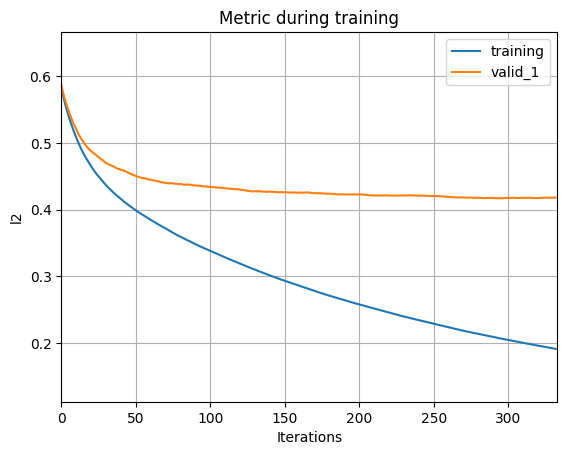

----> || Train Optimized QWK SCORE ::  0.806
----> || Val Optimized QWK SCORE ::  0.531
----> || Train Optimized Val QWK SCORE ::  0.519
----> || Val Optimized Train QWK SCORE ::  0.805
Fold 1 - Rounded Train QWK: 0.7347, Rounded Validation QWK: 0.4188


<Figure size 640x480 with 0 Axes>

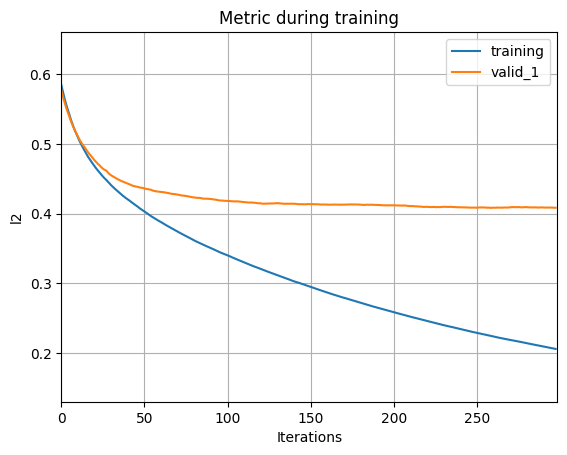

----> || Train Optimized QWK SCORE ::  0.791
----> || Val Optimized QWK SCORE ::  0.539
----> || Train Optimized Val QWK SCORE ::  0.524
----> || Val Optimized Train QWK SCORE ::  0.777
Fold 2 - Rounded Train QWK: 0.7138, Rounded Validation QWK: 0.4457


<Figure size 640x480 with 0 Axes>

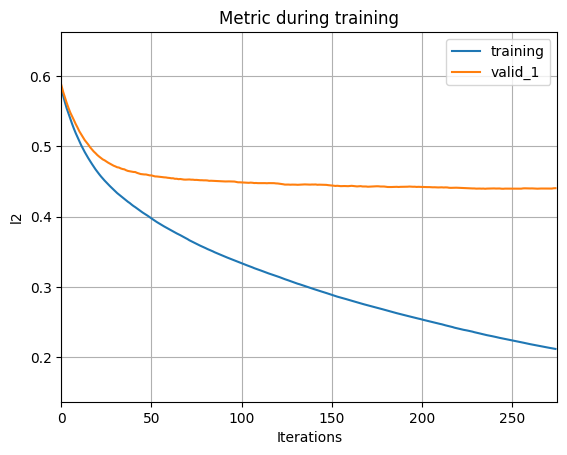

----> || Train Optimized QWK SCORE ::  0.779
----> || Val Optimized QWK SCORE ::  0.514
----> || Train Optimized Val QWK SCORE ::  0.473
----> || Val Optimized Train QWK SCORE ::  0.769
Fold 3 - Rounded Train QWK: 0.6894, Rounded Validation QWK: 0.3905


<Figure size 640x480 with 0 Axes>

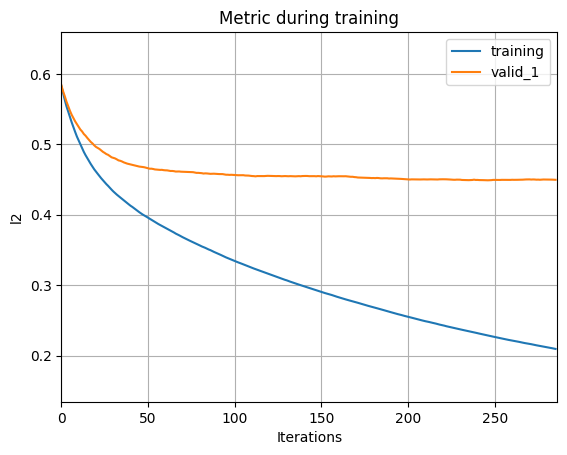

----> || Train Optimized QWK SCORE ::  0.776
----> || Val Optimized QWK SCORE ::  0.513
----> || Train Optimized Val QWK SCORE ::  0.489
----> || Val Optimized Train QWK SCORE ::  0.763
Fold 4 - Rounded Train QWK: 0.7093, Rounded Validation QWK: 0.4188


<Figure size 640x480 with 0 Axes>

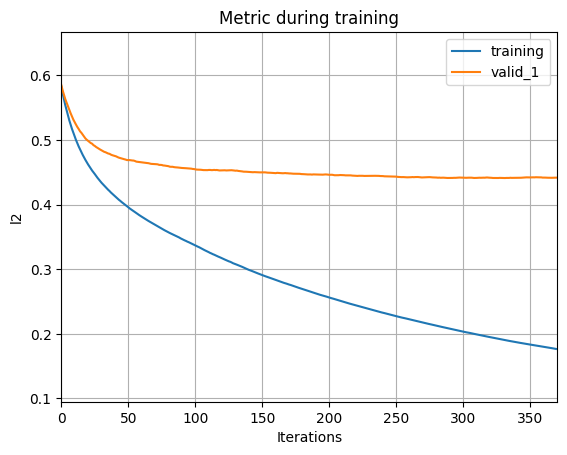

----> || Train Optimized QWK SCORE ::  0.827
----> || Val Optimized QWK SCORE ::  0.473
----> || Train Optimized Val QWK SCORE ::  0.464
----> || Val Optimized Train QWK SCORE ::  0.812
Fold 5 - Rounded Train QWK: 0.7481, Rounded Validation QWK: 0.3814
Mean Train QWK --> 0.7955
Mean Validation QWK ---> 0.5141
----> || Optimized QWK SCORE ::  0.508


In [246]:
lgb_models_list5, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds, lgb_optuna_study = lgb_feature_selection(train_selected5_df, test_selected5_df, 300)

In [247]:
lgb_optuna_study.best_params

{'learning_rate': 0.067301519957044,
 'early_stopping_round': 39,
 'max_depth': 16,
 'min_data_in_leaf': 58,
 'num_leaves': 379,
 'min_gain_to_split': 0.10097562149789198,
 'lambda_l1': 0.16008872456138779,
 'lambda_l2': 282.6958332455945}

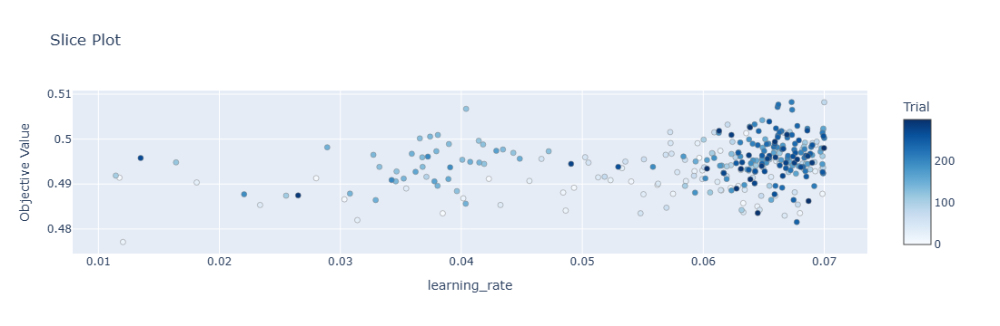

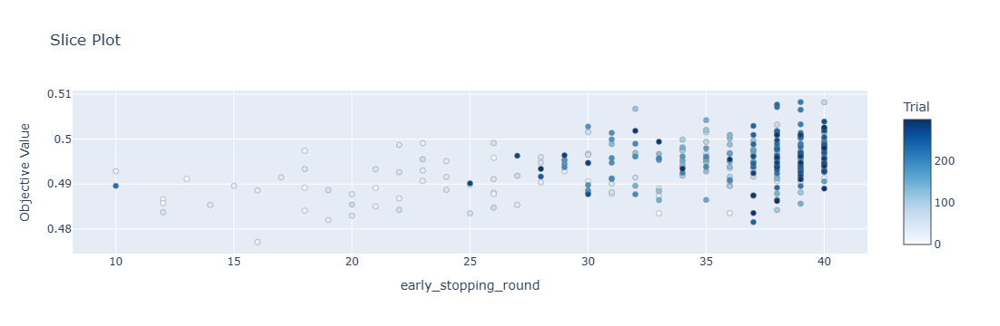

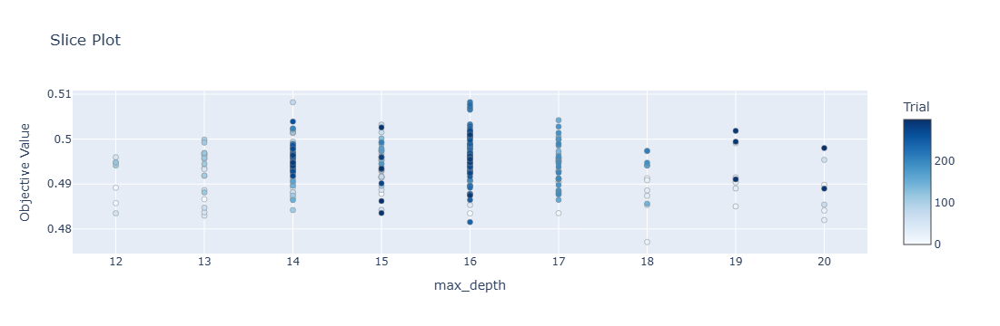

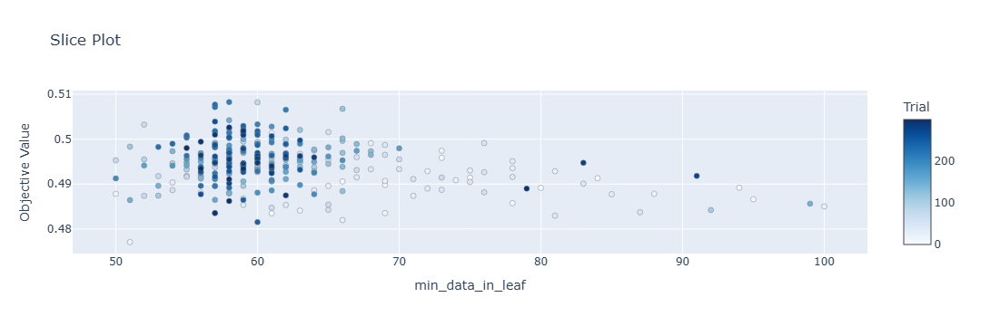

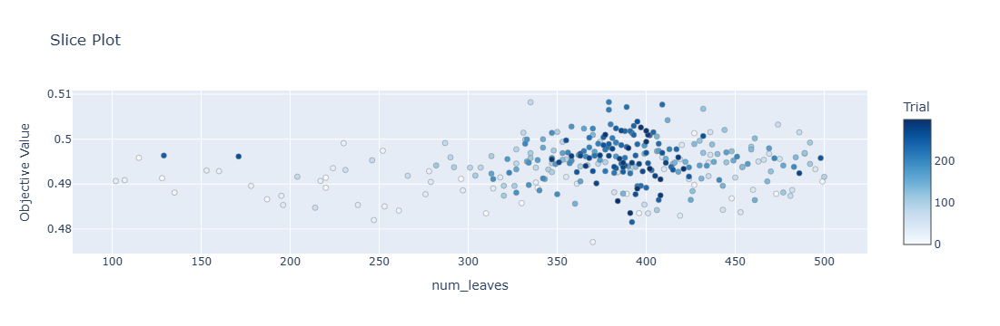

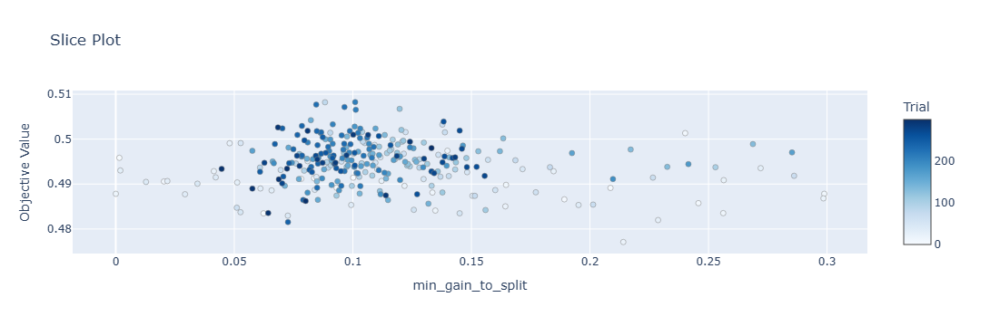

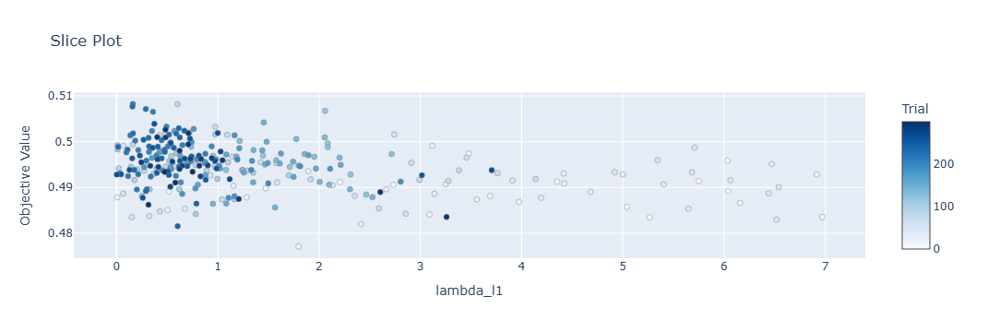

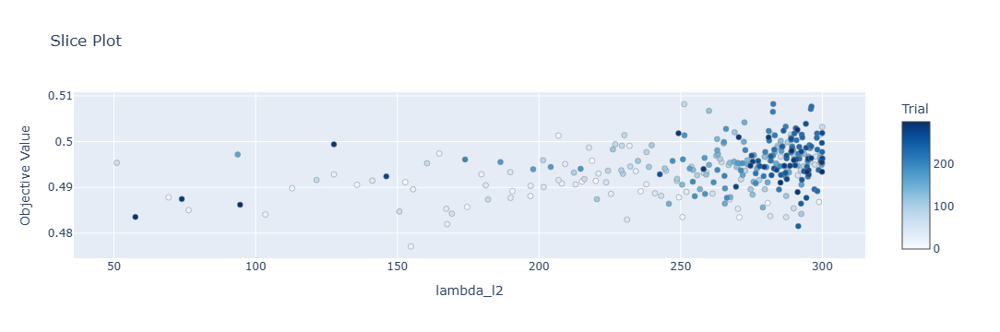

In [248]:
for param in lgb_optuna_study.best_params.keys():
    fig = plot_slice(lgb_optuna_study, params=[param])
    fig.show()

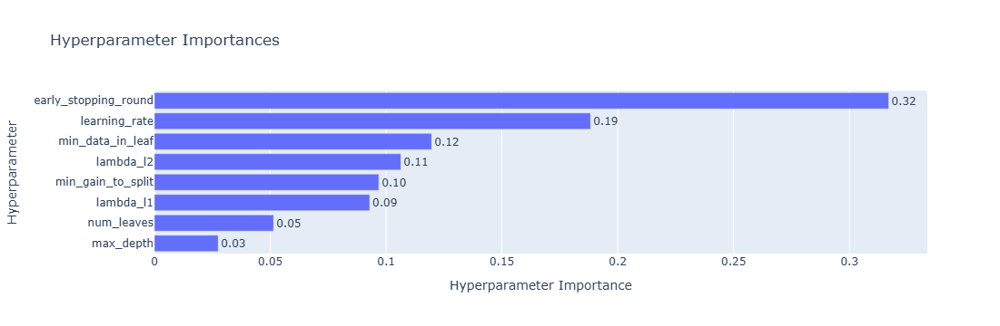

In [252]:
plot_param_importances(lgb_optuna_study)

In [253]:
cols = train_selected5_df.drop(['id', 'sii'], axis=1).columns
importance_list = []
for model in lgb_models_list5:
    importance_list.append(model.feature_importances_)

importance_mean = np.mean(importance_list, axis=0)
imp_df = pd.DataFrame(sorted(zip(cols, importance_mean)), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)
print(imp_df.shape)
imp_df

(45, 2)


,Feature,Importance
12,SDS-SDS_Total_Raw,197.4
5,Muscle_to_Fat,168.0
41,light_time_of_day_hour_window_15_3%,154.2
18,Y_time_of_day_hour_window_20_sum,147.4
8,Physical-BMI,142.4
10,Physical-Height,137.4
34,battery_use_since_wear_time_of_day_hour_window_8_mean,135.0
37,enmo_time_of_day_hour_window_1_std,133.2
40,light_time_of_day_hour_window_10_max,128.6
0,BIA-BIA_FFMI,125.8


In [254]:
unimportant_df = imp_df[imp_df['Importance'] < imp_df['Importance'].quantile(0.5)]
unimportant_cols = unimportant_df['Feature'].tolist()

In [ ]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def lgb_train(params, train_data, test_data):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
        
        lgb_callbacks = [
            lgb.log_evaluation(period=20)
        ]

        model = LGBMRegressor(
            **params
        )
        
        model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])#, callbacks=lgb_callbacks)

        plt.figure()
        lgb.plot_metric(model)
        plt.show()
        
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm

In [ ]:
lgb_params = {
    'verbosity': -1,
    'seed': SEED,
    'learning_rate': 0.01,
    'num_iterations': 3000,
    'early_stopping_round': 10,
    'max_depth': 12,
    'min_data_in_leaf': 40,
    'num_leaves': 20,
    'min_gain_to_split': 0.05,
    'feature_fraction': 0.8,
    #'bagging_fraction': 0.784,
    #'bagging_freq': 4,
    'lambda_l1': 2,
    'lambda_l2': 50,
    'device': 'gpu'
}

lgb_models_list, lgb_submission_df, lgb_raw_train_preds, lgb_raw_test_preds = lgb_train(lgb_params, train_final_df, test_final_df)

In [81]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def catboost_feature_selection(train_data, test_data, optuna_n_trials=100):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    base_params = {
        'iterations': 3000,
        'random_seed': SEED,
        'verbose': 0,
        'task_type': 'GPU',
        'use_best_model': True,
        'boosting_type': 'Plain'
    }

    def objective(trial):
        
        params_to_tune = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.03),
            'depth': trial.suggest_int('depth', 6, 9),
            'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 10, 70),
            'early_stopping_rounds': trial.suggest_int('early_stopping_rounds', 20, 40)
        }
    
        #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
        for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
            X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]
    
            model = CatBoostRegressor(
                **base_params,
                **params_to_tune
            )
            
            model.fit(X_train, y_train, eval_set=(X_val, y_val))#, plot=True)
    
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
    
            oof_non_rounded[test_idx] = y_val_pred
            y_val_pred_rounded = y_val_pred.round(0).astype(int)
            oof_rounded[test_idx] = y_val_pred_rounded
    
            train_KappaOPtimizer = minimize(evaluate_predictions,
                                      x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                      method='Nelder-Mead')
            assert train_KappaOPtimizer.success, "Train Optimization did not converge."
    
            train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
            train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)
    
            #print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")
    
            val_KappaOPtimizer = minimize(evaluate_predictions,
                                      x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                      method='Nelder-Mead')
            assert val_KappaOPtimizer.success, "Val Optimization did not converge."
    
            val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
            val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)
    
            #print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")
    
            train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
            train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)
    
            #print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")
    
            val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
            val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)
    
            #print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")
    
            rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
            rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        
    
            train_S.append(train_Kappa)
            test_S.append(val_Kappa)
            
            test_preds[:, fold] = model.predict(test_data)
            
            #print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
            #clear_output(wait=True)
    
            models_list.append(model)
    
        #print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
        #print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")
    
        KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                                  method='Nelder-Mead')
        assert KappaOPtimizer.success, "Optimization did not converge."
        
        oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
        tKappa = quadratic_weighted_kappa(y, oof_tuned)
    
        print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")
    
        tpm = test_preds.mean(axis=1)
        tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
        
        submission = pd.DataFrame({
            'id': test_data_copy['id'],
            'sii': tpTuned
        })
    
        return tKappa

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=optuna_n_trials)  # You can increase n_trials for better results

    return study

In [78]:
catboost_optuna_study = catboost_feature_selection(train_final_df, test_final_df, 5)

[I 2024-12-13 14:52:13,892] A new study created in memory with name: no-name-b61528ac-6be9-4165-9b54-5af68fc59ad4


----> || Train Optimized QWK SCORE ::  0.826
----> || Val Optimized QWK SCORE ::  0.366
----> || Train Optimized Val QWK SCORE ::  0.443
----> || Val Optimized Train QWK SCORE ::  0.733
Fold 1 - Rounded Train QWK: 0.6809, Rounded Validation QWK: 0.3456
----> || Train Optimized QWK SCORE ::  0.862
----> || Val Optimized QWK SCORE ::  0.468
----> || Train Optimized Val QWK SCORE ::  0.462
----> || Val Optimized Train QWK SCORE ::  0.849
Fold 2 - Rounded Train QWK: 0.7482, Rounded Validation QWK: 0.3858
----> || Train Optimized QWK SCORE ::  0.883
----> || Val Optimized QWK SCORE ::  0.353
----> || Train Optimized Val QWK SCORE ::  0.426
----> || Val Optimized Train QWK SCORE ::  0.782
Fold 3 - Rounded Train QWK: 0.7566, Rounded Validation QWK: 0.3351
----> || Train Optimized QWK SCORE ::  0.822
----> || Val Optimized QWK SCORE ::  0.334
----> || Train Optimized Val QWK SCORE ::  0.421
----> || Val Optimized Train QWK SCORE ::  0.688
Fold 4 - Rounded Train QWK: 0.6886, Rounded Validation 

[I 2024-12-13 15:02:35,820] Trial 0 finished with value: 0.44483923006446924 and parameters: {'learning_rate': 0.028887148976987402, 'depth': 9, 'l2_leaf_reg': 69, 'early_stopping_rounds': 24}. Best is trial 0 with value: 0.44483923006446924.


----> || Optimized QWK SCORE ::  0.445
----> || Train Optimized QWK SCORE ::  0.718
----> || Val Optimized QWK SCORE ::  0.373
----> || Train Optimized Val QWK SCORE ::  0.453
----> || Val Optimized Train QWK SCORE ::  0.610
Fold 1 - Rounded Train QWK: 0.5875, Rounded Validation QWK: 0.3408
----> || Train Optimized QWK SCORE ::  0.750
----> || Val Optimized QWK SCORE ::  0.431
----> || Train Optimized Val QWK SCORE ::  0.486
----> || Val Optimized Train QWK SCORE ::  0.652
Fold 2 - Rounded Train QWK: 0.6310, Rounded Validation QWK: 0.4136
----> || Train Optimized QWK SCORE ::  0.676
----> || Val Optimized QWK SCORE ::  0.360
----> || Train Optimized Val QWK SCORE ::  0.443
----> || Val Optimized Train QWK SCORE ::  0.546
Fold 3 - Rounded Train QWK: 0.5378, Rounded Validation QWK: 0.3478
----> || Train Optimized QWK SCORE ::  0.658
----> || Val Optimized QWK SCORE ::  0.352
----> || Train Optimized Val QWK SCORE ::  0.418
----> || Val Optimized Train QWK SCORE ::  0.537
Fold 4 - Rounded

[I 2024-12-13 15:05:12,552] Trial 1 finished with value: 0.45159362584710927 and parameters: {'learning_rate': 0.014073487064643966, 'depth': 6, 'l2_leaf_reg': 44, 'early_stopping_rounds': 35}. Best is trial 1 with value: 0.45159362584710927.


----> || Optimized QWK SCORE ::  0.452
----> || Train Optimized QWK SCORE ::  0.644
----> || Val Optimized QWK SCORE ::  0.332
----> || Train Optimized Val QWK SCORE ::  0.447
----> || Val Optimized Train QWK SCORE ::  0.490
Fold 1 - Rounded Train QWK: 0.4884, Rounded Validation QWK: 0.3294
----> || Train Optimized QWK SCORE ::  0.694
----> || Val Optimized QWK SCORE ::  0.502
----> || Train Optimized Val QWK SCORE ::  0.464
----> || Val Optimized Train QWK SCORE ::  0.685
Fold 2 - Rounded Train QWK: 0.5602, Rounded Validation QWK: 0.3988
----> || Train Optimized QWK SCORE ::  0.682
----> || Val Optimized QWK SCORE ::  0.450
----> || Train Optimized Val QWK SCORE ::  0.460
----> || Val Optimized Train QWK SCORE ::  0.670
Fold 3 - Rounded Train QWK: 0.5397, Rounded Validation QWK: 0.3483
----> || Train Optimized QWK SCORE ::  0.645
----> || Val Optimized QWK SCORE ::  0.349
----> || Train Optimized Val QWK SCORE ::  0.421
----> || Val Optimized Train QWK SCORE ::  0.509
Fold 4 - Rounded

[I 2024-12-13 15:06:27,223] Trial 2 finished with value: 0.4497627886310539 and parameters: {'learning_rate': 0.023810402064996114, 'depth': 6, 'l2_leaf_reg': 40, 'early_stopping_rounds': 25}. Best is trial 1 with value: 0.45159362584710927.


----> || Optimized QWK SCORE ::  0.450
----> || Train Optimized QWK SCORE ::  0.901
----> || Val Optimized QWK SCORE ::  0.476
----> || Train Optimized Val QWK SCORE ::  0.393
----> || Val Optimized Train QWK SCORE ::  0.790
Fold 1 - Rounded Train QWK: 0.8080, Rounded Validation QWK: 0.3627
----> || Train Optimized QWK SCORE ::  0.839
----> || Val Optimized QWK SCORE ::  0.429
----> || Train Optimized Val QWK SCORE ::  0.456
----> || Val Optimized Train QWK SCORE ::  0.705
Fold 2 - Rounded Train QWK: 0.7246, Rounded Validation QWK: 0.3898
----> || Train Optimized QWK SCORE ::  0.881
----> || Val Optimized QWK SCORE ::  0.346
----> || Train Optimized Val QWK SCORE ::  0.422
----> || Val Optimized Train QWK SCORE ::  0.755
Fold 3 - Rounded Train QWK: 0.7597, Rounded Validation QWK: 0.3427
----> || Train Optimized QWK SCORE ::  0.807
----> || Val Optimized QWK SCORE ::  0.332
----> || Train Optimized Val QWK SCORE ::  0.396
----> || Val Optimized Train QWK SCORE ::  0.635
Fold 4 - Rounded

[I 2024-12-13 15:13:22,407] Trial 3 finished with value: 0.4493101574642533 and parameters: {'learning_rate': 0.029401068089138276, 'depth': 9, 'l2_leaf_reg': 34, 'early_stopping_rounds': 38}. Best is trial 1 with value: 0.45159362584710927.


----> || Optimized QWK SCORE ::  0.449
----> || Train Optimized QWK SCORE ::  0.852
----> || Val Optimized QWK SCORE ::  0.362
----> || Train Optimized Val QWK SCORE ::  0.419
----> || Val Optimized Train QWK SCORE ::  0.736
Fold 1 - Rounded Train QWK: 0.7312, Rounded Validation QWK: 0.3574
----> || Train Optimized QWK SCORE ::  0.830
----> || Val Optimized QWK SCORE ::  0.425
----> || Train Optimized Val QWK SCORE ::  0.453
----> || Val Optimized Train QWK SCORE ::  0.702
Fold 2 - Rounded Train QWK: 0.7075, Rounded Validation QWK: 0.3993
----> || Train Optimized QWK SCORE ::  0.859
----> || Val Optimized QWK SCORE ::  0.359
----> || Train Optimized Val QWK SCORE ::  0.433
----> || Val Optimized Train QWK SCORE ::  0.742
Fold 3 - Rounded Train QWK: 0.7166, Rounded Validation QWK: 0.3465
----> || Train Optimized QWK SCORE ::  0.810
----> || Val Optimized QWK SCORE ::  0.330
----> || Train Optimized Val QWK SCORE ::  0.372
----> || Val Optimized Train QWK SCORE ::  0.685
Fold 4 - Rounded

[I 2024-12-13 15:20:57,950] Trial 4 finished with value: 0.3587367638863086 and parameters: {'learning_rate': 0.01101303857429296, 'depth': 9, 'l2_leaf_reg': 13, 'early_stopping_rounds': 20}. Best is trial 1 with value: 0.45159362584710927.


----> || Optimized QWK SCORE ::  0.359


In [ ]:
plot_optimization_history(catboost_optuna_study)

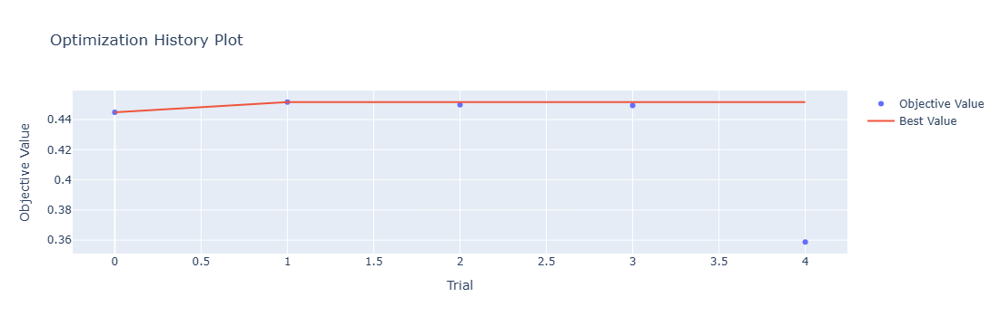

In [80]:
plot_optimization_history(catboost_optuna_study)

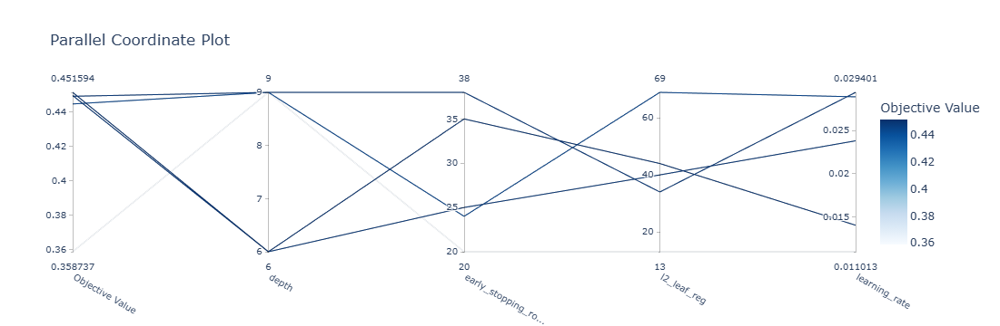

In [83]:
plot_parallel_coordinate(catboost_optuna_study)

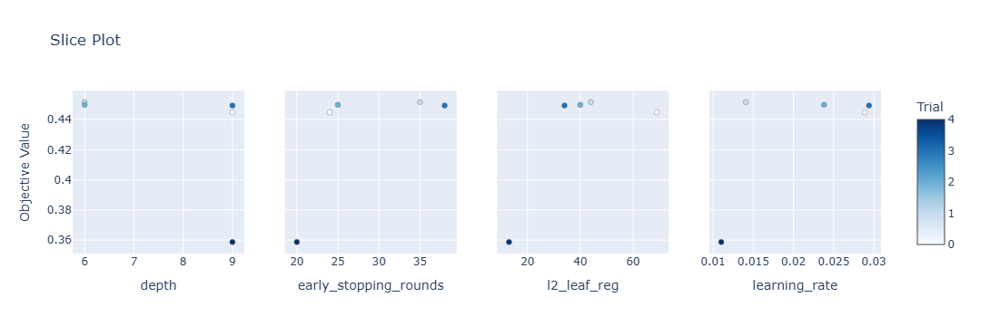

In [84]:
plot_slice(catboost_optuna_study)

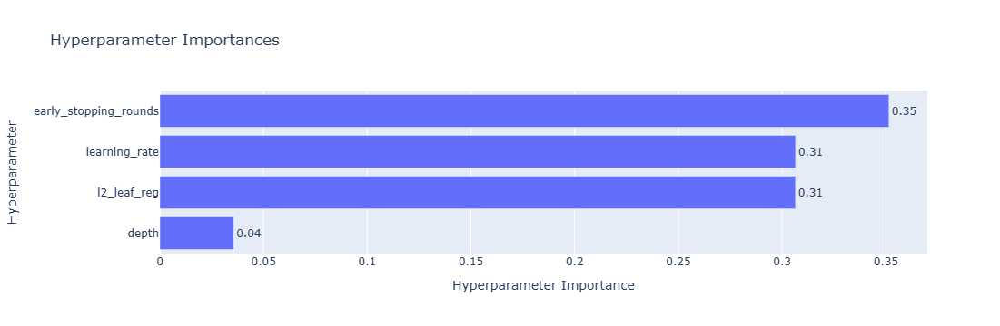

In [85]:
plot_param_importances(catboost_optuna_study)

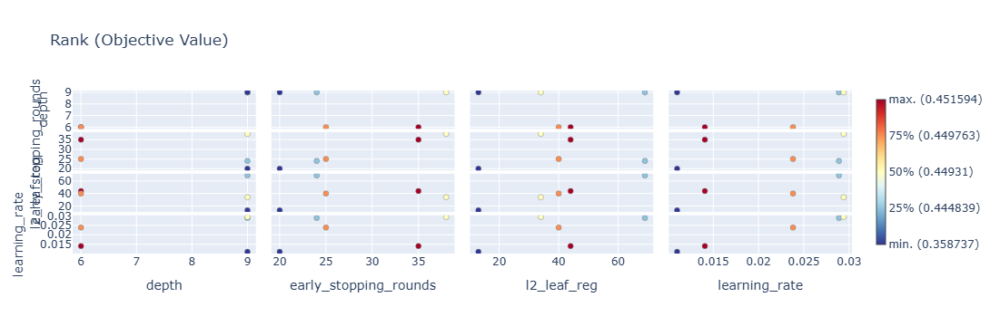

In [86]:
plot_rank(catboost_optuna_study)

In [ ]:
# https://www.kaggle.com/code/ichigoe/lb0-494-with-tabnet
# Edited by Max (Jongyun Han)
def catboost_train(train_data, test_data):
    X = train_data.drop(['id', 'sii'], axis=1)
    y = train_data['sii']

    test_data_copy = test_data.copy()
    test_data = test_data.drop('id', axis=1)

    SKF = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
    
    train_S = []
    test_S = []
    
    oof_non_rounded = np.zeros(len(y), dtype=float) 
    oof_rounded = np.zeros(len(y), dtype=int) 
    test_preds = np.zeros((len(test_data), n_splits))

    models_list = []

    catboost_params = {
        'learning_rate': 0.02,
        'depth': 9,
        'iterations': 2000,
        'random_seed': SEED,
        'verbose': 0,
        'l2_leaf_reg': 15,
        'task_type': 'GPU',
        'use_best_model': True,
        'early_stopping_rounds': 30,
        'boosting_type': 'Ordered'
    }

    #for fold, (train_idx, test_idx) in enumerate(tqdm(SKF.split(X, y), desc="Training Folds", total=n_splits)):
    for fold, (train_idx, test_idx) in enumerate(SKF.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[test_idx]

        model = CatBoostRegressor(
            **catboost_params
        )
        
        model.fit(X_train, y_train, eval_set=(X_val, y_val), plot=True)

        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        oof_non_rounded[test_idx] = y_val_pred
        y_val_pred_rounded = y_val_pred.round(0).astype(int)
        oof_rounded[test_idx] = y_val_pred_rounded

        train_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_train, y_train_pred), 
                                  method='Nelder-Mead')
        assert train_KappaOPtimizer.success, "Train Optimization did not converge."

        train_pred_tuned = threshold_Rounder(y_train_pred, train_KappaOPtimizer.x)
        train_Kappa = quadratic_weighted_kappa(y_train, train_pred_tuned)

        print(f"----> || Train Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_Kappa:.3f}{Style.RESET_ALL}")

        val_KappaOPtimizer = minimize(evaluate_predictions,
                                  x0=[0.5, 1.5, 2.5], args=(y_val, y_val_pred), 
                                  method='Nelder-Mead')
        assert val_KappaOPtimizer.success, "Val Optimization did not converge."

        val_pred_tuned = threshold_Rounder(y_val_pred, val_KappaOPtimizer.x)
        val_Kappa = quadratic_weighted_kappa(y_val, val_pred_tuned)

        print(f"----> || Val Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_Kappa:.3f}{Style.RESET_ALL}")

        train_optimized_val_pred_tuned = threshold_Rounder(y_val_pred, train_KappaOPtimizer.x)
        train_optimized_val_Kappa = quadratic_weighted_kappa(y_val, train_optimized_val_pred_tuned)

        print(f"----> || Train Optimized Val QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {train_optimized_val_Kappa:.3f}{Style.RESET_ALL}")

        val_optimized_train_pred_tuned = threshold_Rounder(y_train_pred, val_KappaOPtimizer.x)
        val_optimized_train_Kappa = quadratic_weighted_kappa(y_train, val_optimized_train_pred_tuned)

        print(f"----> || Val Optimized Train QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {val_optimized_train_Kappa:.3f}{Style.RESET_ALL}")

        rounded_train_kappa = quadratic_weighted_kappa(y_train, y_train_pred.round(0).astype(int))
        rounded_val_kappa = quadratic_weighted_kappa(y_val, y_val_pred_rounded)        

        train_S.append(train_Kappa)
        test_S.append(val_Kappa)
        
        test_preds[:, fold] = model.predict(test_data)
        
        print(f"Fold {fold+1} - Rounded Train QWK: {rounded_train_kappa:.4f}, Rounded Validation QWK: {rounded_val_kappa:.4f}")
        #clear_output(wait=True)

        models_list.append(model)

    print(f"Mean Train QWK --> {np.mean(train_S):.4f}")
    print(f"Mean Validation QWK ---> {np.mean(test_S):.4f}")

    KappaOPtimizer = minimize(evaluate_predictions,
                              x0=[0.5, 1.5, 2.5], args=(y, oof_non_rounded), 
                              method='Nelder-Mead')
    assert KappaOPtimizer.success, "Optimization did not converge."
    
    oof_tuned = threshold_Rounder(oof_non_rounded, KappaOPtimizer.x)
    tKappa = quadratic_weighted_kappa(y, oof_tuned)

    print(f"----> || Optimized QWK SCORE :: {Fore.CYAN}{Style.BRIGHT} {tKappa:.3f}{Style.RESET_ALL}")

    tpm = test_preds.mean(axis=1)
    tpTuned = threshold_Rounder(tpm, KappaOPtimizer.x)
    
    submission = pd.DataFrame({
        'id': test_data_copy['id'],
        'sii': tpTuned
    })

    return models_list, submission, oof_non_rounded, tpm

In [ ]:
cat_models_list, cat_submission_df, cat_raw_train_preds, cat_raw_test_preds = catboost_train(train_final_df, test_final_df)

In [ ]:
#submission_df.to_csv('submission.csv', index=False)